In [1]:
import json

In [2]:
def remove_trailing_zeros(image_name):
    arr = image_name.split('_')[2]
    res = ''
    for i in range(len(arr)):
        if arr[i] != '0':
            break
    
    res = arr[i:]
    return res

In [3]:
with open('dataset_coco.json', 'r') as j:
    data = json.load(j)

image_id = dict()
for img in data['images']:
    filename = img['filename']
    arr = filename.split('.')[0]
    r = remove_trailing_zeros(arr)
    image_id[r] = filename


In [4]:
with open('final_hindi_data_validation.json', 'r') as k:
    data1 = json.load(k)
    
sentences = dict()
for img in data1['annotations']:
    img_id = img['image_id']
    sentences[img_id] = img['caption']
    if str(img_id) in image_id:
        pass
    else:
        print(img_id)
        print('Not Found')
        
with open('final_hindi_data_train.json', 'r') as k1:
    data12 = json.load(k1)
    
for img in data12['annotations']:
    img_id = img['image_id']
    sentences[img_id] = img['caption']
    if str(img_id) in image_id:
        pass
    else:
        print(img_id)
        print('Not Found')



In [5]:
    
final_data = dict()
for img in data1['annotations']:
    img_id = img['image_id']
    if str(img_id) in image_id and img_id in sentences:
        final_data[image_id[str(img_id)]] = sentences[img_id]
    else:
        print("Problem")
        
for img in data12['annotations']:
    img_id = img['image_id']
    if str(img_id) in image_id and img_id in sentences:
        final_data[image_id[str(img_id)]] = sentences[img_id]
    else:
        print("Problem")


In [9]:
# # with open('dataset_coco_hindi.json', 'a') as l:
# #     data2 = json.load(l)

# split = ['restval']
# for img in data['images']:
#     filename = img['filename']
#     if filename not in final_data:
# #         print("Problem")
# #         print(filename)
#         print(img['split'])

In [109]:
# for key in image_id.items():
#     name = image_id[key[0]]
#     print(name)

In [110]:
# for key in sentences.items():
#     print(key[0])

In [8]:
!pip3 install indic-nlp-library

ERROR: Error while checking for conflicts. Please file an issue on pip's issue tracker: https://github.com/pypa/pip/issues/new
Traceback (most recent call last):
  File "/Users/richa/opt/miniconda3/envs/cs7643/lib/python3.7/site-packages/pip/_vendor/pkg_resources/__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "/Users/richa/opt/miniconda3/envs/cs7643/lib/python3.7/site-packages/pip/_vendor/pkg_resources/__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/richa/opt/miniconda3/envs/cs7643/lib/python3.7/site-packages/pip/_vendor/pkg_resources/__init__.py", line 3012, in _parsed_pkg_info
    return self._pkg_info
  File "/Users/richa/opt/miniconda3/envs/cs7643/lib/python3.7/site-packages/pip/_vendor/pkg_resources/__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
At

In [10]:
from indicnlp.tokenize import indic_tokenize


In [11]:

# final_file = open('dataset_coco_hindi.json', 'a')
    
res = dict()
res['images'] = []
for img in data['images']:
    filename = img['filename']
    if filename not in final_data:
        continue
    
#     print(type(img))
    img1 = img.copy()
    sentences = final_data[filename]
    tokens = []
    for s in sentences:
        t = indic_tokenize.trivial_tokenize(s)
#         print(t)
        t1 = dict()
        t1['tokens'] = t
        tokens.append(t1.copy())
    
    img1['sentence_hindi'] = tokens
    res['images'].append(img1)
#     final_file.write(str(res))
    
# d = str(res)
# d = d.replace("\'", "\"")
# json.dump(res, final_file)
# final_file.write(d)
# final_file.close()

In [12]:
train = 0
test = 0
val = 0

for img in res['images']:
    if img['split'] in {'train', 'restval'}:
        train +=1
    elif img['split'] in {'val'}:
        val +=1
    elif img['split'] in {'test'}:
        test+=1

In [13]:
print(train, test, val)

99832 2790 2880


In [155]:
with open('dataset_coco_hindi.json', 'r') as q:
    d = json.load(q)

# print(d)

In [156]:
for img in d['images']:
    print(img['sentence_hindi'])

[{'tokens': ['गंदगी', 'सड़क', 'पर', 'एक', 'छोटा', 'सा', 'मोपेड', 'पर', 'लाल', 'हेलमेट', 'वाले', 'एक', 'आदमी']}, {'tokens': ['मनुष्य', 'ग्रामीण', 'इलाकों', 'में', 'एक', 'गंदगी', 'सड़क', 'पर', 'मोटर', 'बाइक', 'चला', 'रहा', 'है', '।']}, {'tokens': ['एक', 'मोटरसाइकिल', 'के', 'पीछे', 'की', 'सवारी', 'वाली', 'एक', 'आदमी']}, {'tokens': ['मोटर', 'बाइक', 'पर', 'एक', 'युवा', 'व्यक्ति', 'के', 'साथ', 'एक', 'गंदगी', 'पथ', 'एक', 'सब्जी', 'क्षेत्र', 'के', 'पुल', 'के', 'साथ', 'एक', 'पुल', 'और', 'बादल', '-', 'पुष्कृत', 'पहाड़ों', 'की', 'पृष्ठभूमि', 'के', 'साथ', 'स्थित', 'है', '।']}, {'tokens': ['एक', 'लाल', 'शर्ट', 'में', 'एक', 'आदमी', 'और', 'एक', 'लाल', 'टोपी', 'एक', 'पहाड़ी', 'की', 'ओर', 'एक', 'मोटरसाइकिल', 'पर', 'है', '।']}]
[{'tokens': ['एक', 'महिला', 'ने', 'एक', 'केक', 'को', 'काटते', 'हुए', 'उसके', 'सिर', 'पर', 'जाल', 'लगाई']}, {'tokens': ['एक', 'महिला', 'एक', 'बड़े', 'श्वेत', 'पत्रक', 'केक', 'काट', 'रही', 'है']}, {'tokens': ['एक', 'महिला', 'ने', 'एक', 'बड़े', 'चादर', 'केक', 'को', 'काटकर', 'एक', 'ब

[{'tokens': ['एक', 'हिंडोझल', 'घोड़ा', 'उसके', 'माने', 'में', 'गुलाब', 'है']}, {'tokens': ['एक', 'नीले', 'दुल्हन', 'के', 'साथ', 'एक', 'सफेद', 'घोड़े', 'का', 'एक', 'चित्र']}, {'tokens': ['घोड़े', 'के', 'साथ', 'एक', 'घोड़े', 'की', 'मूर्ति']}, {'tokens': ['एक', 'सफेद', 'कांच', 'का', 'घोड़ा', 'नीला', 'सा', 'पहन', 'रहा', 'है']}, {'tokens': ['एक', 'सफेद', 'घोड़ा', 'सिर', ',', 'एक', 'मजेदार', 'दौर', 'का', 'दौर', 'जाना']}]
[{'tokens': ['एक', 'शीर्ष', 'पर', 'घोड़ों', 'के', 'साथ', 'एक', '6', 'साल', 'का', 'जन्मदिन', 'का', 'केक', '।']}, {'tokens': ['एक', 'मेज', 'पर', 'घोड़ों', 'के', 'साथ', 'एक', 'बड़ा', 'केक', '।']}, {'tokens': ['कई', 'प्लास्टिक', 'के', 'जानवर', 'के', 'आंकड़े', 'एक', 'केक', 'पर', 'हैं']}, {'tokens': ['एक', 'बड़े', 'चादर', 'वाले', 'केक', 'को', 'एक', 'हरे', 'चरागाह', 'पर', 'जानवरों', 'की', 'तरह', 'देखने', 'के', 'लिए', 'सजाया', 'गया', '।']}, {'tokens': ['एक', 'हरे', 'रंग', 'के', 'जन्मदिन', 'का', 'केक', 'पर', 'लघु', 'घोड़े', 'हैं', '।']}]
[{'tokens': ['एक', 'घोड़ा', 'जो', 'एक', 'पेड़'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[{'tokens': ['एक', 'घोड़ा', 'सड़क', 'पर', 'एक', 'कार्ट', 'को', 'बहुत', 'धीरे', 'धीरे', 'खींचता', 'है']}, {'tokens': ['एक', 'घोड़ा', 'है', 'जिस', 'पर', 'किसी', 'प्रकार', 'की', 'छोटी', 'गाड़ी', 'है']}, {'tokens': ['दो', 'घोड़े', 'एक', 'शहर', 'की', 'सड़क', 'के', 'नीचे', 'एक', 'गाड़ी', 'खींचते', 'हैं']}, {'tokens': ['सड़क', 'के', 'बीच', 'में', 'एक', 'घोड़ा', 'खींचा', 'गया', 'गाड़ी', 'है']}, {'tokens': ['एक', 'शहर', 'की', 'सड़कों', 'पर', 'एक', 'गाड़ी', 'है', 'जिसमें', 'सामने', 'वाले', 'दो', 'घोड़े', 'हैं', ',', 'और', 'सड़क', 'पर', 'दूरी', 'में', 'एक', 'मिनी', 'वैन', 'है', '।']}]
[{'tokens': ['एक', 'ज़ेबरा', 'अपने', 'सिर', 'के', 'नीचे', 'एक', 'गेट', 'के', 'आसपास', 'चलता', 'है']}, {'tokens': ['एक', 'ज़ेबरा', 'एक', 'चारागाह', 'के', 'माध्यम', 'से', 'एक', 'बाड़', 'से', 'घूम', 'रहा', 'है', '।']}, {'tokens': ['ज़ेबरा', 'अपने', 'सिर', 'के', 'नीचे', 'चलता', 'है']}, {'tokens': ['एक', 'ज़ेबरा', 'एक', 'बाड़', 'के', 'पास', 'एक', 'गंदगी', 'पथ', 'पर', 'चल', 'रहा', 'है', '।']}, {'tokens': ['एक', 'ज़ेबरा', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[{'tokens': ['शौचालय', 'के', 'लिए', 'बौछार', 'के', 'साथ', 'बाथरूम', 'और', 'पृथक', 'पानी', 'कोठरी']}, {'tokens': ['एक', 'छोटे', 'और', 'सफेद', 'अलग', 'दोहरा', 'कमरा', 'बाथरूम']}, {'tokens': ['शौचालय', ',', 'बौछार', 'और', 'सिंक', 'के', 'साथ', 'एक', 'बाथरूम', 'का', 'दृश्य', 'पूरा', 'होता', 'है', '।']}, {'tokens': ['दर्पण', ',', 'शॉवर', ',', 'सिंक', 'और', 'शौचालय', 'के', 'साथ', 'टॉयलेट', 'के', 'अंदर']}, {'tokens': ['एक', 'आधुनिक', 'शैली', 'बाथरूम', 'में', 'साफ', 'ग्लास', 'शॉवर', '।']}]
[{'tokens': ['ब्राउन', 'कमोड', 'और', 'बाथटब', 'और', 'गुलाबी', 'शावर', 'पर्दे', 'के', 'साथ', 'आवासीय', 'बाथरूम', '।']}, {'tokens': ['एक', 'टब', 'और', 'उसके', 'अंदर', 'एक', 'शौचालय', 'के', 'साथ', 'एक', 'बाथरूम']}, {'tokens': ['एक', 'बाथरूम', 'जिसमें', 'गुलाबी', 'रंग', 'पर्दे', 'हैं', 'I']}, {'tokens': ['एक', 'भूरे', 'रंग', 'के', 'शौचालय', 'और', 'भूरे', 'रंग', 'के', 'स्नान', 'टब', 'के', 'साथ', 'एक', 'बाथरूम']}, {'tokens': ['एक', 'छोटा', 'बाथरूम', 'जिसमें', 'एक', 'गुलाबी', 'शावर', 'पर्दा', 'होता', 'है']}]
[{'toke

[{'tokens': ['घोड़े', 'एक', 'घास', 'क्षेत्र', 'के', 'आसपास', 'एक', 'दूसरे', 'के', 'लिए', 'दौड़ते', 'हैं', '।']}, {'tokens': ['एक', 'क्षेत्र', 'में', 'चार', 'घोड़ों', 'का', 'समूह', 'चला', '।']}, {'tokens': ['चार', 'घोड़ों', 'को', 'एक', 'क्षेत्र', 'में', 'अलग', 'रंग', 'पोशाक', 'चलाने', 'वाले', 'पहने', 'हुए', 'हैं']}, {'tokens': ['एक', 'चारों', 'ओर', 'घूमने', 'वाले', 'चार', 'घोड़ों', 'में', 'फैले', 'हुए', 'क्षेत्र', 'में', 'खेल', 'रहे', 'हैं']}, {'tokens': ['एक', 'क्षेत्र', 'में', 'चल', 'रहे', 'कंबल', 'में', 'तैयार', 'घोड़ों', 'का', 'एक', 'समूह', '।']}]
[{'tokens': ['वहाँ', 'एक', 'एमएनए', 'है', 'कि', 'एक', 'शो', 'घोड़े', 'की', 'सवारी', 'कर', 'रहा', 'है']}, {'tokens': ['घोड़े', 'पर', 'एक', 'समान', 'घुड़सवारी', 'में', 'एक', 'आदमी']}, {'tokens': ['एक', 'व्यक्ति', 'जो', 'गंदगी', 'के', 'मैदान', 'पर', 'घोड़े', 'की', 'सवारी', 'करते', 'हैं']}, {'tokens': ['एक', 'घोड़े', 'पर', 'सवार', 'एक', 'सैन्य', 'संगठन', 'में', 'कपड़े', 'पहने', 'हुए', 'एक', 'आदमी']}, {'tokens': ['फैंसी', 'संगठन', 'में', 'एक', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[{'tokens': ['एक', 'बिस्तर', 'पर', 'एक', 'बिछाने', 'के', 'एक', 'बिल्ली', 'के', 'करीब']}, {'tokens': ['पंजे', 'के', 'साथ', 'एक', 'बिल्ली', 'बिस्तर', 'पर', 'फैली', 'हुई', 'सो', 'रही', 'है']}, {'tokens': ['एक', 'बगल', 'में', 'एक', 'चादर', 'पर', 'बिछाने', 'वाली', 'बिल्ली']}, {'tokens': ['एक', 'बिल्ली', 'एक', 'बेडरूम', 'में', 'एक', 'बुरा', 'के', 'शीर्ष', 'पर', 'सोता', 'है']}, {'tokens': ['एक', 'बिल्ली', 'जो', 'एक', 'बिस्तर', 'पर', 'नीचे', 'बिछाने', 'है']}]
[{'tokens': ['एक', 'मिरर', 'में', 'एक', 'प्रतिबिंब', 'को', 'देखते', 'हुए', 'एक', 'बिल्ली']}, {'tokens': ['एक', 'बिल्ली', 'को', 'उसके', 'पास', 'खड़े', 'कुछ', 'खिलौने', 'के', 'साथ', 'एक', 'दर्पण', 'की', 'तलाश', 'में']}, {'tokens': ['एक', 'बिल्ली', 'अपने', 'प्रतिबिंब', 'पर', 'घूर', 'रहा', 'है']}, {'tokens': ['एक', 'दर्पण', 'में', 'अपनी', 'स्वयं', 'की', 'प्रतिबिंब', 'को', 'देखते', 'हुए', 'एक', 'बिल्ली']}, {'tokens': ['एक', 'काली', 'बिल्ली', 'एक', 'दर्पण', 'में', 'दिख', 'रही', 'है']}]
[{'tokens': ['दो', 'बड़ी', 'बिल्लियों', 'खिड़की', 'दासा', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[{'tokens': ['कुछ', 'पेड़ों', 'के', 'खिलाफ', 'एक', 'छोटा', 'पीला', 'फ्रिसबी', 'पकड़े', 'हुए', 'आदमी']}, {'tokens': ['एक', 'सफेद', 'शर्ट', 'में', 'एक', 'आदमी', 'मुस्कुरा', 'रही', 'है', 'और', 'एक', 'पीला', 'फ्रिसबी', 'पकड़े', 'हुए']}, {'tokens': ['हरे', 'रंग', 'की', 'प्लास्टिक', 'की', 'डिस्क', 'वाले', 'एक', 'मुस्कुराहट']}, {'tokens': ['एक', 'आदमी', 'अपने', 'हाथों', 'में', 'एक', 'फ्रिसबी', 'पकड़े', 'हुए', 'मुस्कुराते', 'हुए']}, {'tokens': ['पीला', 'फ्रिसबी', 'वाला', 'एक', 'पार्क', 'में', 'एक', 'आदमी']}]
[{'tokens': ['एक', 'आदमी', 'एक', 'पीले', 'फ्रिसबी', 'को', 'पकड़ने', 'के', 'लिए', 'हवा', 'में', 'उछालता', 'है']}, {'tokens': ['एक', 'आदमी', 'अपने', 'पैर', 'के', 'नीचे', 'एक', 'फ्रिसबी', 'फेंक', 'रहा', 'है']}, {'tokens': ['लोग', 'पीले', 'फ्रिसबी', 'के', 'साथ', 'खेल', 'रहे', 'हैं', 'और', 'एक', 'आदमी', 'इसे', 'पकड़', 'रहा', 'है', '।']}, {'tokens': ['एक', 'व्यक्ति', 'जो', 'एक', 'क्षेत्र', 'के', 'शीर्ष', 'पर', 'एक', 'पीले', 'फ्रिसबी', 'रखता', 'है']}, {'tokens': ['एक', 'आदमी', 'एक', 'फ्रिसबी', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[{'tokens': ['कुर्सी', 'पर', 'बैठे', 'एक', 'आदमी', 'किसी', 'के', 'भोजन', 'को', 'देख', 'रहा', 'है']}, {'tokens': ['एक', 'आदमी', 'अपने', 'हाथों', 'का', 'उपयोग', 'करते', 'हुए', 'एक', 'महिला', 'को', 'देखकर', 'डेस्क', 'के', 'सामने', 'बैठता', 'है']}, {'tokens': ['एक', 'आदमी', 'एक', 'मेज', 'पर', 'बैठता', 'है', 'और', 'उसके', 'बगल', 'में', 'व्यक्ति', 'को', 'दिखता', 'है']}, {'tokens': ['एक', 'जवान', 'आदमी', 'किसी', 'को', 'कुछ', 'भोजन', 'में', 'खिसक', 'कर', 'देख', 'रहा', 'है']}, {'tokens': ['एक', 'आदमी', 'एक', 'दूसरे', 'व्यक्ति', 'के', 'हाथों', 'को', 'कुछ', 'कांटे', 'पर', 'पकड़', 'कर', 'देख', 'रहा', 'है']}]
[{'tokens': ['एक', 'रेस्तरां', 'के', 'लिए', 'चित्रित', 'लटका', 'हुआ', 'इमारत', 'का', 'चिह्न']}, {'tokens': ['दो', 'लैंप', 'के', 'पास', 'एक', 'इमारत', 'से', 'लटका', 'एक', 'संकेत']}, {'tokens': ['बाहर', 'एक', 'इमारत', 'से', 'लटका', 'एक', 'रेस्तरां', 'चिह्न']}, {'tokens': ['एक', 'संकेत', 'पढ़ता', 'है', ',', 'एक', 'इमारत', 'पर', '"', 'टॉमसिनो', 'के', 'तहखानेवाला', '"']}, {'tokens': ['Tomasino', '

In [16]:
cnt = 0
for img in res['images']:
    v = img['filepath']
    if v in ['train2014']:
#         print(img['filepath'])
        cnt += 1

NameError: name 'res' is not defined

In [43]:

print(cnt)

22917


In [44]:
import os
from os import path

final_file = open('dataset_coco_hindi_final.json', 'a')
final_res = dict()
final_res['images'] = []
for img in res['images']:
    filepath = img['filepath']
    filename = img['filename']
    
    file_path = 'val2014/' + filename
    if path.exists(file_path):
        final_res.append(img.copy())
        
json.dump(final_res, final_file)
final_file.close()

In [1]:
import json
import os
from os import path
with open('dataset_coco_hindi.json') as f:
    data = json.load(f)

In [2]:
images = data['images']  
images[0]

{'filepath': 'val2014',
 'sentids': [770337, 771687, 772707, 776154, 781998],
 'filename': 'COCO_val2014_000000391895.jpg',
 'imgid': 0,
 'split': 'test',
 'sentences': [{'tokens': ['a',
    'man',
    'with',
    'a',
    'red',
    'helmet',
    'on',
    'a',
    'small',
    'moped',
    'on',
    'a',
    'dirt',
    'road'],
   'raw': 'A man with a red helmet on a small moped on a dirt road. ',
   'imgid': 0,
   'sentid': 770337},
  {'tokens': ['man',
    'riding',
    'a',
    'motor',
    'bike',
    'on',
    'a',
    'dirt',
    'road',
    'on',
    'the',
    'countryside'],
   'raw': 'Man riding a motor bike on a dirt road on the countryside.',
   'imgid': 0,
   'sentid': 771687},
  {'tokens': ['a',
    'man',
    'riding',
    'on',
    'the',
    'back',
    'of',
    'a',
    'motorcycle'],
   'raw': 'A man riding on the back of a motorcycle.',
   'imgid': 0,
   'sentid': 772707},
  {'tokens': ['a',
    'dirt',
    'path',
    'with',
    'a',
    'young',
    'person',

In [3]:
cnt = 0
for img in images:
    v = img['filepath']
    if v in ['train2014']:
#         print(img['filepath'])
        cnt += 1
    
print(cnt)

82585


In [11]:
count_train = 0
filename = images[-1]['filename']
string = "/content/train2014/" + filename
string
len(images)


105502

In [15]:
count_train = 0
for image in images:
    filename = image['filename']
    filepath = image['filepath']
    # print(filename)
    # print(filepath)
    string = "train2014_original/" + filename
    if path.exists(string):
        if filepath == 'train2014':
            count_train += 1
            temp = "mv "+ string + " " + filepath+"/"
            os.system(temp)
            print(temp, count_train)
#     if count_train == 100:
#         break


mv train2014_original/COCO_train2014_000000246804.jpg train2014/ 1
mv train2014_original/COCO_train2014_000000062604.jpg train2014/ 2
mv train2014_original/COCO_train2014_000000388911.jpg train2014/ 3
mv train2014_original/COCO_train2014_000000412535.jpg train2014/ 4
mv train2014_original/COCO_train2014_000000062279.jpg train2014/ 5
mv train2014_original/COCO_train2014_000000496939.jpg train2014/ 6
mv train2014_original/COCO_train2014_000000066514.jpg train2014/ 7
mv train2014_original/COCO_train2014_000000093785.jpg train2014/ 8
mv train2014_original/COCO_train2014_000000486320.jpg train2014/ 9
mv train2014_original/COCO_train2014_000000217306.jpg train2014/ 10
mv train2014_original/COCO_train2014_000000287927.jpg train2014/ 11
mv train2014_original/COCO_train2014_000000269829.jpg train2014/ 12
mv train2014_original/COCO_train2014_000000353139.jpg train2014/ 13
mv train2014_original/COCO_train2014_000000574001.jpg train2014/ 14
mv train2014_original/COCO_train2014_000000096557.jpg tra

mv train2014_original/COCO_train2014_000000204572.jpg train2014/ 155
mv train2014_original/COCO_train2014_000000069242.jpg train2014/ 156
mv train2014_original/COCO_train2014_000000210679.jpg train2014/ 157
mv train2014_original/COCO_train2014_000000262623.jpg train2014/ 158
mv train2014_original/COCO_train2014_000000087135.jpg train2014/ 159
mv train2014_original/COCO_train2014_000000297510.jpg train2014/ 160
mv train2014_original/COCO_train2014_000000031604.jpg train2014/ 161
mv train2014_original/COCO_train2014_000000424982.jpg train2014/ 162
mv train2014_original/COCO_train2014_000000469556.jpg train2014/ 163
mv train2014_original/COCO_train2014_000000559024.jpg train2014/ 164
mv train2014_original/COCO_train2014_000000227490.jpg train2014/ 165
mv train2014_original/COCO_train2014_000000570618.jpg train2014/ 166
mv train2014_original/COCO_train2014_000000266623.jpg train2014/ 167
mv train2014_original/COCO_train2014_000000079354.jpg train2014/ 168
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000528960.jpg train2014/ 302
mv train2014_original/COCO_train2014_000000539265.jpg train2014/ 303
mv train2014_original/COCO_train2014_000000192866.jpg train2014/ 304
mv train2014_original/COCO_train2014_000000152701.jpg train2014/ 305
mv train2014_original/COCO_train2014_000000334032.jpg train2014/ 306
mv train2014_original/COCO_train2014_000000192576.jpg train2014/ 307
mv train2014_original/COCO_train2014_000000040283.jpg train2014/ 308
mv train2014_original/COCO_train2014_000000107571.jpg train2014/ 309
mv train2014_original/COCO_train2014_000000184135.jpg train2014/ 310
mv train2014_original/COCO_train2014_000000264241.jpg train2014/ 311
mv train2014_original/COCO_train2014_000000467809.jpg train2014/ 312
mv train2014_original/COCO_train2014_000000446732.jpg train2014/ 313
mv train2014_original/COCO_train2014_000000153960.jpg train2014/ 314
mv train2014_original/COCO_train2014_000000572243.jpg train2014/ 315
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000410845.jpg train2014/ 443
mv train2014_original/COCO_train2014_000000434884.jpg train2014/ 444
mv train2014_original/COCO_train2014_000000123514.jpg train2014/ 445
mv train2014_original/COCO_train2014_000000391439.jpg train2014/ 446
mv train2014_original/COCO_train2014_000000426880.jpg train2014/ 447
mv train2014_original/COCO_train2014_000000452500.jpg train2014/ 448
mv train2014_original/COCO_train2014_000000007028.jpg train2014/ 449
mv train2014_original/COCO_train2014_000000149280.jpg train2014/ 450
mv train2014_original/COCO_train2014_000000220697.jpg train2014/ 451
mv train2014_original/COCO_train2014_000000369546.jpg train2014/ 452
mv train2014_original/COCO_train2014_000000366554.jpg train2014/ 453
mv train2014_original/COCO_train2014_000000556065.jpg train2014/ 454
mv train2014_original/COCO_train2014_000000196663.jpg train2014/ 455
mv train2014_original/COCO_train2014_000000155263.jpg train2014/ 456
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000338989.jpg train2014/ 597
mv train2014_original/COCO_train2014_000000505625.jpg train2014/ 598
mv train2014_original/COCO_train2014_000000432144.jpg train2014/ 599
mv train2014_original/COCO_train2014_000000082858.jpg train2014/ 600
mv train2014_original/COCO_train2014_000000146249.jpg train2014/ 601
mv train2014_original/COCO_train2014_000000172420.jpg train2014/ 602
mv train2014_original/COCO_train2014_000000225562.jpg train2014/ 603
mv train2014_original/COCO_train2014_000000211955.jpg train2014/ 604
mv train2014_original/COCO_train2014_000000180002.jpg train2014/ 605
mv train2014_original/COCO_train2014_000000339603.jpg train2014/ 606
mv train2014_original/COCO_train2014_000000287084.jpg train2014/ 607
mv train2014_original/COCO_train2014_000000198240.jpg train2014/ 608
mv train2014_original/COCO_train2014_000000534925.jpg train2014/ 609
mv train2014_original/COCO_train2014_000000009658.jpg train2014/ 610
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000327726.jpg train2014/ 732
mv train2014_original/COCO_train2014_000000204225.jpg train2014/ 733
mv train2014_original/COCO_train2014_000000035248.jpg train2014/ 734
mv train2014_original/COCO_train2014_000000177858.jpg train2014/ 735
mv train2014_original/COCO_train2014_000000303519.jpg train2014/ 736
mv train2014_original/COCO_train2014_000000210080.jpg train2014/ 737
mv train2014_original/COCO_train2014_000000034223.jpg train2014/ 738
mv train2014_original/COCO_train2014_000000238500.jpg train2014/ 739
mv train2014_original/COCO_train2014_000000362399.jpg train2014/ 740
mv train2014_original/COCO_train2014_000000327810.jpg train2014/ 741
mv train2014_original/COCO_train2014_000000084015.jpg train2014/ 742
mv train2014_original/COCO_train2014_000000232919.jpg train2014/ 743
mv train2014_original/COCO_train2014_000000165100.jpg train2014/ 744
mv train2014_original/COCO_train2014_000000544169.jpg train2014/ 745
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000282523.jpg train2014/ 879
mv train2014_original/COCO_train2014_000000352208.jpg train2014/ 880
mv train2014_original/COCO_train2014_000000477115.jpg train2014/ 881
mv train2014_original/COCO_train2014_000000355628.jpg train2014/ 882
mv train2014_original/COCO_train2014_000000069564.jpg train2014/ 883
mv train2014_original/COCO_train2014_000000311099.jpg train2014/ 884
mv train2014_original/COCO_train2014_000000278698.jpg train2014/ 885
mv train2014_original/COCO_train2014_000000144371.jpg train2014/ 886
mv train2014_original/COCO_train2014_000000173695.jpg train2014/ 887
mv train2014_original/COCO_train2014_000000333518.jpg train2014/ 888
mv train2014_original/COCO_train2014_000000121101.jpg train2014/ 889
mv train2014_original/COCO_train2014_000000024076.jpg train2014/ 890
mv train2014_original/COCO_train2014_000000131487.jpg train2014/ 891
mv train2014_original/COCO_train2014_000000266885.jpg train2014/ 892
mv train2014_original/COCO_train20

mv train2014_original/COCO_train2014_000000271106.jpg train2014/ 1022
mv train2014_original/COCO_train2014_000000418818.jpg train2014/ 1023
mv train2014_original/COCO_train2014_000000405729.jpg train2014/ 1024
mv train2014_original/COCO_train2014_000000248187.jpg train2014/ 1025
mv train2014_original/COCO_train2014_000000070804.jpg train2014/ 1026
mv train2014_original/COCO_train2014_000000479467.jpg train2014/ 1027
mv train2014_original/COCO_train2014_000000513105.jpg train2014/ 1028
mv train2014_original/COCO_train2014_000000219204.jpg train2014/ 1029
mv train2014_original/COCO_train2014_000000067080.jpg train2014/ 1030
mv train2014_original/COCO_train2014_000000473793.jpg train2014/ 1031
mv train2014_original/COCO_train2014_000000321330.jpg train2014/ 1032
mv train2014_original/COCO_train2014_000000211230.jpg train2014/ 1033
mv train2014_original/COCO_train2014_000000378499.jpg train2014/ 1034
mv train2014_original/COCO_train2014_000000301191.jpg train2014/ 1035
mv train2014_origina

mv train2014_original/COCO_train2014_000000243818.jpg train2014/ 1171
mv train2014_original/COCO_train2014_000000160014.jpg train2014/ 1172
mv train2014_original/COCO_train2014_000000241851.jpg train2014/ 1173
mv train2014_original/COCO_train2014_000000289866.jpg train2014/ 1174
mv train2014_original/COCO_train2014_000000456900.jpg train2014/ 1175
mv train2014_original/COCO_train2014_000000043780.jpg train2014/ 1176
mv train2014_original/COCO_train2014_000000137420.jpg train2014/ 1177
mv train2014_original/COCO_train2014_000000418181.jpg train2014/ 1178
mv train2014_original/COCO_train2014_000000446832.jpg train2014/ 1179
mv train2014_original/COCO_train2014_000000499719.jpg train2014/ 1180
mv train2014_original/COCO_train2014_000000016414.jpg train2014/ 1181
mv train2014_original/COCO_train2014_000000363494.jpg train2014/ 1182
mv train2014_original/COCO_train2014_000000234981.jpg train2014/ 1183
mv train2014_original/COCO_train2014_000000544341.jpg train2014/ 1184
mv train2014_origina

mv train2014_original/COCO_train2014_000000112166.jpg train2014/ 1325
mv train2014_original/COCO_train2014_000000454408.jpg train2014/ 1326
mv train2014_original/COCO_train2014_000000287003.jpg train2014/ 1327
mv train2014_original/COCO_train2014_000000326311.jpg train2014/ 1328
mv train2014_original/COCO_train2014_000000550097.jpg train2014/ 1329
mv train2014_original/COCO_train2014_000000123799.jpg train2014/ 1330
mv train2014_original/COCO_train2014_000000525555.jpg train2014/ 1331
mv train2014_original/COCO_train2014_000000133113.jpg train2014/ 1332
mv train2014_original/COCO_train2014_000000510998.jpg train2014/ 1333
mv train2014_original/COCO_train2014_000000087249.jpg train2014/ 1334
mv train2014_original/COCO_train2014_000000183495.jpg train2014/ 1335
mv train2014_original/COCO_train2014_000000330426.jpg train2014/ 1336
mv train2014_original/COCO_train2014_000000311361.jpg train2014/ 1337
mv train2014_original/COCO_train2014_000000466445.jpg train2014/ 1338
mv train2014_origina

mv train2014_original/COCO_train2014_000000191962.jpg train2014/ 1477
mv train2014_original/COCO_train2014_000000264709.jpg train2014/ 1478
mv train2014_original/COCO_train2014_000000317134.jpg train2014/ 1479
mv train2014_original/COCO_train2014_000000362816.jpg train2014/ 1480
mv train2014_original/COCO_train2014_000000569567.jpg train2014/ 1481
mv train2014_original/COCO_train2014_000000073508.jpg train2014/ 1482
mv train2014_original/COCO_train2014_000000502202.jpg train2014/ 1483
mv train2014_original/COCO_train2014_000000232770.jpg train2014/ 1484
mv train2014_original/COCO_train2014_000000380918.jpg train2014/ 1485
mv train2014_original/COCO_train2014_000000258950.jpg train2014/ 1486
mv train2014_original/COCO_train2014_000000083328.jpg train2014/ 1487
mv train2014_original/COCO_train2014_000000157238.jpg train2014/ 1488
mv train2014_original/COCO_train2014_000000283545.jpg train2014/ 1489
mv train2014_original/COCO_train2014_000000364797.jpg train2014/ 1490
mv train2014_origina

mv train2014_original/COCO_train2014_000000434193.jpg train2014/ 1632
mv train2014_original/COCO_train2014_000000556374.jpg train2014/ 1633
mv train2014_original/COCO_train2014_000000036289.jpg train2014/ 1634
mv train2014_original/COCO_train2014_000000244254.jpg train2014/ 1635
mv train2014_original/COCO_train2014_000000136653.jpg train2014/ 1636
mv train2014_original/COCO_train2014_000000325236.jpg train2014/ 1637
mv train2014_original/COCO_train2014_000000115345.jpg train2014/ 1638
mv train2014_original/COCO_train2014_000000198788.jpg train2014/ 1639
mv train2014_original/COCO_train2014_000000470893.jpg train2014/ 1640
mv train2014_original/COCO_train2014_000000520501.jpg train2014/ 1641
mv train2014_original/COCO_train2014_000000548452.jpg train2014/ 1642
mv train2014_original/COCO_train2014_000000059024.jpg train2014/ 1643
mv train2014_original/COCO_train2014_000000361394.jpg train2014/ 1644
mv train2014_original/COCO_train2014_000000446539.jpg train2014/ 1645
mv train2014_origina

mv train2014_original/COCO_train2014_000000536286.jpg train2014/ 1783
mv train2014_original/COCO_train2014_000000561913.jpg train2014/ 1784
mv train2014_original/COCO_train2014_000000420054.jpg train2014/ 1785
mv train2014_original/COCO_train2014_000000337607.jpg train2014/ 1786
mv train2014_original/COCO_train2014_000000122937.jpg train2014/ 1787
mv train2014_original/COCO_train2014_000000089770.jpg train2014/ 1788
mv train2014_original/COCO_train2014_000000577592.jpg train2014/ 1789
mv train2014_original/COCO_train2014_000000534694.jpg train2014/ 1790
mv train2014_original/COCO_train2014_000000273929.jpg train2014/ 1791
mv train2014_original/COCO_train2014_000000313787.jpg train2014/ 1792
mv train2014_original/COCO_train2014_000000048163.jpg train2014/ 1793
mv train2014_original/COCO_train2014_000000041577.jpg train2014/ 1794
mv train2014_original/COCO_train2014_000000141348.jpg train2014/ 1795
mv train2014_original/COCO_train2014_000000429809.jpg train2014/ 1796
mv train2014_origina

mv train2014_original/COCO_train2014_000000431013.jpg train2014/ 1934
mv train2014_original/COCO_train2014_000000287962.jpg train2014/ 1935
mv train2014_original/COCO_train2014_000000073427.jpg train2014/ 1936
mv train2014_original/COCO_train2014_000000293165.jpg train2014/ 1937
mv train2014_original/COCO_train2014_000000125555.jpg train2014/ 1938
mv train2014_original/COCO_train2014_000000340238.jpg train2014/ 1939
mv train2014_original/COCO_train2014_000000580306.jpg train2014/ 1940
mv train2014_original/COCO_train2014_000000014748.jpg train2014/ 1941
mv train2014_original/COCO_train2014_000000453025.jpg train2014/ 1942
mv train2014_original/COCO_train2014_000000114353.jpg train2014/ 1943
mv train2014_original/COCO_train2014_000000111447.jpg train2014/ 1944
mv train2014_original/COCO_train2014_000000511506.jpg train2014/ 1945
mv train2014_original/COCO_train2014_000000460809.jpg train2014/ 1946
mv train2014_original/COCO_train2014_000000325758.jpg train2014/ 1947
mv train2014_origina

mv train2014_original/COCO_train2014_000000107438.jpg train2014/ 2086
mv train2014_original/COCO_train2014_000000517780.jpg train2014/ 2087
mv train2014_original/COCO_train2014_000000532471.jpg train2014/ 2088
mv train2014_original/COCO_train2014_000000142866.jpg train2014/ 2089
mv train2014_original/COCO_train2014_000000262415.jpg train2014/ 2090
mv train2014_original/COCO_train2014_000000144176.jpg train2014/ 2091
mv train2014_original/COCO_train2014_000000506372.jpg train2014/ 2092
mv train2014_original/COCO_train2014_000000289751.jpg train2014/ 2093
mv train2014_original/COCO_train2014_000000246423.jpg train2014/ 2094
mv train2014_original/COCO_train2014_000000555668.jpg train2014/ 2095
mv train2014_original/COCO_train2014_000000148986.jpg train2014/ 2096
mv train2014_original/COCO_train2014_000000062427.jpg train2014/ 2097
mv train2014_original/COCO_train2014_000000113402.jpg train2014/ 2098
mv train2014_original/COCO_train2014_000000442154.jpg train2014/ 2099
mv train2014_origina

mv train2014_original/COCO_train2014_000000517341.jpg train2014/ 2230
mv train2014_original/COCO_train2014_000000310108.jpg train2014/ 2231
mv train2014_original/COCO_train2014_000000405079.jpg train2014/ 2232
mv train2014_original/COCO_train2014_000000510768.jpg train2014/ 2233
mv train2014_original/COCO_train2014_000000088449.jpg train2014/ 2234
mv train2014_original/COCO_train2014_000000465248.jpg train2014/ 2235
mv train2014_original/COCO_train2014_000000355248.jpg train2014/ 2236
mv train2014_original/COCO_train2014_000000568405.jpg train2014/ 2237
mv train2014_original/COCO_train2014_000000284583.jpg train2014/ 2238
mv train2014_original/COCO_train2014_000000499730.jpg train2014/ 2239
mv train2014_original/COCO_train2014_000000533864.jpg train2014/ 2240
mv train2014_original/COCO_train2014_000000311232.jpg train2014/ 2241
mv train2014_original/COCO_train2014_000000321302.jpg train2014/ 2242
mv train2014_original/COCO_train2014_000000493767.jpg train2014/ 2243
mv train2014_origina

mv train2014_original/COCO_train2014_000000168016.jpg train2014/ 2381
mv train2014_original/COCO_train2014_000000384857.jpg train2014/ 2382
mv train2014_original/COCO_train2014_000000327575.jpg train2014/ 2383
mv train2014_original/COCO_train2014_000000306975.jpg train2014/ 2384
mv train2014_original/COCO_train2014_000000347407.jpg train2014/ 2385
mv train2014_original/COCO_train2014_000000494202.jpg train2014/ 2386
mv train2014_original/COCO_train2014_000000388341.jpg train2014/ 2387
mv train2014_original/COCO_train2014_000000010275.jpg train2014/ 2388
mv train2014_original/COCO_train2014_000000550834.jpg train2014/ 2389
mv train2014_original/COCO_train2014_000000387875.jpg train2014/ 2390
mv train2014_original/COCO_train2014_000000108274.jpg train2014/ 2391
mv train2014_original/COCO_train2014_000000422816.jpg train2014/ 2392
mv train2014_original/COCO_train2014_000000009557.jpg train2014/ 2393
mv train2014_original/COCO_train2014_000000493231.jpg train2014/ 2394
mv train2014_origina

mv train2014_original/COCO_train2014_000000352850.jpg train2014/ 2519
mv train2014_original/COCO_train2014_000000340019.jpg train2014/ 2520
mv train2014_original/COCO_train2014_000000029466.jpg train2014/ 2521
mv train2014_original/COCO_train2014_000000384325.jpg train2014/ 2522
mv train2014_original/COCO_train2014_000000490099.jpg train2014/ 2523
mv train2014_original/COCO_train2014_000000435458.jpg train2014/ 2524
mv train2014_original/COCO_train2014_000000142400.jpg train2014/ 2525
mv train2014_original/COCO_train2014_000000226758.jpg train2014/ 2526
mv train2014_original/COCO_train2014_000000528341.jpg train2014/ 2527
mv train2014_original/COCO_train2014_000000316963.jpg train2014/ 2528
mv train2014_original/COCO_train2014_000000447095.jpg train2014/ 2529
mv train2014_original/COCO_train2014_000000433217.jpg train2014/ 2530
mv train2014_original/COCO_train2014_000000189461.jpg train2014/ 2531
mv train2014_original/COCO_train2014_000000311827.jpg train2014/ 2532
mv train2014_origina

mv train2014_original/COCO_train2014_000000336735.jpg train2014/ 2656
mv train2014_original/COCO_train2014_000000581348.jpg train2014/ 2657
mv train2014_original/COCO_train2014_000000221711.jpg train2014/ 2658
mv train2014_original/COCO_train2014_000000536996.jpg train2014/ 2659
mv train2014_original/COCO_train2014_000000347256.jpg train2014/ 2660
mv train2014_original/COCO_train2014_000000468956.jpg train2014/ 2661
mv train2014_original/COCO_train2014_000000268826.jpg train2014/ 2662
mv train2014_original/COCO_train2014_000000192277.jpg train2014/ 2663
mv train2014_original/COCO_train2014_000000525815.jpg train2014/ 2664
mv train2014_original/COCO_train2014_000000187868.jpg train2014/ 2665
mv train2014_original/COCO_train2014_000000024689.jpg train2014/ 2666
mv train2014_original/COCO_train2014_000000131665.jpg train2014/ 2667
mv train2014_original/COCO_train2014_000000095247.jpg train2014/ 2668
mv train2014_original/COCO_train2014_000000063270.jpg train2014/ 2669
mv train2014_origina

mv train2014_original/COCO_train2014_000000163683.jpg train2014/ 2797
mv train2014_original/COCO_train2014_000000404139.jpg train2014/ 2798
mv train2014_original/COCO_train2014_000000490129.jpg train2014/ 2799
mv train2014_original/COCO_train2014_000000164172.jpg train2014/ 2800
mv train2014_original/COCO_train2014_000000524646.jpg train2014/ 2801
mv train2014_original/COCO_train2014_000000126814.jpg train2014/ 2802
mv train2014_original/COCO_train2014_000000176324.jpg train2014/ 2803
mv train2014_original/COCO_train2014_000000404533.jpg train2014/ 2804
mv train2014_original/COCO_train2014_000000468960.jpg train2014/ 2805
mv train2014_original/COCO_train2014_000000028402.jpg train2014/ 2806
mv train2014_original/COCO_train2014_000000062132.jpg train2014/ 2807
mv train2014_original/COCO_train2014_000000049301.jpg train2014/ 2808
mv train2014_original/COCO_train2014_000000223718.jpg train2014/ 2809
mv train2014_original/COCO_train2014_000000298295.jpg train2014/ 2810
mv train2014_origina

mv train2014_original/COCO_train2014_000000044432.jpg train2014/ 2937
mv train2014_original/COCO_train2014_000000322807.jpg train2014/ 2938
mv train2014_original/COCO_train2014_000000186997.jpg train2014/ 2939
mv train2014_original/COCO_train2014_000000445784.jpg train2014/ 2940
mv train2014_original/COCO_train2014_000000510979.jpg train2014/ 2941
mv train2014_original/COCO_train2014_000000150877.jpg train2014/ 2942
mv train2014_original/COCO_train2014_000000333796.jpg train2014/ 2943
mv train2014_original/COCO_train2014_000000145188.jpg train2014/ 2944
mv train2014_original/COCO_train2014_000000295106.jpg train2014/ 2945
mv train2014_original/COCO_train2014_000000163999.jpg train2014/ 2946
mv train2014_original/COCO_train2014_000000435716.jpg train2014/ 2947
mv train2014_original/COCO_train2014_000000104277.jpg train2014/ 2948
mv train2014_original/COCO_train2014_000000023551.jpg train2014/ 2949
mv train2014_original/COCO_train2014_000000305772.jpg train2014/ 2950
mv train2014_origina

mv train2014_original/COCO_train2014_000000403518.jpg train2014/ 3064
mv train2014_original/COCO_train2014_000000417234.jpg train2014/ 3065
mv train2014_original/COCO_train2014_000000392843.jpg train2014/ 3066
mv train2014_original/COCO_train2014_000000138782.jpg train2014/ 3067
mv train2014_original/COCO_train2014_000000235844.jpg train2014/ 3068
mv train2014_original/COCO_train2014_000000287953.jpg train2014/ 3069
mv train2014_original/COCO_train2014_000000282131.jpg train2014/ 3070
mv train2014_original/COCO_train2014_000000111889.jpg train2014/ 3071
mv train2014_original/COCO_train2014_000000226541.jpg train2014/ 3072
mv train2014_original/COCO_train2014_000000393707.jpg train2014/ 3073
mv train2014_original/COCO_train2014_000000156404.jpg train2014/ 3074
mv train2014_original/COCO_train2014_000000047757.jpg train2014/ 3075
mv train2014_original/COCO_train2014_000000515062.jpg train2014/ 3076
mv train2014_original/COCO_train2014_000000161386.jpg train2014/ 3077
mv train2014_origina

mv train2014_original/COCO_train2014_000000434262.jpg train2014/ 3203
mv train2014_original/COCO_train2014_000000272463.jpg train2014/ 3204
mv train2014_original/COCO_train2014_000000062231.jpg train2014/ 3205
mv train2014_original/COCO_train2014_000000382890.jpg train2014/ 3206
mv train2014_original/COCO_train2014_000000552886.jpg train2014/ 3207
mv train2014_original/COCO_train2014_000000431675.jpg train2014/ 3208
mv train2014_original/COCO_train2014_000000116650.jpg train2014/ 3209
mv train2014_original/COCO_train2014_000000220686.jpg train2014/ 3210
mv train2014_original/COCO_train2014_000000206256.jpg train2014/ 3211
mv train2014_original/COCO_train2014_000000271622.jpg train2014/ 3212
mv train2014_original/COCO_train2014_000000349410.jpg train2014/ 3213
mv train2014_original/COCO_train2014_000000395765.jpg train2014/ 3214
mv train2014_original/COCO_train2014_000000294005.jpg train2014/ 3215
mv train2014_original/COCO_train2014_000000463823.jpg train2014/ 3216
mv train2014_origina

mv train2014_original/COCO_train2014_000000460872.jpg train2014/ 3353
mv train2014_original/COCO_train2014_000000060599.jpg train2014/ 3354
mv train2014_original/COCO_train2014_000000373758.jpg train2014/ 3355
mv train2014_original/COCO_train2014_000000052128.jpg train2014/ 3356
mv train2014_original/COCO_train2014_000000067246.jpg train2014/ 3357
mv train2014_original/COCO_train2014_000000453366.jpg train2014/ 3358
mv train2014_original/COCO_train2014_000000149087.jpg train2014/ 3359
mv train2014_original/COCO_train2014_000000359702.jpg train2014/ 3360
mv train2014_original/COCO_train2014_000000178157.jpg train2014/ 3361
mv train2014_original/COCO_train2014_000000367491.jpg train2014/ 3362
mv train2014_original/COCO_train2014_000000152812.jpg train2014/ 3363
mv train2014_original/COCO_train2014_000000464903.jpg train2014/ 3364
mv train2014_original/COCO_train2014_000000171564.jpg train2014/ 3365
mv train2014_original/COCO_train2014_000000367788.jpg train2014/ 3366
mv train2014_origina

mv train2014_original/COCO_train2014_000000384986.jpg train2014/ 3518
mv train2014_original/COCO_train2014_000000059987.jpg train2014/ 3519
mv train2014_original/COCO_train2014_000000367873.jpg train2014/ 3520
mv train2014_original/COCO_train2014_000000226011.jpg train2014/ 3521
mv train2014_original/COCO_train2014_000000221899.jpg train2014/ 3522
mv train2014_original/COCO_train2014_000000284551.jpg train2014/ 3523
mv train2014_original/COCO_train2014_000000130706.jpg train2014/ 3524
mv train2014_original/COCO_train2014_000000515252.jpg train2014/ 3525
mv train2014_original/COCO_train2014_000000308191.jpg train2014/ 3526
mv train2014_original/COCO_train2014_000000346936.jpg train2014/ 3527
mv train2014_original/COCO_train2014_000000409410.jpg train2014/ 3528
mv train2014_original/COCO_train2014_000000265453.jpg train2014/ 3529
mv train2014_original/COCO_train2014_000000144505.jpg train2014/ 3530
mv train2014_original/COCO_train2014_000000055897.jpg train2014/ 3531
mv train2014_origina

mv train2014_original/COCO_train2014_000000565680.jpg train2014/ 3686
mv train2014_original/COCO_train2014_000000194545.jpg train2014/ 3687
mv train2014_original/COCO_train2014_000000445101.jpg train2014/ 3688
mv train2014_original/COCO_train2014_000000170846.jpg train2014/ 3689
mv train2014_original/COCO_train2014_000000123269.jpg train2014/ 3690
mv train2014_original/COCO_train2014_000000145385.jpg train2014/ 3691
mv train2014_original/COCO_train2014_000000221425.jpg train2014/ 3692
mv train2014_original/COCO_train2014_000000513221.jpg train2014/ 3693
mv train2014_original/COCO_train2014_000000263407.jpg train2014/ 3694
mv train2014_original/COCO_train2014_000000250124.jpg train2014/ 3695
mv train2014_original/COCO_train2014_000000294990.jpg train2014/ 3696
mv train2014_original/COCO_train2014_000000158391.jpg train2014/ 3697
mv train2014_original/COCO_train2014_000000385894.jpg train2014/ 3698
mv train2014_original/COCO_train2014_000000109599.jpg train2014/ 3699
mv train2014_origina

mv train2014_original/COCO_train2014_000000273866.jpg train2014/ 3853
mv train2014_original/COCO_train2014_000000474062.jpg train2014/ 3854
mv train2014_original/COCO_train2014_000000035030.jpg train2014/ 3855
mv train2014_original/COCO_train2014_000000215107.jpg train2014/ 3856
mv train2014_original/COCO_train2014_000000026029.jpg train2014/ 3857
mv train2014_original/COCO_train2014_000000020213.jpg train2014/ 3858
mv train2014_original/COCO_train2014_000000499300.jpg train2014/ 3859
mv train2014_original/COCO_train2014_000000303430.jpg train2014/ 3860
mv train2014_original/COCO_train2014_000000478195.jpg train2014/ 3861
mv train2014_original/COCO_train2014_000000196299.jpg train2014/ 3862
mv train2014_original/COCO_train2014_000000479944.jpg train2014/ 3863
mv train2014_original/COCO_train2014_000000002459.jpg train2014/ 3864
mv train2014_original/COCO_train2014_000000379313.jpg train2014/ 3865
mv train2014_original/COCO_train2014_000000329035.jpg train2014/ 3866
mv train2014_origina

mv train2014_original/COCO_train2014_000000138781.jpg train2014/ 4020
mv train2014_original/COCO_train2014_000000189794.jpg train2014/ 4021
mv train2014_original/COCO_train2014_000000322391.jpg train2014/ 4022
mv train2014_original/COCO_train2014_000000507830.jpg train2014/ 4023
mv train2014_original/COCO_train2014_000000125955.jpg train2014/ 4024
mv train2014_original/COCO_train2014_000000185079.jpg train2014/ 4025
mv train2014_original/COCO_train2014_000000484661.jpg train2014/ 4026
mv train2014_original/COCO_train2014_000000237224.jpg train2014/ 4027
mv train2014_original/COCO_train2014_000000208200.jpg train2014/ 4028
mv train2014_original/COCO_train2014_000000507789.jpg train2014/ 4029
mv train2014_original/COCO_train2014_000000579846.jpg train2014/ 4030
mv train2014_original/COCO_train2014_000000560976.jpg train2014/ 4031
mv train2014_original/COCO_train2014_000000127134.jpg train2014/ 4032
mv train2014_original/COCO_train2014_000000118227.jpg train2014/ 4033
mv train2014_origina

mv train2014_original/COCO_train2014_000000165203.jpg train2014/ 4189
mv train2014_original/COCO_train2014_000000513961.jpg train2014/ 4190
mv train2014_original/COCO_train2014_000000404065.jpg train2014/ 4191
mv train2014_original/COCO_train2014_000000559701.jpg train2014/ 4192
mv train2014_original/COCO_train2014_000000095777.jpg train2014/ 4193
mv train2014_original/COCO_train2014_000000368874.jpg train2014/ 4194
mv train2014_original/COCO_train2014_000000197576.jpg train2014/ 4195
mv train2014_original/COCO_train2014_000000434097.jpg train2014/ 4196
mv train2014_original/COCO_train2014_000000570956.jpg train2014/ 4197
mv train2014_original/COCO_train2014_000000384895.jpg train2014/ 4198
mv train2014_original/COCO_train2014_000000519506.jpg train2014/ 4199
mv train2014_original/COCO_train2014_000000007095.jpg train2014/ 4200
mv train2014_original/COCO_train2014_000000059527.jpg train2014/ 4201
mv train2014_original/COCO_train2014_000000021459.jpg train2014/ 4202
mv train2014_origina

mv train2014_original/COCO_train2014_000000573775.jpg train2014/ 4337
mv train2014_original/COCO_train2014_000000115056.jpg train2014/ 4338
mv train2014_original/COCO_train2014_000000062942.jpg train2014/ 4339
mv train2014_original/COCO_train2014_000000458390.jpg train2014/ 4340
mv train2014_original/COCO_train2014_000000257162.jpg train2014/ 4341
mv train2014_original/COCO_train2014_000000251277.jpg train2014/ 4342
mv train2014_original/COCO_train2014_000000038440.jpg train2014/ 4343
mv train2014_original/COCO_train2014_000000065245.jpg train2014/ 4344
mv train2014_original/COCO_train2014_000000336990.jpg train2014/ 4345
mv train2014_original/COCO_train2014_000000526225.jpg train2014/ 4346
mv train2014_original/COCO_train2014_000000327811.jpg train2014/ 4347
mv train2014_original/COCO_train2014_000000047617.jpg train2014/ 4348
mv train2014_original/COCO_train2014_000000337682.jpg train2014/ 4349
mv train2014_original/COCO_train2014_000000107353.jpg train2014/ 4350
mv train2014_origina

mv train2014_original/COCO_train2014_000000307999.jpg train2014/ 4499
mv train2014_original/COCO_train2014_000000513900.jpg train2014/ 4500
mv train2014_original/COCO_train2014_000000516263.jpg train2014/ 4501
mv train2014_original/COCO_train2014_000000271857.jpg train2014/ 4502
mv train2014_original/COCO_train2014_000000453428.jpg train2014/ 4503
mv train2014_original/COCO_train2014_000000011926.jpg train2014/ 4504
mv train2014_original/COCO_train2014_000000184443.jpg train2014/ 4505
mv train2014_original/COCO_train2014_000000048491.jpg train2014/ 4506
mv train2014_original/COCO_train2014_000000484136.jpg train2014/ 4507
mv train2014_original/COCO_train2014_000000231222.jpg train2014/ 4508
mv train2014_original/COCO_train2014_000000045247.jpg train2014/ 4509
mv train2014_original/COCO_train2014_000000558646.jpg train2014/ 4510
mv train2014_original/COCO_train2014_000000459826.jpg train2014/ 4511
mv train2014_original/COCO_train2014_000000236572.jpg train2014/ 4512
mv train2014_origina

mv train2014_original/COCO_train2014_000000476881.jpg train2014/ 4661
mv train2014_original/COCO_train2014_000000522054.jpg train2014/ 4662
mv train2014_original/COCO_train2014_000000051001.jpg train2014/ 4663
mv train2014_original/COCO_train2014_000000157242.jpg train2014/ 4664
mv train2014_original/COCO_train2014_000000155172.jpg train2014/ 4665
mv train2014_original/COCO_train2014_000000530475.jpg train2014/ 4666
mv train2014_original/COCO_train2014_000000240195.jpg train2014/ 4667
mv train2014_original/COCO_train2014_000000409706.jpg train2014/ 4668
mv train2014_original/COCO_train2014_000000546148.jpg train2014/ 4669
mv train2014_original/COCO_train2014_000000581204.jpg train2014/ 4670
mv train2014_original/COCO_train2014_000000475313.jpg train2014/ 4671
mv train2014_original/COCO_train2014_000000138367.jpg train2014/ 4672
mv train2014_original/COCO_train2014_000000092054.jpg train2014/ 4673
mv train2014_original/COCO_train2014_000000493822.jpg train2014/ 4674
mv train2014_origina

mv train2014_original/COCO_train2014_000000405980.jpg train2014/ 4809
mv train2014_original/COCO_train2014_000000001864.jpg train2014/ 4810
mv train2014_original/COCO_train2014_000000183236.jpg train2014/ 4811
mv train2014_original/COCO_train2014_000000064259.jpg train2014/ 4812
mv train2014_original/COCO_train2014_000000372309.jpg train2014/ 4813
mv train2014_original/COCO_train2014_000000455020.jpg train2014/ 4814
mv train2014_original/COCO_train2014_000000056007.jpg train2014/ 4815
mv train2014_original/COCO_train2014_000000054892.jpg train2014/ 4816
mv train2014_original/COCO_train2014_000000438600.jpg train2014/ 4817
mv train2014_original/COCO_train2014_000000099108.jpg train2014/ 4818
mv train2014_original/COCO_train2014_000000099580.jpg train2014/ 4819
mv train2014_original/COCO_train2014_000000180720.jpg train2014/ 4820
mv train2014_original/COCO_train2014_000000523309.jpg train2014/ 4821
mv train2014_original/COCO_train2014_000000271282.jpg train2014/ 4822
mv train2014_origina

mv train2014_original/COCO_train2014_000000016720.jpg train2014/ 4964
mv train2014_original/COCO_train2014_000000495615.jpg train2014/ 4965
mv train2014_original/COCO_train2014_000000555615.jpg train2014/ 4966
mv train2014_original/COCO_train2014_000000503464.jpg train2014/ 4967
mv train2014_original/COCO_train2014_000000459982.jpg train2014/ 4968
mv train2014_original/COCO_train2014_000000086552.jpg train2014/ 4969
mv train2014_original/COCO_train2014_000000376422.jpg train2014/ 4970
mv train2014_original/COCO_train2014_000000180285.jpg train2014/ 4971
mv train2014_original/COCO_train2014_000000051198.jpg train2014/ 4972
mv train2014_original/COCO_train2014_000000483517.jpg train2014/ 4973
mv train2014_original/COCO_train2014_000000063519.jpg train2014/ 4974
mv train2014_original/COCO_train2014_000000059821.jpg train2014/ 4975
mv train2014_original/COCO_train2014_000000549996.jpg train2014/ 4976
mv train2014_original/COCO_train2014_000000172324.jpg train2014/ 4977
mv train2014_origina

mv train2014_original/COCO_train2014_000000176849.jpg train2014/ 5094
mv train2014_original/COCO_train2014_000000196497.jpg train2014/ 5095
mv train2014_original/COCO_train2014_000000367763.jpg train2014/ 5096
mv train2014_original/COCO_train2014_000000316482.jpg train2014/ 5097
mv train2014_original/COCO_train2014_000000126719.jpg train2014/ 5098
mv train2014_original/COCO_train2014_000000127871.jpg train2014/ 5099
mv train2014_original/COCO_train2014_000000041781.jpg train2014/ 5100
mv train2014_original/COCO_train2014_000000303946.jpg train2014/ 5101
mv train2014_original/COCO_train2014_000000385037.jpg train2014/ 5102
mv train2014_original/COCO_train2014_000000351252.jpg train2014/ 5103
mv train2014_original/COCO_train2014_000000046950.jpg train2014/ 5104
mv train2014_original/COCO_train2014_000000039027.jpg train2014/ 5105
mv train2014_original/COCO_train2014_000000112651.jpg train2014/ 5106
mv train2014_original/COCO_train2014_000000266114.jpg train2014/ 5107
mv train2014_origina

mv train2014_original/COCO_train2014_000000249515.jpg train2014/ 5246
mv train2014_original/COCO_train2014_000000008027.jpg train2014/ 5247
mv train2014_original/COCO_train2014_000000305076.jpg train2014/ 5248
mv train2014_original/COCO_train2014_000000525999.jpg train2014/ 5249
mv train2014_original/COCO_train2014_000000134605.jpg train2014/ 5250
mv train2014_original/COCO_train2014_000000339589.jpg train2014/ 5251
mv train2014_original/COCO_train2014_000000034985.jpg train2014/ 5252
mv train2014_original/COCO_train2014_000000155707.jpg train2014/ 5253
mv train2014_original/COCO_train2014_000000552678.jpg train2014/ 5254
mv train2014_original/COCO_train2014_000000037104.jpg train2014/ 5255
mv train2014_original/COCO_train2014_000000249982.jpg train2014/ 5256
mv train2014_original/COCO_train2014_000000326559.jpg train2014/ 5257
mv train2014_original/COCO_train2014_000000444432.jpg train2014/ 5258
mv train2014_original/COCO_train2014_000000311062.jpg train2014/ 5259
mv train2014_origina

mv train2014_original/COCO_train2014_000000279322.jpg train2014/ 5375
mv train2014_original/COCO_train2014_000000518026.jpg train2014/ 5376
mv train2014_original/COCO_train2014_000000432212.jpg train2014/ 5377
mv train2014_original/COCO_train2014_000000494162.jpg train2014/ 5378
mv train2014_original/COCO_train2014_000000536175.jpg train2014/ 5379
mv train2014_original/COCO_train2014_000000395155.jpg train2014/ 5380
mv train2014_original/COCO_train2014_000000252811.jpg train2014/ 5381
mv train2014_original/COCO_train2014_000000327354.jpg train2014/ 5382
mv train2014_original/COCO_train2014_000000053864.jpg train2014/ 5383
mv train2014_original/COCO_train2014_000000230171.jpg train2014/ 5384
mv train2014_original/COCO_train2014_000000239552.jpg train2014/ 5385
mv train2014_original/COCO_train2014_000000491606.jpg train2014/ 5386
mv train2014_original/COCO_train2014_000000325095.jpg train2014/ 5387
mv train2014_original/COCO_train2014_000000409131.jpg train2014/ 5388
mv train2014_origina

mv train2014_original/COCO_train2014_000000138131.jpg train2014/ 5513
mv train2014_original/COCO_train2014_000000154689.jpg train2014/ 5514
mv train2014_original/COCO_train2014_000000465058.jpg train2014/ 5515
mv train2014_original/COCO_train2014_000000058873.jpg train2014/ 5516
mv train2014_original/COCO_train2014_000000041616.jpg train2014/ 5517
mv train2014_original/COCO_train2014_000000411557.jpg train2014/ 5518
mv train2014_original/COCO_train2014_000000264499.jpg train2014/ 5519
mv train2014_original/COCO_train2014_000000131696.jpg train2014/ 5520
mv train2014_original/COCO_train2014_000000377804.jpg train2014/ 5521
mv train2014_original/COCO_train2014_000000513888.jpg train2014/ 5522
mv train2014_original/COCO_train2014_000000077663.jpg train2014/ 5523
mv train2014_original/COCO_train2014_000000185328.jpg train2014/ 5524
mv train2014_original/COCO_train2014_000000076992.jpg train2014/ 5525
mv train2014_original/COCO_train2014_000000386112.jpg train2014/ 5526
mv train2014_origina

mv train2014_original/COCO_train2014_000000314778.jpg train2014/ 5677
mv train2014_original/COCO_train2014_000000543678.jpg train2014/ 5678
mv train2014_original/COCO_train2014_000000229347.jpg train2014/ 5679
mv train2014_original/COCO_train2014_000000330400.jpg train2014/ 5680
mv train2014_original/COCO_train2014_000000519795.jpg train2014/ 5681
mv train2014_original/COCO_train2014_000000299585.jpg train2014/ 5682
mv train2014_original/COCO_train2014_000000260190.jpg train2014/ 5683
mv train2014_original/COCO_train2014_000000315269.jpg train2014/ 5684
mv train2014_original/COCO_train2014_000000501094.jpg train2014/ 5685
mv train2014_original/COCO_train2014_000000453883.jpg train2014/ 5686
mv train2014_original/COCO_train2014_000000057753.jpg train2014/ 5687
mv train2014_original/COCO_train2014_000000574218.jpg train2014/ 5688
mv train2014_original/COCO_train2014_000000020540.jpg train2014/ 5689
mv train2014_original/COCO_train2014_000000411295.jpg train2014/ 5690
mv train2014_origina

mv train2014_original/COCO_train2014_000000033009.jpg train2014/ 5833
mv train2014_original/COCO_train2014_000000104053.jpg train2014/ 5834
mv train2014_original/COCO_train2014_000000540326.jpg train2014/ 5835
mv train2014_original/COCO_train2014_000000076178.jpg train2014/ 5836
mv train2014_original/COCO_train2014_000000157621.jpg train2014/ 5837
mv train2014_original/COCO_train2014_000000448409.jpg train2014/ 5838
mv train2014_original/COCO_train2014_000000559163.jpg train2014/ 5839
mv train2014_original/COCO_train2014_000000094127.jpg train2014/ 5840
mv train2014_original/COCO_train2014_000000131312.jpg train2014/ 5841
mv train2014_original/COCO_train2014_000000082287.jpg train2014/ 5842
mv train2014_original/COCO_train2014_000000555797.jpg train2014/ 5843
mv train2014_original/COCO_train2014_000000447302.jpg train2014/ 5844
mv train2014_original/COCO_train2014_000000572902.jpg train2014/ 5845
mv train2014_original/COCO_train2014_000000141346.jpg train2014/ 5846
mv train2014_origina

mv train2014_original/COCO_train2014_000000434072.jpg train2014/ 5997
mv train2014_original/COCO_train2014_000000350044.jpg train2014/ 5998
mv train2014_original/COCO_train2014_000000208976.jpg train2014/ 5999
mv train2014_original/COCO_train2014_000000011723.jpg train2014/ 6000
mv train2014_original/COCO_train2014_000000396743.jpg train2014/ 6001
mv train2014_original/COCO_train2014_000000248016.jpg train2014/ 6002
mv train2014_original/COCO_train2014_000000229010.jpg train2014/ 6003
mv train2014_original/COCO_train2014_000000456033.jpg train2014/ 6004
mv train2014_original/COCO_train2014_000000339007.jpg train2014/ 6005
mv train2014_original/COCO_train2014_000000362811.jpg train2014/ 6006
mv train2014_original/COCO_train2014_000000367188.jpg train2014/ 6007
mv train2014_original/COCO_train2014_000000274736.jpg train2014/ 6008
mv train2014_original/COCO_train2014_000000094518.jpg train2014/ 6009
mv train2014_original/COCO_train2014_000000346956.jpg train2014/ 6010
mv train2014_origina

mv train2014_original/COCO_train2014_000000182436.jpg train2014/ 6159
mv train2014_original/COCO_train2014_000000187473.jpg train2014/ 6160
mv train2014_original/COCO_train2014_000000087891.jpg train2014/ 6161
mv train2014_original/COCO_train2014_000000357508.jpg train2014/ 6162
mv train2014_original/COCO_train2014_000000262260.jpg train2014/ 6163
mv train2014_original/COCO_train2014_000000472836.jpg train2014/ 6164
mv train2014_original/COCO_train2014_000000448436.jpg train2014/ 6165
mv train2014_original/COCO_train2014_000000399358.jpg train2014/ 6166
mv train2014_original/COCO_train2014_000000223004.jpg train2014/ 6167
mv train2014_original/COCO_train2014_000000294900.jpg train2014/ 6168
mv train2014_original/COCO_train2014_000000027343.jpg train2014/ 6169
mv train2014_original/COCO_train2014_000000223577.jpg train2014/ 6170
mv train2014_original/COCO_train2014_000000224701.jpg train2014/ 6171
mv train2014_original/COCO_train2014_000000026943.jpg train2014/ 6172
mv train2014_origina

mv train2014_original/COCO_train2014_000000470933.jpg train2014/ 6325
mv train2014_original/COCO_train2014_000000503036.jpg train2014/ 6326
mv train2014_original/COCO_train2014_000000494321.jpg train2014/ 6327
mv train2014_original/COCO_train2014_000000444983.jpg train2014/ 6328
mv train2014_original/COCO_train2014_000000354644.jpg train2014/ 6329
mv train2014_original/COCO_train2014_000000213204.jpg train2014/ 6330
mv train2014_original/COCO_train2014_000000267568.jpg train2014/ 6331
mv train2014_original/COCO_train2014_000000382929.jpg train2014/ 6332
mv train2014_original/COCO_train2014_000000062864.jpg train2014/ 6333
mv train2014_original/COCO_train2014_000000158099.jpg train2014/ 6334
mv train2014_original/COCO_train2014_000000221985.jpg train2014/ 6335
mv train2014_original/COCO_train2014_000000510525.jpg train2014/ 6336
mv train2014_original/COCO_train2014_000000362604.jpg train2014/ 6337
mv train2014_original/COCO_train2014_000000007623.jpg train2014/ 6338
mv train2014_origina

mv train2014_original/COCO_train2014_000000139815.jpg train2014/ 6490
mv train2014_original/COCO_train2014_000000496065.jpg train2014/ 6491
mv train2014_original/COCO_train2014_000000397899.jpg train2014/ 6492
mv train2014_original/COCO_train2014_000000315176.jpg train2014/ 6493
mv train2014_original/COCO_train2014_000000470871.jpg train2014/ 6494
mv train2014_original/COCO_train2014_000000250868.jpg train2014/ 6495
mv train2014_original/COCO_train2014_000000019767.jpg train2014/ 6496
mv train2014_original/COCO_train2014_000000182637.jpg train2014/ 6497
mv train2014_original/COCO_train2014_000000334788.jpg train2014/ 6498
mv train2014_original/COCO_train2014_000000094890.jpg train2014/ 6499
mv train2014_original/COCO_train2014_000000552895.jpg train2014/ 6500
mv train2014_original/COCO_train2014_000000483494.jpg train2014/ 6501
mv train2014_original/COCO_train2014_000000492774.jpg train2014/ 6502
mv train2014_original/COCO_train2014_000000250849.jpg train2014/ 6503
mv train2014_origina

mv train2014_original/COCO_train2014_000000482069.jpg train2014/ 6650
mv train2014_original/COCO_train2014_000000205126.jpg train2014/ 6651
mv train2014_original/COCO_train2014_000000340170.jpg train2014/ 6652
mv train2014_original/COCO_train2014_000000029482.jpg train2014/ 6653
mv train2014_original/COCO_train2014_000000145337.jpg train2014/ 6654
mv train2014_original/COCO_train2014_000000403404.jpg train2014/ 6655
mv train2014_original/COCO_train2014_000000254585.jpg train2014/ 6656
mv train2014_original/COCO_train2014_000000034104.jpg train2014/ 6657
mv train2014_original/COCO_train2014_000000124067.jpg train2014/ 6658
mv train2014_original/COCO_train2014_000000076899.jpg train2014/ 6659
mv train2014_original/COCO_train2014_000000407869.jpg train2014/ 6660
mv train2014_original/COCO_train2014_000000265280.jpg train2014/ 6661
mv train2014_original/COCO_train2014_000000098064.jpg train2014/ 6662
mv train2014_original/COCO_train2014_000000145809.jpg train2014/ 6663
mv train2014_origina

mv train2014_original/COCO_train2014_000000274054.jpg train2014/ 6807
mv train2014_original/COCO_train2014_000000447339.jpg train2014/ 6808
mv train2014_original/COCO_train2014_000000461989.jpg train2014/ 6809
mv train2014_original/COCO_train2014_000000510671.jpg train2014/ 6810
mv train2014_original/COCO_train2014_000000087604.jpg train2014/ 6811
mv train2014_original/COCO_train2014_000000208075.jpg train2014/ 6812
mv train2014_original/COCO_train2014_000000419026.jpg train2014/ 6813
mv train2014_original/COCO_train2014_000000043893.jpg train2014/ 6814
mv train2014_original/COCO_train2014_000000102739.jpg train2014/ 6815
mv train2014_original/COCO_train2014_000000316014.jpg train2014/ 6816
mv train2014_original/COCO_train2014_000000508749.jpg train2014/ 6817
mv train2014_original/COCO_train2014_000000443820.jpg train2014/ 6818
mv train2014_original/COCO_train2014_000000221736.jpg train2014/ 6819
mv train2014_original/COCO_train2014_000000388852.jpg train2014/ 6820
mv train2014_origina

mv train2014_original/COCO_train2014_000000385519.jpg train2014/ 6944
mv train2014_original/COCO_train2014_000000297182.jpg train2014/ 6945
mv train2014_original/COCO_train2014_000000556326.jpg train2014/ 6946
mv train2014_original/COCO_train2014_000000297907.jpg train2014/ 6947
mv train2014_original/COCO_train2014_000000519404.jpg train2014/ 6948
mv train2014_original/COCO_train2014_000000332836.jpg train2014/ 6949
mv train2014_original/COCO_train2014_000000306593.jpg train2014/ 6950
mv train2014_original/COCO_train2014_000000050246.jpg train2014/ 6951
mv train2014_original/COCO_train2014_000000533004.jpg train2014/ 6952
mv train2014_original/COCO_train2014_000000576427.jpg train2014/ 6953
mv train2014_original/COCO_train2014_000000480568.jpg train2014/ 6954
mv train2014_original/COCO_train2014_000000540582.jpg train2014/ 6955
mv train2014_original/COCO_train2014_000000090261.jpg train2014/ 6956
mv train2014_original/COCO_train2014_000000207354.jpg train2014/ 6957
mv train2014_origina

mv train2014_original/COCO_train2014_000000244164.jpg train2014/ 7071
mv train2014_original/COCO_train2014_000000093015.jpg train2014/ 7072
mv train2014_original/COCO_train2014_000000312299.jpg train2014/ 7073
mv train2014_original/COCO_train2014_000000485757.jpg train2014/ 7074
mv train2014_original/COCO_train2014_000000386401.jpg train2014/ 7075
mv train2014_original/COCO_train2014_000000455090.jpg train2014/ 7076
mv train2014_original/COCO_train2014_000000038652.jpg train2014/ 7077
mv train2014_original/COCO_train2014_000000221814.jpg train2014/ 7078
mv train2014_original/COCO_train2014_000000258705.jpg train2014/ 7079
mv train2014_original/COCO_train2014_000000478227.jpg train2014/ 7080
mv train2014_original/COCO_train2014_000000265781.jpg train2014/ 7081
mv train2014_original/COCO_train2014_000000035820.jpg train2014/ 7082
mv train2014_original/COCO_train2014_000000521025.jpg train2014/ 7083
mv train2014_original/COCO_train2014_000000088192.jpg train2014/ 7084
mv train2014_origina

mv train2014_original/COCO_train2014_000000521914.jpg train2014/ 7225
mv train2014_original/COCO_train2014_000000247459.jpg train2014/ 7226
mv train2014_original/COCO_train2014_000000237643.jpg train2014/ 7227
mv train2014_original/COCO_train2014_000000023162.jpg train2014/ 7228
mv train2014_original/COCO_train2014_000000390952.jpg train2014/ 7229
mv train2014_original/COCO_train2014_000000328454.jpg train2014/ 7230
mv train2014_original/COCO_train2014_000000378977.jpg train2014/ 7231
mv train2014_original/COCO_train2014_000000142510.jpg train2014/ 7232
mv train2014_original/COCO_train2014_000000207282.jpg train2014/ 7233
mv train2014_original/COCO_train2014_000000211573.jpg train2014/ 7234
mv train2014_original/COCO_train2014_000000280442.jpg train2014/ 7235
mv train2014_original/COCO_train2014_000000535753.jpg train2014/ 7236
mv train2014_original/COCO_train2014_000000479949.jpg train2014/ 7237
mv train2014_original/COCO_train2014_000000110740.jpg train2014/ 7238
mv train2014_origina

mv train2014_original/COCO_train2014_000000458631.jpg train2014/ 7387
mv train2014_original/COCO_train2014_000000177036.jpg train2014/ 7388
mv train2014_original/COCO_train2014_000000161543.jpg train2014/ 7389
mv train2014_original/COCO_train2014_000000468132.jpg train2014/ 7390
mv train2014_original/COCO_train2014_000000305380.jpg train2014/ 7391
mv train2014_original/COCO_train2014_000000144695.jpg train2014/ 7392
mv train2014_original/COCO_train2014_000000564631.jpg train2014/ 7393
mv train2014_original/COCO_train2014_000000070033.jpg train2014/ 7394
mv train2014_original/COCO_train2014_000000107982.jpg train2014/ 7395
mv train2014_original/COCO_train2014_000000080519.jpg train2014/ 7396
mv train2014_original/COCO_train2014_000000296995.jpg train2014/ 7397
mv train2014_original/COCO_train2014_000000153154.jpg train2014/ 7398
mv train2014_original/COCO_train2014_000000550113.jpg train2014/ 7399
mv train2014_original/COCO_train2014_000000083651.jpg train2014/ 7400
mv train2014_origina

mv train2014_original/COCO_train2014_000000300111.jpg train2014/ 7524
mv train2014_original/COCO_train2014_000000140291.jpg train2014/ 7525
mv train2014_original/COCO_train2014_000000460038.jpg train2014/ 7526
mv train2014_original/COCO_train2014_000000387385.jpg train2014/ 7527
mv train2014_original/COCO_train2014_000000016575.jpg train2014/ 7528
mv train2014_original/COCO_train2014_000000438095.jpg train2014/ 7529
mv train2014_original/COCO_train2014_000000063893.jpg train2014/ 7530
mv train2014_original/COCO_train2014_000000503949.jpg train2014/ 7531
mv train2014_original/COCO_train2014_000000359984.jpg train2014/ 7532
mv train2014_original/COCO_train2014_000000296703.jpg train2014/ 7533
mv train2014_original/COCO_train2014_000000329034.jpg train2014/ 7534
mv train2014_original/COCO_train2014_000000156827.jpg train2014/ 7535
mv train2014_original/COCO_train2014_000000188062.jpg train2014/ 7536
mv train2014_original/COCO_train2014_000000245550.jpg train2014/ 7537
mv train2014_origina

mv train2014_original/COCO_train2014_000000181699.jpg train2014/ 7675
mv train2014_original/COCO_train2014_000000356071.jpg train2014/ 7676
mv train2014_original/COCO_train2014_000000522240.jpg train2014/ 7677
mv train2014_original/COCO_train2014_000000491778.jpg train2014/ 7678
mv train2014_original/COCO_train2014_000000498644.jpg train2014/ 7679
mv train2014_original/COCO_train2014_000000023218.jpg train2014/ 7680
mv train2014_original/COCO_train2014_000000383737.jpg train2014/ 7681
mv train2014_original/COCO_train2014_000000433454.jpg train2014/ 7682
mv train2014_original/COCO_train2014_000000078920.jpg train2014/ 7683
mv train2014_original/COCO_train2014_000000567578.jpg train2014/ 7684
mv train2014_original/COCO_train2014_000000186606.jpg train2014/ 7685
mv train2014_original/COCO_train2014_000000125672.jpg train2014/ 7686
mv train2014_original/COCO_train2014_000000357601.jpg train2014/ 7687
mv train2014_original/COCO_train2014_000000386856.jpg train2014/ 7688
mv train2014_origina

mv train2014_original/COCO_train2014_000000467334.jpg train2014/ 7830
mv train2014_original/COCO_train2014_000000100517.jpg train2014/ 7831
mv train2014_original/COCO_train2014_000000514567.jpg train2014/ 7832
mv train2014_original/COCO_train2014_000000447112.jpg train2014/ 7833
mv train2014_original/COCO_train2014_000000185326.jpg train2014/ 7834
mv train2014_original/COCO_train2014_000000317331.jpg train2014/ 7835
mv train2014_original/COCO_train2014_000000430148.jpg train2014/ 7836
mv train2014_original/COCO_train2014_000000267980.jpg train2014/ 7837
mv train2014_original/COCO_train2014_000000504159.jpg train2014/ 7838
mv train2014_original/COCO_train2014_000000102862.jpg train2014/ 7839
mv train2014_original/COCO_train2014_000000502862.jpg train2014/ 7840
mv train2014_original/COCO_train2014_000000573611.jpg train2014/ 7841
mv train2014_original/COCO_train2014_000000506073.jpg train2014/ 7842
mv train2014_original/COCO_train2014_000000382655.jpg train2014/ 7843
mv train2014_origina

mv train2014_original/COCO_train2014_000000170273.jpg train2014/ 7976
mv train2014_original/COCO_train2014_000000513683.jpg train2014/ 7977
mv train2014_original/COCO_train2014_000000566798.jpg train2014/ 7978
mv train2014_original/COCO_train2014_000000309285.jpg train2014/ 7979
mv train2014_original/COCO_train2014_000000239120.jpg train2014/ 7980
mv train2014_original/COCO_train2014_000000053196.jpg train2014/ 7981
mv train2014_original/COCO_train2014_000000540210.jpg train2014/ 7982
mv train2014_original/COCO_train2014_000000247068.jpg train2014/ 7983
mv train2014_original/COCO_train2014_000000188623.jpg train2014/ 7984
mv train2014_original/COCO_train2014_000000330094.jpg train2014/ 7985
mv train2014_original/COCO_train2014_000000442911.jpg train2014/ 7986
mv train2014_original/COCO_train2014_000000178928.jpg train2014/ 7987
mv train2014_original/COCO_train2014_000000098193.jpg train2014/ 7988
mv train2014_original/COCO_train2014_000000133543.jpg train2014/ 7989
mv train2014_origina

mv train2014_original/COCO_train2014_000000291889.jpg train2014/ 8137
mv train2014_original/COCO_train2014_000000415288.jpg train2014/ 8138
mv train2014_original/COCO_train2014_000000259417.jpg train2014/ 8139
mv train2014_original/COCO_train2014_000000494007.jpg train2014/ 8140
mv train2014_original/COCO_train2014_000000182258.jpg train2014/ 8141
mv train2014_original/COCO_train2014_000000111432.jpg train2014/ 8142
mv train2014_original/COCO_train2014_000000142896.jpg train2014/ 8143
mv train2014_original/COCO_train2014_000000339844.jpg train2014/ 8144
mv train2014_original/COCO_train2014_000000522952.jpg train2014/ 8145
mv train2014_original/COCO_train2014_000000106269.jpg train2014/ 8146
mv train2014_original/COCO_train2014_000000012145.jpg train2014/ 8147
mv train2014_original/COCO_train2014_000000408144.jpg train2014/ 8148
mv train2014_original/COCO_train2014_000000534502.jpg train2014/ 8149
mv train2014_original/COCO_train2014_000000086652.jpg train2014/ 8150
mv train2014_origina

mv train2014_original/COCO_train2014_000000098210.jpg train2014/ 8302
mv train2014_original/COCO_train2014_000000495542.jpg train2014/ 8303
mv train2014_original/COCO_train2014_000000548532.jpg train2014/ 8304
mv train2014_original/COCO_train2014_000000063320.jpg train2014/ 8305
mv train2014_original/COCO_train2014_000000320112.jpg train2014/ 8306
mv train2014_original/COCO_train2014_000000213780.jpg train2014/ 8307
mv train2014_original/COCO_train2014_000000281721.jpg train2014/ 8308
mv train2014_original/COCO_train2014_000000565286.jpg train2014/ 8309
mv train2014_original/COCO_train2014_000000376263.jpg train2014/ 8310
mv train2014_original/COCO_train2014_000000060034.jpg train2014/ 8311
mv train2014_original/COCO_train2014_000000522191.jpg train2014/ 8312
mv train2014_original/COCO_train2014_000000066126.jpg train2014/ 8313
mv train2014_original/COCO_train2014_000000211410.jpg train2014/ 8314
mv train2014_original/COCO_train2014_000000558567.jpg train2014/ 8315
mv train2014_origina

mv train2014_original/COCO_train2014_000000354734.jpg train2014/ 8469
mv train2014_original/COCO_train2014_000000395555.jpg train2014/ 8470
mv train2014_original/COCO_train2014_000000087518.jpg train2014/ 8471
mv train2014_original/COCO_train2014_000000220089.jpg train2014/ 8472
mv train2014_original/COCO_train2014_000000409568.jpg train2014/ 8473
mv train2014_original/COCO_train2014_000000429540.jpg train2014/ 8474
mv train2014_original/COCO_train2014_000000508678.jpg train2014/ 8475
mv train2014_original/COCO_train2014_000000069461.jpg train2014/ 8476
mv train2014_original/COCO_train2014_000000445859.jpg train2014/ 8477
mv train2014_original/COCO_train2014_000000388500.jpg train2014/ 8478
mv train2014_original/COCO_train2014_000000172434.jpg train2014/ 8479
mv train2014_original/COCO_train2014_000000075883.jpg train2014/ 8480
mv train2014_original/COCO_train2014_000000573761.jpg train2014/ 8481
mv train2014_original/COCO_train2014_000000318857.jpg train2014/ 8482
mv train2014_origina

mv train2014_original/COCO_train2014_000000497532.jpg train2014/ 8632
mv train2014_original/COCO_train2014_000000542160.jpg train2014/ 8633
mv train2014_original/COCO_train2014_000000398957.jpg train2014/ 8634
mv train2014_original/COCO_train2014_000000127268.jpg train2014/ 8635
mv train2014_original/COCO_train2014_000000013045.jpg train2014/ 8636
mv train2014_original/COCO_train2014_000000249073.jpg train2014/ 8637
mv train2014_original/COCO_train2014_000000144951.jpg train2014/ 8638
mv train2014_original/COCO_train2014_000000482596.jpg train2014/ 8639
mv train2014_original/COCO_train2014_000000049591.jpg train2014/ 8640
mv train2014_original/COCO_train2014_000000049141.jpg train2014/ 8641
mv train2014_original/COCO_train2014_000000128334.jpg train2014/ 8642
mv train2014_original/COCO_train2014_000000303735.jpg train2014/ 8643
mv train2014_original/COCO_train2014_000000541131.jpg train2014/ 8644
mv train2014_original/COCO_train2014_000000465941.jpg train2014/ 8645
mv train2014_origina

mv train2014_original/COCO_train2014_000000352565.jpg train2014/ 8794
mv train2014_original/COCO_train2014_000000079901.jpg train2014/ 8795
mv train2014_original/COCO_train2014_000000354532.jpg train2014/ 8796
mv train2014_original/COCO_train2014_000000327576.jpg train2014/ 8797
mv train2014_original/COCO_train2014_000000525443.jpg train2014/ 8798
mv train2014_original/COCO_train2014_000000277375.jpg train2014/ 8799
mv train2014_original/COCO_train2014_000000249875.jpg train2014/ 8800
mv train2014_original/COCO_train2014_000000405312.jpg train2014/ 8801
mv train2014_original/COCO_train2014_000000382527.jpg train2014/ 8802
mv train2014_original/COCO_train2014_000000263281.jpg train2014/ 8803
mv train2014_original/COCO_train2014_000000273436.jpg train2014/ 8804
mv train2014_original/COCO_train2014_000000023544.jpg train2014/ 8805
mv train2014_original/COCO_train2014_000000535126.jpg train2014/ 8806
mv train2014_original/COCO_train2014_000000186500.jpg train2014/ 8807
mv train2014_origina

mv train2014_original/COCO_train2014_000000201236.jpg train2014/ 8957
mv train2014_original/COCO_train2014_000000134639.jpg train2014/ 8958
mv train2014_original/COCO_train2014_000000019374.jpg train2014/ 8959
mv train2014_original/COCO_train2014_000000081099.jpg train2014/ 8960
mv train2014_original/COCO_train2014_000000275170.jpg train2014/ 8961
mv train2014_original/COCO_train2014_000000495266.jpg train2014/ 8962
mv train2014_original/COCO_train2014_000000383786.jpg train2014/ 8963
mv train2014_original/COCO_train2014_000000444409.jpg train2014/ 8964
mv train2014_original/COCO_train2014_000000320609.jpg train2014/ 8965
mv train2014_original/COCO_train2014_000000555683.jpg train2014/ 8966
mv train2014_original/COCO_train2014_000000568707.jpg train2014/ 8967
mv train2014_original/COCO_train2014_000000346386.jpg train2014/ 8968
mv train2014_original/COCO_train2014_000000410711.jpg train2014/ 8969
mv train2014_original/COCO_train2014_000000508577.jpg train2014/ 8970
mv train2014_origina

mv train2014_original/COCO_train2014_000000230843.jpg train2014/ 9123
mv train2014_original/COCO_train2014_000000558148.jpg train2014/ 9124
mv train2014_original/COCO_train2014_000000167346.jpg train2014/ 9125
mv train2014_original/COCO_train2014_000000074082.jpg train2014/ 9126
mv train2014_original/COCO_train2014_000000118027.jpg train2014/ 9127
mv train2014_original/COCO_train2014_000000212181.jpg train2014/ 9128
mv train2014_original/COCO_train2014_000000179618.jpg train2014/ 9129
mv train2014_original/COCO_train2014_000000087513.jpg train2014/ 9130
mv train2014_original/COCO_train2014_000000523487.jpg train2014/ 9131
mv train2014_original/COCO_train2014_000000059116.jpg train2014/ 9132
mv train2014_original/COCO_train2014_000000451706.jpg train2014/ 9133
mv train2014_original/COCO_train2014_000000236843.jpg train2014/ 9134
mv train2014_original/COCO_train2014_000000020583.jpg train2014/ 9135
mv train2014_original/COCO_train2014_000000154811.jpg train2014/ 9136
mv train2014_origina

mv train2014_original/COCO_train2014_000000345973.jpg train2014/ 9289
mv train2014_original/COCO_train2014_000000469435.jpg train2014/ 9290
mv train2014_original/COCO_train2014_000000302656.jpg train2014/ 9291
mv train2014_original/COCO_train2014_000000400298.jpg train2014/ 9292
mv train2014_original/COCO_train2014_000000237085.jpg train2014/ 9293
mv train2014_original/COCO_train2014_000000129917.jpg train2014/ 9294
mv train2014_original/COCO_train2014_000000166126.jpg train2014/ 9295
mv train2014_original/COCO_train2014_000000080582.jpg train2014/ 9296
mv train2014_original/COCO_train2014_000000557119.jpg train2014/ 9297
mv train2014_original/COCO_train2014_000000346668.jpg train2014/ 9298
mv train2014_original/COCO_train2014_000000257323.jpg train2014/ 9299
mv train2014_original/COCO_train2014_000000322023.jpg train2014/ 9300
mv train2014_original/COCO_train2014_000000092715.jpg train2014/ 9301
mv train2014_original/COCO_train2014_000000239873.jpg train2014/ 9302
mv train2014_origina

mv train2014_original/COCO_train2014_000000123751.jpg train2014/ 9457
mv train2014_original/COCO_train2014_000000577582.jpg train2014/ 9458
mv train2014_original/COCO_train2014_000000192655.jpg train2014/ 9459
mv train2014_original/COCO_train2014_000000176551.jpg train2014/ 9460
mv train2014_original/COCO_train2014_000000221515.jpg train2014/ 9461
mv train2014_original/COCO_train2014_000000060903.jpg train2014/ 9462
mv train2014_original/COCO_train2014_000000174427.jpg train2014/ 9463
mv train2014_original/COCO_train2014_000000089012.jpg train2014/ 9464
mv train2014_original/COCO_train2014_000000113495.jpg train2014/ 9465
mv train2014_original/COCO_train2014_000000336672.jpg train2014/ 9466
mv train2014_original/COCO_train2014_000000451588.jpg train2014/ 9467
mv train2014_original/COCO_train2014_000000401877.jpg train2014/ 9468
mv train2014_original/COCO_train2014_000000140850.jpg train2014/ 9469
mv train2014_original/COCO_train2014_000000519867.jpg train2014/ 9470
mv train2014_origina

mv train2014_original/COCO_train2014_000000336563.jpg train2014/ 9625
mv train2014_original/COCO_train2014_000000023998.jpg train2014/ 9626
mv train2014_original/COCO_train2014_000000015759.jpg train2014/ 9627
mv train2014_original/COCO_train2014_000000489066.jpg train2014/ 9628
mv train2014_original/COCO_train2014_000000105582.jpg train2014/ 9629
mv train2014_original/COCO_train2014_000000062442.jpg train2014/ 9630
mv train2014_original/COCO_train2014_000000464329.jpg train2014/ 9631
mv train2014_original/COCO_train2014_000000452471.jpg train2014/ 9632
mv train2014_original/COCO_train2014_000000513917.jpg train2014/ 9633
mv train2014_original/COCO_train2014_000000121365.jpg train2014/ 9634
mv train2014_original/COCO_train2014_000000501212.jpg train2014/ 9635
mv train2014_original/COCO_train2014_000000474190.jpg train2014/ 9636
mv train2014_original/COCO_train2014_000000508954.jpg train2014/ 9637
mv train2014_original/COCO_train2014_000000051704.jpg train2014/ 9638
mv train2014_origina

mv train2014_original/COCO_train2014_000000339001.jpg train2014/ 9795
mv train2014_original/COCO_train2014_000000309137.jpg train2014/ 9796
mv train2014_original/COCO_train2014_000000109232.jpg train2014/ 9797
mv train2014_original/COCO_train2014_000000241289.jpg train2014/ 9798
mv train2014_original/COCO_train2014_000000368103.jpg train2014/ 9799
mv train2014_original/COCO_train2014_000000279058.jpg train2014/ 9800
mv train2014_original/COCO_train2014_000000412200.jpg train2014/ 9801
mv train2014_original/COCO_train2014_000000354579.jpg train2014/ 9802
mv train2014_original/COCO_train2014_000000287900.jpg train2014/ 9803
mv train2014_original/COCO_train2014_000000073688.jpg train2014/ 9804
mv train2014_original/COCO_train2014_000000433854.jpg train2014/ 9805
mv train2014_original/COCO_train2014_000000067331.jpg train2014/ 9806
mv train2014_original/COCO_train2014_000000372029.jpg train2014/ 9807
mv train2014_original/COCO_train2014_000000492440.jpg train2014/ 9808
mv train2014_origina

mv train2014_original/COCO_train2014_000000375996.jpg train2014/ 9919
mv train2014_original/COCO_train2014_000000287849.jpg train2014/ 9920
mv train2014_original/COCO_train2014_000000107903.jpg train2014/ 9921
mv train2014_original/COCO_train2014_000000039089.jpg train2014/ 9922
mv train2014_original/COCO_train2014_000000233463.jpg train2014/ 9923
mv train2014_original/COCO_train2014_000000378544.jpg train2014/ 9924
mv train2014_original/COCO_train2014_000000378092.jpg train2014/ 9925
mv train2014_original/COCO_train2014_000000367280.jpg train2014/ 9926
mv train2014_original/COCO_train2014_000000027424.jpg train2014/ 9927
mv train2014_original/COCO_train2014_000000322362.jpg train2014/ 9928
mv train2014_original/COCO_train2014_000000464490.jpg train2014/ 9929
mv train2014_original/COCO_train2014_000000495233.jpg train2014/ 9930
mv train2014_original/COCO_train2014_000000329587.jpg train2014/ 9931
mv train2014_original/COCO_train2014_000000053339.jpg train2014/ 9932
mv train2014_origina

mv train2014_original/COCO_train2014_000000024175.jpg train2014/ 10085
mv train2014_original/COCO_train2014_000000386377.jpg train2014/ 10086
mv train2014_original/COCO_train2014_000000168873.jpg train2014/ 10087
mv train2014_original/COCO_train2014_000000189127.jpg train2014/ 10088
mv train2014_original/COCO_train2014_000000411178.jpg train2014/ 10089
mv train2014_original/COCO_train2014_000000467394.jpg train2014/ 10090
mv train2014_original/COCO_train2014_000000033866.jpg train2014/ 10091
mv train2014_original/COCO_train2014_000000538149.jpg train2014/ 10092
mv train2014_original/COCO_train2014_000000351473.jpg train2014/ 10093
mv train2014_original/COCO_train2014_000000512156.jpg train2014/ 10094
mv train2014_original/COCO_train2014_000000487182.jpg train2014/ 10095
mv train2014_original/COCO_train2014_000000111455.jpg train2014/ 10096
mv train2014_original/COCO_train2014_000000185234.jpg train2014/ 10097
mv train2014_original/COCO_train2014_000000183653.jpg train2014/ 10098
mv tra

mv train2014_original/COCO_train2014_000000192885.jpg train2014/ 10212
mv train2014_original/COCO_train2014_000000429613.jpg train2014/ 10213
mv train2014_original/COCO_train2014_000000146959.jpg train2014/ 10214
mv train2014_original/COCO_train2014_000000273337.jpg train2014/ 10215
mv train2014_original/COCO_train2014_000000552318.jpg train2014/ 10216
mv train2014_original/COCO_train2014_000000077854.jpg train2014/ 10217
mv train2014_original/COCO_train2014_000000524983.jpg train2014/ 10218
mv train2014_original/COCO_train2014_000000395495.jpg train2014/ 10219
mv train2014_original/COCO_train2014_000000358017.jpg train2014/ 10220
mv train2014_original/COCO_train2014_000000360919.jpg train2014/ 10221
mv train2014_original/COCO_train2014_000000342107.jpg train2014/ 10222
mv train2014_original/COCO_train2014_000000441361.jpg train2014/ 10223
mv train2014_original/COCO_train2014_000000026356.jpg train2014/ 10224
mv train2014_original/COCO_train2014_000000091544.jpg train2014/ 10225
mv tra

mv train2014_original/COCO_train2014_000000288025.jpg train2014/ 10380
mv train2014_original/COCO_train2014_000000356565.jpg train2014/ 10381
mv train2014_original/COCO_train2014_000000379477.jpg train2014/ 10382
mv train2014_original/COCO_train2014_000000564043.jpg train2014/ 10383
mv train2014_original/COCO_train2014_000000125184.jpg train2014/ 10384
mv train2014_original/COCO_train2014_000000429207.jpg train2014/ 10385
mv train2014_original/COCO_train2014_000000381122.jpg train2014/ 10386
mv train2014_original/COCO_train2014_000000155083.jpg train2014/ 10387
mv train2014_original/COCO_train2014_000000119562.jpg train2014/ 10388
mv train2014_original/COCO_train2014_000000421613.jpg train2014/ 10389
mv train2014_original/COCO_train2014_000000431115.jpg train2014/ 10390
mv train2014_original/COCO_train2014_000000057308.jpg train2014/ 10391
mv train2014_original/COCO_train2014_000000114500.jpg train2014/ 10392
mv train2014_original/COCO_train2014_000000318089.jpg train2014/ 10393
mv tra

mv train2014_original/COCO_train2014_000000101772.jpg train2014/ 10548
mv train2014_original/COCO_train2014_000000291586.jpg train2014/ 10549
mv train2014_original/COCO_train2014_000000063873.jpg train2014/ 10550
mv train2014_original/COCO_train2014_000000429131.jpg train2014/ 10551
mv train2014_original/COCO_train2014_000000150211.jpg train2014/ 10552
mv train2014_original/COCO_train2014_000000091487.jpg train2014/ 10553
mv train2014_original/COCO_train2014_000000243017.jpg train2014/ 10554
mv train2014_original/COCO_train2014_000000179088.jpg train2014/ 10555
mv train2014_original/COCO_train2014_000000210816.jpg train2014/ 10556
mv train2014_original/COCO_train2014_000000248391.jpg train2014/ 10557
mv train2014_original/COCO_train2014_000000148047.jpg train2014/ 10558
mv train2014_original/COCO_train2014_000000335857.jpg train2014/ 10559
mv train2014_original/COCO_train2014_000000318763.jpg train2014/ 10560
mv train2014_original/COCO_train2014_000000153074.jpg train2014/ 10561
mv tra

mv train2014_original/COCO_train2014_000000237477.jpg train2014/ 10708
mv train2014_original/COCO_train2014_000000228783.jpg train2014/ 10709
mv train2014_original/COCO_train2014_000000488510.jpg train2014/ 10710
mv train2014_original/COCO_train2014_000000245367.jpg train2014/ 10711
mv train2014_original/COCO_train2014_000000119443.jpg train2014/ 10712
mv train2014_original/COCO_train2014_000000349552.jpg train2014/ 10713
mv train2014_original/COCO_train2014_000000366379.jpg train2014/ 10714
mv train2014_original/COCO_train2014_000000576445.jpg train2014/ 10715
mv train2014_original/COCO_train2014_000000168845.jpg train2014/ 10716
mv train2014_original/COCO_train2014_000000172425.jpg train2014/ 10717
mv train2014_original/COCO_train2014_000000176978.jpg train2014/ 10718
mv train2014_original/COCO_train2014_000000262956.jpg train2014/ 10719
mv train2014_original/COCO_train2014_000000366599.jpg train2014/ 10720
mv train2014_original/COCO_train2014_000000033315.jpg train2014/ 10721
mv tra

mv train2014_original/COCO_train2014_000000295193.jpg train2014/ 10876
mv train2014_original/COCO_train2014_000000556039.jpg train2014/ 10877
mv train2014_original/COCO_train2014_000000175383.jpg train2014/ 10878
mv train2014_original/COCO_train2014_000000449347.jpg train2014/ 10879
mv train2014_original/COCO_train2014_000000244011.jpg train2014/ 10880
mv train2014_original/COCO_train2014_000000204657.jpg train2014/ 10881
mv train2014_original/COCO_train2014_000000400838.jpg train2014/ 10882
mv train2014_original/COCO_train2014_000000526957.jpg train2014/ 10883
mv train2014_original/COCO_train2014_000000258397.jpg train2014/ 10884
mv train2014_original/COCO_train2014_000000024411.jpg train2014/ 10885
mv train2014_original/COCO_train2014_000000114917.jpg train2014/ 10886
mv train2014_original/COCO_train2014_000000464766.jpg train2014/ 10887
mv train2014_original/COCO_train2014_000000080857.jpg train2014/ 10888
mv train2014_original/COCO_train2014_000000065984.jpg train2014/ 10889
mv tra

mv train2014_original/COCO_train2014_000000005113.jpg train2014/ 11043
mv train2014_original/COCO_train2014_000000285914.jpg train2014/ 11044
mv train2014_original/COCO_train2014_000000384261.jpg train2014/ 11045
mv train2014_original/COCO_train2014_000000468659.jpg train2014/ 11046
mv train2014_original/COCO_train2014_000000024671.jpg train2014/ 11047
mv train2014_original/COCO_train2014_000000039010.jpg train2014/ 11048
mv train2014_original/COCO_train2014_000000459118.jpg train2014/ 11049
mv train2014_original/COCO_train2014_000000257461.jpg train2014/ 11050
mv train2014_original/COCO_train2014_000000022501.jpg train2014/ 11051
mv train2014_original/COCO_train2014_000000398895.jpg train2014/ 11052
mv train2014_original/COCO_train2014_000000021223.jpg train2014/ 11053
mv train2014_original/COCO_train2014_000000144322.jpg train2014/ 11054
mv train2014_original/COCO_train2014_000000046071.jpg train2014/ 11055
mv train2014_original/COCO_train2014_000000083060.jpg train2014/ 11056
mv tra

mv train2014_original/COCO_train2014_000000345870.jpg train2014/ 11196
mv train2014_original/COCO_train2014_000000178785.jpg train2014/ 11197
mv train2014_original/COCO_train2014_000000070346.jpg train2014/ 11198
mv train2014_original/COCO_train2014_000000549317.jpg train2014/ 11199
mv train2014_original/COCO_train2014_000000332427.jpg train2014/ 11200
mv train2014_original/COCO_train2014_000000511853.jpg train2014/ 11201
mv train2014_original/COCO_train2014_000000144851.jpg train2014/ 11202
mv train2014_original/COCO_train2014_000000279844.jpg train2014/ 11203
mv train2014_original/COCO_train2014_000000560052.jpg train2014/ 11204
mv train2014_original/COCO_train2014_000000047629.jpg train2014/ 11205
mv train2014_original/COCO_train2014_000000210322.jpg train2014/ 11206
mv train2014_original/COCO_train2014_000000450904.jpg train2014/ 11207
mv train2014_original/COCO_train2014_000000185983.jpg train2014/ 11208
mv train2014_original/COCO_train2014_000000123456.jpg train2014/ 11209
mv tra

mv train2014_original/COCO_train2014_000000227363.jpg train2014/ 11333
mv train2014_original/COCO_train2014_000000119016.jpg train2014/ 11334
mv train2014_original/COCO_train2014_000000107188.jpg train2014/ 11335
mv train2014_original/COCO_train2014_000000062387.jpg train2014/ 11336
mv train2014_original/COCO_train2014_000000457041.jpg train2014/ 11337
mv train2014_original/COCO_train2014_000000383662.jpg train2014/ 11338
mv train2014_original/COCO_train2014_000000336006.jpg train2014/ 11339
mv train2014_original/COCO_train2014_000000459765.jpg train2014/ 11340
mv train2014_original/COCO_train2014_000000533751.jpg train2014/ 11341
mv train2014_original/COCO_train2014_000000393661.jpg train2014/ 11342
mv train2014_original/COCO_train2014_000000249813.jpg train2014/ 11343
mv train2014_original/COCO_train2014_000000217769.jpg train2014/ 11344
mv train2014_original/COCO_train2014_000000569505.jpg train2014/ 11345
mv train2014_original/COCO_train2014_000000346785.jpg train2014/ 11346
mv tra

mv train2014_original/COCO_train2014_000000143749.jpg train2014/ 11483
mv train2014_original/COCO_train2014_000000250268.jpg train2014/ 11484
mv train2014_original/COCO_train2014_000000074544.jpg train2014/ 11485
mv train2014_original/COCO_train2014_000000101750.jpg train2014/ 11486
mv train2014_original/COCO_train2014_000000003148.jpg train2014/ 11487
mv train2014_original/COCO_train2014_000000038241.jpg train2014/ 11488
mv train2014_original/COCO_train2014_000000186298.jpg train2014/ 11489
mv train2014_original/COCO_train2014_000000159962.jpg train2014/ 11490
mv train2014_original/COCO_train2014_000000169448.jpg train2014/ 11491
mv train2014_original/COCO_train2014_000000343992.jpg train2014/ 11492
mv train2014_original/COCO_train2014_000000044937.jpg train2014/ 11493
mv train2014_original/COCO_train2014_000000169426.jpg train2014/ 11494
mv train2014_original/COCO_train2014_000000236028.jpg train2014/ 11495
mv train2014_original/COCO_train2014_000000263493.jpg train2014/ 11496
mv tra

mv train2014_original/COCO_train2014_000000493439.jpg train2014/ 11644
mv train2014_original/COCO_train2014_000000292302.jpg train2014/ 11645
mv train2014_original/COCO_train2014_000000490035.jpg train2014/ 11646
mv train2014_original/COCO_train2014_000000334568.jpg train2014/ 11647
mv train2014_original/COCO_train2014_000000518613.jpg train2014/ 11648
mv train2014_original/COCO_train2014_000000281617.jpg train2014/ 11649
mv train2014_original/COCO_train2014_000000169086.jpg train2014/ 11650
mv train2014_original/COCO_train2014_000000387087.jpg train2014/ 11651
mv train2014_original/COCO_train2014_000000040458.jpg train2014/ 11652
mv train2014_original/COCO_train2014_000000060986.jpg train2014/ 11653
mv train2014_original/COCO_train2014_000000296882.jpg train2014/ 11654
mv train2014_original/COCO_train2014_000000114943.jpg train2014/ 11655
mv train2014_original/COCO_train2014_000000268937.jpg train2014/ 11656
mv train2014_original/COCO_train2014_000000075963.jpg train2014/ 11657
mv tra

mv train2014_original/COCO_train2014_000000458646.jpg train2014/ 11812
mv train2014_original/COCO_train2014_000000365654.jpg train2014/ 11813
mv train2014_original/COCO_train2014_000000102787.jpg train2014/ 11814
mv train2014_original/COCO_train2014_000000304584.jpg train2014/ 11815
mv train2014_original/COCO_train2014_000000336015.jpg train2014/ 11816
mv train2014_original/COCO_train2014_000000479054.jpg train2014/ 11817
mv train2014_original/COCO_train2014_000000103642.jpg train2014/ 11818
mv train2014_original/COCO_train2014_000000105511.jpg train2014/ 11819
mv train2014_original/COCO_train2014_000000572544.jpg train2014/ 11820
mv train2014_original/COCO_train2014_000000086524.jpg train2014/ 11821
mv train2014_original/COCO_train2014_000000379370.jpg train2014/ 11822
mv train2014_original/COCO_train2014_000000406230.jpg train2014/ 11823
mv train2014_original/COCO_train2014_000000259800.jpg train2014/ 11824
mv train2014_original/COCO_train2014_000000208240.jpg train2014/ 11825
mv tra

mv train2014_original/COCO_train2014_000000321235.jpg train2014/ 11980
mv train2014_original/COCO_train2014_000000332176.jpg train2014/ 11981
mv train2014_original/COCO_train2014_000000351322.jpg train2014/ 11982
mv train2014_original/COCO_train2014_000000361670.jpg train2014/ 11983
mv train2014_original/COCO_train2014_000000387264.jpg train2014/ 11984
mv train2014_original/COCO_train2014_000000084489.jpg train2014/ 11985
mv train2014_original/COCO_train2014_000000452806.jpg train2014/ 11986
mv train2014_original/COCO_train2014_000000476607.jpg train2014/ 11987
mv train2014_original/COCO_train2014_000000432727.jpg train2014/ 11988
mv train2014_original/COCO_train2014_000000070718.jpg train2014/ 11989
mv train2014_original/COCO_train2014_000000212053.jpg train2014/ 11990
mv train2014_original/COCO_train2014_000000323664.jpg train2014/ 11991
mv train2014_original/COCO_train2014_000000206539.jpg train2014/ 11992
mv train2014_original/COCO_train2014_000000198607.jpg train2014/ 11993
mv tra

mv train2014_original/COCO_train2014_000000073096.jpg train2014/ 12147
mv train2014_original/COCO_train2014_000000551073.jpg train2014/ 12148
mv train2014_original/COCO_train2014_000000016072.jpg train2014/ 12149
mv train2014_original/COCO_train2014_000000050667.jpg train2014/ 12150
mv train2014_original/COCO_train2014_000000210999.jpg train2014/ 12151
mv train2014_original/COCO_train2014_000000086072.jpg train2014/ 12152
mv train2014_original/COCO_train2014_000000318251.jpg train2014/ 12153
mv train2014_original/COCO_train2014_000000260448.jpg train2014/ 12154
mv train2014_original/COCO_train2014_000000553364.jpg train2014/ 12155
mv train2014_original/COCO_train2014_000000372292.jpg train2014/ 12156
mv train2014_original/COCO_train2014_000000176091.jpg train2014/ 12157
mv train2014_original/COCO_train2014_000000291592.jpg train2014/ 12158
mv train2014_original/COCO_train2014_000000103929.jpg train2014/ 12159
mv train2014_original/COCO_train2014_000000361593.jpg train2014/ 12160
mv tra

mv train2014_original/COCO_train2014_000000526441.jpg train2014/ 12315
mv train2014_original/COCO_train2014_000000205283.jpg train2014/ 12316
mv train2014_original/COCO_train2014_000000313201.jpg train2014/ 12317
mv train2014_original/COCO_train2014_000000393207.jpg train2014/ 12318
mv train2014_original/COCO_train2014_000000537887.jpg train2014/ 12319
mv train2014_original/COCO_train2014_000000367961.jpg train2014/ 12320
mv train2014_original/COCO_train2014_000000314436.jpg train2014/ 12321
mv train2014_original/COCO_train2014_000000551285.jpg train2014/ 12322
mv train2014_original/COCO_train2014_000000303765.jpg train2014/ 12323
mv train2014_original/COCO_train2014_000000445522.jpg train2014/ 12324
mv train2014_original/COCO_train2014_000000256808.jpg train2014/ 12325
mv train2014_original/COCO_train2014_000000213988.jpg train2014/ 12326
mv train2014_original/COCO_train2014_000000072120.jpg train2014/ 12327
mv train2014_original/COCO_train2014_000000290849.jpg train2014/ 12328
mv tra

mv train2014_original/COCO_train2014_000000297738.jpg train2014/ 12483
mv train2014_original/COCO_train2014_000000501257.jpg train2014/ 12484
mv train2014_original/COCO_train2014_000000134137.jpg train2014/ 12485
mv train2014_original/COCO_train2014_000000528148.jpg train2014/ 12486
mv train2014_original/COCO_train2014_000000407814.jpg train2014/ 12487
mv train2014_original/COCO_train2014_000000039556.jpg train2014/ 12488
mv train2014_original/COCO_train2014_000000200838.jpg train2014/ 12489
mv train2014_original/COCO_train2014_000000025481.jpg train2014/ 12490
mv train2014_original/COCO_train2014_000000056323.jpg train2014/ 12491
mv train2014_original/COCO_train2014_000000103086.jpg train2014/ 12492
mv train2014_original/COCO_train2014_000000132878.jpg train2014/ 12493
mv train2014_original/COCO_train2014_000000110314.jpg train2014/ 12494
mv train2014_original/COCO_train2014_000000204014.jpg train2014/ 12495
mv train2014_original/COCO_train2014_000000235741.jpg train2014/ 12496
mv tra

mv train2014_original/COCO_train2014_000000312141.jpg train2014/ 12649
mv train2014_original/COCO_train2014_000000025060.jpg train2014/ 12650
mv train2014_original/COCO_train2014_000000050206.jpg train2014/ 12651
mv train2014_original/COCO_train2014_000000297011.jpg train2014/ 12652
mv train2014_original/COCO_train2014_000000542426.jpg train2014/ 12653
mv train2014_original/COCO_train2014_000000301885.jpg train2014/ 12654
mv train2014_original/COCO_train2014_000000431154.jpg train2014/ 12655
mv train2014_original/COCO_train2014_000000431146.jpg train2014/ 12656
mv train2014_original/COCO_train2014_000000364994.jpg train2014/ 12657
mv train2014_original/COCO_train2014_000000253763.jpg train2014/ 12658
mv train2014_original/COCO_train2014_000000553396.jpg train2014/ 12659
mv train2014_original/COCO_train2014_000000065582.jpg train2014/ 12660
mv train2014_original/COCO_train2014_000000123891.jpg train2014/ 12661
mv train2014_original/COCO_train2014_000000513703.jpg train2014/ 12662
mv tra

mv train2014_original/COCO_train2014_000000011159.jpg train2014/ 12814
mv train2014_original/COCO_train2014_000000564596.jpg train2014/ 12815
mv train2014_original/COCO_train2014_000000389244.jpg train2014/ 12816
mv train2014_original/COCO_train2014_000000510656.jpg train2014/ 12817
mv train2014_original/COCO_train2014_000000140349.jpg train2014/ 12818
mv train2014_original/COCO_train2014_000000139775.jpg train2014/ 12819
mv train2014_original/COCO_train2014_000000338230.jpg train2014/ 12820
mv train2014_original/COCO_train2014_000000083605.jpg train2014/ 12821
mv train2014_original/COCO_train2014_000000401436.jpg train2014/ 12822
mv train2014_original/COCO_train2014_000000353974.jpg train2014/ 12823
mv train2014_original/COCO_train2014_000000563435.jpg train2014/ 12824
mv train2014_original/COCO_train2014_000000133011.jpg train2014/ 12825
mv train2014_original/COCO_train2014_000000560660.jpg train2014/ 12826
mv train2014_original/COCO_train2014_000000507824.jpg train2014/ 12827
mv tra

mv train2014_original/COCO_train2014_000000560282.jpg train2014/ 12981
mv train2014_original/COCO_train2014_000000248645.jpg train2014/ 12982
mv train2014_original/COCO_train2014_000000050945.jpg train2014/ 12983
mv train2014_original/COCO_train2014_000000552254.jpg train2014/ 12984
mv train2014_original/COCO_train2014_000000443634.jpg train2014/ 12985
mv train2014_original/COCO_train2014_000000073997.jpg train2014/ 12986
mv train2014_original/COCO_train2014_000000263710.jpg train2014/ 12987
mv train2014_original/COCO_train2014_000000560750.jpg train2014/ 12988
mv train2014_original/COCO_train2014_000000030983.jpg train2014/ 12989
mv train2014_original/COCO_train2014_000000336660.jpg train2014/ 12990
mv train2014_original/COCO_train2014_000000006190.jpg train2014/ 12991
mv train2014_original/COCO_train2014_000000006422.jpg train2014/ 12992
mv train2014_original/COCO_train2014_000000007221.jpg train2014/ 12993
mv train2014_original/COCO_train2014_000000098503.jpg train2014/ 12994
mv tra

mv train2014_original/COCO_train2014_000000420354.jpg train2014/ 13148
mv train2014_original/COCO_train2014_000000172340.jpg train2014/ 13149
mv train2014_original/COCO_train2014_000000578481.jpg train2014/ 13150
mv train2014_original/COCO_train2014_000000296009.jpg train2014/ 13151
mv train2014_original/COCO_train2014_000000379357.jpg train2014/ 13152
mv train2014_original/COCO_train2014_000000176414.jpg train2014/ 13153
mv train2014_original/COCO_train2014_000000332020.jpg train2014/ 13154
mv train2014_original/COCO_train2014_000000480864.jpg train2014/ 13155
mv train2014_original/COCO_train2014_000000250238.jpg train2014/ 13156
mv train2014_original/COCO_train2014_000000087123.jpg train2014/ 13157
mv train2014_original/COCO_train2014_000000081704.jpg train2014/ 13158
mv train2014_original/COCO_train2014_000000134712.jpg train2014/ 13159
mv train2014_original/COCO_train2014_000000098987.jpg train2014/ 13160
mv train2014_original/COCO_train2014_000000289583.jpg train2014/ 13161
mv tra

mv train2014_original/COCO_train2014_000000019136.jpg train2014/ 13316
mv train2014_original/COCO_train2014_000000533988.jpg train2014/ 13317
mv train2014_original/COCO_train2014_000000429111.jpg train2014/ 13318
mv train2014_original/COCO_train2014_000000041575.jpg train2014/ 13319
mv train2014_original/COCO_train2014_000000518849.jpg train2014/ 13320
mv train2014_original/COCO_train2014_000000064823.jpg train2014/ 13321
mv train2014_original/COCO_train2014_000000236424.jpg train2014/ 13322
mv train2014_original/COCO_train2014_000000511854.jpg train2014/ 13323
mv train2014_original/COCO_train2014_000000139711.jpg train2014/ 13324
mv train2014_original/COCO_train2014_000000326203.jpg train2014/ 13325
mv train2014_original/COCO_train2014_000000225787.jpg train2014/ 13326
mv train2014_original/COCO_train2014_000000297843.jpg train2014/ 13327
mv train2014_original/COCO_train2014_000000527816.jpg train2014/ 13328
mv train2014_original/COCO_train2014_000000042196.jpg train2014/ 13329
mv tra

mv train2014_original/COCO_train2014_000000114101.jpg train2014/ 13473
mv train2014_original/COCO_train2014_000000481893.jpg train2014/ 13474
mv train2014_original/COCO_train2014_000000255714.jpg train2014/ 13475
mv train2014_original/COCO_train2014_000000570719.jpg train2014/ 13476
mv train2014_original/COCO_train2014_000000025515.jpg train2014/ 13477
mv train2014_original/COCO_train2014_000000083979.jpg train2014/ 13478
mv train2014_original/COCO_train2014_000000066067.jpg train2014/ 13479
mv train2014_original/COCO_train2014_000000501028.jpg train2014/ 13480
mv train2014_original/COCO_train2014_000000300579.jpg train2014/ 13481
mv train2014_original/COCO_train2014_000000252693.jpg train2014/ 13482
mv train2014_original/COCO_train2014_000000361738.jpg train2014/ 13483
mv train2014_original/COCO_train2014_000000408515.jpg train2014/ 13484
mv train2014_original/COCO_train2014_000000506078.jpg train2014/ 13485
mv train2014_original/COCO_train2014_000000201457.jpg train2014/ 13486
mv tra

mv train2014_original/COCO_train2014_000000260445.jpg train2014/ 13633
mv train2014_original/COCO_train2014_000000302489.jpg train2014/ 13634
mv train2014_original/COCO_train2014_000000285563.jpg train2014/ 13635
mv train2014_original/COCO_train2014_000000526473.jpg train2014/ 13636
mv train2014_original/COCO_train2014_000000353075.jpg train2014/ 13637
mv train2014_original/COCO_train2014_000000405630.jpg train2014/ 13638
mv train2014_original/COCO_train2014_000000527562.jpg train2014/ 13639
mv train2014_original/COCO_train2014_000000343752.jpg train2014/ 13640
mv train2014_original/COCO_train2014_000000016857.jpg train2014/ 13641
mv train2014_original/COCO_train2014_000000459763.jpg train2014/ 13642
mv train2014_original/COCO_train2014_000000030443.jpg train2014/ 13643
mv train2014_original/COCO_train2014_000000553370.jpg train2014/ 13644
mv train2014_original/COCO_train2014_000000225634.jpg train2014/ 13645
mv train2014_original/COCO_train2014_000000116677.jpg train2014/ 13646
mv tra

mv train2014_original/COCO_train2014_000000265235.jpg train2014/ 13781
mv train2014_original/COCO_train2014_000000055683.jpg train2014/ 13782
mv train2014_original/COCO_train2014_000000297451.jpg train2014/ 13783
mv train2014_original/COCO_train2014_000000456753.jpg train2014/ 13784
mv train2014_original/COCO_train2014_000000258073.jpg train2014/ 13785
mv train2014_original/COCO_train2014_000000054374.jpg train2014/ 13786
mv train2014_original/COCO_train2014_000000295476.jpg train2014/ 13787
mv train2014_original/COCO_train2014_000000431613.jpg train2014/ 13788
mv train2014_original/COCO_train2014_000000325494.jpg train2014/ 13789
mv train2014_original/COCO_train2014_000000344187.jpg train2014/ 13790
mv train2014_original/COCO_train2014_000000097822.jpg train2014/ 13791
mv train2014_original/COCO_train2014_000000202891.jpg train2014/ 13792
mv train2014_original/COCO_train2014_000000198764.jpg train2014/ 13793
mv train2014_original/COCO_train2014_000000105066.jpg train2014/ 13794
mv tra

mv train2014_original/COCO_train2014_000000259188.jpg train2014/ 13949
mv train2014_original/COCO_train2014_000000209292.jpg train2014/ 13950
mv train2014_original/COCO_train2014_000000537878.jpg train2014/ 13951
mv train2014_original/COCO_train2014_000000477434.jpg train2014/ 13952
mv train2014_original/COCO_train2014_000000388965.jpg train2014/ 13953
mv train2014_original/COCO_train2014_000000417814.jpg train2014/ 13954
mv train2014_original/COCO_train2014_000000183910.jpg train2014/ 13955
mv train2014_original/COCO_train2014_000000253087.jpg train2014/ 13956
mv train2014_original/COCO_train2014_000000554635.jpg train2014/ 13957
mv train2014_original/COCO_train2014_000000188380.jpg train2014/ 13958
mv train2014_original/COCO_train2014_000000287407.jpg train2014/ 13959
mv train2014_original/COCO_train2014_000000065841.jpg train2014/ 13960
mv train2014_original/COCO_train2014_000000397181.jpg train2014/ 13961
mv train2014_original/COCO_train2014_000000311370.jpg train2014/ 13962
mv tra

mv train2014_original/COCO_train2014_000000393375.jpg train2014/ 14116
mv train2014_original/COCO_train2014_000000058405.jpg train2014/ 14117
mv train2014_original/COCO_train2014_000000077542.jpg train2014/ 14118
mv train2014_original/COCO_train2014_000000149305.jpg train2014/ 14119
mv train2014_original/COCO_train2014_000000111543.jpg train2014/ 14120
mv train2014_original/COCO_train2014_000000535046.jpg train2014/ 14121
mv train2014_original/COCO_train2014_000000512282.jpg train2014/ 14122
mv train2014_original/COCO_train2014_000000006140.jpg train2014/ 14123
mv train2014_original/COCO_train2014_000000491801.jpg train2014/ 14124
mv train2014_original/COCO_train2014_000000018683.jpg train2014/ 14125
mv train2014_original/COCO_train2014_000000464650.jpg train2014/ 14126
mv train2014_original/COCO_train2014_000000528938.jpg train2014/ 14127
mv train2014_original/COCO_train2014_000000575060.jpg train2014/ 14128
mv train2014_original/COCO_train2014_000000336390.jpg train2014/ 14129
mv tra

mv train2014_original/COCO_train2014_000000335385.jpg train2014/ 14280
mv train2014_original/COCO_train2014_000000071328.jpg train2014/ 14281
mv train2014_original/COCO_train2014_000000066929.jpg train2014/ 14282
mv train2014_original/COCO_train2014_000000008794.jpg train2014/ 14283
mv train2014_original/COCO_train2014_000000400107.jpg train2014/ 14284
mv train2014_original/COCO_train2014_000000106363.jpg train2014/ 14285
mv train2014_original/COCO_train2014_000000110681.jpg train2014/ 14286
mv train2014_original/COCO_train2014_000000565788.jpg train2014/ 14287
mv train2014_original/COCO_train2014_000000394547.jpg train2014/ 14288
mv train2014_original/COCO_train2014_000000161054.jpg train2014/ 14289
mv train2014_original/COCO_train2014_000000187509.jpg train2014/ 14290
mv train2014_original/COCO_train2014_000000387352.jpg train2014/ 14291
mv train2014_original/COCO_train2014_000000513103.jpg train2014/ 14292
mv train2014_original/COCO_train2014_000000096643.jpg train2014/ 14293
mv tra

mv train2014_original/COCO_train2014_000000534980.jpg train2014/ 14448
mv train2014_original/COCO_train2014_000000506664.jpg train2014/ 14449
mv train2014_original/COCO_train2014_000000166499.jpg train2014/ 14450
mv train2014_original/COCO_train2014_000000004968.jpg train2014/ 14451
mv train2014_original/COCO_train2014_000000579899.jpg train2014/ 14452
mv train2014_original/COCO_train2014_000000183756.jpg train2014/ 14453
mv train2014_original/COCO_train2014_000000440286.jpg train2014/ 14454
mv train2014_original/COCO_train2014_000000243829.jpg train2014/ 14455
mv train2014_original/COCO_train2014_000000062307.jpg train2014/ 14456
mv train2014_original/COCO_train2014_000000080782.jpg train2014/ 14457
mv train2014_original/COCO_train2014_000000401610.jpg train2014/ 14458
mv train2014_original/COCO_train2014_000000358281.jpg train2014/ 14459
mv train2014_original/COCO_train2014_000000439171.jpg train2014/ 14460
mv train2014_original/COCO_train2014_000000143382.jpg train2014/ 14461
mv tra

mv train2014_original/COCO_train2014_000000184610.jpg train2014/ 14610
mv train2014_original/COCO_train2014_000000364617.jpg train2014/ 14611
mv train2014_original/COCO_train2014_000000487854.jpg train2014/ 14612
mv train2014_original/COCO_train2014_000000191188.jpg train2014/ 14613
mv train2014_original/COCO_train2014_000000052406.jpg train2014/ 14614
mv train2014_original/COCO_train2014_000000544921.jpg train2014/ 14615
mv train2014_original/COCO_train2014_000000135800.jpg train2014/ 14616
mv train2014_original/COCO_train2014_000000565258.jpg train2014/ 14617
mv train2014_original/COCO_train2014_000000129820.jpg train2014/ 14618
mv train2014_original/COCO_train2014_000000120462.jpg train2014/ 14619
mv train2014_original/COCO_train2014_000000147746.jpg train2014/ 14620
mv train2014_original/COCO_train2014_000000229494.jpg train2014/ 14621
mv train2014_original/COCO_train2014_000000038546.jpg train2014/ 14622
mv train2014_original/COCO_train2014_000000170584.jpg train2014/ 14623
mv tra

mv train2014_original/COCO_train2014_000000224193.jpg train2014/ 14748
mv train2014_original/COCO_train2014_000000287095.jpg train2014/ 14749
mv train2014_original/COCO_train2014_000000442868.jpg train2014/ 14750
mv train2014_original/COCO_train2014_000000358465.jpg train2014/ 14751
mv train2014_original/COCO_train2014_000000095044.jpg train2014/ 14752
mv train2014_original/COCO_train2014_000000029879.jpg train2014/ 14753
mv train2014_original/COCO_train2014_000000357413.jpg train2014/ 14754
mv train2014_original/COCO_train2014_000000172036.jpg train2014/ 14755
mv train2014_original/COCO_train2014_000000106401.jpg train2014/ 14756
mv train2014_original/COCO_train2014_000000101461.jpg train2014/ 14757
mv train2014_original/COCO_train2014_000000271398.jpg train2014/ 14758
mv train2014_original/COCO_train2014_000000215795.jpg train2014/ 14759
mv train2014_original/COCO_train2014_000000114258.jpg train2014/ 14760
mv train2014_original/COCO_train2014_000000157385.jpg train2014/ 14761
mv tra

mv train2014_original/COCO_train2014_000000554381.jpg train2014/ 14903
mv train2014_original/COCO_train2014_000000047315.jpg train2014/ 14904
mv train2014_original/COCO_train2014_000000573967.jpg train2014/ 14905
mv train2014_original/COCO_train2014_000000187502.jpg train2014/ 14906
mv train2014_original/COCO_train2014_000000031465.jpg train2014/ 14907
mv train2014_original/COCO_train2014_000000135270.jpg train2014/ 14908
mv train2014_original/COCO_train2014_000000475839.jpg train2014/ 14909
mv train2014_original/COCO_train2014_000000272876.jpg train2014/ 14910
mv train2014_original/COCO_train2014_000000212530.jpg train2014/ 14911
mv train2014_original/COCO_train2014_000000564316.jpg train2014/ 14912
mv train2014_original/COCO_train2014_000000094120.jpg train2014/ 14913
mv train2014_original/COCO_train2014_000000091155.jpg train2014/ 14914
mv train2014_original/COCO_train2014_000000428385.jpg train2014/ 14915
mv train2014_original/COCO_train2014_000000421639.jpg train2014/ 14916
mv tra

mv train2014_original/COCO_train2014_000000552453.jpg train2014/ 15063
mv train2014_original/COCO_train2014_000000400343.jpg train2014/ 15064
mv train2014_original/COCO_train2014_000000205334.jpg train2014/ 15065
mv train2014_original/COCO_train2014_000000355741.jpg train2014/ 15066
mv train2014_original/COCO_train2014_000000151611.jpg train2014/ 15067
mv train2014_original/COCO_train2014_000000337726.jpg train2014/ 15068
mv train2014_original/COCO_train2014_000000544032.jpg train2014/ 15069
mv train2014_original/COCO_train2014_000000395426.jpg train2014/ 15070
mv train2014_original/COCO_train2014_000000377518.jpg train2014/ 15071
mv train2014_original/COCO_train2014_000000564990.jpg train2014/ 15072
mv train2014_original/COCO_train2014_000000029405.jpg train2014/ 15073
mv train2014_original/COCO_train2014_000000385485.jpg train2014/ 15074
mv train2014_original/COCO_train2014_000000056287.jpg train2014/ 15075
mv train2014_original/COCO_train2014_000000249139.jpg train2014/ 15076
mv tra

mv train2014_original/COCO_train2014_000000339681.jpg train2014/ 15212
mv train2014_original/COCO_train2014_000000577718.jpg train2014/ 15213
mv train2014_original/COCO_train2014_000000406073.jpg train2014/ 15214
mv train2014_original/COCO_train2014_000000041831.jpg train2014/ 15215
mv train2014_original/COCO_train2014_000000061139.jpg train2014/ 15216
mv train2014_original/COCO_train2014_000000000308.jpg train2014/ 15217
mv train2014_original/COCO_train2014_000000047213.jpg train2014/ 15218
mv train2014_original/COCO_train2014_000000309511.jpg train2014/ 15219
mv train2014_original/COCO_train2014_000000000326.jpg train2014/ 15220
mv train2014_original/COCO_train2014_000000244032.jpg train2014/ 15221
mv train2014_original/COCO_train2014_000000130239.jpg train2014/ 15222
mv train2014_original/COCO_train2014_000000434899.jpg train2014/ 15223
mv train2014_original/COCO_train2014_000000130000.jpg train2014/ 15224
mv train2014_original/COCO_train2014_000000001895.jpg train2014/ 15225
mv tra

mv train2014_original/COCO_train2014_000000083548.jpg train2014/ 15369
mv train2014_original/COCO_train2014_000000391842.jpg train2014/ 15370
mv train2014_original/COCO_train2014_000000066987.jpg train2014/ 15371
mv train2014_original/COCO_train2014_000000282349.jpg train2014/ 15372
mv train2014_original/COCO_train2014_000000301708.jpg train2014/ 15373
mv train2014_original/COCO_train2014_000000294587.jpg train2014/ 15374
mv train2014_original/COCO_train2014_000000013944.jpg train2014/ 15375
mv train2014_original/COCO_train2014_000000011630.jpg train2014/ 15376
mv train2014_original/COCO_train2014_000000439053.jpg train2014/ 15377
mv train2014_original/COCO_train2014_000000010566.jpg train2014/ 15378
mv train2014_original/COCO_train2014_000000192804.jpg train2014/ 15379
mv train2014_original/COCO_train2014_000000460029.jpg train2014/ 15380
mv train2014_original/COCO_train2014_000000437543.jpg train2014/ 15381
mv train2014_original/COCO_train2014_000000509095.jpg train2014/ 15382
mv tra

mv train2014_original/COCO_train2014_000000214870.jpg train2014/ 15535
mv train2014_original/COCO_train2014_000000387924.jpg train2014/ 15536
mv train2014_original/COCO_train2014_000000019793.jpg train2014/ 15537
mv train2014_original/COCO_train2014_000000405078.jpg train2014/ 15538
mv train2014_original/COCO_train2014_000000166067.jpg train2014/ 15539
mv train2014_original/COCO_train2014_000000182497.jpg train2014/ 15540
mv train2014_original/COCO_train2014_000000239762.jpg train2014/ 15541
mv train2014_original/COCO_train2014_000000480344.jpg train2014/ 15542
mv train2014_original/COCO_train2014_000000466514.jpg train2014/ 15543
mv train2014_original/COCO_train2014_000000069480.jpg train2014/ 15544
mv train2014_original/COCO_train2014_000000070333.jpg train2014/ 15545
mv train2014_original/COCO_train2014_000000276951.jpg train2014/ 15546
mv train2014_original/COCO_train2014_000000229419.jpg train2014/ 15547
mv train2014_original/COCO_train2014_000000456979.jpg train2014/ 15548
mv tra

mv train2014_original/COCO_train2014_000000465335.jpg train2014/ 15699
mv train2014_original/COCO_train2014_000000378146.jpg train2014/ 15700
mv train2014_original/COCO_train2014_000000261172.jpg train2014/ 15701
mv train2014_original/COCO_train2014_000000530649.jpg train2014/ 15702
mv train2014_original/COCO_train2014_000000355492.jpg train2014/ 15703
mv train2014_original/COCO_train2014_000000352191.jpg train2014/ 15704
mv train2014_original/COCO_train2014_000000125586.jpg train2014/ 15705
mv train2014_original/COCO_train2014_000000574696.jpg train2014/ 15706
mv train2014_original/COCO_train2014_000000370461.jpg train2014/ 15707
mv train2014_original/COCO_train2014_000000225989.jpg train2014/ 15708
mv train2014_original/COCO_train2014_000000389705.jpg train2014/ 15709
mv train2014_original/COCO_train2014_000000326472.jpg train2014/ 15710
mv train2014_original/COCO_train2014_000000431266.jpg train2014/ 15711
mv train2014_original/COCO_train2014_000000048641.jpg train2014/ 15712
mv tra

mv train2014_original/COCO_train2014_000000063900.jpg train2014/ 15866
mv train2014_original/COCO_train2014_000000480474.jpg train2014/ 15867
mv train2014_original/COCO_train2014_000000046303.jpg train2014/ 15868
mv train2014_original/COCO_train2014_000000454916.jpg train2014/ 15869
mv train2014_original/COCO_train2014_000000312843.jpg train2014/ 15870
mv train2014_original/COCO_train2014_000000157194.jpg train2014/ 15871
mv train2014_original/COCO_train2014_000000162285.jpg train2014/ 15872
mv train2014_original/COCO_train2014_000000324692.jpg train2014/ 15873
mv train2014_original/COCO_train2014_000000446834.jpg train2014/ 15874
mv train2014_original/COCO_train2014_000000253906.jpg train2014/ 15875
mv train2014_original/COCO_train2014_000000398704.jpg train2014/ 15876
mv train2014_original/COCO_train2014_000000106664.jpg train2014/ 15877
mv train2014_original/COCO_train2014_000000401167.jpg train2014/ 15878
mv train2014_original/COCO_train2014_000000046014.jpg train2014/ 15879
mv tra

mv train2014_original/COCO_train2014_000000405851.jpg train2014/ 16033
mv train2014_original/COCO_train2014_000000193529.jpg train2014/ 16034
mv train2014_original/COCO_train2014_000000307156.jpg train2014/ 16035
mv train2014_original/COCO_train2014_000000229633.jpg train2014/ 16036
mv train2014_original/COCO_train2014_000000150559.jpg train2014/ 16037
mv train2014_original/COCO_train2014_000000565546.jpg train2014/ 16038
mv train2014_original/COCO_train2014_000000043778.jpg train2014/ 16039
mv train2014_original/COCO_train2014_000000206304.jpg train2014/ 16040
mv train2014_original/COCO_train2014_000000090358.jpg train2014/ 16041
mv train2014_original/COCO_train2014_000000533568.jpg train2014/ 16042
mv train2014_original/COCO_train2014_000000070365.jpg train2014/ 16043
mv train2014_original/COCO_train2014_000000319359.jpg train2014/ 16044
mv train2014_original/COCO_train2014_000000005522.jpg train2014/ 16045
mv train2014_original/COCO_train2014_000000234997.jpg train2014/ 16046
mv tra

mv train2014_original/COCO_train2014_000000187683.jpg train2014/ 16202
mv train2014_original/COCO_train2014_000000494056.jpg train2014/ 16203
mv train2014_original/COCO_train2014_000000032704.jpg train2014/ 16204
mv train2014_original/COCO_train2014_000000307550.jpg train2014/ 16205
mv train2014_original/COCO_train2014_000000137733.jpg train2014/ 16206
mv train2014_original/COCO_train2014_000000446064.jpg train2014/ 16207
mv train2014_original/COCO_train2014_000000448712.jpg train2014/ 16208
mv train2014_original/COCO_train2014_000000103821.jpg train2014/ 16209
mv train2014_original/COCO_train2014_000000553934.jpg train2014/ 16210
mv train2014_original/COCO_train2014_000000311635.jpg train2014/ 16211
mv train2014_original/COCO_train2014_000000152405.jpg train2014/ 16212
mv train2014_original/COCO_train2014_000000292120.jpg train2014/ 16213
mv train2014_original/COCO_train2014_000000177538.jpg train2014/ 16214
mv train2014_original/COCO_train2014_000000195153.jpg train2014/ 16215
mv tra

mv train2014_original/COCO_train2014_000000350854.jpg train2014/ 16352
mv train2014_original/COCO_train2014_000000018293.jpg train2014/ 16353
mv train2014_original/COCO_train2014_000000400134.jpg train2014/ 16354
mv train2014_original/COCO_train2014_000000579604.jpg train2014/ 16355
mv train2014_original/COCO_train2014_000000179511.jpg train2014/ 16356
mv train2014_original/COCO_train2014_000000426728.jpg train2014/ 16357
mv train2014_original/COCO_train2014_000000438878.jpg train2014/ 16358
mv train2014_original/COCO_train2014_000000537291.jpg train2014/ 16359
mv train2014_original/COCO_train2014_000000475743.jpg train2014/ 16360
mv train2014_original/COCO_train2014_000000216507.jpg train2014/ 16361
mv train2014_original/COCO_train2014_000000151245.jpg train2014/ 16362
mv train2014_original/COCO_train2014_000000416869.jpg train2014/ 16363
mv train2014_original/COCO_train2014_000000282197.jpg train2014/ 16364
mv train2014_original/COCO_train2014_000000059551.jpg train2014/ 16365
mv tra

mv train2014_original/COCO_train2014_000000504093.jpg train2014/ 16523
mv train2014_original/COCO_train2014_000000522252.jpg train2014/ 16524
mv train2014_original/COCO_train2014_000000260320.jpg train2014/ 16525
mv train2014_original/COCO_train2014_000000243309.jpg train2014/ 16526
mv train2014_original/COCO_train2014_000000362881.jpg train2014/ 16527
mv train2014_original/COCO_train2014_000000567438.jpg train2014/ 16528
mv train2014_original/COCO_train2014_000000564493.jpg train2014/ 16529
mv train2014_original/COCO_train2014_000000390177.jpg train2014/ 16530
mv train2014_original/COCO_train2014_000000499920.jpg train2014/ 16531
mv train2014_original/COCO_train2014_000000077797.jpg train2014/ 16532
mv train2014_original/COCO_train2014_000000474622.jpg train2014/ 16533
mv train2014_original/COCO_train2014_000000327000.jpg train2014/ 16534
mv train2014_original/COCO_train2014_000000526008.jpg train2014/ 16535
mv train2014_original/COCO_train2014_000000412142.jpg train2014/ 16536
mv tra

mv train2014_original/COCO_train2014_000000532635.jpg train2014/ 16692
mv train2014_original/COCO_train2014_000000063337.jpg train2014/ 16693
mv train2014_original/COCO_train2014_000000311007.jpg train2014/ 16694
mv train2014_original/COCO_train2014_000000438795.jpg train2014/ 16695
mv train2014_original/COCO_train2014_000000467662.jpg train2014/ 16696
mv train2014_original/COCO_train2014_000000478215.jpg train2014/ 16697
mv train2014_original/COCO_train2014_000000566591.jpg train2014/ 16698
mv train2014_original/COCO_train2014_000000378323.jpg train2014/ 16699
mv train2014_original/COCO_train2014_000000396661.jpg train2014/ 16700
mv train2014_original/COCO_train2014_000000154835.jpg train2014/ 16701
mv train2014_original/COCO_train2014_000000474353.jpg train2014/ 16702
mv train2014_original/COCO_train2014_000000333904.jpg train2014/ 16703
mv train2014_original/COCO_train2014_000000124197.jpg train2014/ 16704
mv train2014_original/COCO_train2014_000000160307.jpg train2014/ 16705
mv tra

mv train2014_original/COCO_train2014_000000212814.jpg train2014/ 16864
mv train2014_original/COCO_train2014_000000391259.jpg train2014/ 16865
mv train2014_original/COCO_train2014_000000505884.jpg train2014/ 16866
mv train2014_original/COCO_train2014_000000302021.jpg train2014/ 16867
mv train2014_original/COCO_train2014_000000044781.jpg train2014/ 16868
mv train2014_original/COCO_train2014_000000195316.jpg train2014/ 16869
mv train2014_original/COCO_train2014_000000038375.jpg train2014/ 16870
mv train2014_original/COCO_train2014_000000558153.jpg train2014/ 16871
mv train2014_original/COCO_train2014_000000211408.jpg train2014/ 16872
mv train2014_original/COCO_train2014_000000574915.jpg train2014/ 16873
mv train2014_original/COCO_train2014_000000159332.jpg train2014/ 16874
mv train2014_original/COCO_train2014_000000306621.jpg train2014/ 16875
mv train2014_original/COCO_train2014_000000177253.jpg train2014/ 16876
mv train2014_original/COCO_train2014_000000207489.jpg train2014/ 16877
mv tra

mv train2014_original/COCO_train2014_000000258495.jpg train2014/ 17035
mv train2014_original/COCO_train2014_000000479903.jpg train2014/ 17036
mv train2014_original/COCO_train2014_000000472172.jpg train2014/ 17037
mv train2014_original/COCO_train2014_000000438267.jpg train2014/ 17038
mv train2014_original/COCO_train2014_000000475696.jpg train2014/ 17039
mv train2014_original/COCO_train2014_000000252214.jpg train2014/ 17040
mv train2014_original/COCO_train2014_000000496617.jpg train2014/ 17041
mv train2014_original/COCO_train2014_000000312671.jpg train2014/ 17042
mv train2014_original/COCO_train2014_000000479647.jpg train2014/ 17043
mv train2014_original/COCO_train2014_000000551956.jpg train2014/ 17044
mv train2014_original/COCO_train2014_000000057930.jpg train2014/ 17045
mv train2014_original/COCO_train2014_000000070251.jpg train2014/ 17046
mv train2014_original/COCO_train2014_000000205648.jpg train2014/ 17047
mv train2014_original/COCO_train2014_000000172805.jpg train2014/ 17048
mv tra

mv train2014_original/COCO_train2014_000000057673.jpg train2014/ 17203
mv train2014_original/COCO_train2014_000000230727.jpg train2014/ 17204
mv train2014_original/COCO_train2014_000000010498.jpg train2014/ 17205
mv train2014_original/COCO_train2014_000000534060.jpg train2014/ 17206
mv train2014_original/COCO_train2014_000000399354.jpg train2014/ 17207
mv train2014_original/COCO_train2014_000000545944.jpg train2014/ 17208
mv train2014_original/COCO_train2014_000000540275.jpg train2014/ 17209
mv train2014_original/COCO_train2014_000000040905.jpg train2014/ 17210
mv train2014_original/COCO_train2014_000000217322.jpg train2014/ 17211
mv train2014_original/COCO_train2014_000000541004.jpg train2014/ 17212
mv train2014_original/COCO_train2014_000000036228.jpg train2014/ 17213
mv train2014_original/COCO_train2014_000000449177.jpg train2014/ 17214
mv train2014_original/COCO_train2014_000000361746.jpg train2014/ 17215
mv train2014_original/COCO_train2014_000000114748.jpg train2014/ 17216
mv tra

mv train2014_original/COCO_train2014_000000342532.jpg train2014/ 17371
mv train2014_original/COCO_train2014_000000144646.jpg train2014/ 17372
mv train2014_original/COCO_train2014_000000432636.jpg train2014/ 17373
mv train2014_original/COCO_train2014_000000253054.jpg train2014/ 17374
mv train2014_original/COCO_train2014_000000469770.jpg train2014/ 17375
mv train2014_original/COCO_train2014_000000133247.jpg train2014/ 17376
mv train2014_original/COCO_train2014_000000475441.jpg train2014/ 17377
mv train2014_original/COCO_train2014_000000372536.jpg train2014/ 17378
mv train2014_original/COCO_train2014_000000522150.jpg train2014/ 17379
mv train2014_original/COCO_train2014_000000127306.jpg train2014/ 17380
mv train2014_original/COCO_train2014_000000549532.jpg train2014/ 17381
mv train2014_original/COCO_train2014_000000056699.jpg train2014/ 17382
mv train2014_original/COCO_train2014_000000107313.jpg train2014/ 17383
mv train2014_original/COCO_train2014_000000027037.jpg train2014/ 17384
mv tra

mv train2014_original/COCO_train2014_000000282631.jpg train2014/ 17533
mv train2014_original/COCO_train2014_000000180021.jpg train2014/ 17534
mv train2014_original/COCO_train2014_000000555738.jpg train2014/ 17535
mv train2014_original/COCO_train2014_000000005099.jpg train2014/ 17536
mv train2014_original/COCO_train2014_000000519146.jpg train2014/ 17537
mv train2014_original/COCO_train2014_000000245304.jpg train2014/ 17538
mv train2014_original/COCO_train2014_000000424429.jpg train2014/ 17539
mv train2014_original/COCO_train2014_000000123535.jpg train2014/ 17540
mv train2014_original/COCO_train2014_000000459082.jpg train2014/ 17541
mv train2014_original/COCO_train2014_000000388527.jpg train2014/ 17542
mv train2014_original/COCO_train2014_000000077899.jpg train2014/ 17543
mv train2014_original/COCO_train2014_000000417542.jpg train2014/ 17544
mv train2014_original/COCO_train2014_000000518859.jpg train2014/ 17545
mv train2014_original/COCO_train2014_000000412220.jpg train2014/ 17546
mv tra

mv train2014_original/COCO_train2014_000000041742.jpg train2014/ 17681
mv train2014_original/COCO_train2014_000000234516.jpg train2014/ 17682
mv train2014_original/COCO_train2014_000000458876.jpg train2014/ 17683
mv train2014_original/COCO_train2014_000000514801.jpg train2014/ 17684
mv train2014_original/COCO_train2014_000000059789.jpg train2014/ 17685
mv train2014_original/COCO_train2014_000000033146.jpg train2014/ 17686
mv train2014_original/COCO_train2014_000000328185.jpg train2014/ 17687
mv train2014_original/COCO_train2014_000000040689.jpg train2014/ 17688
mv train2014_original/COCO_train2014_000000454078.jpg train2014/ 17689
mv train2014_original/COCO_train2014_000000433643.jpg train2014/ 17690
mv train2014_original/COCO_train2014_000000530282.jpg train2014/ 17691
mv train2014_original/COCO_train2014_000000405663.jpg train2014/ 17692
mv train2014_original/COCO_train2014_000000057284.jpg train2014/ 17693
mv train2014_original/COCO_train2014_000000231338.jpg train2014/ 17694
mv tra

mv train2014_original/COCO_train2014_000000219399.jpg train2014/ 17826
mv train2014_original/COCO_train2014_000000503875.jpg train2014/ 17827
mv train2014_original/COCO_train2014_000000406245.jpg train2014/ 17828
mv train2014_original/COCO_train2014_000000058431.jpg train2014/ 17829
mv train2014_original/COCO_train2014_000000299438.jpg train2014/ 17830
mv train2014_original/COCO_train2014_000000357210.jpg train2014/ 17831
mv train2014_original/COCO_train2014_000000050462.jpg train2014/ 17832
mv train2014_original/COCO_train2014_000000047515.jpg train2014/ 17833
mv train2014_original/COCO_train2014_000000194774.jpg train2014/ 17834
mv train2014_original/COCO_train2014_000000097372.jpg train2014/ 17835
mv train2014_original/COCO_train2014_000000451248.jpg train2014/ 17836
mv train2014_original/COCO_train2014_000000242981.jpg train2014/ 17837
mv train2014_original/COCO_train2014_000000423778.jpg train2014/ 17838
mv train2014_original/COCO_train2014_000000125316.jpg train2014/ 17839
mv tra

mv train2014_original/COCO_train2014_000000563302.jpg train2014/ 17983
mv train2014_original/COCO_train2014_000000326598.jpg train2014/ 17984
mv train2014_original/COCO_train2014_000000549715.jpg train2014/ 17985
mv train2014_original/COCO_train2014_000000183435.jpg train2014/ 17986
mv train2014_original/COCO_train2014_000000173754.jpg train2014/ 17987
mv train2014_original/COCO_train2014_000000013278.jpg train2014/ 17988
mv train2014_original/COCO_train2014_000000118862.jpg train2014/ 17989
mv train2014_original/COCO_train2014_000000475550.jpg train2014/ 17990
mv train2014_original/COCO_train2014_000000320059.jpg train2014/ 17991
mv train2014_original/COCO_train2014_000000228256.jpg train2014/ 17992
mv train2014_original/COCO_train2014_000000463060.jpg train2014/ 17993
mv train2014_original/COCO_train2014_000000478331.jpg train2014/ 17994
mv train2014_original/COCO_train2014_000000035427.jpg train2014/ 17995
mv train2014_original/COCO_train2014_000000491151.jpg train2014/ 17996
mv tra

mv train2014_original/COCO_train2014_000000311516.jpg train2014/ 18139
mv train2014_original/COCO_train2014_000000257928.jpg train2014/ 18140
mv train2014_original/COCO_train2014_000000390002.jpg train2014/ 18141
mv train2014_original/COCO_train2014_000000512561.jpg train2014/ 18142
mv train2014_original/COCO_train2014_000000245682.jpg train2014/ 18143
mv train2014_original/COCO_train2014_000000365452.jpg train2014/ 18144
mv train2014_original/COCO_train2014_000000200879.jpg train2014/ 18145
mv train2014_original/COCO_train2014_000000104543.jpg train2014/ 18146
mv train2014_original/COCO_train2014_000000086243.jpg train2014/ 18147
mv train2014_original/COCO_train2014_000000193148.jpg train2014/ 18148
mv train2014_original/COCO_train2014_000000343341.jpg train2014/ 18149
mv train2014_original/COCO_train2014_000000087465.jpg train2014/ 18150
mv train2014_original/COCO_train2014_000000058580.jpg train2014/ 18151
mv train2014_original/COCO_train2014_000000023875.jpg train2014/ 18152
mv tra

mv train2014_original/COCO_train2014_000000559585.jpg train2014/ 18304
mv train2014_original/COCO_train2014_000000046447.jpg train2014/ 18305
mv train2014_original/COCO_train2014_000000361991.jpg train2014/ 18306
mv train2014_original/COCO_train2014_000000349376.jpg train2014/ 18307
mv train2014_original/COCO_train2014_000000303148.jpg train2014/ 18308
mv train2014_original/COCO_train2014_000000437509.jpg train2014/ 18309
mv train2014_original/COCO_train2014_000000360053.jpg train2014/ 18310
mv train2014_original/COCO_train2014_000000237608.jpg train2014/ 18311
mv train2014_original/COCO_train2014_000000110829.jpg train2014/ 18312
mv train2014_original/COCO_train2014_000000264663.jpg train2014/ 18313
mv train2014_original/COCO_train2014_000000452470.jpg train2014/ 18314
mv train2014_original/COCO_train2014_000000114540.jpg train2014/ 18315
mv train2014_original/COCO_train2014_000000537512.jpg train2014/ 18316
mv train2014_original/COCO_train2014_000000038079.jpg train2014/ 18317
mv tra

mv train2014_original/COCO_train2014_000000126732.jpg train2014/ 18463
mv train2014_original/COCO_train2014_000000226528.jpg train2014/ 18464
mv train2014_original/COCO_train2014_000000321844.jpg train2014/ 18465
mv train2014_original/COCO_train2014_000000093025.jpg train2014/ 18466
mv train2014_original/COCO_train2014_000000451219.jpg train2014/ 18467
mv train2014_original/COCO_train2014_000000075548.jpg train2014/ 18468
mv train2014_original/COCO_train2014_000000576752.jpg train2014/ 18469
mv train2014_original/COCO_train2014_000000536579.jpg train2014/ 18470
mv train2014_original/COCO_train2014_000000252996.jpg train2014/ 18471
mv train2014_original/COCO_train2014_000000459747.jpg train2014/ 18472
mv train2014_original/COCO_train2014_000000395973.jpg train2014/ 18473
mv train2014_original/COCO_train2014_000000067191.jpg train2014/ 18474
mv train2014_original/COCO_train2014_000000559755.jpg train2014/ 18475
mv train2014_original/COCO_train2014_000000344284.jpg train2014/ 18476
mv tra

mv train2014_original/COCO_train2014_000000198422.jpg train2014/ 18613
mv train2014_original/COCO_train2014_000000285841.jpg train2014/ 18614
mv train2014_original/COCO_train2014_000000557246.jpg train2014/ 18615
mv train2014_original/COCO_train2014_000000420479.jpg train2014/ 18616
mv train2014_original/COCO_train2014_000000254432.jpg train2014/ 18617
mv train2014_original/COCO_train2014_000000016166.jpg train2014/ 18618
mv train2014_original/COCO_train2014_000000312877.jpg train2014/ 18619
mv train2014_original/COCO_train2014_000000423050.jpg train2014/ 18620
mv train2014_original/COCO_train2014_000000353942.jpg train2014/ 18621
mv train2014_original/COCO_train2014_000000539705.jpg train2014/ 18622
mv train2014_original/COCO_train2014_000000378846.jpg train2014/ 18623
mv train2014_original/COCO_train2014_000000070740.jpg train2014/ 18624
mv train2014_original/COCO_train2014_000000125626.jpg train2014/ 18625
mv train2014_original/COCO_train2014_000000557334.jpg train2014/ 18626
mv tra

mv train2014_original/COCO_train2014_000000250043.jpg train2014/ 18760
mv train2014_original/COCO_train2014_000000090192.jpg train2014/ 18761
mv train2014_original/COCO_train2014_000000157704.jpg train2014/ 18762
mv train2014_original/COCO_train2014_000000299764.jpg train2014/ 18763
mv train2014_original/COCO_train2014_000000439926.jpg train2014/ 18764
mv train2014_original/COCO_train2014_000000346521.jpg train2014/ 18765
mv train2014_original/COCO_train2014_000000287418.jpg train2014/ 18766
mv train2014_original/COCO_train2014_000000415464.jpg train2014/ 18767
mv train2014_original/COCO_train2014_000000488396.jpg train2014/ 18768
mv train2014_original/COCO_train2014_000000439824.jpg train2014/ 18769
mv train2014_original/COCO_train2014_000000401957.jpg train2014/ 18770
mv train2014_original/COCO_train2014_000000311996.jpg train2014/ 18771
mv train2014_original/COCO_train2014_000000041740.jpg train2014/ 18772
mv train2014_original/COCO_train2014_000000045479.jpg train2014/ 18773
mv tra

mv train2014_original/COCO_train2014_000000458598.jpg train2014/ 18924
mv train2014_original/COCO_train2014_000000216075.jpg train2014/ 18925
mv train2014_original/COCO_train2014_000000109766.jpg train2014/ 18926
mv train2014_original/COCO_train2014_000000227948.jpg train2014/ 18927
mv train2014_original/COCO_train2014_000000439539.jpg train2014/ 18928
mv train2014_original/COCO_train2014_000000443188.jpg train2014/ 18929
mv train2014_original/COCO_train2014_000000180462.jpg train2014/ 18930
mv train2014_original/COCO_train2014_000000031335.jpg train2014/ 18931
mv train2014_original/COCO_train2014_000000438504.jpg train2014/ 18932
mv train2014_original/COCO_train2014_000000515916.jpg train2014/ 18933
mv train2014_original/COCO_train2014_000000357728.jpg train2014/ 18934
mv train2014_original/COCO_train2014_000000457162.jpg train2014/ 18935
mv train2014_original/COCO_train2014_000000425743.jpg train2014/ 18936
mv train2014_original/COCO_train2014_000000380139.jpg train2014/ 18937
mv tra

mv train2014_original/COCO_train2014_000000552623.jpg train2014/ 19091
mv train2014_original/COCO_train2014_000000408324.jpg train2014/ 19092
mv train2014_original/COCO_train2014_000000377701.jpg train2014/ 19093
mv train2014_original/COCO_train2014_000000177238.jpg train2014/ 19094
mv train2014_original/COCO_train2014_000000479391.jpg train2014/ 19095
mv train2014_original/COCO_train2014_000000335304.jpg train2014/ 19096
mv train2014_original/COCO_train2014_000000125908.jpg train2014/ 19097
mv train2014_original/COCO_train2014_000000279522.jpg train2014/ 19098
mv train2014_original/COCO_train2014_000000336840.jpg train2014/ 19099
mv train2014_original/COCO_train2014_000000308265.jpg train2014/ 19100
mv train2014_original/COCO_train2014_000000059596.jpg train2014/ 19101
mv train2014_original/COCO_train2014_000000108987.jpg train2014/ 19102
mv train2014_original/COCO_train2014_000000319339.jpg train2014/ 19103
mv train2014_original/COCO_train2014_000000166465.jpg train2014/ 19104
mv tra

mv train2014_original/COCO_train2014_000000452004.jpg train2014/ 19252
mv train2014_original/COCO_train2014_000000535649.jpg train2014/ 19253
mv train2014_original/COCO_train2014_000000398025.jpg train2014/ 19254
mv train2014_original/COCO_train2014_000000504108.jpg train2014/ 19255
mv train2014_original/COCO_train2014_000000125252.jpg train2014/ 19256
mv train2014_original/COCO_train2014_000000037244.jpg train2014/ 19257
mv train2014_original/COCO_train2014_000000003314.jpg train2014/ 19258
mv train2014_original/COCO_train2014_000000296367.jpg train2014/ 19259
mv train2014_original/COCO_train2014_000000075754.jpg train2014/ 19260
mv train2014_original/COCO_train2014_000000252576.jpg train2014/ 19261
mv train2014_original/COCO_train2014_000000286171.jpg train2014/ 19262
mv train2014_original/COCO_train2014_000000322325.jpg train2014/ 19263
mv train2014_original/COCO_train2014_000000146274.jpg train2014/ 19264
mv train2014_original/COCO_train2014_000000008396.jpg train2014/ 19265
mv tra

mv train2014_original/COCO_train2014_000000363194.jpg train2014/ 19419
mv train2014_original/COCO_train2014_000000290361.jpg train2014/ 19420
mv train2014_original/COCO_train2014_000000442489.jpg train2014/ 19421
mv train2014_original/COCO_train2014_000000462968.jpg train2014/ 19422
mv train2014_original/COCO_train2014_000000369644.jpg train2014/ 19423
mv train2014_original/COCO_train2014_000000480014.jpg train2014/ 19424
mv train2014_original/COCO_train2014_000000534722.jpg train2014/ 19425
mv train2014_original/COCO_train2014_000000474472.jpg train2014/ 19426
mv train2014_original/COCO_train2014_000000039315.jpg train2014/ 19427
mv train2014_original/COCO_train2014_000000250926.jpg train2014/ 19428
mv train2014_original/COCO_train2014_000000254296.jpg train2014/ 19429
mv train2014_original/COCO_train2014_000000410436.jpg train2014/ 19430
mv train2014_original/COCO_train2014_000000439333.jpg train2014/ 19431
mv train2014_original/COCO_train2014_000000022456.jpg train2014/ 19432
mv tra

mv train2014_original/COCO_train2014_000000188685.jpg train2014/ 19586
mv train2014_original/COCO_train2014_000000176089.jpg train2014/ 19587
mv train2014_original/COCO_train2014_000000153290.jpg train2014/ 19588
mv train2014_original/COCO_train2014_000000250243.jpg train2014/ 19589
mv train2014_original/COCO_train2014_000000364582.jpg train2014/ 19590
mv train2014_original/COCO_train2014_000000521618.jpg train2014/ 19591
mv train2014_original/COCO_train2014_000000149237.jpg train2014/ 19592
mv train2014_original/COCO_train2014_000000418586.jpg train2014/ 19593
mv train2014_original/COCO_train2014_000000435011.jpg train2014/ 19594
mv train2014_original/COCO_train2014_000000169934.jpg train2014/ 19595
mv train2014_original/COCO_train2014_000000537925.jpg train2014/ 19596
mv train2014_original/COCO_train2014_000000541094.jpg train2014/ 19597
mv train2014_original/COCO_train2014_000000071766.jpg train2014/ 19598
mv train2014_original/COCO_train2014_000000359207.jpg train2014/ 19599
mv tra

mv train2014_original/COCO_train2014_000000379136.jpg train2014/ 19753
mv train2014_original/COCO_train2014_000000005946.jpg train2014/ 19754
mv train2014_original/COCO_train2014_000000380252.jpg train2014/ 19755
mv train2014_original/COCO_train2014_000000472452.jpg train2014/ 19756
mv train2014_original/COCO_train2014_000000352120.jpg train2014/ 19757
mv train2014_original/COCO_train2014_000000310878.jpg train2014/ 19758
mv train2014_original/COCO_train2014_000000373283.jpg train2014/ 19759
mv train2014_original/COCO_train2014_000000276621.jpg train2014/ 19760
mv train2014_original/COCO_train2014_000000542407.jpg train2014/ 19761
mv train2014_original/COCO_train2014_000000522454.jpg train2014/ 19762
mv train2014_original/COCO_train2014_000000015190.jpg train2014/ 19763
mv train2014_original/COCO_train2014_000000171590.jpg train2014/ 19764
mv train2014_original/COCO_train2014_000000516590.jpg train2014/ 19765
mv train2014_original/COCO_train2014_000000472907.jpg train2014/ 19766
mv tra

mv train2014_original/COCO_train2014_000000347933.jpg train2014/ 19922
mv train2014_original/COCO_train2014_000000144747.jpg train2014/ 19923
mv train2014_original/COCO_train2014_000000407952.jpg train2014/ 19924
mv train2014_original/COCO_train2014_000000094564.jpg train2014/ 19925
mv train2014_original/COCO_train2014_000000256968.jpg train2014/ 19926
mv train2014_original/COCO_train2014_000000333818.jpg train2014/ 19927
mv train2014_original/COCO_train2014_000000048595.jpg train2014/ 19928
mv train2014_original/COCO_train2014_000000238007.jpg train2014/ 19929
mv train2014_original/COCO_train2014_000000020917.jpg train2014/ 19930
mv train2014_original/COCO_train2014_000000438167.jpg train2014/ 19931
mv train2014_original/COCO_train2014_000000435267.jpg train2014/ 19932
mv train2014_original/COCO_train2014_000000036652.jpg train2014/ 19933
mv train2014_original/COCO_train2014_000000120706.jpg train2014/ 19934
mv train2014_original/COCO_train2014_000000504052.jpg train2014/ 19935
mv tra

mv train2014_original/COCO_train2014_000000044140.jpg train2014/ 20091
mv train2014_original/COCO_train2014_000000523151.jpg train2014/ 20092
mv train2014_original/COCO_train2014_000000545891.jpg train2014/ 20093
mv train2014_original/COCO_train2014_000000442099.jpg train2014/ 20094
mv train2014_original/COCO_train2014_000000284964.jpg train2014/ 20095
mv train2014_original/COCO_train2014_000000392615.jpg train2014/ 20096
mv train2014_original/COCO_train2014_000000307148.jpg train2014/ 20097
mv train2014_original/COCO_train2014_000000178598.jpg train2014/ 20098
mv train2014_original/COCO_train2014_000000243782.jpg train2014/ 20099
mv train2014_original/COCO_train2014_000000449598.jpg train2014/ 20100
mv train2014_original/COCO_train2014_000000371313.jpg train2014/ 20101
mv train2014_original/COCO_train2014_000000570568.jpg train2014/ 20102
mv train2014_original/COCO_train2014_000000030947.jpg train2014/ 20103
mv train2014_original/COCO_train2014_000000279883.jpg train2014/ 20104
mv tra

mv train2014_original/COCO_train2014_000000414082.jpg train2014/ 20259
mv train2014_original/COCO_train2014_000000068637.jpg train2014/ 20260
mv train2014_original/COCO_train2014_000000442364.jpg train2014/ 20261
mv train2014_original/COCO_train2014_000000063886.jpg train2014/ 20262
mv train2014_original/COCO_train2014_000000107394.jpg train2014/ 20263
mv train2014_original/COCO_train2014_000000016525.jpg train2014/ 20264
mv train2014_original/COCO_train2014_000000560635.jpg train2014/ 20265
mv train2014_original/COCO_train2014_000000030791.jpg train2014/ 20266
mv train2014_original/COCO_train2014_000000513551.jpg train2014/ 20267
mv train2014_original/COCO_train2014_000000463039.jpg train2014/ 20268
mv train2014_original/COCO_train2014_000000211201.jpg train2014/ 20269
mv train2014_original/COCO_train2014_000000530287.jpg train2014/ 20270
mv train2014_original/COCO_train2014_000000411717.jpg train2014/ 20271
mv train2014_original/COCO_train2014_000000304789.jpg train2014/ 20272
mv tra

mv train2014_original/COCO_train2014_000000125689.jpg train2014/ 20426
mv train2014_original/COCO_train2014_000000067085.jpg train2014/ 20427
mv train2014_original/COCO_train2014_000000045493.jpg train2014/ 20428
mv train2014_original/COCO_train2014_000000212920.jpg train2014/ 20429
mv train2014_original/COCO_train2014_000000073541.jpg train2014/ 20430
mv train2014_original/COCO_train2014_000000047554.jpg train2014/ 20431
mv train2014_original/COCO_train2014_000000130518.jpg train2014/ 20432
mv train2014_original/COCO_train2014_000000041489.jpg train2014/ 20433
mv train2014_original/COCO_train2014_000000403506.jpg train2014/ 20434
mv train2014_original/COCO_train2014_000000436453.jpg train2014/ 20435
mv train2014_original/COCO_train2014_000000289569.jpg train2014/ 20436
mv train2014_original/COCO_train2014_000000092336.jpg train2014/ 20437
mv train2014_original/COCO_train2014_000000098408.jpg train2014/ 20438
mv train2014_original/COCO_train2014_000000090232.jpg train2014/ 20439
mv tra

mv train2014_original/COCO_train2014_000000480950.jpg train2014/ 20595
mv train2014_original/COCO_train2014_000000060433.jpg train2014/ 20596
mv train2014_original/COCO_train2014_000000456042.jpg train2014/ 20597
mv train2014_original/COCO_train2014_000000245717.jpg train2014/ 20598
mv train2014_original/COCO_train2014_000000450918.jpg train2014/ 20599
mv train2014_original/COCO_train2014_000000085657.jpg train2014/ 20600
mv train2014_original/COCO_train2014_000000029816.jpg train2014/ 20601
mv train2014_original/COCO_train2014_000000166874.jpg train2014/ 20602
mv train2014_original/COCO_train2014_000000260395.jpg train2014/ 20603
mv train2014_original/COCO_train2014_000000462536.jpg train2014/ 20604
mv train2014_original/COCO_train2014_000000255137.jpg train2014/ 20605
mv train2014_original/COCO_train2014_000000281301.jpg train2014/ 20606
mv train2014_original/COCO_train2014_000000012953.jpg train2014/ 20607
mv train2014_original/COCO_train2014_000000129879.jpg train2014/ 20608
mv tra

mv train2014_original/COCO_train2014_000000295295.jpg train2014/ 20763
mv train2014_original/COCO_train2014_000000356483.jpg train2014/ 20764
mv train2014_original/COCO_train2014_000000192994.jpg train2014/ 20765
mv train2014_original/COCO_train2014_000000248809.jpg train2014/ 20766
mv train2014_original/COCO_train2014_000000315453.jpg train2014/ 20767
mv train2014_original/COCO_train2014_000000504852.jpg train2014/ 20768
mv train2014_original/COCO_train2014_000000470147.jpg train2014/ 20769
mv train2014_original/COCO_train2014_000000393985.jpg train2014/ 20770
mv train2014_original/COCO_train2014_000000492408.jpg train2014/ 20771
mv train2014_original/COCO_train2014_000000467790.jpg train2014/ 20772
mv train2014_original/COCO_train2014_000000037646.jpg train2014/ 20773
mv train2014_original/COCO_train2014_000000516986.jpg train2014/ 20774
mv train2014_original/COCO_train2014_000000302343.jpg train2014/ 20775
mv train2014_original/COCO_train2014_000000520879.jpg train2014/ 20776
mv tra

mv train2014_original/COCO_train2014_000000247515.jpg train2014/ 20932
mv train2014_original/COCO_train2014_000000432624.jpg train2014/ 20933
mv train2014_original/COCO_train2014_000000026537.jpg train2014/ 20934
mv train2014_original/COCO_train2014_000000013922.jpg train2014/ 20935
mv train2014_original/COCO_train2014_000000476947.jpg train2014/ 20936
mv train2014_original/COCO_train2014_000000160294.jpg train2014/ 20937
mv train2014_original/COCO_train2014_000000481581.jpg train2014/ 20938
mv train2014_original/COCO_train2014_000000010818.jpg train2014/ 20939
mv train2014_original/COCO_train2014_000000313388.jpg train2014/ 20940
mv train2014_original/COCO_train2014_000000171479.jpg train2014/ 20941
mv train2014_original/COCO_train2014_000000291527.jpg train2014/ 20942
mv train2014_original/COCO_train2014_000000088956.jpg train2014/ 20943
mv train2014_original/COCO_train2014_000000189949.jpg train2014/ 20944
mv train2014_original/COCO_train2014_000000069365.jpg train2014/ 20945
mv tra

mv train2014_original/COCO_train2014_000000491111.jpg train2014/ 21099
mv train2014_original/COCO_train2014_000000529408.jpg train2014/ 21100
mv train2014_original/COCO_train2014_000000305175.jpg train2014/ 21101
mv train2014_original/COCO_train2014_000000054806.jpg train2014/ 21102
mv train2014_original/COCO_train2014_000000394214.jpg train2014/ 21103
mv train2014_original/COCO_train2014_000000527388.jpg train2014/ 21104
mv train2014_original/COCO_train2014_000000273917.jpg train2014/ 21105
mv train2014_original/COCO_train2014_000000310411.jpg train2014/ 21106
mv train2014_original/COCO_train2014_000000542591.jpg train2014/ 21107
mv train2014_original/COCO_train2014_000000547267.jpg train2014/ 21108
mv train2014_original/COCO_train2014_000000200528.jpg train2014/ 21109
mv train2014_original/COCO_train2014_000000054318.jpg train2014/ 21110
mv train2014_original/COCO_train2014_000000091566.jpg train2014/ 21111
mv train2014_original/COCO_train2014_000000132585.jpg train2014/ 21112
mv tra

mv train2014_original/COCO_train2014_000000089714.jpg train2014/ 21267
mv train2014_original/COCO_train2014_000000460703.jpg train2014/ 21268
mv train2014_original/COCO_train2014_000000352310.jpg train2014/ 21269
mv train2014_original/COCO_train2014_000000496516.jpg train2014/ 21270
mv train2014_original/COCO_train2014_000000298644.jpg train2014/ 21271
mv train2014_original/COCO_train2014_000000503497.jpg train2014/ 21272
mv train2014_original/COCO_train2014_000000524790.jpg train2014/ 21273
mv train2014_original/COCO_train2014_000000194273.jpg train2014/ 21274
mv train2014_original/COCO_train2014_000000368148.jpg train2014/ 21275
mv train2014_original/COCO_train2014_000000487938.jpg train2014/ 21276
mv train2014_original/COCO_train2014_000000166303.jpg train2014/ 21277
mv train2014_original/COCO_train2014_000000450965.jpg train2014/ 21278
mv train2014_original/COCO_train2014_000000070122.jpg train2014/ 21279
mv train2014_original/COCO_train2014_000000257164.jpg train2014/ 21280
mv tra

mv train2014_original/COCO_train2014_000000006996.jpg train2014/ 21434
mv train2014_original/COCO_train2014_000000061527.jpg train2014/ 21435
mv train2014_original/COCO_train2014_000000497815.jpg train2014/ 21436
mv train2014_original/COCO_train2014_000000319725.jpg train2014/ 21437
mv train2014_original/COCO_train2014_000000186205.jpg train2014/ 21438
mv train2014_original/COCO_train2014_000000332690.jpg train2014/ 21439
mv train2014_original/COCO_train2014_000000012461.jpg train2014/ 21440
mv train2014_original/COCO_train2014_000000364176.jpg train2014/ 21441
mv train2014_original/COCO_train2014_000000110395.jpg train2014/ 21442
mv train2014_original/COCO_train2014_000000400371.jpg train2014/ 21443
mv train2014_original/COCO_train2014_000000527173.jpg train2014/ 21444
mv train2014_original/COCO_train2014_000000579053.jpg train2014/ 21445
mv train2014_original/COCO_train2014_000000087040.jpg train2014/ 21446
mv train2014_original/COCO_train2014_000000565447.jpg train2014/ 21447
mv tra

mv train2014_original/COCO_train2014_000000466536.jpg train2014/ 21601
mv train2014_original/COCO_train2014_000000316640.jpg train2014/ 21602
mv train2014_original/COCO_train2014_000000484059.jpg train2014/ 21603
mv train2014_original/COCO_train2014_000000221865.jpg train2014/ 21604
mv train2014_original/COCO_train2014_000000228244.jpg train2014/ 21605
mv train2014_original/COCO_train2014_000000152299.jpg train2014/ 21606
mv train2014_original/COCO_train2014_000000158729.jpg train2014/ 21607
mv train2014_original/COCO_train2014_000000074466.jpg train2014/ 21608
mv train2014_original/COCO_train2014_000000302588.jpg train2014/ 21609
mv train2014_original/COCO_train2014_000000090278.jpg train2014/ 21610
mv train2014_original/COCO_train2014_000000226326.jpg train2014/ 21611
mv train2014_original/COCO_train2014_000000151163.jpg train2014/ 21612
mv train2014_original/COCO_train2014_000000334234.jpg train2014/ 21613
mv train2014_original/COCO_train2014_000000211254.jpg train2014/ 21614
mv tra

mv train2014_original/COCO_train2014_000000454695.jpg train2014/ 21769
mv train2014_original/COCO_train2014_000000063874.jpg train2014/ 21770
mv train2014_original/COCO_train2014_000000446199.jpg train2014/ 21771
mv train2014_original/COCO_train2014_000000471358.jpg train2014/ 21772
mv train2014_original/COCO_train2014_000000426556.jpg train2014/ 21773
mv train2014_original/COCO_train2014_000000356888.jpg train2014/ 21774
mv train2014_original/COCO_train2014_000000470062.jpg train2014/ 21775
mv train2014_original/COCO_train2014_000000037413.jpg train2014/ 21776
mv train2014_original/COCO_train2014_000000519836.jpg train2014/ 21777
mv train2014_original/COCO_train2014_000000116771.jpg train2014/ 21778
mv train2014_original/COCO_train2014_000000427467.jpg train2014/ 21779
mv train2014_original/COCO_train2014_000000234383.jpg train2014/ 21780
mv train2014_original/COCO_train2014_000000481357.jpg train2014/ 21781
mv train2014_original/COCO_train2014_000000232755.jpg train2014/ 21782
mv tra

mv train2014_original/COCO_train2014_000000188973.jpg train2014/ 21931
mv train2014_original/COCO_train2014_000000103428.jpg train2014/ 21932
mv train2014_original/COCO_train2014_000000415821.jpg train2014/ 21933
mv train2014_original/COCO_train2014_000000050994.jpg train2014/ 21934
mv train2014_original/COCO_train2014_000000289027.jpg train2014/ 21935
mv train2014_original/COCO_train2014_000000563679.jpg train2014/ 21936
mv train2014_original/COCO_train2014_000000251701.jpg train2014/ 21937
mv train2014_original/COCO_train2014_000000020164.jpg train2014/ 21938
mv train2014_original/COCO_train2014_000000369638.jpg train2014/ 21939
mv train2014_original/COCO_train2014_000000229942.jpg train2014/ 21940
mv train2014_original/COCO_train2014_000000203702.jpg train2014/ 21941
mv train2014_original/COCO_train2014_000000148862.jpg train2014/ 21942
mv train2014_original/COCO_train2014_000000129512.jpg train2014/ 21943
mv train2014_original/COCO_train2014_000000242915.jpg train2014/ 21944
mv tra

mv train2014_original/COCO_train2014_000000410772.jpg train2014/ 22095
mv train2014_original/COCO_train2014_000000549117.jpg train2014/ 22096
mv train2014_original/COCO_train2014_000000384755.jpg train2014/ 22097
mv train2014_original/COCO_train2014_000000386876.jpg train2014/ 22098
mv train2014_original/COCO_train2014_000000408854.jpg train2014/ 22099
mv train2014_original/COCO_train2014_000000556185.jpg train2014/ 22100
mv train2014_original/COCO_train2014_000000355072.jpg train2014/ 22101
mv train2014_original/COCO_train2014_000000432500.jpg train2014/ 22102
mv train2014_original/COCO_train2014_000000224838.jpg train2014/ 22103
mv train2014_original/COCO_train2014_000000461870.jpg train2014/ 22104
mv train2014_original/COCO_train2014_000000211526.jpg train2014/ 22105
mv train2014_original/COCO_train2014_000000304759.jpg train2014/ 22106
mv train2014_original/COCO_train2014_000000080541.jpg train2014/ 22107
mv train2014_original/COCO_train2014_000000502638.jpg train2014/ 22108
mv tra

mv train2014_original/COCO_train2014_000000271136.jpg train2014/ 22263
mv train2014_original/COCO_train2014_000000265139.jpg train2014/ 22264
mv train2014_original/COCO_train2014_000000348217.jpg train2014/ 22265
mv train2014_original/COCO_train2014_000000526953.jpg train2014/ 22266
mv train2014_original/COCO_train2014_000000391474.jpg train2014/ 22267
mv train2014_original/COCO_train2014_000000466863.jpg train2014/ 22268
mv train2014_original/COCO_train2014_000000516088.jpg train2014/ 22269
mv train2014_original/COCO_train2014_000000030836.jpg train2014/ 22270
mv train2014_original/COCO_train2014_000000018658.jpg train2014/ 22271
mv train2014_original/COCO_train2014_000000002931.jpg train2014/ 22272
mv train2014_original/COCO_train2014_000000139617.jpg train2014/ 22273
mv train2014_original/COCO_train2014_000000133766.jpg train2014/ 22274
mv train2014_original/COCO_train2014_000000263769.jpg train2014/ 22275
mv train2014_original/COCO_train2014_000000350640.jpg train2014/ 22276
mv tra

mv train2014_original/COCO_train2014_000000318521.jpg train2014/ 22418
mv train2014_original/COCO_train2014_000000149188.jpg train2014/ 22419
mv train2014_original/COCO_train2014_000000486627.jpg train2014/ 22420
mv train2014_original/COCO_train2014_000000304385.jpg train2014/ 22421
mv train2014_original/COCO_train2014_000000545126.jpg train2014/ 22422
mv train2014_original/COCO_train2014_000000272901.jpg train2014/ 22423
mv train2014_original/COCO_train2014_000000490596.jpg train2014/ 22424
mv train2014_original/COCO_train2014_000000507540.jpg train2014/ 22425
mv train2014_original/COCO_train2014_000000055419.jpg train2014/ 22426
mv train2014_original/COCO_train2014_000000095273.jpg train2014/ 22427
mv train2014_original/COCO_train2014_000000259067.jpg train2014/ 22428
mv train2014_original/COCO_train2014_000000030518.jpg train2014/ 22429
mv train2014_original/COCO_train2014_000000362944.jpg train2014/ 22430
mv train2014_original/COCO_train2014_000000310833.jpg train2014/ 22431
mv tra

mv train2014_original/COCO_train2014_000000041785.jpg train2014/ 22576
mv train2014_original/COCO_train2014_000000134620.jpg train2014/ 22577
mv train2014_original/COCO_train2014_000000164491.jpg train2014/ 22578
mv train2014_original/COCO_train2014_000000546279.jpg train2014/ 22579
mv train2014_original/COCO_train2014_000000403270.jpg train2014/ 22580
mv train2014_original/COCO_train2014_000000062412.jpg train2014/ 22581
mv train2014_original/COCO_train2014_000000042644.jpg train2014/ 22582
mv train2014_original/COCO_train2014_000000258119.jpg train2014/ 22583
mv train2014_original/COCO_train2014_000000451793.jpg train2014/ 22584
mv train2014_original/COCO_train2014_000000464880.jpg train2014/ 22585
mv train2014_original/COCO_train2014_000000309541.jpg train2014/ 22586
mv train2014_original/COCO_train2014_000000558541.jpg train2014/ 22587
mv train2014_original/COCO_train2014_000000305924.jpg train2014/ 22588
mv train2014_original/COCO_train2014_000000030114.jpg train2014/ 22589
mv tra

mv train2014_original/COCO_train2014_000000194758.jpg train2014/ 22745
mv train2014_original/COCO_train2014_000000237515.jpg train2014/ 22746
mv train2014_original/COCO_train2014_000000150048.jpg train2014/ 22747
mv train2014_original/COCO_train2014_000000210861.jpg train2014/ 22748
mv train2014_original/COCO_train2014_000000491873.jpg train2014/ 22749
mv train2014_original/COCO_train2014_000000121461.jpg train2014/ 22750
mv train2014_original/COCO_train2014_000000288724.jpg train2014/ 22751
mv train2014_original/COCO_train2014_000000026497.jpg train2014/ 22752
mv train2014_original/COCO_train2014_000000539397.jpg train2014/ 22753
mv train2014_original/COCO_train2014_000000421502.jpg train2014/ 22754
mv train2014_original/COCO_train2014_000000358457.jpg train2014/ 22755
mv train2014_original/COCO_train2014_000000383972.jpg train2014/ 22756
mv train2014_original/COCO_train2014_000000043750.jpg train2014/ 22757
mv train2014_original/COCO_train2014_000000049611.jpg train2014/ 22758
mv tra

mv train2014_original/COCO_train2014_000000238256.jpg train2014/ 22898
mv train2014_original/COCO_train2014_000000076130.jpg train2014/ 22899
mv train2014_original/COCO_train2014_000000408543.jpg train2014/ 22900
mv train2014_original/COCO_train2014_000000039099.jpg train2014/ 22901
mv train2014_original/COCO_train2014_000000169794.jpg train2014/ 22902
mv train2014_original/COCO_train2014_000000415670.jpg train2014/ 22903
mv train2014_original/COCO_train2014_000000463649.jpg train2014/ 22904
mv train2014_original/COCO_train2014_000000571462.jpg train2014/ 22905
mv train2014_original/COCO_train2014_000000125353.jpg train2014/ 22906
mv train2014_original/COCO_train2014_000000264365.jpg train2014/ 22907
mv train2014_original/COCO_train2014_000000009866.jpg train2014/ 22908
mv train2014_original/COCO_train2014_000000265187.jpg train2014/ 22909
mv train2014_original/COCO_train2014_000000418737.jpg train2014/ 22910
mv train2014_original/COCO_train2014_000000183990.jpg train2014/ 22911
mv tra

mv train2014_original/COCO_train2014_000000151353.jpg train2014/ 23048
mv train2014_original/COCO_train2014_000000481506.jpg train2014/ 23049
mv train2014_original/COCO_train2014_000000503227.jpg train2014/ 23050
mv train2014_original/COCO_train2014_000000097778.jpg train2014/ 23051
mv train2014_original/COCO_train2014_000000372514.jpg train2014/ 23052
mv train2014_original/COCO_train2014_000000370010.jpg train2014/ 23053
mv train2014_original/COCO_train2014_000000354261.jpg train2014/ 23054
mv train2014_original/COCO_train2014_000000203599.jpg train2014/ 23055
mv train2014_original/COCO_train2014_000000030349.jpg train2014/ 23056
mv train2014_original/COCO_train2014_000000401617.jpg train2014/ 23057
mv train2014_original/COCO_train2014_000000337689.jpg train2014/ 23058
mv train2014_original/COCO_train2014_000000146654.jpg train2014/ 23059
mv train2014_original/COCO_train2014_000000327682.jpg train2014/ 23060
mv train2014_original/COCO_train2014_000000433259.jpg train2014/ 23061
mv tra

mv train2014_original/COCO_train2014_000000485014.jpg train2014/ 23207
mv train2014_original/COCO_train2014_000000488129.jpg train2014/ 23208
mv train2014_original/COCO_train2014_000000416723.jpg train2014/ 23209
mv train2014_original/COCO_train2014_000000263041.jpg train2014/ 23210
mv train2014_original/COCO_train2014_000000022526.jpg train2014/ 23211
mv train2014_original/COCO_train2014_000000142534.jpg train2014/ 23212
mv train2014_original/COCO_train2014_000000193042.jpg train2014/ 23213
mv train2014_original/COCO_train2014_000000065898.jpg train2014/ 23214
mv train2014_original/COCO_train2014_000000032231.jpg train2014/ 23215
mv train2014_original/COCO_train2014_000000409833.jpg train2014/ 23216
mv train2014_original/COCO_train2014_000000244675.jpg train2014/ 23217
mv train2014_original/COCO_train2014_000000513616.jpg train2014/ 23218
mv train2014_original/COCO_train2014_000000016725.jpg train2014/ 23219
mv train2014_original/COCO_train2014_000000054348.jpg train2014/ 23220
mv tra

mv train2014_original/COCO_train2014_000000358724.jpg train2014/ 23371
mv train2014_original/COCO_train2014_000000238184.jpg train2014/ 23372
mv train2014_original/COCO_train2014_000000383173.jpg train2014/ 23373
mv train2014_original/COCO_train2014_000000427805.jpg train2014/ 23374
mv train2014_original/COCO_train2014_000000102662.jpg train2014/ 23375
mv train2014_original/COCO_train2014_000000081994.jpg train2014/ 23376
mv train2014_original/COCO_train2014_000000229541.jpg train2014/ 23377
mv train2014_original/COCO_train2014_000000017545.jpg train2014/ 23378
mv train2014_original/COCO_train2014_000000388805.jpg train2014/ 23379
mv train2014_original/COCO_train2014_000000490361.jpg train2014/ 23380
mv train2014_original/COCO_train2014_000000449959.jpg train2014/ 23381
mv train2014_original/COCO_train2014_000000238336.jpg train2014/ 23382
mv train2014_original/COCO_train2014_000000341865.jpg train2014/ 23383
mv train2014_original/COCO_train2014_000000524476.jpg train2014/ 23384
mv tra

mv train2014_original/COCO_train2014_000000158058.jpg train2014/ 23534
mv train2014_original/COCO_train2014_000000458832.jpg train2014/ 23535
mv train2014_original/COCO_train2014_000000125168.jpg train2014/ 23536
mv train2014_original/COCO_train2014_000000520094.jpg train2014/ 23537
mv train2014_original/COCO_train2014_000000177705.jpg train2014/ 23538
mv train2014_original/COCO_train2014_000000200984.jpg train2014/ 23539
mv train2014_original/COCO_train2014_000000098116.jpg train2014/ 23540
mv train2014_original/COCO_train2014_000000554378.jpg train2014/ 23541
mv train2014_original/COCO_train2014_000000157397.jpg train2014/ 23542
mv train2014_original/COCO_train2014_000000157393.jpg train2014/ 23543
mv train2014_original/COCO_train2014_000000059874.jpg train2014/ 23544
mv train2014_original/COCO_train2014_000000494282.jpg train2014/ 23545
mv train2014_original/COCO_train2014_000000544703.jpg train2014/ 23546
mv train2014_original/COCO_train2014_000000200446.jpg train2014/ 23547
mv tra

mv train2014_original/COCO_train2014_000000159168.jpg train2014/ 23684
mv train2014_original/COCO_train2014_000000110758.jpg train2014/ 23685
mv train2014_original/COCO_train2014_000000006914.jpg train2014/ 23686
mv train2014_original/COCO_train2014_000000510540.jpg train2014/ 23687
mv train2014_original/COCO_train2014_000000006146.jpg train2014/ 23688
mv train2014_original/COCO_train2014_000000561911.jpg train2014/ 23689
mv train2014_original/COCO_train2014_000000184568.jpg train2014/ 23690
mv train2014_original/COCO_train2014_000000221937.jpg train2014/ 23691
mv train2014_original/COCO_train2014_000000555974.jpg train2014/ 23692
mv train2014_original/COCO_train2014_000000385863.jpg train2014/ 23693
mv train2014_original/COCO_train2014_000000285131.jpg train2014/ 23694
mv train2014_original/COCO_train2014_000000018873.jpg train2014/ 23695
mv train2014_original/COCO_train2014_000000467902.jpg train2014/ 23696
mv train2014_original/COCO_train2014_000000275868.jpg train2014/ 23697
mv tra

mv train2014_original/COCO_train2014_000000442080.jpg train2014/ 23849
mv train2014_original/COCO_train2014_000000165574.jpg train2014/ 23850
mv train2014_original/COCO_train2014_000000348922.jpg train2014/ 23851
mv train2014_original/COCO_train2014_000000579138.jpg train2014/ 23852
mv train2014_original/COCO_train2014_000000383438.jpg train2014/ 23853
mv train2014_original/COCO_train2014_000000205000.jpg train2014/ 23854
mv train2014_original/COCO_train2014_000000276169.jpg train2014/ 23855
mv train2014_original/COCO_train2014_000000434239.jpg train2014/ 23856
mv train2014_original/COCO_train2014_000000232433.jpg train2014/ 23857
mv train2014_original/COCO_train2014_000000001453.jpg train2014/ 23858
mv train2014_original/COCO_train2014_000000134918.jpg train2014/ 23859
mv train2014_original/COCO_train2014_000000270696.jpg train2014/ 23860
mv train2014_original/COCO_train2014_000000037160.jpg train2014/ 23861
mv train2014_original/COCO_train2014_000000168848.jpg train2014/ 23862
mv tra

mv train2014_original/COCO_train2014_000000016547.jpg train2014/ 23994
mv train2014_original/COCO_train2014_000000107886.jpg train2014/ 23995
mv train2014_original/COCO_train2014_000000336858.jpg train2014/ 23996
mv train2014_original/COCO_train2014_000000339543.jpg train2014/ 23997
mv train2014_original/COCO_train2014_000000489011.jpg train2014/ 23998
mv train2014_original/COCO_train2014_000000111490.jpg train2014/ 23999
mv train2014_original/COCO_train2014_000000054178.jpg train2014/ 24000
mv train2014_original/COCO_train2014_000000101330.jpg train2014/ 24001
mv train2014_original/COCO_train2014_000000047867.jpg train2014/ 24002
mv train2014_original/COCO_train2014_000000502686.jpg train2014/ 24003
mv train2014_original/COCO_train2014_000000437865.jpg train2014/ 24004
mv train2014_original/COCO_train2014_000000373036.jpg train2014/ 24005
mv train2014_original/COCO_train2014_000000319798.jpg train2014/ 24006
mv train2014_original/COCO_train2014_000000012096.jpg train2014/ 24007
mv tra

mv train2014_original/COCO_train2014_000000509176.jpg train2014/ 24151
mv train2014_original/COCO_train2014_000000418034.jpg train2014/ 24152
mv train2014_original/COCO_train2014_000000313803.jpg train2014/ 24153
mv train2014_original/COCO_train2014_000000026647.jpg train2014/ 24154
mv train2014_original/COCO_train2014_000000401007.jpg train2014/ 24155
mv train2014_original/COCO_train2014_000000169270.jpg train2014/ 24156
mv train2014_original/COCO_train2014_000000095854.jpg train2014/ 24157
mv train2014_original/COCO_train2014_000000563763.jpg train2014/ 24158
mv train2014_original/COCO_train2014_000000559780.jpg train2014/ 24159
mv train2014_original/COCO_train2014_000000184903.jpg train2014/ 24160
mv train2014_original/COCO_train2014_000000341350.jpg train2014/ 24161
mv train2014_original/COCO_train2014_000000548616.jpg train2014/ 24162
mv train2014_original/COCO_train2014_000000325647.jpg train2014/ 24163
mv train2014_original/COCO_train2014_000000268341.jpg train2014/ 24164
mv tra

mv train2014_original/COCO_train2014_000000080295.jpg train2014/ 24301
mv train2014_original/COCO_train2014_000000501197.jpg train2014/ 24302
mv train2014_original/COCO_train2014_000000306531.jpg train2014/ 24303
mv train2014_original/COCO_train2014_000000084276.jpg train2014/ 24304
mv train2014_original/COCO_train2014_000000354185.jpg train2014/ 24305
mv train2014_original/COCO_train2014_000000157656.jpg train2014/ 24306
mv train2014_original/COCO_train2014_000000517161.jpg train2014/ 24307
mv train2014_original/COCO_train2014_000000574462.jpg train2014/ 24308
mv train2014_original/COCO_train2014_000000545088.jpg train2014/ 24309
mv train2014_original/COCO_train2014_000000321902.jpg train2014/ 24310
mv train2014_original/COCO_train2014_000000284133.jpg train2014/ 24311
mv train2014_original/COCO_train2014_000000371814.jpg train2014/ 24312
mv train2014_original/COCO_train2014_000000060457.jpg train2014/ 24313
mv train2014_original/COCO_train2014_000000477328.jpg train2014/ 24314
mv tra

mv train2014_original/COCO_train2014_000000037708.jpg train2014/ 24453
mv train2014_original/COCO_train2014_000000539026.jpg train2014/ 24454
mv train2014_original/COCO_train2014_000000340321.jpg train2014/ 24455
mv train2014_original/COCO_train2014_000000157551.jpg train2014/ 24456
mv train2014_original/COCO_train2014_000000333335.jpg train2014/ 24457
mv train2014_original/COCO_train2014_000000448613.jpg train2014/ 24458
mv train2014_original/COCO_train2014_000000581882.jpg train2014/ 24459
mv train2014_original/COCO_train2014_000000289245.jpg train2014/ 24460
mv train2014_original/COCO_train2014_000000308327.jpg train2014/ 24461
mv train2014_original/COCO_train2014_000000221459.jpg train2014/ 24462
mv train2014_original/COCO_train2014_000000207215.jpg train2014/ 24463
mv train2014_original/COCO_train2014_000000314693.jpg train2014/ 24464
mv train2014_original/COCO_train2014_000000039301.jpg train2014/ 24465
mv train2014_original/COCO_train2014_000000085941.jpg train2014/ 24466
mv tra

mv train2014_original/COCO_train2014_000000082565.jpg train2014/ 24588
mv train2014_original/COCO_train2014_000000575863.jpg train2014/ 24589
mv train2014_original/COCO_train2014_000000569332.jpg train2014/ 24590
mv train2014_original/COCO_train2014_000000291066.jpg train2014/ 24591
mv train2014_original/COCO_train2014_000000254304.jpg train2014/ 24592
mv train2014_original/COCO_train2014_000000020839.jpg train2014/ 24593
mv train2014_original/COCO_train2014_000000288021.jpg train2014/ 24594
mv train2014_original/COCO_train2014_000000175020.jpg train2014/ 24595
mv train2014_original/COCO_train2014_000000543332.jpg train2014/ 24596
mv train2014_original/COCO_train2014_000000139507.jpg train2014/ 24597
mv train2014_original/COCO_train2014_000000184980.jpg train2014/ 24598
mv train2014_original/COCO_train2014_000000339276.jpg train2014/ 24599
mv train2014_original/COCO_train2014_000000478577.jpg train2014/ 24600
mv train2014_original/COCO_train2014_000000118724.jpg train2014/ 24601
mv tra

mv train2014_original/COCO_train2014_000000352082.jpg train2014/ 24749
mv train2014_original/COCO_train2014_000000489070.jpg train2014/ 24750
mv train2014_original/COCO_train2014_000000093000.jpg train2014/ 24751
mv train2014_original/COCO_train2014_000000206975.jpg train2014/ 24752
mv train2014_original/COCO_train2014_000000314877.jpg train2014/ 24753
mv train2014_original/COCO_train2014_000000528903.jpg train2014/ 24754
mv train2014_original/COCO_train2014_000000229949.jpg train2014/ 24755
mv train2014_original/COCO_train2014_000000375053.jpg train2014/ 24756
mv train2014_original/COCO_train2014_000000465814.jpg train2014/ 24757
mv train2014_original/COCO_train2014_000000010484.jpg train2014/ 24758
mv train2014_original/COCO_train2014_000000086705.jpg train2014/ 24759
mv train2014_original/COCO_train2014_000000159640.jpg train2014/ 24760
mv train2014_original/COCO_train2014_000000308110.jpg train2014/ 24761
mv train2014_original/COCO_train2014_000000227205.jpg train2014/ 24762
mv tra

mv train2014_original/COCO_train2014_000000034013.jpg train2014/ 24905
mv train2014_original/COCO_train2014_000000139945.jpg train2014/ 24906
mv train2014_original/COCO_train2014_000000528761.jpg train2014/ 24907
mv train2014_original/COCO_train2014_000000453889.jpg train2014/ 24908
mv train2014_original/COCO_train2014_000000545072.jpg train2014/ 24909
mv train2014_original/COCO_train2014_000000115681.jpg train2014/ 24910
mv train2014_original/COCO_train2014_000000321851.jpg train2014/ 24911
mv train2014_original/COCO_train2014_000000405718.jpg train2014/ 24912
mv train2014_original/COCO_train2014_000000426595.jpg train2014/ 24913
mv train2014_original/COCO_train2014_000000240466.jpg train2014/ 24914
mv train2014_original/COCO_train2014_000000114869.jpg train2014/ 24915
mv train2014_original/COCO_train2014_000000544778.jpg train2014/ 24916
mv train2014_original/COCO_train2014_000000337167.jpg train2014/ 24917
mv train2014_original/COCO_train2014_000000362363.jpg train2014/ 24918
mv tra

mv train2014_original/COCO_train2014_000000193110.jpg train2014/ 25057
mv train2014_original/COCO_train2014_000000200837.jpg train2014/ 25058
mv train2014_original/COCO_train2014_000000061215.jpg train2014/ 25059
mv train2014_original/COCO_train2014_000000208868.jpg train2014/ 25060
mv train2014_original/COCO_train2014_000000101362.jpg train2014/ 25061
mv train2014_original/COCO_train2014_000000345417.jpg train2014/ 25062
mv train2014_original/COCO_train2014_000000503623.jpg train2014/ 25063
mv train2014_original/COCO_train2014_000000459576.jpg train2014/ 25064
mv train2014_original/COCO_train2014_000000222492.jpg train2014/ 25065
mv train2014_original/COCO_train2014_000000068860.jpg train2014/ 25066
mv train2014_original/COCO_train2014_000000281756.jpg train2014/ 25067
mv train2014_original/COCO_train2014_000000273081.jpg train2014/ 25068
mv train2014_original/COCO_train2014_000000536059.jpg train2014/ 25069
mv train2014_original/COCO_train2014_000000220823.jpg train2014/ 25070
mv tra

mv train2014_original/COCO_train2014_000000152309.jpg train2014/ 25195
mv train2014_original/COCO_train2014_000000580396.jpg train2014/ 25196
mv train2014_original/COCO_train2014_000000453933.jpg train2014/ 25197
mv train2014_original/COCO_train2014_000000091948.jpg train2014/ 25198
mv train2014_original/COCO_train2014_000000275956.jpg train2014/ 25199
mv train2014_original/COCO_train2014_000000139042.jpg train2014/ 25200
mv train2014_original/COCO_train2014_000000000431.jpg train2014/ 25201
mv train2014_original/COCO_train2014_000000175870.jpg train2014/ 25202
mv train2014_original/COCO_train2014_000000105228.jpg train2014/ 25203
mv train2014_original/COCO_train2014_000000185634.jpg train2014/ 25204
mv train2014_original/COCO_train2014_000000564265.jpg train2014/ 25205
mv train2014_original/COCO_train2014_000000149394.jpg train2014/ 25206
mv train2014_original/COCO_train2014_000000166420.jpg train2014/ 25207
mv train2014_original/COCO_train2014_000000535455.jpg train2014/ 25208
mv tra

mv train2014_original/COCO_train2014_000000151053.jpg train2014/ 25356
mv train2014_original/COCO_train2014_000000355918.jpg train2014/ 25357
mv train2014_original/COCO_train2014_000000254821.jpg train2014/ 25358
mv train2014_original/COCO_train2014_000000362319.jpg train2014/ 25359
mv train2014_original/COCO_train2014_000000115845.jpg train2014/ 25360
mv train2014_original/COCO_train2014_000000346806.jpg train2014/ 25361
mv train2014_original/COCO_train2014_000000003483.jpg train2014/ 25362
mv train2014_original/COCO_train2014_000000569024.jpg train2014/ 25363
mv train2014_original/COCO_train2014_000000110809.jpg train2014/ 25364
mv train2014_original/COCO_train2014_000000224505.jpg train2014/ 25365
mv train2014_original/COCO_train2014_000000386211.jpg train2014/ 25366
mv train2014_original/COCO_train2014_000000348593.jpg train2014/ 25367
mv train2014_original/COCO_train2014_000000271338.jpg train2014/ 25368
mv train2014_original/COCO_train2014_000000288471.jpg train2014/ 25369
mv tra

mv train2014_original/COCO_train2014_000000476761.jpg train2014/ 25521
mv train2014_original/COCO_train2014_000000536509.jpg train2014/ 25522
mv train2014_original/COCO_train2014_000000344361.jpg train2014/ 25523
mv train2014_original/COCO_train2014_000000252608.jpg train2014/ 25524
mv train2014_original/COCO_train2014_000000455198.jpg train2014/ 25525
mv train2014_original/COCO_train2014_000000002754.jpg train2014/ 25526
mv train2014_original/COCO_train2014_000000450672.jpg train2014/ 25527
mv train2014_original/COCO_train2014_000000380171.jpg train2014/ 25528
mv train2014_original/COCO_train2014_000000229603.jpg train2014/ 25529
mv train2014_original/COCO_train2014_000000169360.jpg train2014/ 25530
mv train2014_original/COCO_train2014_000000488244.jpg train2014/ 25531
mv train2014_original/COCO_train2014_000000544035.jpg train2014/ 25532
mv train2014_original/COCO_train2014_000000316649.jpg train2014/ 25533
mv train2014_original/COCO_train2014_000000439946.jpg train2014/ 25534
mv tra

mv train2014_original/COCO_train2014_000000265454.jpg train2014/ 25643
mv train2014_original/COCO_train2014_000000361071.jpg train2014/ 25644
mv train2014_original/COCO_train2014_000000570032.jpg train2014/ 25645
mv train2014_original/COCO_train2014_000000121555.jpg train2014/ 25646
mv train2014_original/COCO_train2014_000000125213.jpg train2014/ 25647
mv train2014_original/COCO_train2014_000000406646.jpg train2014/ 25648
mv train2014_original/COCO_train2014_000000382320.jpg train2014/ 25649
mv train2014_original/COCO_train2014_000000172361.jpg train2014/ 25650
mv train2014_original/COCO_train2014_000000487260.jpg train2014/ 25651
mv train2014_original/COCO_train2014_000000029254.jpg train2014/ 25652
mv train2014_original/COCO_train2014_000000048194.jpg train2014/ 25653
mv train2014_original/COCO_train2014_000000194365.jpg train2014/ 25654
mv train2014_original/COCO_train2014_000000354626.jpg train2014/ 25655
mv train2014_original/COCO_train2014_000000052091.jpg train2014/ 25656
mv tra

mv train2014_original/COCO_train2014_000000513145.jpg train2014/ 25812
mv train2014_original/COCO_train2014_000000463883.jpg train2014/ 25813
mv train2014_original/COCO_train2014_000000404432.jpg train2014/ 25814
mv train2014_original/COCO_train2014_000000462839.jpg train2014/ 25815
mv train2014_original/COCO_train2014_000000186599.jpg train2014/ 25816
mv train2014_original/COCO_train2014_000000266136.jpg train2014/ 25817
mv train2014_original/COCO_train2014_000000551994.jpg train2014/ 25818
mv train2014_original/COCO_train2014_000000146058.jpg train2014/ 25819
mv train2014_original/COCO_train2014_000000153036.jpg train2014/ 25820
mv train2014_original/COCO_train2014_000000352389.jpg train2014/ 25821
mv train2014_original/COCO_train2014_000000299244.jpg train2014/ 25822
mv train2014_original/COCO_train2014_000000505160.jpg train2014/ 25823
mv train2014_original/COCO_train2014_000000361145.jpg train2014/ 25824
mv train2014_original/COCO_train2014_000000049758.jpg train2014/ 25825
mv tra

mv train2014_original/COCO_train2014_000000143067.jpg train2014/ 25929
mv train2014_original/COCO_train2014_000000171026.jpg train2014/ 25930
mv train2014_original/COCO_train2014_000000179060.jpg train2014/ 25931
mv train2014_original/COCO_train2014_000000308688.jpg train2014/ 25932
mv train2014_original/COCO_train2014_000000279300.jpg train2014/ 25933
mv train2014_original/COCO_train2014_000000446420.jpg train2014/ 25934
mv train2014_original/COCO_train2014_000000269580.jpg train2014/ 25935
mv train2014_original/COCO_train2014_000000077003.jpg train2014/ 25936
mv train2014_original/COCO_train2014_000000238073.jpg train2014/ 25937
mv train2014_original/COCO_train2014_000000473042.jpg train2014/ 25938
mv train2014_original/COCO_train2014_000000328412.jpg train2014/ 25939
mv train2014_original/COCO_train2014_000000126816.jpg train2014/ 25940
mv train2014_original/COCO_train2014_000000372460.jpg train2014/ 25941
mv train2014_original/COCO_train2014_000000021571.jpg train2014/ 25942
mv tra

mv train2014_original/COCO_train2014_000000152434.jpg train2014/ 26046
mv train2014_original/COCO_train2014_000000051175.jpg train2014/ 26047
mv train2014_original/COCO_train2014_000000280062.jpg train2014/ 26048
mv train2014_original/COCO_train2014_000000187277.jpg train2014/ 26049
mv train2014_original/COCO_train2014_000000504057.jpg train2014/ 26050
mv train2014_original/COCO_train2014_000000470738.jpg train2014/ 26051
mv train2014_original/COCO_train2014_000000371361.jpg train2014/ 26052
mv train2014_original/COCO_train2014_000000366753.jpg train2014/ 26053
mv train2014_original/COCO_train2014_000000123674.jpg train2014/ 26054
mv train2014_original/COCO_train2014_000000091696.jpg train2014/ 26055
mv train2014_original/COCO_train2014_000000346795.jpg train2014/ 26056
mv train2014_original/COCO_train2014_000000386648.jpg train2014/ 26057
mv train2014_original/COCO_train2014_000000297210.jpg train2014/ 26058
mv train2014_original/COCO_train2014_000000452404.jpg train2014/ 26059
mv tra

mv train2014_original/COCO_train2014_000000055434.jpg train2014/ 26215
mv train2014_original/COCO_train2014_000000407761.jpg train2014/ 26216
mv train2014_original/COCO_train2014_000000177505.jpg train2014/ 26217
mv train2014_original/COCO_train2014_000000278638.jpg train2014/ 26218
mv train2014_original/COCO_train2014_000000201035.jpg train2014/ 26219
mv train2014_original/COCO_train2014_000000548845.jpg train2014/ 26220
mv train2014_original/COCO_train2014_000000316476.jpg train2014/ 26221
mv train2014_original/COCO_train2014_000000566432.jpg train2014/ 26222
mv train2014_original/COCO_train2014_000000199639.jpg train2014/ 26223
mv train2014_original/COCO_train2014_000000355110.jpg train2014/ 26224
mv train2014_original/COCO_train2014_000000562248.jpg train2014/ 26225
mv train2014_original/COCO_train2014_000000212450.jpg train2014/ 26226
mv train2014_original/COCO_train2014_000000027282.jpg train2014/ 26227
mv train2014_original/COCO_train2014_000000433484.jpg train2014/ 26228
mv tra

mv train2014_original/COCO_train2014_000000472226.jpg train2014/ 26386
mv train2014_original/COCO_train2014_000000384957.jpg train2014/ 26387
mv train2014_original/COCO_train2014_000000189224.jpg train2014/ 26388
mv train2014_original/COCO_train2014_000000071371.jpg train2014/ 26389
mv train2014_original/COCO_train2014_000000142587.jpg train2014/ 26390
mv train2014_original/COCO_train2014_000000347312.jpg train2014/ 26391
mv train2014_original/COCO_train2014_000000200370.jpg train2014/ 26392
mv train2014_original/COCO_train2014_000000546401.jpg train2014/ 26393
mv train2014_original/COCO_train2014_000000139456.jpg train2014/ 26394
mv train2014_original/COCO_train2014_000000322847.jpg train2014/ 26395
mv train2014_original/COCO_train2014_000000162524.jpg train2014/ 26396
mv train2014_original/COCO_train2014_000000346367.jpg train2014/ 26397
mv train2014_original/COCO_train2014_000000428071.jpg train2014/ 26398
mv train2014_original/COCO_train2014_000000109730.jpg train2014/ 26399
mv tra

mv train2014_original/COCO_train2014_000000009195.jpg train2014/ 26504
mv train2014_original/COCO_train2014_000000046891.jpg train2014/ 26505
mv train2014_original/COCO_train2014_000000181896.jpg train2014/ 26506
mv train2014_original/COCO_train2014_000000437520.jpg train2014/ 26507
mv train2014_original/COCO_train2014_000000020795.jpg train2014/ 26508
mv train2014_original/COCO_train2014_000000537335.jpg train2014/ 26509
mv train2014_original/COCO_train2014_000000284494.jpg train2014/ 26510
mv train2014_original/COCO_train2014_000000212082.jpg train2014/ 26511
mv train2014_original/COCO_train2014_000000256824.jpg train2014/ 26512
mv train2014_original/COCO_train2014_000000348146.jpg train2014/ 26513
mv train2014_original/COCO_train2014_000000132432.jpg train2014/ 26514
mv train2014_original/COCO_train2014_000000155746.jpg train2014/ 26515
mv train2014_original/COCO_train2014_000000421969.jpg train2014/ 26516
mv train2014_original/COCO_train2014_000000285018.jpg train2014/ 26517
mv tra

mv train2014_original/COCO_train2014_000000091482.jpg train2014/ 26621
mv train2014_original/COCO_train2014_000000011877.jpg train2014/ 26622
mv train2014_original/COCO_train2014_000000549708.jpg train2014/ 26623
mv train2014_original/COCO_train2014_000000526958.jpg train2014/ 26624
mv train2014_original/COCO_train2014_000000414754.jpg train2014/ 26625
mv train2014_original/COCO_train2014_000000107535.jpg train2014/ 26626
mv train2014_original/COCO_train2014_000000452186.jpg train2014/ 26627
mv train2014_original/COCO_train2014_000000197120.jpg train2014/ 26628
mv train2014_original/COCO_train2014_000000246796.jpg train2014/ 26629
mv train2014_original/COCO_train2014_000000489267.jpg train2014/ 26630
mv train2014_original/COCO_train2014_000000239558.jpg train2014/ 26631
mv train2014_original/COCO_train2014_000000252779.jpg train2014/ 26632
mv train2014_original/COCO_train2014_000000114863.jpg train2014/ 26633
mv train2014_original/COCO_train2014_000000150932.jpg train2014/ 26634
mv tra

mv train2014_original/COCO_train2014_000000329553.jpg train2014/ 26740
mv train2014_original/COCO_train2014_000000044953.jpg train2014/ 26741
mv train2014_original/COCO_train2014_000000252025.jpg train2014/ 26742
mv train2014_original/COCO_train2014_000000505865.jpg train2014/ 26743
mv train2014_original/COCO_train2014_000000225406.jpg train2014/ 26744
mv train2014_original/COCO_train2014_000000032566.jpg train2014/ 26745
mv train2014_original/COCO_train2014_000000423988.jpg train2014/ 26746
mv train2014_original/COCO_train2014_000000059528.jpg train2014/ 26747
mv train2014_original/COCO_train2014_000000419656.jpg train2014/ 26748
mv train2014_original/COCO_train2014_000000523196.jpg train2014/ 26749
mv train2014_original/COCO_train2014_000000219580.jpg train2014/ 26750
mv train2014_original/COCO_train2014_000000269372.jpg train2014/ 26751
mv train2014_original/COCO_train2014_000000401831.jpg train2014/ 26752
mv train2014_original/COCO_train2014_000000393195.jpg train2014/ 26753
mv tra

mv train2014_original/COCO_train2014_000000026101.jpg train2014/ 26912
mv train2014_original/COCO_train2014_000000345813.jpg train2014/ 26913
mv train2014_original/COCO_train2014_000000305986.jpg train2014/ 26914
mv train2014_original/COCO_train2014_000000530059.jpg train2014/ 26915
mv train2014_original/COCO_train2014_000000134597.jpg train2014/ 26916
mv train2014_original/COCO_train2014_000000016206.jpg train2014/ 26917
mv train2014_original/COCO_train2014_000000211451.jpg train2014/ 26918
mv train2014_original/COCO_train2014_000000473843.jpg train2014/ 26919
mv train2014_original/COCO_train2014_000000150819.jpg train2014/ 26920
mv train2014_original/COCO_train2014_000000489834.jpg train2014/ 26921
mv train2014_original/COCO_train2014_000000559720.jpg train2014/ 26922
mv train2014_original/COCO_train2014_000000358667.jpg train2014/ 26923
mv train2014_original/COCO_train2014_000000377212.jpg train2014/ 26924
mv train2014_original/COCO_train2014_000000063571.jpg train2014/ 26925
mv tra

mv train2014_original/COCO_train2014_000000365372.jpg train2014/ 27029
mv train2014_original/COCO_train2014_000000472439.jpg train2014/ 27030
mv train2014_original/COCO_train2014_000000292887.jpg train2014/ 27031
mv train2014_original/COCO_train2014_000000416076.jpg train2014/ 27032
mv train2014_original/COCO_train2014_000000084253.jpg train2014/ 27033
mv train2014_original/COCO_train2014_000000375481.jpg train2014/ 27034
mv train2014_original/COCO_train2014_000000481002.jpg train2014/ 27035
mv train2014_original/COCO_train2014_000000463732.jpg train2014/ 27036
mv train2014_original/COCO_train2014_000000560567.jpg train2014/ 27037
mv train2014_original/COCO_train2014_000000174196.jpg train2014/ 27038
mv train2014_original/COCO_train2014_000000514558.jpg train2014/ 27039
mv train2014_original/COCO_train2014_000000087501.jpg train2014/ 27040
mv train2014_original/COCO_train2014_000000553777.jpg train2014/ 27041
mv train2014_original/COCO_train2014_000000562989.jpg train2014/ 27042
mv tra

mv train2014_original/COCO_train2014_000000260292.jpg train2014/ 27146
mv train2014_original/COCO_train2014_000000157801.jpg train2014/ 27147
mv train2014_original/COCO_train2014_000000113166.jpg train2014/ 27148
mv train2014_original/COCO_train2014_000000287572.jpg train2014/ 27149
mv train2014_original/COCO_train2014_000000008468.jpg train2014/ 27150
mv train2014_original/COCO_train2014_000000035535.jpg train2014/ 27151
mv train2014_original/COCO_train2014_000000264589.jpg train2014/ 27152
mv train2014_original/COCO_train2014_000000487876.jpg train2014/ 27153
mv train2014_original/COCO_train2014_000000417105.jpg train2014/ 27154
mv train2014_original/COCO_train2014_000000554651.jpg train2014/ 27155
mv train2014_original/COCO_train2014_000000114403.jpg train2014/ 27156
mv train2014_original/COCO_train2014_000000179505.jpg train2014/ 27157
mv train2014_original/COCO_train2014_000000519625.jpg train2014/ 27158
mv train2014_original/COCO_train2014_000000230503.jpg train2014/ 27159
mv tra

mv train2014_original/COCO_train2014_000000527243.jpg train2014/ 27300
mv train2014_original/COCO_train2014_000000369023.jpg train2014/ 27301
mv train2014_original/COCO_train2014_000000268654.jpg train2014/ 27302
mv train2014_original/COCO_train2014_000000402387.jpg train2014/ 27303
mv train2014_original/COCO_train2014_000000385188.jpg train2014/ 27304
mv train2014_original/COCO_train2014_000000451824.jpg train2014/ 27305
mv train2014_original/COCO_train2014_000000344736.jpg train2014/ 27306
mv train2014_original/COCO_train2014_000000550093.jpg train2014/ 27307
mv train2014_original/COCO_train2014_000000429614.jpg train2014/ 27308
mv train2014_original/COCO_train2014_000000189045.jpg train2014/ 27309
mv train2014_original/COCO_train2014_000000381253.jpg train2014/ 27310
mv train2014_original/COCO_train2014_000000315964.jpg train2014/ 27311
mv train2014_original/COCO_train2014_000000258440.jpg train2014/ 27312
mv train2014_original/COCO_train2014_000000408672.jpg train2014/ 27313
mv tra

mv train2014_original/COCO_train2014_000000127543.jpg train2014/ 27469
mv train2014_original/COCO_train2014_000000460186.jpg train2014/ 27470
mv train2014_original/COCO_train2014_000000391531.jpg train2014/ 27471
mv train2014_original/COCO_train2014_000000524834.jpg train2014/ 27472
mv train2014_original/COCO_train2014_000000040181.jpg train2014/ 27473
mv train2014_original/COCO_train2014_000000045836.jpg train2014/ 27474
mv train2014_original/COCO_train2014_000000423638.jpg train2014/ 27475
mv train2014_original/COCO_train2014_000000518273.jpg train2014/ 27476
mv train2014_original/COCO_train2014_000000089703.jpg train2014/ 27477
mv train2014_original/COCO_train2014_000000316663.jpg train2014/ 27478
mv train2014_original/COCO_train2014_000000342325.jpg train2014/ 27479
mv train2014_original/COCO_train2014_000000263878.jpg train2014/ 27480
mv train2014_original/COCO_train2014_000000373697.jpg train2014/ 27481
mv train2014_original/COCO_train2014_000000013129.jpg train2014/ 27482
mv tra

mv train2014_original/COCO_train2014_000000543517.jpg train2014/ 27637
mv train2014_original/COCO_train2014_000000254729.jpg train2014/ 27638
mv train2014_original/COCO_train2014_000000409767.jpg train2014/ 27639
mv train2014_original/COCO_train2014_000000529632.jpg train2014/ 27640
mv train2014_original/COCO_train2014_000000402305.jpg train2014/ 27641
mv train2014_original/COCO_train2014_000000374431.jpg train2014/ 27642
mv train2014_original/COCO_train2014_000000415370.jpg train2014/ 27643
mv train2014_original/COCO_train2014_000000461669.jpg train2014/ 27644
mv train2014_original/COCO_train2014_000000401616.jpg train2014/ 27645
mv train2014_original/COCO_train2014_000000337297.jpg train2014/ 27646
mv train2014_original/COCO_train2014_000000286101.jpg train2014/ 27647
mv train2014_original/COCO_train2014_000000036850.jpg train2014/ 27648
mv train2014_original/COCO_train2014_000000550482.jpg train2014/ 27649
mv train2014_original/COCO_train2014_000000320173.jpg train2014/ 27650
mv tra

mv train2014_original/COCO_train2014_000000057969.jpg train2014/ 27797
mv train2014_original/COCO_train2014_000000428912.jpg train2014/ 27798
mv train2014_original/COCO_train2014_000000340876.jpg train2014/ 27799
mv train2014_original/COCO_train2014_000000161686.jpg train2014/ 27800
mv train2014_original/COCO_train2014_000000165852.jpg train2014/ 27801
mv train2014_original/COCO_train2014_000000244978.jpg train2014/ 27802
mv train2014_original/COCO_train2014_000000251016.jpg train2014/ 27803
mv train2014_original/COCO_train2014_000000298360.jpg train2014/ 27804
mv train2014_original/COCO_train2014_000000369296.jpg train2014/ 27805
mv train2014_original/COCO_train2014_000000547514.jpg train2014/ 27806
mv train2014_original/COCO_train2014_000000165253.jpg train2014/ 27807
mv train2014_original/COCO_train2014_000000524594.jpg train2014/ 27808
mv train2014_original/COCO_train2014_000000070754.jpg train2014/ 27809
mv train2014_original/COCO_train2014_000000088176.jpg train2014/ 27810
mv tra

mv train2014_original/COCO_train2014_000000333170.jpg train2014/ 27968
mv train2014_original/COCO_train2014_000000487788.jpg train2014/ 27969
mv train2014_original/COCO_train2014_000000030764.jpg train2014/ 27970
mv train2014_original/COCO_train2014_000000390840.jpg train2014/ 27971
mv train2014_original/COCO_train2014_000000011554.jpg train2014/ 27972
mv train2014_original/COCO_train2014_000000509225.jpg train2014/ 27973
mv train2014_original/COCO_train2014_000000102166.jpg train2014/ 27974
mv train2014_original/COCO_train2014_000000014209.jpg train2014/ 27975
mv train2014_original/COCO_train2014_000000204087.jpg train2014/ 27976
mv train2014_original/COCO_train2014_000000470474.jpg train2014/ 27977
mv train2014_original/COCO_train2014_000000432410.jpg train2014/ 27978
mv train2014_original/COCO_train2014_000000545361.jpg train2014/ 27979
mv train2014_original/COCO_train2014_000000266093.jpg train2014/ 27980
mv train2014_original/COCO_train2014_000000140278.jpg train2014/ 27981
mv tra

mv train2014_original/COCO_train2014_000000271166.jpg train2014/ 28129
mv train2014_original/COCO_train2014_000000142589.jpg train2014/ 28130
mv train2014_original/COCO_train2014_000000212248.jpg train2014/ 28131
mv train2014_original/COCO_train2014_000000223035.jpg train2014/ 28132
mv train2014_original/COCO_train2014_000000273446.jpg train2014/ 28133
mv train2014_original/COCO_train2014_000000411226.jpg train2014/ 28134
mv train2014_original/COCO_train2014_000000513359.jpg train2014/ 28135
mv train2014_original/COCO_train2014_000000220463.jpg train2014/ 28136
mv train2014_original/COCO_train2014_000000266917.jpg train2014/ 28137
mv train2014_original/COCO_train2014_000000149343.jpg train2014/ 28138
mv train2014_original/COCO_train2014_000000491883.jpg train2014/ 28139
mv train2014_original/COCO_train2014_000000256651.jpg train2014/ 28140
mv train2014_original/COCO_train2014_000000052073.jpg train2014/ 28141
mv train2014_original/COCO_train2014_000000305267.jpg train2014/ 28142
mv tra

mv train2014_original/COCO_train2014_000000416047.jpg train2014/ 28298
mv train2014_original/COCO_train2014_000000311488.jpg train2014/ 28299
mv train2014_original/COCO_train2014_000000163081.jpg train2014/ 28300
mv train2014_original/COCO_train2014_000000060167.jpg train2014/ 28301
mv train2014_original/COCO_train2014_000000218467.jpg train2014/ 28302
mv train2014_original/COCO_train2014_000000138910.jpg train2014/ 28303
mv train2014_original/COCO_train2014_000000547742.jpg train2014/ 28304
mv train2014_original/COCO_train2014_000000335407.jpg train2014/ 28305
mv train2014_original/COCO_train2014_000000155090.jpg train2014/ 28306
mv train2014_original/COCO_train2014_000000252105.jpg train2014/ 28307
mv train2014_original/COCO_train2014_000000344146.jpg train2014/ 28308
mv train2014_original/COCO_train2014_000000015485.jpg train2014/ 28309
mv train2014_original/COCO_train2014_000000479396.jpg train2014/ 28310
mv train2014_original/COCO_train2014_000000409558.jpg train2014/ 28311
mv tra

mv train2014_original/COCO_train2014_000000575376.jpg train2014/ 28460
mv train2014_original/COCO_train2014_000000281631.jpg train2014/ 28461
mv train2014_original/COCO_train2014_000000072583.jpg train2014/ 28462
mv train2014_original/COCO_train2014_000000058245.jpg train2014/ 28463
mv train2014_original/COCO_train2014_000000137552.jpg train2014/ 28464
mv train2014_original/COCO_train2014_000000445167.jpg train2014/ 28465
mv train2014_original/COCO_train2014_000000434525.jpg train2014/ 28466
mv train2014_original/COCO_train2014_000000357173.jpg train2014/ 28467
mv train2014_original/COCO_train2014_000000093219.jpg train2014/ 28468
mv train2014_original/COCO_train2014_000000026171.jpg train2014/ 28469
mv train2014_original/COCO_train2014_000000213203.jpg train2014/ 28470
mv train2014_original/COCO_train2014_000000001674.jpg train2014/ 28471
mv train2014_original/COCO_train2014_000000445103.jpg train2014/ 28472
mv train2014_original/COCO_train2014_000000005667.jpg train2014/ 28473
mv tra

mv train2014_original/COCO_train2014_000000408445.jpg train2014/ 28614
mv train2014_original/COCO_train2014_000000311121.jpg train2014/ 28615
mv train2014_original/COCO_train2014_000000054286.jpg train2014/ 28616
mv train2014_original/COCO_train2014_000000310606.jpg train2014/ 28617
mv train2014_original/COCO_train2014_000000414027.jpg train2014/ 28618
mv train2014_original/COCO_train2014_000000180672.jpg train2014/ 28619
mv train2014_original/COCO_train2014_000000162538.jpg train2014/ 28620
mv train2014_original/COCO_train2014_000000276845.jpg train2014/ 28621
mv train2014_original/COCO_train2014_000000101643.jpg train2014/ 28622
mv train2014_original/COCO_train2014_000000174911.jpg train2014/ 28623
mv train2014_original/COCO_train2014_000000466895.jpg train2014/ 28624
mv train2014_original/COCO_train2014_000000253764.jpg train2014/ 28625
mv train2014_original/COCO_train2014_000000470211.jpg train2014/ 28626
mv train2014_original/COCO_train2014_000000505738.jpg train2014/ 28627
mv tra

mv train2014_original/COCO_train2014_000000469392.jpg train2014/ 28731
mv train2014_original/COCO_train2014_000000239957.jpg train2014/ 28732
mv train2014_original/COCO_train2014_000000530551.jpg train2014/ 28733
mv train2014_original/COCO_train2014_000000215289.jpg train2014/ 28734
mv train2014_original/COCO_train2014_000000435653.jpg train2014/ 28735
mv train2014_original/COCO_train2014_000000214319.jpg train2014/ 28736
mv train2014_original/COCO_train2014_000000323467.jpg train2014/ 28737
mv train2014_original/COCO_train2014_000000022274.jpg train2014/ 28738
mv train2014_original/COCO_train2014_000000288119.jpg train2014/ 28739
mv train2014_original/COCO_train2014_000000576480.jpg train2014/ 28740
mv train2014_original/COCO_train2014_000000361669.jpg train2014/ 28741
mv train2014_original/COCO_train2014_000000353000.jpg train2014/ 28742
mv train2014_original/COCO_train2014_000000459975.jpg train2014/ 28743
mv train2014_original/COCO_train2014_000000466681.jpg train2014/ 28744
mv tra

mv train2014_original/COCO_train2014_000000210480.jpg train2014/ 28849
mv train2014_original/COCO_train2014_000000147843.jpg train2014/ 28850
mv train2014_original/COCO_train2014_000000212782.jpg train2014/ 28851
mv train2014_original/COCO_train2014_000000007729.jpg train2014/ 28852
mv train2014_original/COCO_train2014_000000215889.jpg train2014/ 28853
mv train2014_original/COCO_train2014_000000128709.jpg train2014/ 28854
mv train2014_original/COCO_train2014_000000534016.jpg train2014/ 28855
mv train2014_original/COCO_train2014_000000228206.jpg train2014/ 28856
mv train2014_original/COCO_train2014_000000373482.jpg train2014/ 28857
mv train2014_original/COCO_train2014_000000404385.jpg train2014/ 28858
mv train2014_original/COCO_train2014_000000275672.jpg train2014/ 28859
mv train2014_original/COCO_train2014_000000481142.jpg train2014/ 28860
mv train2014_original/COCO_train2014_000000338078.jpg train2014/ 28861
mv train2014_original/COCO_train2014_000000173760.jpg train2014/ 28862
mv tra

mv train2014_original/COCO_train2014_000000025803.jpg train2014/ 28966
mv train2014_original/COCO_train2014_000000316448.jpg train2014/ 28967
mv train2014_original/COCO_train2014_000000393634.jpg train2014/ 28968
mv train2014_original/COCO_train2014_000000314319.jpg train2014/ 28969
mv train2014_original/COCO_train2014_000000124924.jpg train2014/ 28970
mv train2014_original/COCO_train2014_000000172681.jpg train2014/ 28971
mv train2014_original/COCO_train2014_000000406068.jpg train2014/ 28972
mv train2014_original/COCO_train2014_000000146623.jpg train2014/ 28973
mv train2014_original/COCO_train2014_000000571842.jpg train2014/ 28974
mv train2014_original/COCO_train2014_000000440666.jpg train2014/ 28975
mv train2014_original/COCO_train2014_000000355875.jpg train2014/ 28976
mv train2014_original/COCO_train2014_000000265315.jpg train2014/ 28977
mv train2014_original/COCO_train2014_000000258853.jpg train2014/ 28978
mv train2014_original/COCO_train2014_000000182316.jpg train2014/ 28979
mv tra

mv train2014_original/COCO_train2014_000000204680.jpg train2014/ 29138
mv train2014_original/COCO_train2014_000000269738.jpg train2014/ 29139
mv train2014_original/COCO_train2014_000000455393.jpg train2014/ 29140
mv train2014_original/COCO_train2014_000000472012.jpg train2014/ 29141
mv train2014_original/COCO_train2014_000000396792.jpg train2014/ 29142
mv train2014_original/COCO_train2014_000000350449.jpg train2014/ 29143
mv train2014_original/COCO_train2014_000000161846.jpg train2014/ 29144
mv train2014_original/COCO_train2014_000000203098.jpg train2014/ 29145
mv train2014_original/COCO_train2014_000000515513.jpg train2014/ 29146
mv train2014_original/COCO_train2014_000000328995.jpg train2014/ 29147
mv train2014_original/COCO_train2014_000000576549.jpg train2014/ 29148
mv train2014_original/COCO_train2014_000000391175.jpg train2014/ 29149
mv train2014_original/COCO_train2014_000000557694.jpg train2014/ 29150
mv train2014_original/COCO_train2014_000000175743.jpg train2014/ 29151
mv tra

mv train2014_original/COCO_train2014_000000499027.jpg train2014/ 29291
mv train2014_original/COCO_train2014_000000418134.jpg train2014/ 29292
mv train2014_original/COCO_train2014_000000515275.jpg train2014/ 29293
mv train2014_original/COCO_train2014_000000050340.jpg train2014/ 29294
mv train2014_original/COCO_train2014_000000062226.jpg train2014/ 29295
mv train2014_original/COCO_train2014_000000065753.jpg train2014/ 29296
mv train2014_original/COCO_train2014_000000055723.jpg train2014/ 29297
mv train2014_original/COCO_train2014_000000228209.jpg train2014/ 29298
mv train2014_original/COCO_train2014_000000399841.jpg train2014/ 29299
mv train2014_original/COCO_train2014_000000365306.jpg train2014/ 29300
mv train2014_original/COCO_train2014_000000211678.jpg train2014/ 29301
mv train2014_original/COCO_train2014_000000092684.jpg train2014/ 29302
mv train2014_original/COCO_train2014_000000219411.jpg train2014/ 29303
mv train2014_original/COCO_train2014_000000423796.jpg train2014/ 29304
mv tra

mv train2014_original/COCO_train2014_000000224476.jpg train2014/ 29440
mv train2014_original/COCO_train2014_000000069768.jpg train2014/ 29441
mv train2014_original/COCO_train2014_000000282357.jpg train2014/ 29442
mv train2014_original/COCO_train2014_000000571654.jpg train2014/ 29443
mv train2014_original/COCO_train2014_000000348031.jpg train2014/ 29444
mv train2014_original/COCO_train2014_000000055237.jpg train2014/ 29445
mv train2014_original/COCO_train2014_000000068956.jpg train2014/ 29446
mv train2014_original/COCO_train2014_000000458132.jpg train2014/ 29447
mv train2014_original/COCO_train2014_000000537621.jpg train2014/ 29448
mv train2014_original/COCO_train2014_000000464494.jpg train2014/ 29449
mv train2014_original/COCO_train2014_000000437774.jpg train2014/ 29450
mv train2014_original/COCO_train2014_000000484217.jpg train2014/ 29451
mv train2014_original/COCO_train2014_000000549330.jpg train2014/ 29452
mv train2014_original/COCO_train2014_000000163192.jpg train2014/ 29453
mv tra

mv train2014_original/COCO_train2014_000000380097.jpg train2014/ 29590
mv train2014_original/COCO_train2014_000000174024.jpg train2014/ 29591
mv train2014_original/COCO_train2014_000000483862.jpg train2014/ 29592
mv train2014_original/COCO_train2014_000000163743.jpg train2014/ 29593
mv train2014_original/COCO_train2014_000000197886.jpg train2014/ 29594
mv train2014_original/COCO_train2014_000000216319.jpg train2014/ 29595
mv train2014_original/COCO_train2014_000000357003.jpg train2014/ 29596
mv train2014_original/COCO_train2014_000000465049.jpg train2014/ 29597
mv train2014_original/COCO_train2014_000000532501.jpg train2014/ 29598
mv train2014_original/COCO_train2014_000000054918.jpg train2014/ 29599
mv train2014_original/COCO_train2014_000000341013.jpg train2014/ 29600
mv train2014_original/COCO_train2014_000000258344.jpg train2014/ 29601
mv train2014_original/COCO_train2014_000000275398.jpg train2014/ 29602
mv train2014_original/COCO_train2014_000000564056.jpg train2014/ 29603
mv tra

mv train2014_original/COCO_train2014_000000149458.jpg train2014/ 29741
mv train2014_original/COCO_train2014_000000143716.jpg train2014/ 29742
mv train2014_original/COCO_train2014_000000066299.jpg train2014/ 29743
mv train2014_original/COCO_train2014_000000242642.jpg train2014/ 29744
mv train2014_original/COCO_train2014_000000033695.jpg train2014/ 29745
mv train2014_original/COCO_train2014_000000158036.jpg train2014/ 29746
mv train2014_original/COCO_train2014_000000197237.jpg train2014/ 29747
mv train2014_original/COCO_train2014_000000374049.jpg train2014/ 29748
mv train2014_original/COCO_train2014_000000070271.jpg train2014/ 29749
mv train2014_original/COCO_train2014_000000098601.jpg train2014/ 29750
mv train2014_original/COCO_train2014_000000282776.jpg train2014/ 29751
mv train2014_original/COCO_train2014_000000548253.jpg train2014/ 29752
mv train2014_original/COCO_train2014_000000494743.jpg train2014/ 29753
mv train2014_original/COCO_train2014_000000063049.jpg train2014/ 29754
mv tra

mv train2014_original/COCO_train2014_000000452302.jpg train2014/ 29901
mv train2014_original/COCO_train2014_000000490318.jpg train2014/ 29902
mv train2014_original/COCO_train2014_000000043683.jpg train2014/ 29903
mv train2014_original/COCO_train2014_000000375185.jpg train2014/ 29904
mv train2014_original/COCO_train2014_000000079733.jpg train2014/ 29905
mv train2014_original/COCO_train2014_000000460005.jpg train2014/ 29906
mv train2014_original/COCO_train2014_000000164302.jpg train2014/ 29907
mv train2014_original/COCO_train2014_000000197236.jpg train2014/ 29908
mv train2014_original/COCO_train2014_000000282137.jpg train2014/ 29909
mv train2014_original/COCO_train2014_000000518235.jpg train2014/ 29910
mv train2014_original/COCO_train2014_000000035322.jpg train2014/ 29911
mv train2014_original/COCO_train2014_000000296793.jpg train2014/ 29912
mv train2014_original/COCO_train2014_000000180806.jpg train2014/ 29913
mv train2014_original/COCO_train2014_000000501842.jpg train2014/ 29914
mv tra

mv train2014_original/COCO_train2014_000000540885.jpg train2014/ 30070
mv train2014_original/COCO_train2014_000000328881.jpg train2014/ 30071
mv train2014_original/COCO_train2014_000000527624.jpg train2014/ 30072
mv train2014_original/COCO_train2014_000000212089.jpg train2014/ 30073
mv train2014_original/COCO_train2014_000000137617.jpg train2014/ 30074
mv train2014_original/COCO_train2014_000000038786.jpg train2014/ 30075
mv train2014_original/COCO_train2014_000000479611.jpg train2014/ 30076
mv train2014_original/COCO_train2014_000000581795.jpg train2014/ 30077
mv train2014_original/COCO_train2014_000000368667.jpg train2014/ 30078
mv train2014_original/COCO_train2014_000000175739.jpg train2014/ 30079
mv train2014_original/COCO_train2014_000000429227.jpg train2014/ 30080
mv train2014_original/COCO_train2014_000000396626.jpg train2014/ 30081
mv train2014_original/COCO_train2014_000000043220.jpg train2014/ 30082
mv train2014_original/COCO_train2014_000000512920.jpg train2014/ 30083
mv tra

mv train2014_original/COCO_train2014_000000556192.jpg train2014/ 30228
mv train2014_original/COCO_train2014_000000041340.jpg train2014/ 30229
mv train2014_original/COCO_train2014_000000099788.jpg train2014/ 30230
mv train2014_original/COCO_train2014_000000493417.jpg train2014/ 30231
mv train2014_original/COCO_train2014_000000536926.jpg train2014/ 30232
mv train2014_original/COCO_train2014_000000463474.jpg train2014/ 30233
mv train2014_original/COCO_train2014_000000296987.jpg train2014/ 30234
mv train2014_original/COCO_train2014_000000042683.jpg train2014/ 30235
mv train2014_original/COCO_train2014_000000206623.jpg train2014/ 30236
mv train2014_original/COCO_train2014_000000200843.jpg train2014/ 30237
mv train2014_original/COCO_train2014_000000018775.jpg train2014/ 30238
mv train2014_original/COCO_train2014_000000156152.jpg train2014/ 30239
mv train2014_original/COCO_train2014_000000250877.jpg train2014/ 30240
mv train2014_original/COCO_train2014_000000510061.jpg train2014/ 30241
mv tra

mv train2014_original/COCO_train2014_000000422044.jpg train2014/ 30381
mv train2014_original/COCO_train2014_000000223006.jpg train2014/ 30382
mv train2014_original/COCO_train2014_000000039888.jpg train2014/ 30383
mv train2014_original/COCO_train2014_000000448343.jpg train2014/ 30384
mv train2014_original/COCO_train2014_000000379630.jpg train2014/ 30385
mv train2014_original/COCO_train2014_000000360485.jpg train2014/ 30386
mv train2014_original/COCO_train2014_000000452652.jpg train2014/ 30387
mv train2014_original/COCO_train2014_000000532852.jpg train2014/ 30388
mv train2014_original/COCO_train2014_000000438629.jpg train2014/ 30389
mv train2014_original/COCO_train2014_000000515572.jpg train2014/ 30390
mv train2014_original/COCO_train2014_000000438858.jpg train2014/ 30391
mv train2014_original/COCO_train2014_000000413367.jpg train2014/ 30392
mv train2014_original/COCO_train2014_000000251375.jpg train2014/ 30393
mv train2014_original/COCO_train2014_000000337068.jpg train2014/ 30394
mv tra

mv train2014_original/COCO_train2014_000000494618.jpg train2014/ 30540
mv train2014_original/COCO_train2014_000000314068.jpg train2014/ 30541
mv train2014_original/COCO_train2014_000000426246.jpg train2014/ 30542
mv train2014_original/COCO_train2014_000000475664.jpg train2014/ 30543
mv train2014_original/COCO_train2014_000000354794.jpg train2014/ 30544
mv train2014_original/COCO_train2014_000000257575.jpg train2014/ 30545
mv train2014_original/COCO_train2014_000000289255.jpg train2014/ 30546
mv train2014_original/COCO_train2014_000000387333.jpg train2014/ 30547
mv train2014_original/COCO_train2014_000000522062.jpg train2014/ 30548
mv train2014_original/COCO_train2014_000000300806.jpg train2014/ 30549
mv train2014_original/COCO_train2014_000000206454.jpg train2014/ 30550
mv train2014_original/COCO_train2014_000000358405.jpg train2014/ 30551
mv train2014_original/COCO_train2014_000000197762.jpg train2014/ 30552
mv train2014_original/COCO_train2014_000000404292.jpg train2014/ 30553
mv tra

mv train2014_original/COCO_train2014_000000272492.jpg train2014/ 30656
mv train2014_original/COCO_train2014_000000125118.jpg train2014/ 30657
mv train2014_original/COCO_train2014_000000451493.jpg train2014/ 30658
mv train2014_original/COCO_train2014_000000443870.jpg train2014/ 30659
mv train2014_original/COCO_train2014_000000062766.jpg train2014/ 30660
mv train2014_original/COCO_train2014_000000219200.jpg train2014/ 30661
mv train2014_original/COCO_train2014_000000198786.jpg train2014/ 30662
mv train2014_original/COCO_train2014_000000057005.jpg train2014/ 30663
mv train2014_original/COCO_train2014_000000194248.jpg train2014/ 30664
mv train2014_original/COCO_train2014_000000561888.jpg train2014/ 30665
mv train2014_original/COCO_train2014_000000566355.jpg train2014/ 30666
mv train2014_original/COCO_train2014_000000485858.jpg train2014/ 30667
mv train2014_original/COCO_train2014_000000348010.jpg train2014/ 30668
mv train2014_original/COCO_train2014_000000566969.jpg train2014/ 30669
mv tra

mv train2014_original/COCO_train2014_000000345691.jpg train2014/ 30827
mv train2014_original/COCO_train2014_000000557627.jpg train2014/ 30828
mv train2014_original/COCO_train2014_000000046760.jpg train2014/ 30829
mv train2014_original/COCO_train2014_000000345155.jpg train2014/ 30830
mv train2014_original/COCO_train2014_000000343676.jpg train2014/ 30831
mv train2014_original/COCO_train2014_000000046349.jpg train2014/ 30832
mv train2014_original/COCO_train2014_000000151577.jpg train2014/ 30833
mv train2014_original/COCO_train2014_000000547072.jpg train2014/ 30834
mv train2014_original/COCO_train2014_000000499697.jpg train2014/ 30835
mv train2014_original/COCO_train2014_000000360975.jpg train2014/ 30836
mv train2014_original/COCO_train2014_000000442901.jpg train2014/ 30837
mv train2014_original/COCO_train2014_000000433116.jpg train2014/ 30838
mv train2014_original/COCO_train2014_000000028373.jpg train2014/ 30839
mv train2014_original/COCO_train2014_000000177387.jpg train2014/ 30840
mv tra

mv train2014_original/COCO_train2014_000000505629.jpg train2014/ 30996
mv train2014_original/COCO_train2014_000000477920.jpg train2014/ 30997
mv train2014_original/COCO_train2014_000000004574.jpg train2014/ 30998
mv train2014_original/COCO_train2014_000000041132.jpg train2014/ 30999
mv train2014_original/COCO_train2014_000000057978.jpg train2014/ 31000
mv train2014_original/COCO_train2014_000000316490.jpg train2014/ 31001
mv train2014_original/COCO_train2014_000000135202.jpg train2014/ 31002
mv train2014_original/COCO_train2014_000000451818.jpg train2014/ 31003
mv train2014_original/COCO_train2014_000000523173.jpg train2014/ 31004
mv train2014_original/COCO_train2014_000000551795.jpg train2014/ 31005
mv train2014_original/COCO_train2014_000000441674.jpg train2014/ 31006
mv train2014_original/COCO_train2014_000000091546.jpg train2014/ 31007
mv train2014_original/COCO_train2014_000000256276.jpg train2014/ 31008
mv train2014_original/COCO_train2014_000000038226.jpg train2014/ 31009
mv tra

mv train2014_original/COCO_train2014_000000238427.jpg train2014/ 31167
mv train2014_original/COCO_train2014_000000270379.jpg train2014/ 31168
mv train2014_original/COCO_train2014_000000529802.jpg train2014/ 31169
mv train2014_original/COCO_train2014_000000525360.jpg train2014/ 31170
mv train2014_original/COCO_train2014_000000530081.jpg train2014/ 31171
mv train2014_original/COCO_train2014_000000362232.jpg train2014/ 31172
mv train2014_original/COCO_train2014_000000543790.jpg train2014/ 31173
mv train2014_original/COCO_train2014_000000225604.jpg train2014/ 31174
mv train2014_original/COCO_train2014_000000097458.jpg train2014/ 31175
mv train2014_original/COCO_train2014_000000271422.jpg train2014/ 31176
mv train2014_original/COCO_train2014_000000091130.jpg train2014/ 31177
mv train2014_original/COCO_train2014_000000324717.jpg train2014/ 31178
mv train2014_original/COCO_train2014_000000515300.jpg train2014/ 31179
mv train2014_original/COCO_train2014_000000369283.jpg train2014/ 31180
mv tra

mv train2014_original/COCO_train2014_000000373043.jpg train2014/ 31320
mv train2014_original/COCO_train2014_000000102300.jpg train2014/ 31321
mv train2014_original/COCO_train2014_000000248879.jpg train2014/ 31322
mv train2014_original/COCO_train2014_000000229357.jpg train2014/ 31323
mv train2014_original/COCO_train2014_000000463782.jpg train2014/ 31324
mv train2014_original/COCO_train2014_000000531289.jpg train2014/ 31325
mv train2014_original/COCO_train2014_000000476748.jpg train2014/ 31326
mv train2014_original/COCO_train2014_000000044209.jpg train2014/ 31327
mv train2014_original/COCO_train2014_000000340348.jpg train2014/ 31328
mv train2014_original/COCO_train2014_000000014025.jpg train2014/ 31329
mv train2014_original/COCO_train2014_000000413421.jpg train2014/ 31330
mv train2014_original/COCO_train2014_000000216265.jpg train2014/ 31331
mv train2014_original/COCO_train2014_000000096368.jpg train2014/ 31332
mv train2014_original/COCO_train2014_000000445879.jpg train2014/ 31333
mv tra

mv train2014_original/COCO_train2014_000000232661.jpg train2014/ 31491
mv train2014_original/COCO_train2014_000000070474.jpg train2014/ 31492
mv train2014_original/COCO_train2014_000000021915.jpg train2014/ 31493
mv train2014_original/COCO_train2014_000000283294.jpg train2014/ 31494
mv train2014_original/COCO_train2014_000000289248.jpg train2014/ 31495
mv train2014_original/COCO_train2014_000000324832.jpg train2014/ 31496
mv train2014_original/COCO_train2014_000000286484.jpg train2014/ 31497
mv train2014_original/COCO_train2014_000000209380.jpg train2014/ 31498
mv train2014_original/COCO_train2014_000000112029.jpg train2014/ 31499
mv train2014_original/COCO_train2014_000000357738.jpg train2014/ 31500
mv train2014_original/COCO_train2014_000000366061.jpg train2014/ 31501
mv train2014_original/COCO_train2014_000000144358.jpg train2014/ 31502
mv train2014_original/COCO_train2014_000000542027.jpg train2014/ 31503
mv train2014_original/COCO_train2014_000000235314.jpg train2014/ 31504
mv tra

mv train2014_original/COCO_train2014_000000518659.jpg train2014/ 31656
mv train2014_original/COCO_train2014_000000258819.jpg train2014/ 31657
mv train2014_original/COCO_train2014_000000556739.jpg train2014/ 31658
mv train2014_original/COCO_train2014_000000093430.jpg train2014/ 31659
mv train2014_original/COCO_train2014_000000239452.jpg train2014/ 31660
mv train2014_original/COCO_train2014_000000494360.jpg train2014/ 31661
mv train2014_original/COCO_train2014_000000344592.jpg train2014/ 31662
mv train2014_original/COCO_train2014_000000326325.jpg train2014/ 31663
mv train2014_original/COCO_train2014_000000122867.jpg train2014/ 31664
mv train2014_original/COCO_train2014_000000095518.jpg train2014/ 31665
mv train2014_original/COCO_train2014_000000562817.jpg train2014/ 31666
mv train2014_original/COCO_train2014_000000062662.jpg train2014/ 31667
mv train2014_original/COCO_train2014_000000382251.jpg train2014/ 31668
mv train2014_original/COCO_train2014_000000015112.jpg train2014/ 31669
mv tra

mv train2014_original/COCO_train2014_000000271577.jpg train2014/ 31780
mv train2014_original/COCO_train2014_000000063875.jpg train2014/ 31781
mv train2014_original/COCO_train2014_000000197678.jpg train2014/ 31782
mv train2014_original/COCO_train2014_000000516012.jpg train2014/ 31783
mv train2014_original/COCO_train2014_000000360575.jpg train2014/ 31784
mv train2014_original/COCO_train2014_000000463803.jpg train2014/ 31785
mv train2014_original/COCO_train2014_000000207065.jpg train2014/ 31786
mv train2014_original/COCO_train2014_000000241292.jpg train2014/ 31787
mv train2014_original/COCO_train2014_000000486547.jpg train2014/ 31788
mv train2014_original/COCO_train2014_000000172160.jpg train2014/ 31789
mv train2014_original/COCO_train2014_000000194194.jpg train2014/ 31790
mv train2014_original/COCO_train2014_000000248116.jpg train2014/ 31791
mv train2014_original/COCO_train2014_000000055412.jpg train2014/ 31792
mv train2014_original/COCO_train2014_000000371217.jpg train2014/ 31793
mv tra

mv train2014_original/COCO_train2014_000000073620.jpg train2014/ 31935
mv train2014_original/COCO_train2014_000000354095.jpg train2014/ 31936
mv train2014_original/COCO_train2014_000000166338.jpg train2014/ 31937
mv train2014_original/COCO_train2014_000000152857.jpg train2014/ 31938
mv train2014_original/COCO_train2014_000000186844.jpg train2014/ 31939
mv train2014_original/COCO_train2014_000000308125.jpg train2014/ 31940
mv train2014_original/COCO_train2014_000000479809.jpg train2014/ 31941
mv train2014_original/COCO_train2014_000000502466.jpg train2014/ 31942
mv train2014_original/COCO_train2014_000000551867.jpg train2014/ 31943
mv train2014_original/COCO_train2014_000000259014.jpg train2014/ 31944
mv train2014_original/COCO_train2014_000000181136.jpg train2014/ 31945
mv train2014_original/COCO_train2014_000000574757.jpg train2014/ 31946
mv train2014_original/COCO_train2014_000000205075.jpg train2014/ 31947
mv train2014_original/COCO_train2014_000000558054.jpg train2014/ 31948
mv tra

mv train2014_original/COCO_train2014_000000235981.jpg train2014/ 32095
mv train2014_original/COCO_train2014_000000127924.jpg train2014/ 32096
mv train2014_original/COCO_train2014_000000380989.jpg train2014/ 32097
mv train2014_original/COCO_train2014_000000114250.jpg train2014/ 32098
mv train2014_original/COCO_train2014_000000556843.jpg train2014/ 32099
mv train2014_original/COCO_train2014_000000555457.jpg train2014/ 32100
mv train2014_original/COCO_train2014_000000270821.jpg train2014/ 32101
mv train2014_original/COCO_train2014_000000225669.jpg train2014/ 32102
mv train2014_original/COCO_train2014_000000320979.jpg train2014/ 32103
mv train2014_original/COCO_train2014_000000187401.jpg train2014/ 32104
mv train2014_original/COCO_train2014_000000090148.jpg train2014/ 32105
mv train2014_original/COCO_train2014_000000113676.jpg train2014/ 32106
mv train2014_original/COCO_train2014_000000125729.jpg train2014/ 32107
mv train2014_original/COCO_train2014_000000369499.jpg train2014/ 32108
mv tra

mv train2014_original/COCO_train2014_000000335101.jpg train2014/ 32263
mv train2014_original/COCO_train2014_000000351157.jpg train2014/ 32264
mv train2014_original/COCO_train2014_000000481284.jpg train2014/ 32265
mv train2014_original/COCO_train2014_000000246869.jpg train2014/ 32266
mv train2014_original/COCO_train2014_000000483769.jpg train2014/ 32267
mv train2014_original/COCO_train2014_000000133650.jpg train2014/ 32268
mv train2014_original/COCO_train2014_000000444168.jpg train2014/ 32269
mv train2014_original/COCO_train2014_000000247319.jpg train2014/ 32270
mv train2014_original/COCO_train2014_000000084002.jpg train2014/ 32271
mv train2014_original/COCO_train2014_000000200910.jpg train2014/ 32272
mv train2014_original/COCO_train2014_000000123083.jpg train2014/ 32273
mv train2014_original/COCO_train2014_000000349947.jpg train2014/ 32274
mv train2014_original/COCO_train2014_000000469727.jpg train2014/ 32275
mv train2014_original/COCO_train2014_000000397525.jpg train2014/ 32276
mv tra

mv train2014_original/COCO_train2014_000000134643.jpg train2014/ 32380
mv train2014_original/COCO_train2014_000000389855.jpg train2014/ 32381
mv train2014_original/COCO_train2014_000000449936.jpg train2014/ 32382
mv train2014_original/COCO_train2014_000000496457.jpg train2014/ 32383
mv train2014_original/COCO_train2014_000000239398.jpg train2014/ 32384
mv train2014_original/COCO_train2014_000000522754.jpg train2014/ 32385
mv train2014_original/COCO_train2014_000000171808.jpg train2014/ 32386
mv train2014_original/COCO_train2014_000000224134.jpg train2014/ 32387
mv train2014_original/COCO_train2014_000000080554.jpg train2014/ 32388
mv train2014_original/COCO_train2014_000000365313.jpg train2014/ 32389
mv train2014_original/COCO_train2014_000000573087.jpg train2014/ 32390
mv train2014_original/COCO_train2014_000000396548.jpg train2014/ 32391
mv train2014_original/COCO_train2014_000000516793.jpg train2014/ 32392
mv train2014_original/COCO_train2014_000000228943.jpg train2014/ 32393
mv tra

mv train2014_original/COCO_train2014_000000230966.jpg train2014/ 32552
mv train2014_original/COCO_train2014_000000578294.jpg train2014/ 32553
mv train2014_original/COCO_train2014_000000564247.jpg train2014/ 32554
mv train2014_original/COCO_train2014_000000334484.jpg train2014/ 32555
mv train2014_original/COCO_train2014_000000551522.jpg train2014/ 32556
mv train2014_original/COCO_train2014_000000185954.jpg train2014/ 32557
mv train2014_original/COCO_train2014_000000221874.jpg train2014/ 32558
mv train2014_original/COCO_train2014_000000023440.jpg train2014/ 32559
mv train2014_original/COCO_train2014_000000257497.jpg train2014/ 32560
mv train2014_original/COCO_train2014_000000391102.jpg train2014/ 32561
mv train2014_original/COCO_train2014_000000138436.jpg train2014/ 32562
mv train2014_original/COCO_train2014_000000515773.jpg train2014/ 32563
mv train2014_original/COCO_train2014_000000221028.jpg train2014/ 32564
mv train2014_original/COCO_train2014_000000132516.jpg train2014/ 32565
mv tra

mv train2014_original/COCO_train2014_000000058248.jpg train2014/ 32668
mv train2014_original/COCO_train2014_000000492379.jpg train2014/ 32669
mv train2014_original/COCO_train2014_000000429266.jpg train2014/ 32670
mv train2014_original/COCO_train2014_000000455300.jpg train2014/ 32671
mv train2014_original/COCO_train2014_000000526337.jpg train2014/ 32672
mv train2014_original/COCO_train2014_000000151570.jpg train2014/ 32673
mv train2014_original/COCO_train2014_000000388503.jpg train2014/ 32674
mv train2014_original/COCO_train2014_000000441412.jpg train2014/ 32675
mv train2014_original/COCO_train2014_000000034752.jpg train2014/ 32676
mv train2014_original/COCO_train2014_000000203652.jpg train2014/ 32677
mv train2014_original/COCO_train2014_000000029226.jpg train2014/ 32678
mv train2014_original/COCO_train2014_000000459037.jpg train2014/ 32679
mv train2014_original/COCO_train2014_000000180307.jpg train2014/ 32680
mv train2014_original/COCO_train2014_000000330748.jpg train2014/ 32681
mv tra

mv train2014_original/COCO_train2014_000000263320.jpg train2014/ 32784
mv train2014_original/COCO_train2014_000000409023.jpg train2014/ 32785
mv train2014_original/COCO_train2014_000000376320.jpg train2014/ 32786
mv train2014_original/COCO_train2014_000000220390.jpg train2014/ 32787
mv train2014_original/COCO_train2014_000000238748.jpg train2014/ 32788
mv train2014_original/COCO_train2014_000000352006.jpg train2014/ 32789
mv train2014_original/COCO_train2014_000000411111.jpg train2014/ 32790
mv train2014_original/COCO_train2014_000000558876.jpg train2014/ 32791
mv train2014_original/COCO_train2014_000000327896.jpg train2014/ 32792
mv train2014_original/COCO_train2014_000000456556.jpg train2014/ 32793
mv train2014_original/COCO_train2014_000000336546.jpg train2014/ 32794
mv train2014_original/COCO_train2014_000000210684.jpg train2014/ 32795
mv train2014_original/COCO_train2014_000000262747.jpg train2014/ 32796
mv train2014_original/COCO_train2014_000000240069.jpg train2014/ 32797
mv tra

mv train2014_original/COCO_train2014_000000046255.jpg train2014/ 32937
mv train2014_original/COCO_train2014_000000209125.jpg train2014/ 32938
mv train2014_original/COCO_train2014_000000544209.jpg train2014/ 32939
mv train2014_original/COCO_train2014_000000052388.jpg train2014/ 32940
mv train2014_original/COCO_train2014_000000341802.jpg train2014/ 32941
mv train2014_original/COCO_train2014_000000285180.jpg train2014/ 32942
mv train2014_original/COCO_train2014_000000024072.jpg train2014/ 32943
mv train2014_original/COCO_train2014_000000127843.jpg train2014/ 32944
mv train2014_original/COCO_train2014_000000576047.jpg train2014/ 32945
mv train2014_original/COCO_train2014_000000404424.jpg train2014/ 32946
mv train2014_original/COCO_train2014_000000165621.jpg train2014/ 32947
mv train2014_original/COCO_train2014_000000376084.jpg train2014/ 32948
mv train2014_original/COCO_train2014_000000421432.jpg train2014/ 32949
mv train2014_original/COCO_train2014_000000008559.jpg train2014/ 32950
mv tra

mv train2014_original/COCO_train2014_000000177524.jpg train2014/ 33056
mv train2014_original/COCO_train2014_000000010929.jpg train2014/ 33057
mv train2014_original/COCO_train2014_000000289211.jpg train2014/ 33058
mv train2014_original/COCO_train2014_000000164663.jpg train2014/ 33059
mv train2014_original/COCO_train2014_000000532631.jpg train2014/ 33060
mv train2014_original/COCO_train2014_000000093332.jpg train2014/ 33061
mv train2014_original/COCO_train2014_000000226613.jpg train2014/ 33062
mv train2014_original/COCO_train2014_000000194820.jpg train2014/ 33063
mv train2014_original/COCO_train2014_000000338197.jpg train2014/ 33064
mv train2014_original/COCO_train2014_000000119787.jpg train2014/ 33065
mv train2014_original/COCO_train2014_000000556222.jpg train2014/ 33066
mv train2014_original/COCO_train2014_000000003361.jpg train2014/ 33067
mv train2014_original/COCO_train2014_000000283408.jpg train2014/ 33068
mv train2014_original/COCO_train2014_000000013356.jpg train2014/ 33069
mv tra

mv train2014_original/COCO_train2014_000000457797.jpg train2014/ 33173
mv train2014_original/COCO_train2014_000000348144.jpg train2014/ 33174
mv train2014_original/COCO_train2014_000000023447.jpg train2014/ 33175
mv train2014_original/COCO_train2014_000000014269.jpg train2014/ 33176
mv train2014_original/COCO_train2014_000000348370.jpg train2014/ 33177
mv train2014_original/COCO_train2014_000000154008.jpg train2014/ 33178
mv train2014_original/COCO_train2014_000000104638.jpg train2014/ 33179
mv train2014_original/COCO_train2014_000000308777.jpg train2014/ 33180
mv train2014_original/COCO_train2014_000000319098.jpg train2014/ 33181
mv train2014_original/COCO_train2014_000000320661.jpg train2014/ 33182
mv train2014_original/COCO_train2014_000000460363.jpg train2014/ 33183
mv train2014_original/COCO_train2014_000000256875.jpg train2014/ 33184
mv train2014_original/COCO_train2014_000000283199.jpg train2014/ 33185
mv train2014_original/COCO_train2014_000000279071.jpg train2014/ 33186
mv tra

mv train2014_original/COCO_train2014_000000466242.jpg train2014/ 33290
mv train2014_original/COCO_train2014_000000539384.jpg train2014/ 33291
mv train2014_original/COCO_train2014_000000014759.jpg train2014/ 33292
mv train2014_original/COCO_train2014_000000161436.jpg train2014/ 33293
mv train2014_original/COCO_train2014_000000428414.jpg train2014/ 33294
mv train2014_original/COCO_train2014_000000016015.jpg train2014/ 33295
mv train2014_original/COCO_train2014_000000435886.jpg train2014/ 33296
mv train2014_original/COCO_train2014_000000464474.jpg train2014/ 33297
mv train2014_original/COCO_train2014_000000241236.jpg train2014/ 33298
mv train2014_original/COCO_train2014_000000347702.jpg train2014/ 33299
mv train2014_original/COCO_train2014_000000153572.jpg train2014/ 33300
mv train2014_original/COCO_train2014_000000407654.jpg train2014/ 33301
mv train2014_original/COCO_train2014_000000024150.jpg train2014/ 33302
mv train2014_original/COCO_train2014_000000001900.jpg train2014/ 33303
mv tra

mv train2014_original/COCO_train2014_000000340504.jpg train2014/ 33407
mv train2014_original/COCO_train2014_000000338894.jpg train2014/ 33408
mv train2014_original/COCO_train2014_000000541721.jpg train2014/ 33409
mv train2014_original/COCO_train2014_000000488866.jpg train2014/ 33410
mv train2014_original/COCO_train2014_000000357750.jpg train2014/ 33411
mv train2014_original/COCO_train2014_000000185351.jpg train2014/ 33412
mv train2014_original/COCO_train2014_000000555336.jpg train2014/ 33413
mv train2014_original/COCO_train2014_000000245590.jpg train2014/ 33414
mv train2014_original/COCO_train2014_000000533484.jpg train2014/ 33415
mv train2014_original/COCO_train2014_000000213753.jpg train2014/ 33416
mv train2014_original/COCO_train2014_000000187379.jpg train2014/ 33417
mv train2014_original/COCO_train2014_000000387368.jpg train2014/ 33418
mv train2014_original/COCO_train2014_000000163829.jpg train2014/ 33419
mv train2014_original/COCO_train2014_000000554323.jpg train2014/ 33420
mv tra

mv train2014_original/COCO_train2014_000000456310.jpg train2014/ 33525
mv train2014_original/COCO_train2014_000000154369.jpg train2014/ 33526
mv train2014_original/COCO_train2014_000000256637.jpg train2014/ 33527
mv train2014_original/COCO_train2014_000000065371.jpg train2014/ 33528
mv train2014_original/COCO_train2014_000000120676.jpg train2014/ 33529
mv train2014_original/COCO_train2014_000000218035.jpg train2014/ 33530
mv train2014_original/COCO_train2014_000000159828.jpg train2014/ 33531
mv train2014_original/COCO_train2014_000000540790.jpg train2014/ 33532
mv train2014_original/COCO_train2014_000000133885.jpg train2014/ 33533
mv train2014_original/COCO_train2014_000000354483.jpg train2014/ 33534
mv train2014_original/COCO_train2014_000000234748.jpg train2014/ 33535
mv train2014_original/COCO_train2014_000000107138.jpg train2014/ 33536
mv train2014_original/COCO_train2014_000000391509.jpg train2014/ 33537
mv train2014_original/COCO_train2014_000000358539.jpg train2014/ 33538
mv tra

mv train2014_original/COCO_train2014_000000399476.jpg train2014/ 33650
mv train2014_original/COCO_train2014_000000402575.jpg train2014/ 33651
mv train2014_original/COCO_train2014_000000017345.jpg train2014/ 33652
mv train2014_original/COCO_train2014_000000575923.jpg train2014/ 33653
mv train2014_original/COCO_train2014_000000295017.jpg train2014/ 33654
mv train2014_original/COCO_train2014_000000045582.jpg train2014/ 33655
mv train2014_original/COCO_train2014_000000089914.jpg train2014/ 33656
mv train2014_original/COCO_train2014_000000415953.jpg train2014/ 33657
mv train2014_original/COCO_train2014_000000157961.jpg train2014/ 33658
mv train2014_original/COCO_train2014_000000084679.jpg train2014/ 33659
mv train2014_original/COCO_train2014_000000293605.jpg train2014/ 33660
mv train2014_original/COCO_train2014_000000088780.jpg train2014/ 33661
mv train2014_original/COCO_train2014_000000329286.jpg train2014/ 33662
mv train2014_original/COCO_train2014_000000174304.jpg train2014/ 33663
mv tra

mv train2014_original/COCO_train2014_000000425269.jpg train2014/ 33786
mv train2014_original/COCO_train2014_000000449743.jpg train2014/ 33787
mv train2014_original/COCO_train2014_000000002178.jpg train2014/ 33788
mv train2014_original/COCO_train2014_000000402957.jpg train2014/ 33789
mv train2014_original/COCO_train2014_000000204424.jpg train2014/ 33790
mv train2014_original/COCO_train2014_000000188236.jpg train2014/ 33791
mv train2014_original/COCO_train2014_000000184325.jpg train2014/ 33792
mv train2014_original/COCO_train2014_000000131099.jpg train2014/ 33793
mv train2014_original/COCO_train2014_000000139426.jpg train2014/ 33794
mv train2014_original/COCO_train2014_000000425296.jpg train2014/ 33795
mv train2014_original/COCO_train2014_000000281085.jpg train2014/ 33796
mv train2014_original/COCO_train2014_000000514131.jpg train2014/ 33797
mv train2014_original/COCO_train2014_000000216357.jpg train2014/ 33798
mv train2014_original/COCO_train2014_000000117389.jpg train2014/ 33799
mv tra

mv train2014_original/COCO_train2014_000000507287.jpg train2014/ 33905
mv train2014_original/COCO_train2014_000000005142.jpg train2014/ 33906
mv train2014_original/COCO_train2014_000000471064.jpg train2014/ 33907
mv train2014_original/COCO_train2014_000000384698.jpg train2014/ 33908
mv train2014_original/COCO_train2014_000000190938.jpg train2014/ 33909
mv train2014_original/COCO_train2014_000000402212.jpg train2014/ 33910
mv train2014_original/COCO_train2014_000000035299.jpg train2014/ 33911
mv train2014_original/COCO_train2014_000000449985.jpg train2014/ 33912
mv train2014_original/COCO_train2014_000000484734.jpg train2014/ 33913
mv train2014_original/COCO_train2014_000000082778.jpg train2014/ 33914
mv train2014_original/COCO_train2014_000000078798.jpg train2014/ 33915
mv train2014_original/COCO_train2014_000000344893.jpg train2014/ 33916
mv train2014_original/COCO_train2014_000000186827.jpg train2014/ 33917
mv train2014_original/COCO_train2014_000000399433.jpg train2014/ 33918
mv tra

mv train2014_original/COCO_train2014_000000469082.jpg train2014/ 34072
mv train2014_original/COCO_train2014_000000578751.jpg train2014/ 34073
mv train2014_original/COCO_train2014_000000449108.jpg train2014/ 34074
mv train2014_original/COCO_train2014_000000287890.jpg train2014/ 34075
mv train2014_original/COCO_train2014_000000187654.jpg train2014/ 34076
mv train2014_original/COCO_train2014_000000235838.jpg train2014/ 34077
mv train2014_original/COCO_train2014_000000008458.jpg train2014/ 34078
mv train2014_original/COCO_train2014_000000303610.jpg train2014/ 34079
mv train2014_original/COCO_train2014_000000312205.jpg train2014/ 34080
mv train2014_original/COCO_train2014_000000278922.jpg train2014/ 34081
mv train2014_original/COCO_train2014_000000542488.jpg train2014/ 34082
mv train2014_original/COCO_train2014_000000471534.jpg train2014/ 34083
mv train2014_original/COCO_train2014_000000211458.jpg train2014/ 34084
mv train2014_original/COCO_train2014_000000258315.jpg train2014/ 34085
mv tra

mv train2014_original/COCO_train2014_000000191310.jpg train2014/ 34243
mv train2014_original/COCO_train2014_000000380981.jpg train2014/ 34244
mv train2014_original/COCO_train2014_000000353366.jpg train2014/ 34245
mv train2014_original/COCO_train2014_000000307671.jpg train2014/ 34246
mv train2014_original/COCO_train2014_000000235543.jpg train2014/ 34247
mv train2014_original/COCO_train2014_000000089882.jpg train2014/ 34248
mv train2014_original/COCO_train2014_000000519374.jpg train2014/ 34249
mv train2014_original/COCO_train2014_000000410601.jpg train2014/ 34250
mv train2014_original/COCO_train2014_000000297198.jpg train2014/ 34251
mv train2014_original/COCO_train2014_000000149095.jpg train2014/ 34252
mv train2014_original/COCO_train2014_000000156510.jpg train2014/ 34253
mv train2014_original/COCO_train2014_000000284722.jpg train2014/ 34254
mv train2014_original/COCO_train2014_000000322971.jpg train2014/ 34255
mv train2014_original/COCO_train2014_000000491172.jpg train2014/ 34256
mv tra

mv train2014_original/COCO_train2014_000000574052.jpg train2014/ 34360
mv train2014_original/COCO_train2014_000000032129.jpg train2014/ 34361
mv train2014_original/COCO_train2014_000000240278.jpg train2014/ 34362
mv train2014_original/COCO_train2014_000000580026.jpg train2014/ 34363
mv train2014_original/COCO_train2014_000000169134.jpg train2014/ 34364
mv train2014_original/COCO_train2014_000000059995.jpg train2014/ 34365
mv train2014_original/COCO_train2014_000000308652.jpg train2014/ 34366
mv train2014_original/COCO_train2014_000000338214.jpg train2014/ 34367
mv train2014_original/COCO_train2014_000000502978.jpg train2014/ 34368
mv train2014_original/COCO_train2014_000000135041.jpg train2014/ 34369
mv train2014_original/COCO_train2014_000000110480.jpg train2014/ 34370
mv train2014_original/COCO_train2014_000000333724.jpg train2014/ 34371
mv train2014_original/COCO_train2014_000000313792.jpg train2014/ 34372
mv train2014_original/COCO_train2014_000000109862.jpg train2014/ 34373
mv tra

mv train2014_original/COCO_train2014_000000137115.jpg train2014/ 34476
mv train2014_original/COCO_train2014_000000042870.jpg train2014/ 34477
mv train2014_original/COCO_train2014_000000401171.jpg train2014/ 34478
mv train2014_original/COCO_train2014_000000093634.jpg train2014/ 34479
mv train2014_original/COCO_train2014_000000283704.jpg train2014/ 34480
mv train2014_original/COCO_train2014_000000550761.jpg train2014/ 34481
mv train2014_original/COCO_train2014_000000037702.jpg train2014/ 34482
mv train2014_original/COCO_train2014_000000007504.jpg train2014/ 34483
mv train2014_original/COCO_train2014_000000194664.jpg train2014/ 34484
mv train2014_original/COCO_train2014_000000259758.jpg train2014/ 34485
mv train2014_original/COCO_train2014_000000149467.jpg train2014/ 34486
mv train2014_original/COCO_train2014_000000010714.jpg train2014/ 34487
mv train2014_original/COCO_train2014_000000315101.jpg train2014/ 34488
mv train2014_original/COCO_train2014_000000382659.jpg train2014/ 34489
mv tra

mv train2014_original/COCO_train2014_000000017892.jpg train2014/ 34594
mv train2014_original/COCO_train2014_000000211138.jpg train2014/ 34595
mv train2014_original/COCO_train2014_000000485598.jpg train2014/ 34596
mv train2014_original/COCO_train2014_000000123142.jpg train2014/ 34597
mv train2014_original/COCO_train2014_000000087685.jpg train2014/ 34598
mv train2014_original/COCO_train2014_000000013835.jpg train2014/ 34599
mv train2014_original/COCO_train2014_000000394008.jpg train2014/ 34600
mv train2014_original/COCO_train2014_000000159028.jpg train2014/ 34601
mv train2014_original/COCO_train2014_000000555805.jpg train2014/ 34602
mv train2014_original/COCO_train2014_000000191716.jpg train2014/ 34603
mv train2014_original/COCO_train2014_000000119550.jpg train2014/ 34604
mv train2014_original/COCO_train2014_000000430850.jpg train2014/ 34605
mv train2014_original/COCO_train2014_000000197155.jpg train2014/ 34606
mv train2014_original/COCO_train2014_000000237142.jpg train2014/ 34607
mv tra

mv train2014_original/COCO_train2014_000000512411.jpg train2014/ 34710
mv train2014_original/COCO_train2014_000000460702.jpg train2014/ 34711
mv train2014_original/COCO_train2014_000000262103.jpg train2014/ 34712
mv train2014_original/COCO_train2014_000000462062.jpg train2014/ 34713
mv train2014_original/COCO_train2014_000000311067.jpg train2014/ 34714
mv train2014_original/COCO_train2014_000000061621.jpg train2014/ 34715
mv train2014_original/COCO_train2014_000000306439.jpg train2014/ 34716
mv train2014_original/COCO_train2014_000000564186.jpg train2014/ 34717
mv train2014_original/COCO_train2014_000000465353.jpg train2014/ 34718
mv train2014_original/COCO_train2014_000000166975.jpg train2014/ 34719
mv train2014_original/COCO_train2014_000000319227.jpg train2014/ 34720
mv train2014_original/COCO_train2014_000000273771.jpg train2014/ 34721
mv train2014_original/COCO_train2014_000000414607.jpg train2014/ 34722
mv train2014_original/COCO_train2014_000000024215.jpg train2014/ 34723
mv tra

mv train2014_original/COCO_train2014_000000023274.jpg train2014/ 34827
mv train2014_original/COCO_train2014_000000548061.jpg train2014/ 34828
mv train2014_original/COCO_train2014_000000431297.jpg train2014/ 34829
mv train2014_original/COCO_train2014_000000556485.jpg train2014/ 34830
mv train2014_original/COCO_train2014_000000314570.jpg train2014/ 34831
mv train2014_original/COCO_train2014_000000354277.jpg train2014/ 34832
mv train2014_original/COCO_train2014_000000144193.jpg train2014/ 34833
mv train2014_original/COCO_train2014_000000487835.jpg train2014/ 34834
mv train2014_original/COCO_train2014_000000278357.jpg train2014/ 34835
mv train2014_original/COCO_train2014_000000529887.jpg train2014/ 34836
mv train2014_original/COCO_train2014_000000296489.jpg train2014/ 34837
mv train2014_original/COCO_train2014_000000305259.jpg train2014/ 34838
mv train2014_original/COCO_train2014_000000084821.jpg train2014/ 34839
mv train2014_original/COCO_train2014_000000321328.jpg train2014/ 34840
mv tra

mv train2014_original/COCO_train2014_000000390956.jpg train2014/ 34944
mv train2014_original/COCO_train2014_000000313818.jpg train2014/ 34945
mv train2014_original/COCO_train2014_000000393685.jpg train2014/ 34946
mv train2014_original/COCO_train2014_000000024515.jpg train2014/ 34947
mv train2014_original/COCO_train2014_000000521351.jpg train2014/ 34948
mv train2014_original/COCO_train2014_000000127406.jpg train2014/ 34949
mv train2014_original/COCO_train2014_000000160317.jpg train2014/ 34950
mv train2014_original/COCO_train2014_000000184761.jpg train2014/ 34951
mv train2014_original/COCO_train2014_000000508071.jpg train2014/ 34952
mv train2014_original/COCO_train2014_000000542682.jpg train2014/ 34953
mv train2014_original/COCO_train2014_000000366643.jpg train2014/ 34954
mv train2014_original/COCO_train2014_000000110642.jpg train2014/ 34955
mv train2014_original/COCO_train2014_000000344669.jpg train2014/ 34956
mv train2014_original/COCO_train2014_000000074411.jpg train2014/ 34957
mv tra

mv train2014_original/COCO_train2014_000000325014.jpg train2014/ 35061
mv train2014_original/COCO_train2014_000000241261.jpg train2014/ 35062
mv train2014_original/COCO_train2014_000000310783.jpg train2014/ 35063
mv train2014_original/COCO_train2014_000000096596.jpg train2014/ 35064
mv train2014_original/COCO_train2014_000000109296.jpg train2014/ 35065
mv train2014_original/COCO_train2014_000000208850.jpg train2014/ 35066
mv train2014_original/COCO_train2014_000000089540.jpg train2014/ 35067
mv train2014_original/COCO_train2014_000000302227.jpg train2014/ 35068
mv train2014_original/COCO_train2014_000000071024.jpg train2014/ 35069
mv train2014_original/COCO_train2014_000000580162.jpg train2014/ 35070
mv train2014_original/COCO_train2014_000000224187.jpg train2014/ 35071
mv train2014_original/COCO_train2014_000000279829.jpg train2014/ 35072
mv train2014_original/COCO_train2014_000000484163.jpg train2014/ 35073
mv train2014_original/COCO_train2014_000000038290.jpg train2014/ 35074
mv tra

mv train2014_original/COCO_train2014_000000416510.jpg train2014/ 35179
mv train2014_original/COCO_train2014_000000052582.jpg train2014/ 35180
mv train2014_original/COCO_train2014_000000298983.jpg train2014/ 35181
mv train2014_original/COCO_train2014_000000111140.jpg train2014/ 35182
mv train2014_original/COCO_train2014_000000497621.jpg train2014/ 35183
mv train2014_original/COCO_train2014_000000163716.jpg train2014/ 35184
mv train2014_original/COCO_train2014_000000151731.jpg train2014/ 35185
mv train2014_original/COCO_train2014_000000469499.jpg train2014/ 35186
mv train2014_original/COCO_train2014_000000474157.jpg train2014/ 35187
mv train2014_original/COCO_train2014_000000156455.jpg train2014/ 35188
mv train2014_original/COCO_train2014_000000455945.jpg train2014/ 35189
mv train2014_original/COCO_train2014_000000419017.jpg train2014/ 35190
mv train2014_original/COCO_train2014_000000426474.jpg train2014/ 35191
mv train2014_original/COCO_train2014_000000456705.jpg train2014/ 35192
mv tra

mv train2014_original/COCO_train2014_000000385672.jpg train2014/ 35296
mv train2014_original/COCO_train2014_000000469913.jpg train2014/ 35297
mv train2014_original/COCO_train2014_000000210000.jpg train2014/ 35298
mv train2014_original/COCO_train2014_000000422855.jpg train2014/ 35299
mv train2014_original/COCO_train2014_000000503021.jpg train2014/ 35300
mv train2014_original/COCO_train2014_000000385627.jpg train2014/ 35301
mv train2014_original/COCO_train2014_000000006327.jpg train2014/ 35302
mv train2014_original/COCO_train2014_000000139982.jpg train2014/ 35303
mv train2014_original/COCO_train2014_000000558835.jpg train2014/ 35304
mv train2014_original/COCO_train2014_000000158676.jpg train2014/ 35305
mv train2014_original/COCO_train2014_000000129060.jpg train2014/ 35306
mv train2014_original/COCO_train2014_000000248733.jpg train2014/ 35307
mv train2014_original/COCO_train2014_000000039067.jpg train2014/ 35308
mv train2014_original/COCO_train2014_000000507992.jpg train2014/ 35309
mv tra

mv train2014_original/COCO_train2014_000000024802.jpg train2014/ 35412
mv train2014_original/COCO_train2014_000000252413.jpg train2014/ 35413
mv train2014_original/COCO_train2014_000000544410.jpg train2014/ 35414
mv train2014_original/COCO_train2014_000000089518.jpg train2014/ 35415
mv train2014_original/COCO_train2014_000000218759.jpg train2014/ 35416
mv train2014_original/COCO_train2014_000000236057.jpg train2014/ 35417
mv train2014_original/COCO_train2014_000000224224.jpg train2014/ 35418
mv train2014_original/COCO_train2014_000000246160.jpg train2014/ 35419
mv train2014_original/COCO_train2014_000000286673.jpg train2014/ 35420
mv train2014_original/COCO_train2014_000000135453.jpg train2014/ 35421
mv train2014_original/COCO_train2014_000000003877.jpg train2014/ 35422
mv train2014_original/COCO_train2014_000000502440.jpg train2014/ 35423
mv train2014_original/COCO_train2014_000000267780.jpg train2014/ 35424
mv train2014_original/COCO_train2014_000000498729.jpg train2014/ 35425
mv tra

mv train2014_original/COCO_train2014_000000108170.jpg train2014/ 35528
mv train2014_original/COCO_train2014_000000426085.jpg train2014/ 35529
mv train2014_original/COCO_train2014_000000270229.jpg train2014/ 35530
mv train2014_original/COCO_train2014_000000328327.jpg train2014/ 35531
mv train2014_original/COCO_train2014_000000278315.jpg train2014/ 35532
mv train2014_original/COCO_train2014_000000045680.jpg train2014/ 35533
mv train2014_original/COCO_train2014_000000211486.jpg train2014/ 35534
mv train2014_original/COCO_train2014_000000477982.jpg train2014/ 35535
mv train2014_original/COCO_train2014_000000494548.jpg train2014/ 35536
mv train2014_original/COCO_train2014_000000367005.jpg train2014/ 35537
mv train2014_original/COCO_train2014_000000195877.jpg train2014/ 35538
mv train2014_original/COCO_train2014_000000161280.jpg train2014/ 35539
mv train2014_original/COCO_train2014_000000331264.jpg train2014/ 35540
mv train2014_original/COCO_train2014_000000195456.jpg train2014/ 35541
mv tra

mv train2014_original/COCO_train2014_000000259906.jpg train2014/ 35644
mv train2014_original/COCO_train2014_000000037157.jpg train2014/ 35645
mv train2014_original/COCO_train2014_000000492715.jpg train2014/ 35646
mv train2014_original/COCO_train2014_000000520851.jpg train2014/ 35647
mv train2014_original/COCO_train2014_000000427036.jpg train2014/ 35648
mv train2014_original/COCO_train2014_000000404270.jpg train2014/ 35649
mv train2014_original/COCO_train2014_000000175883.jpg train2014/ 35650
mv train2014_original/COCO_train2014_000000224282.jpg train2014/ 35651
mv train2014_original/COCO_train2014_000000247167.jpg train2014/ 35652
mv train2014_original/COCO_train2014_000000500152.jpg train2014/ 35653
mv train2014_original/COCO_train2014_000000101510.jpg train2014/ 35654
mv train2014_original/COCO_train2014_000000305231.jpg train2014/ 35655
mv train2014_original/COCO_train2014_000000369726.jpg train2014/ 35656
mv train2014_original/COCO_train2014_000000302415.jpg train2014/ 35657
mv tra

mv train2014_original/COCO_train2014_000000332757.jpg train2014/ 35761
mv train2014_original/COCO_train2014_000000034301.jpg train2014/ 35762
mv train2014_original/COCO_train2014_000000421734.jpg train2014/ 35763
mv train2014_original/COCO_train2014_000000298287.jpg train2014/ 35764
mv train2014_original/COCO_train2014_000000298189.jpg train2014/ 35765
mv train2014_original/COCO_train2014_000000143070.jpg train2014/ 35766
mv train2014_original/COCO_train2014_000000175459.jpg train2014/ 35767
mv train2014_original/COCO_train2014_000000306080.jpg train2014/ 35768
mv train2014_original/COCO_train2014_000000505994.jpg train2014/ 35769
mv train2014_original/COCO_train2014_000000127353.jpg train2014/ 35770
mv train2014_original/COCO_train2014_000000002276.jpg train2014/ 35771
mv train2014_original/COCO_train2014_000000120759.jpg train2014/ 35772
mv train2014_original/COCO_train2014_000000242163.jpg train2014/ 35773
mv train2014_original/COCO_train2014_000000158923.jpg train2014/ 35774
mv tra

mv train2014_original/COCO_train2014_000000210907.jpg train2014/ 35902
mv train2014_original/COCO_train2014_000000465124.jpg train2014/ 35903
mv train2014_original/COCO_train2014_000000295896.jpg train2014/ 35904
mv train2014_original/COCO_train2014_000000421157.jpg train2014/ 35905
mv train2014_original/COCO_train2014_000000080960.jpg train2014/ 35906
mv train2014_original/COCO_train2014_000000250711.jpg train2014/ 35907
mv train2014_original/COCO_train2014_000000337111.jpg train2014/ 35908
mv train2014_original/COCO_train2014_000000279428.jpg train2014/ 35909
mv train2014_original/COCO_train2014_000000391979.jpg train2014/ 35910
mv train2014_original/COCO_train2014_000000214131.jpg train2014/ 35911
mv train2014_original/COCO_train2014_000000352564.jpg train2014/ 35912
mv train2014_original/COCO_train2014_000000365903.jpg train2014/ 35913
mv train2014_original/COCO_train2014_000000333048.jpg train2014/ 35914
mv train2014_original/COCO_train2014_000000198382.jpg train2014/ 35915
mv tra

mv train2014_original/COCO_train2014_000000358425.jpg train2014/ 36067
mv train2014_original/COCO_train2014_000000436844.jpg train2014/ 36068
mv train2014_original/COCO_train2014_000000437994.jpg train2014/ 36069
mv train2014_original/COCO_train2014_000000498639.jpg train2014/ 36070
mv train2014_original/COCO_train2014_000000288411.jpg train2014/ 36071
mv train2014_original/COCO_train2014_000000439720.jpg train2014/ 36072
mv train2014_original/COCO_train2014_000000349215.jpg train2014/ 36073
mv train2014_original/COCO_train2014_000000402938.jpg train2014/ 36074
mv train2014_original/COCO_train2014_000000376701.jpg train2014/ 36075
mv train2014_original/COCO_train2014_000000401583.jpg train2014/ 36076
mv train2014_original/COCO_train2014_000000297462.jpg train2014/ 36077
mv train2014_original/COCO_train2014_000000152238.jpg train2014/ 36078
mv train2014_original/COCO_train2014_000000522270.jpg train2014/ 36079
mv train2014_original/COCO_train2014_000000355075.jpg train2014/ 36080
mv tra

mv train2014_original/COCO_train2014_000000313861.jpg train2014/ 36237
mv train2014_original/COCO_train2014_000000480851.jpg train2014/ 36238
mv train2014_original/COCO_train2014_000000008043.jpg train2014/ 36239
mv train2014_original/COCO_train2014_000000550000.jpg train2014/ 36240
mv train2014_original/COCO_train2014_000000387480.jpg train2014/ 36241
mv train2014_original/COCO_train2014_000000145260.jpg train2014/ 36242
mv train2014_original/COCO_train2014_000000002902.jpg train2014/ 36243
mv train2014_original/COCO_train2014_000000160101.jpg train2014/ 36244
mv train2014_original/COCO_train2014_000000226552.jpg train2014/ 36245
mv train2014_original/COCO_train2014_000000405982.jpg train2014/ 36246
mv train2014_original/COCO_train2014_000000179724.jpg train2014/ 36247
mv train2014_original/COCO_train2014_000000504034.jpg train2014/ 36248
mv train2014_original/COCO_train2014_000000564465.jpg train2014/ 36249
mv train2014_original/COCO_train2014_000000565979.jpg train2014/ 36250
mv tra

mv train2014_original/COCO_train2014_000000217779.jpg train2014/ 36353
mv train2014_original/COCO_train2014_000000145682.jpg train2014/ 36354
mv train2014_original/COCO_train2014_000000006981.jpg train2014/ 36355
mv train2014_original/COCO_train2014_000000061307.jpg train2014/ 36356
mv train2014_original/COCO_train2014_000000262692.jpg train2014/ 36357
mv train2014_original/COCO_train2014_000000110111.jpg train2014/ 36358
mv train2014_original/COCO_train2014_000000389157.jpg train2014/ 36359
mv train2014_original/COCO_train2014_000000420065.jpg train2014/ 36360
mv train2014_original/COCO_train2014_000000457257.jpg train2014/ 36361
mv train2014_original/COCO_train2014_000000165384.jpg train2014/ 36362
mv train2014_original/COCO_train2014_000000574563.jpg train2014/ 36363
mv train2014_original/COCO_train2014_000000242625.jpg train2014/ 36364
mv train2014_original/COCO_train2014_000000390792.jpg train2014/ 36365
mv train2014_original/COCO_train2014_000000298651.jpg train2014/ 36366
mv tra

mv train2014_original/COCO_train2014_000000113879.jpg train2014/ 36500
mv train2014_original/COCO_train2014_000000091705.jpg train2014/ 36501
mv train2014_original/COCO_train2014_000000121116.jpg train2014/ 36502
mv train2014_original/COCO_train2014_000000296700.jpg train2014/ 36503
mv train2014_original/COCO_train2014_000000154613.jpg train2014/ 36504
mv train2014_original/COCO_train2014_000000236386.jpg train2014/ 36505
mv train2014_original/COCO_train2014_000000270024.jpg train2014/ 36506
mv train2014_original/COCO_train2014_000000060874.jpg train2014/ 36507
mv train2014_original/COCO_train2014_000000427005.jpg train2014/ 36508
mv train2014_original/COCO_train2014_000000376557.jpg train2014/ 36509
mv train2014_original/COCO_train2014_000000283093.jpg train2014/ 36510
mv train2014_original/COCO_train2014_000000507996.jpg train2014/ 36511
mv train2014_original/COCO_train2014_000000121000.jpg train2014/ 36512
mv train2014_original/COCO_train2014_000000458336.jpg train2014/ 36513
mv tra

mv train2014_original/COCO_train2014_000000328571.jpg train2014/ 36644
mv train2014_original/COCO_train2014_000000569672.jpg train2014/ 36645
mv train2014_original/COCO_train2014_000000191320.jpg train2014/ 36646
mv train2014_original/COCO_train2014_000000092280.jpg train2014/ 36647
mv train2014_original/COCO_train2014_000000422270.jpg train2014/ 36648
mv train2014_original/COCO_train2014_000000341328.jpg train2014/ 36649
mv train2014_original/COCO_train2014_000000468356.jpg train2014/ 36650
mv train2014_original/COCO_train2014_000000098854.jpg train2014/ 36651
mv train2014_original/COCO_train2014_000000149895.jpg train2014/ 36652
mv train2014_original/COCO_train2014_000000415663.jpg train2014/ 36653
mv train2014_original/COCO_train2014_000000144475.jpg train2014/ 36654
mv train2014_original/COCO_train2014_000000128670.jpg train2014/ 36655
mv train2014_original/COCO_train2014_000000131128.jpg train2014/ 36656
mv train2014_original/COCO_train2014_000000145087.jpg train2014/ 36657
mv tra

mv train2014_original/COCO_train2014_000000233932.jpg train2014/ 36766
mv train2014_original/COCO_train2014_000000443653.jpg train2014/ 36767
mv train2014_original/COCO_train2014_000000421338.jpg train2014/ 36768
mv train2014_original/COCO_train2014_000000426903.jpg train2014/ 36769
mv train2014_original/COCO_train2014_000000192692.jpg train2014/ 36770
mv train2014_original/COCO_train2014_000000283960.jpg train2014/ 36771
mv train2014_original/COCO_train2014_000000180696.jpg train2014/ 36772
mv train2014_original/COCO_train2014_000000270916.jpg train2014/ 36773
mv train2014_original/COCO_train2014_000000563779.jpg train2014/ 36774
mv train2014_original/COCO_train2014_000000383576.jpg train2014/ 36775
mv train2014_original/COCO_train2014_000000571105.jpg train2014/ 36776
mv train2014_original/COCO_train2014_000000122539.jpg train2014/ 36777
mv train2014_original/COCO_train2014_000000158713.jpg train2014/ 36778
mv train2014_original/COCO_train2014_000000144622.jpg train2014/ 36779
mv tra

mv train2014_original/COCO_train2014_000000438496.jpg train2014/ 36908
mv train2014_original/COCO_train2014_000000040583.jpg train2014/ 36909
mv train2014_original/COCO_train2014_000000248471.jpg train2014/ 36910
mv train2014_original/COCO_train2014_000000429691.jpg train2014/ 36911
mv train2014_original/COCO_train2014_000000293946.jpg train2014/ 36912
mv train2014_original/COCO_train2014_000000350885.jpg train2014/ 36913
mv train2014_original/COCO_train2014_000000145447.jpg train2014/ 36914
mv train2014_original/COCO_train2014_000000157462.jpg train2014/ 36915
mv train2014_original/COCO_train2014_000000524723.jpg train2014/ 36916
mv train2014_original/COCO_train2014_000000306540.jpg train2014/ 36917
mv train2014_original/COCO_train2014_000000458189.jpg train2014/ 36918
mv train2014_original/COCO_train2014_000000391436.jpg train2014/ 36919
mv train2014_original/COCO_train2014_000000083407.jpg train2014/ 36920
mv train2014_original/COCO_train2014_000000406033.jpg train2014/ 36921
mv tra

mv train2014_original/COCO_train2014_000000194438.jpg train2014/ 37036
mv train2014_original/COCO_train2014_000000243207.jpg train2014/ 37037
mv train2014_original/COCO_train2014_000000239791.jpg train2014/ 37038
mv train2014_original/COCO_train2014_000000451489.jpg train2014/ 37039
mv train2014_original/COCO_train2014_000000055942.jpg train2014/ 37040
mv train2014_original/COCO_train2014_000000401868.jpg train2014/ 37041
mv train2014_original/COCO_train2014_000000051504.jpg train2014/ 37042
mv train2014_original/COCO_train2014_000000075906.jpg train2014/ 37043
mv train2014_original/COCO_train2014_000000387704.jpg train2014/ 37044
mv train2014_original/COCO_train2014_000000545312.jpg train2014/ 37045
mv train2014_original/COCO_train2014_000000358079.jpg train2014/ 37046
mv train2014_original/COCO_train2014_000000014008.jpg train2014/ 37047
mv train2014_original/COCO_train2014_000000127381.jpg train2014/ 37048
mv train2014_original/COCO_train2014_000000156171.jpg train2014/ 37049
mv tra

mv train2014_original/COCO_train2014_000000094323.jpg train2014/ 37158
mv train2014_original/COCO_train2014_000000275348.jpg train2014/ 37159
mv train2014_original/COCO_train2014_000000437745.jpg train2014/ 37160
mv train2014_original/COCO_train2014_000000114843.jpg train2014/ 37161
mv train2014_original/COCO_train2014_000000002211.jpg train2014/ 37162
mv train2014_original/COCO_train2014_000000424193.jpg train2014/ 37163
mv train2014_original/COCO_train2014_000000400971.jpg train2014/ 37164
mv train2014_original/COCO_train2014_000000326232.jpg train2014/ 37165
mv train2014_original/COCO_train2014_000000210205.jpg train2014/ 37166
mv train2014_original/COCO_train2014_000000475482.jpg train2014/ 37167
mv train2014_original/COCO_train2014_000000448431.jpg train2014/ 37168
mv train2014_original/COCO_train2014_000000207048.jpg train2014/ 37169
mv train2014_original/COCO_train2014_000000141342.jpg train2014/ 37170
mv train2014_original/COCO_train2014_000000426269.jpg train2014/ 37171
mv tra

mv train2014_original/COCO_train2014_000000047242.jpg train2014/ 37284
mv train2014_original/COCO_train2014_000000378024.jpg train2014/ 37285
mv train2014_original/COCO_train2014_000000365115.jpg train2014/ 37286
mv train2014_original/COCO_train2014_000000166082.jpg train2014/ 37287
mv train2014_original/COCO_train2014_000000006640.jpg train2014/ 37288
mv train2014_original/COCO_train2014_000000304858.jpg train2014/ 37289
mv train2014_original/COCO_train2014_000000126470.jpg train2014/ 37290
mv train2014_original/COCO_train2014_000000465945.jpg train2014/ 37291
mv train2014_original/COCO_train2014_000000030038.jpg train2014/ 37292
mv train2014_original/COCO_train2014_000000047981.jpg train2014/ 37293
mv train2014_original/COCO_train2014_000000060054.jpg train2014/ 37294
mv train2014_original/COCO_train2014_000000438297.jpg train2014/ 37295
mv train2014_original/COCO_train2014_000000149810.jpg train2014/ 37296
mv train2014_original/COCO_train2014_000000263699.jpg train2014/ 37297
mv tra

mv train2014_original/COCO_train2014_000000187872.jpg train2014/ 37435
mv train2014_original/COCO_train2014_000000251234.jpg train2014/ 37436
mv train2014_original/COCO_train2014_000000322160.jpg train2014/ 37437
mv train2014_original/COCO_train2014_000000322468.jpg train2014/ 37438
mv train2014_original/COCO_train2014_000000415545.jpg train2014/ 37439
mv train2014_original/COCO_train2014_000000460491.jpg train2014/ 37440
mv train2014_original/COCO_train2014_000000491192.jpg train2014/ 37441
mv train2014_original/COCO_train2014_000000224471.jpg train2014/ 37442
mv train2014_original/COCO_train2014_000000381492.jpg train2014/ 37443
mv train2014_original/COCO_train2014_000000454225.jpg train2014/ 37444
mv train2014_original/COCO_train2014_000000109414.jpg train2014/ 37445
mv train2014_original/COCO_train2014_000000285024.jpg train2014/ 37446
mv train2014_original/COCO_train2014_000000171321.jpg train2014/ 37447
mv train2014_original/COCO_train2014_000000293979.jpg train2014/ 37448
mv tra

mv train2014_original/COCO_train2014_000000310875.jpg train2014/ 37589
mv train2014_original/COCO_train2014_000000073660.jpg train2014/ 37590
mv train2014_original/COCO_train2014_000000243287.jpg train2014/ 37591
mv train2014_original/COCO_train2014_000000081431.jpg train2014/ 37592
mv train2014_original/COCO_train2014_000000386540.jpg train2014/ 37593
mv train2014_original/COCO_train2014_000000449037.jpg train2014/ 37594
mv train2014_original/COCO_train2014_000000193855.jpg train2014/ 37595
mv train2014_original/COCO_train2014_000000517921.jpg train2014/ 37596
mv train2014_original/COCO_train2014_000000538566.jpg train2014/ 37597
mv train2014_original/COCO_train2014_000000139763.jpg train2014/ 37598
mv train2014_original/COCO_train2014_000000381000.jpg train2014/ 37599
mv train2014_original/COCO_train2014_000000572207.jpg train2014/ 37600
mv train2014_original/COCO_train2014_000000056116.jpg train2014/ 37601
mv train2014_original/COCO_train2014_000000101014.jpg train2014/ 37602
mv tra

mv train2014_original/COCO_train2014_000000250045.jpg train2014/ 37740
mv train2014_original/COCO_train2014_000000002559.jpg train2014/ 37741
mv train2014_original/COCO_train2014_000000539977.jpg train2014/ 37742
mv train2014_original/COCO_train2014_000000288889.jpg train2014/ 37743
mv train2014_original/COCO_train2014_000000392796.jpg train2014/ 37744
mv train2014_original/COCO_train2014_000000414723.jpg train2014/ 37745
mv train2014_original/COCO_train2014_000000062531.jpg train2014/ 37746
mv train2014_original/COCO_train2014_000000336469.jpg train2014/ 37747
mv train2014_original/COCO_train2014_000000402243.jpg train2014/ 37748
mv train2014_original/COCO_train2014_000000562029.jpg train2014/ 37749
mv train2014_original/COCO_train2014_000000077432.jpg train2014/ 37750
mv train2014_original/COCO_train2014_000000569783.jpg train2014/ 37751
mv train2014_original/COCO_train2014_000000290485.jpg train2014/ 37752
mv train2014_original/COCO_train2014_000000297227.jpg train2014/ 37753
mv tra

mv train2014_original/COCO_train2014_000000200980.jpg train2014/ 37901
mv train2014_original/COCO_train2014_000000099537.jpg train2014/ 37902
mv train2014_original/COCO_train2014_000000135714.jpg train2014/ 37903
mv train2014_original/COCO_train2014_000000337062.jpg train2014/ 37904
mv train2014_original/COCO_train2014_000000244442.jpg train2014/ 37905
mv train2014_original/COCO_train2014_000000079303.jpg train2014/ 37906
mv train2014_original/COCO_train2014_000000577787.jpg train2014/ 37907
mv train2014_original/COCO_train2014_000000523405.jpg train2014/ 37908
mv train2014_original/COCO_train2014_000000504169.jpg train2014/ 37909
mv train2014_original/COCO_train2014_000000312800.jpg train2014/ 37910
mv train2014_original/COCO_train2014_000000493952.jpg train2014/ 37911
mv train2014_original/COCO_train2014_000000178708.jpg train2014/ 37912
mv train2014_original/COCO_train2014_000000251869.jpg train2014/ 37913
mv train2014_original/COCO_train2014_000000374999.jpg train2014/ 37914
mv tra

mv train2014_original/COCO_train2014_000000295398.jpg train2014/ 38054
mv train2014_original/COCO_train2014_000000352061.jpg train2014/ 38055
mv train2014_original/COCO_train2014_000000045771.jpg train2014/ 38056
mv train2014_original/COCO_train2014_000000324521.jpg train2014/ 38057
mv train2014_original/COCO_train2014_000000184879.jpg train2014/ 38058
mv train2014_original/COCO_train2014_000000271395.jpg train2014/ 38059
mv train2014_original/COCO_train2014_000000526701.jpg train2014/ 38060
mv train2014_original/COCO_train2014_000000106750.jpg train2014/ 38061
mv train2014_original/COCO_train2014_000000200304.jpg train2014/ 38062
mv train2014_original/COCO_train2014_000000183350.jpg train2014/ 38063
mv train2014_original/COCO_train2014_000000320314.jpg train2014/ 38064
mv train2014_original/COCO_train2014_000000478032.jpg train2014/ 38065
mv train2014_original/COCO_train2014_000000050810.jpg train2014/ 38066
mv train2014_original/COCO_train2014_000000209288.jpg train2014/ 38067
mv tra

mv train2014_original/COCO_train2014_000000537553.jpg train2014/ 38184
mv train2014_original/COCO_train2014_000000212276.jpg train2014/ 38185
mv train2014_original/COCO_train2014_000000144961.jpg train2014/ 38186
mv train2014_original/COCO_train2014_000000317428.jpg train2014/ 38187
mv train2014_original/COCO_train2014_000000021968.jpg train2014/ 38188
mv train2014_original/COCO_train2014_000000460711.jpg train2014/ 38189
mv train2014_original/COCO_train2014_000000014168.jpg train2014/ 38190
mv train2014_original/COCO_train2014_000000137767.jpg train2014/ 38191
mv train2014_original/COCO_train2014_000000055296.jpg train2014/ 38192
mv train2014_original/COCO_train2014_000000338529.jpg train2014/ 38193
mv train2014_original/COCO_train2014_000000143847.jpg train2014/ 38194
mv train2014_original/COCO_train2014_000000078372.jpg train2014/ 38195
mv train2014_original/COCO_train2014_000000439940.jpg train2014/ 38196
mv train2014_original/COCO_train2014_000000290967.jpg train2014/ 38197
mv tra

mv train2014_original/COCO_train2014_000000351301.jpg train2014/ 38317
mv train2014_original/COCO_train2014_000000343148.jpg train2014/ 38318
mv train2014_original/COCO_train2014_000000443592.jpg train2014/ 38319
mv train2014_original/COCO_train2014_000000219817.jpg train2014/ 38320
mv train2014_original/COCO_train2014_000000015944.jpg train2014/ 38321
mv train2014_original/COCO_train2014_000000476660.jpg train2014/ 38322
mv train2014_original/COCO_train2014_000000080585.jpg train2014/ 38323
mv train2014_original/COCO_train2014_000000030276.jpg train2014/ 38324
mv train2014_original/COCO_train2014_000000341529.jpg train2014/ 38325
mv train2014_original/COCO_train2014_000000513832.jpg train2014/ 38326
mv train2014_original/COCO_train2014_000000156652.jpg train2014/ 38327
mv train2014_original/COCO_train2014_000000479141.jpg train2014/ 38328
mv train2014_original/COCO_train2014_000000441858.jpg train2014/ 38329
mv train2014_original/COCO_train2014_000000369886.jpg train2014/ 38330
mv tra

mv train2014_original/COCO_train2014_000000082896.jpg train2014/ 38441
mv train2014_original/COCO_train2014_000000207033.jpg train2014/ 38442
mv train2014_original/COCO_train2014_000000092761.jpg train2014/ 38443
mv train2014_original/COCO_train2014_000000158841.jpg train2014/ 38444
mv train2014_original/COCO_train2014_000000578924.jpg train2014/ 38445
mv train2014_original/COCO_train2014_000000194536.jpg train2014/ 38446
mv train2014_original/COCO_train2014_000000097094.jpg train2014/ 38447
mv train2014_original/COCO_train2014_000000280767.jpg train2014/ 38448
mv train2014_original/COCO_train2014_000000333615.jpg train2014/ 38449
mv train2014_original/COCO_train2014_000000316214.jpg train2014/ 38450
mv train2014_original/COCO_train2014_000000268197.jpg train2014/ 38451
mv train2014_original/COCO_train2014_000000521452.jpg train2014/ 38452
mv train2014_original/COCO_train2014_000000227928.jpg train2014/ 38453
mv train2014_original/COCO_train2014_000000360672.jpg train2014/ 38454
mv tra

mv train2014_original/COCO_train2014_000000083884.jpg train2014/ 38584
mv train2014_original/COCO_train2014_000000254267.jpg train2014/ 38585
mv train2014_original/COCO_train2014_000000551657.jpg train2014/ 38586
mv train2014_original/COCO_train2014_000000396221.jpg train2014/ 38587
mv train2014_original/COCO_train2014_000000091360.jpg train2014/ 38588
mv train2014_original/COCO_train2014_000000327262.jpg train2014/ 38589
mv train2014_original/COCO_train2014_000000318598.jpg train2014/ 38590
mv train2014_original/COCO_train2014_000000158567.jpg train2014/ 38591
mv train2014_original/COCO_train2014_000000044670.jpg train2014/ 38592
mv train2014_original/COCO_train2014_000000493507.jpg train2014/ 38593
mv train2014_original/COCO_train2014_000000461868.jpg train2014/ 38594
mv train2014_original/COCO_train2014_000000016290.jpg train2014/ 38595
mv train2014_original/COCO_train2014_000000542643.jpg train2014/ 38596
mv train2014_original/COCO_train2014_000000423349.jpg train2014/ 38597
mv tra

mv train2014_original/COCO_train2014_000000021795.jpg train2014/ 38710
mv train2014_original/COCO_train2014_000000127167.jpg train2014/ 38711
mv train2014_original/COCO_train2014_000000088456.jpg train2014/ 38712
mv train2014_original/COCO_train2014_000000156120.jpg train2014/ 38713
mv train2014_original/COCO_train2014_000000075973.jpg train2014/ 38714
mv train2014_original/COCO_train2014_000000036503.jpg train2014/ 38715
mv train2014_original/COCO_train2014_000000537497.jpg train2014/ 38716
mv train2014_original/COCO_train2014_000000145186.jpg train2014/ 38717
mv train2014_original/COCO_train2014_000000383309.jpg train2014/ 38718
mv train2014_original/COCO_train2014_000000060172.jpg train2014/ 38719
mv train2014_original/COCO_train2014_000000191297.jpg train2014/ 38720
mv train2014_original/COCO_train2014_000000080360.jpg train2014/ 38721
mv train2014_original/COCO_train2014_000000219348.jpg train2014/ 38722
mv train2014_original/COCO_train2014_000000264720.jpg train2014/ 38723
mv tra

mv train2014_original/COCO_train2014_000000462123.jpg train2014/ 38847
mv train2014_original/COCO_train2014_000000084284.jpg train2014/ 38848
mv train2014_original/COCO_train2014_000000047294.jpg train2014/ 38849
mv train2014_original/COCO_train2014_000000574882.jpg train2014/ 38850
mv train2014_original/COCO_train2014_000000057481.jpg train2014/ 38851
mv train2014_original/COCO_train2014_000000037956.jpg train2014/ 38852
mv train2014_original/COCO_train2014_000000454372.jpg train2014/ 38853
mv train2014_original/COCO_train2014_000000321940.jpg train2014/ 38854
mv train2014_original/COCO_train2014_000000521182.jpg train2014/ 38855
mv train2014_original/COCO_train2014_000000416875.jpg train2014/ 38856
mv train2014_original/COCO_train2014_000000450555.jpg train2014/ 38857
mv train2014_original/COCO_train2014_000000070309.jpg train2014/ 38858
mv train2014_original/COCO_train2014_000000432704.jpg train2014/ 38859
mv train2014_original/COCO_train2014_000000337886.jpg train2014/ 38860
mv tra

mv train2014_original/COCO_train2014_000000277553.jpg train2014/ 38984
mv train2014_original/COCO_train2014_000000473495.jpg train2014/ 38985
mv train2014_original/COCO_train2014_000000295563.jpg train2014/ 38986
mv train2014_original/COCO_train2014_000000333738.jpg train2014/ 38987
mv train2014_original/COCO_train2014_000000164287.jpg train2014/ 38988
mv train2014_original/COCO_train2014_000000391807.jpg train2014/ 38989
mv train2014_original/COCO_train2014_000000255998.jpg train2014/ 38990
mv train2014_original/COCO_train2014_000000048749.jpg train2014/ 38991
mv train2014_original/COCO_train2014_000000484065.jpg train2014/ 38992
mv train2014_original/COCO_train2014_000000205047.jpg train2014/ 38993
mv train2014_original/COCO_train2014_000000110984.jpg train2014/ 38994
mv train2014_original/COCO_train2014_000000163813.jpg train2014/ 38995
mv train2014_original/COCO_train2014_000000443702.jpg train2014/ 38996
mv train2014_original/COCO_train2014_000000043383.jpg train2014/ 38997
mv tra

mv train2014_original/COCO_train2014_000000514034.jpg train2014/ 39128
mv train2014_original/COCO_train2014_000000174015.jpg train2014/ 39129
mv train2014_original/COCO_train2014_000000280119.jpg train2014/ 39130
mv train2014_original/COCO_train2014_000000230007.jpg train2014/ 39131
mv train2014_original/COCO_train2014_000000216733.jpg train2014/ 39132
mv train2014_original/COCO_train2014_000000334920.jpg train2014/ 39133
mv train2014_original/COCO_train2014_000000390915.jpg train2014/ 39134
mv train2014_original/COCO_train2014_000000159021.jpg train2014/ 39135
mv train2014_original/COCO_train2014_000000382620.jpg train2014/ 39136
mv train2014_original/COCO_train2014_000000377510.jpg train2014/ 39137
mv train2014_original/COCO_train2014_000000517534.jpg train2014/ 39138
mv train2014_original/COCO_train2014_000000575437.jpg train2014/ 39139
mv train2014_original/COCO_train2014_000000449138.jpg train2014/ 39140
mv train2014_original/COCO_train2014_000000380034.jpg train2014/ 39141
mv tra

mv train2014_original/COCO_train2014_000000141889.jpg train2014/ 39271
mv train2014_original/COCO_train2014_000000231019.jpg train2014/ 39272
mv train2014_original/COCO_train2014_000000353813.jpg train2014/ 39273
mv train2014_original/COCO_train2014_000000213999.jpg train2014/ 39274
mv train2014_original/COCO_train2014_000000094514.jpg train2014/ 39275
mv train2014_original/COCO_train2014_000000037377.jpg train2014/ 39276
mv train2014_original/COCO_train2014_000000002279.jpg train2014/ 39277
mv train2014_original/COCO_train2014_000000366171.jpg train2014/ 39278
mv train2014_original/COCO_train2014_000000385337.jpg train2014/ 39279
mv train2014_original/COCO_train2014_000000089158.jpg train2014/ 39280
mv train2014_original/COCO_train2014_000000457387.jpg train2014/ 39281
mv train2014_original/COCO_train2014_000000224029.jpg train2014/ 39282
mv train2014_original/COCO_train2014_000000479172.jpg train2014/ 39283
mv train2014_original/COCO_train2014_000000241565.jpg train2014/ 39284
mv tra

mv train2014_original/COCO_train2014_000000414904.jpg train2014/ 39427
mv train2014_original/COCO_train2014_000000555921.jpg train2014/ 39428
mv train2014_original/COCO_train2014_000000511062.jpg train2014/ 39429
mv train2014_original/COCO_train2014_000000319822.jpg train2014/ 39430
mv train2014_original/COCO_train2014_000000496496.jpg train2014/ 39431
mv train2014_original/COCO_train2014_000000415871.jpg train2014/ 39432
mv train2014_original/COCO_train2014_000000480908.jpg train2014/ 39433
mv train2014_original/COCO_train2014_000000552004.jpg train2014/ 39434
mv train2014_original/COCO_train2014_000000037620.jpg train2014/ 39435
mv train2014_original/COCO_train2014_000000499147.jpg train2014/ 39436
mv train2014_original/COCO_train2014_000000557586.jpg train2014/ 39437
mv train2014_original/COCO_train2014_000000407061.jpg train2014/ 39438
mv train2014_original/COCO_train2014_000000346712.jpg train2014/ 39439
mv train2014_original/COCO_train2014_000000413391.jpg train2014/ 39440
mv tra

mv train2014_original/COCO_train2014_000000240741.jpg train2014/ 39567
mv train2014_original/COCO_train2014_000000113248.jpg train2014/ 39568
mv train2014_original/COCO_train2014_000000246755.jpg train2014/ 39569
mv train2014_original/COCO_train2014_000000415067.jpg train2014/ 39570
mv train2014_original/COCO_train2014_000000515754.jpg train2014/ 39571
mv train2014_original/COCO_train2014_000000451834.jpg train2014/ 39572
mv train2014_original/COCO_train2014_000000461447.jpg train2014/ 39573
mv train2014_original/COCO_train2014_000000245823.jpg train2014/ 39574
mv train2014_original/COCO_train2014_000000455651.jpg train2014/ 39575
mv train2014_original/COCO_train2014_000000209386.jpg train2014/ 39576
mv train2014_original/COCO_train2014_000000374595.jpg train2014/ 39577
mv train2014_original/COCO_train2014_000000443133.jpg train2014/ 39578
mv train2014_original/COCO_train2014_000000522076.jpg train2014/ 39579
mv train2014_original/COCO_train2014_000000492973.jpg train2014/ 39580
mv tra

mv train2014_original/COCO_train2014_000000036796.jpg train2014/ 39691
mv train2014_original/COCO_train2014_000000528940.jpg train2014/ 39692
mv train2014_original/COCO_train2014_000000042427.jpg train2014/ 39693
mv train2014_original/COCO_train2014_000000058928.jpg train2014/ 39694
mv train2014_original/COCO_train2014_000000024787.jpg train2014/ 39695
mv train2014_original/COCO_train2014_000000160901.jpg train2014/ 39696
mv train2014_original/COCO_train2014_000000531725.jpg train2014/ 39697
mv train2014_original/COCO_train2014_000000509792.jpg train2014/ 39698
mv train2014_original/COCO_train2014_000000279503.jpg train2014/ 39699
mv train2014_original/COCO_train2014_000000333502.jpg train2014/ 39700
mv train2014_original/COCO_train2014_000000443916.jpg train2014/ 39701
mv train2014_original/COCO_train2014_000000164772.jpg train2014/ 39702
mv train2014_original/COCO_train2014_000000566188.jpg train2014/ 39703
mv train2014_original/COCO_train2014_000000105444.jpg train2014/ 39704
mv tra

mv train2014_original/COCO_train2014_000000425243.jpg train2014/ 39816
mv train2014_original/COCO_train2014_000000438029.jpg train2014/ 39817
mv train2014_original/COCO_train2014_000000401458.jpg train2014/ 39818
mv train2014_original/COCO_train2014_000000187368.jpg train2014/ 39819
mv train2014_original/COCO_train2014_000000525510.jpg train2014/ 39820
mv train2014_original/COCO_train2014_000000503401.jpg train2014/ 39821
mv train2014_original/COCO_train2014_000000172463.jpg train2014/ 39822
mv train2014_original/COCO_train2014_000000415429.jpg train2014/ 39823
mv train2014_original/COCO_train2014_000000442220.jpg train2014/ 39824
mv train2014_original/COCO_train2014_000000044958.jpg train2014/ 39825
mv train2014_original/COCO_train2014_000000572508.jpg train2014/ 39826
mv train2014_original/COCO_train2014_000000393641.jpg train2014/ 39827
mv train2014_original/COCO_train2014_000000119618.jpg train2014/ 39828
mv train2014_original/COCO_train2014_000000436046.jpg train2014/ 39829
mv tra

mv train2014_original/COCO_train2014_000000351852.jpg train2014/ 39958
mv train2014_original/COCO_train2014_000000437506.jpg train2014/ 39959
mv train2014_original/COCO_train2014_000000254082.jpg train2014/ 39960
mv train2014_original/COCO_train2014_000000540680.jpg train2014/ 39961
mv train2014_original/COCO_train2014_000000117961.jpg train2014/ 39962
mv train2014_original/COCO_train2014_000000431606.jpg train2014/ 39963
mv train2014_original/COCO_train2014_000000015652.jpg train2014/ 39964
mv train2014_original/COCO_train2014_000000563711.jpg train2014/ 39965
mv train2014_original/COCO_train2014_000000536781.jpg train2014/ 39966
mv train2014_original/COCO_train2014_000000222113.jpg train2014/ 39967
mv train2014_original/COCO_train2014_000000093378.jpg train2014/ 39968
mv train2014_original/COCO_train2014_000000016080.jpg train2014/ 39969
mv train2014_original/COCO_train2014_000000509390.jpg train2014/ 39970
mv train2014_original/COCO_train2014_000000370821.jpg train2014/ 39971
mv tra

mv train2014_original/COCO_train2014_000000464075.jpg train2014/ 40101
mv train2014_original/COCO_train2014_000000346266.jpg train2014/ 40102
mv train2014_original/COCO_train2014_000000143989.jpg train2014/ 40103
mv train2014_original/COCO_train2014_000000094971.jpg train2014/ 40104
mv train2014_original/COCO_train2014_000000456608.jpg train2014/ 40105
mv train2014_original/COCO_train2014_000000276835.jpg train2014/ 40106
mv train2014_original/COCO_train2014_000000025058.jpg train2014/ 40107
mv train2014_original/COCO_train2014_000000132991.jpg train2014/ 40108
mv train2014_original/COCO_train2014_000000327843.jpg train2014/ 40109
mv train2014_original/COCO_train2014_000000394565.jpg train2014/ 40110
mv train2014_original/COCO_train2014_000000020156.jpg train2014/ 40111
mv train2014_original/COCO_train2014_000000362152.jpg train2014/ 40112
mv train2014_original/COCO_train2014_000000382080.jpg train2014/ 40113
mv train2014_original/COCO_train2014_000000528556.jpg train2014/ 40114
mv tra

mv train2014_original/COCO_train2014_000000221004.jpg train2014/ 40245
mv train2014_original/COCO_train2014_000000158555.jpg train2014/ 40246
mv train2014_original/COCO_train2014_000000541319.jpg train2014/ 40247
mv train2014_original/COCO_train2014_000000269360.jpg train2014/ 40248
mv train2014_original/COCO_train2014_000000331858.jpg train2014/ 40249
mv train2014_original/COCO_train2014_000000500043.jpg train2014/ 40250
mv train2014_original/COCO_train2014_000000249869.jpg train2014/ 40251
mv train2014_original/COCO_train2014_000000350327.jpg train2014/ 40252
mv train2014_original/COCO_train2014_000000246007.jpg train2014/ 40253
mv train2014_original/COCO_train2014_000000031540.jpg train2014/ 40254
mv train2014_original/COCO_train2014_000000290285.jpg train2014/ 40255
mv train2014_original/COCO_train2014_000000137150.jpg train2014/ 40256
mv train2014_original/COCO_train2014_000000335552.jpg train2014/ 40257
mv train2014_original/COCO_train2014_000000410731.jpg train2014/ 40258
mv tra

mv train2014_original/COCO_train2014_000000538744.jpg train2014/ 40411
mv train2014_original/COCO_train2014_000000291493.jpg train2014/ 40412
mv train2014_original/COCO_train2014_000000384173.jpg train2014/ 40413
mv train2014_original/COCO_train2014_000000421298.jpg train2014/ 40414
mv train2014_original/COCO_train2014_000000575361.jpg train2014/ 40415
mv train2014_original/COCO_train2014_000000162861.jpg train2014/ 40416
mv train2014_original/COCO_train2014_000000024159.jpg train2014/ 40417
mv train2014_original/COCO_train2014_000000215346.jpg train2014/ 40418
mv train2014_original/COCO_train2014_000000189884.jpg train2014/ 40419
mv train2014_original/COCO_train2014_000000348968.jpg train2014/ 40420
mv train2014_original/COCO_train2014_000000080564.jpg train2014/ 40421
mv train2014_original/COCO_train2014_000000535289.jpg train2014/ 40422
mv train2014_original/COCO_train2014_000000297600.jpg train2014/ 40423
mv train2014_original/COCO_train2014_000000204735.jpg train2014/ 40424
mv tra

mv train2014_original/COCO_train2014_000000067854.jpg train2014/ 40561
mv train2014_original/COCO_train2014_000000110841.jpg train2014/ 40562
mv train2014_original/COCO_train2014_000000538846.jpg train2014/ 40563
mv train2014_original/COCO_train2014_000000377252.jpg train2014/ 40564
mv train2014_original/COCO_train2014_000000095501.jpg train2014/ 40565
mv train2014_original/COCO_train2014_000000290215.jpg train2014/ 40566
mv train2014_original/COCO_train2014_000000127055.jpg train2014/ 40567
mv train2014_original/COCO_train2014_000000076742.jpg train2014/ 40568
mv train2014_original/COCO_train2014_000000019905.jpg train2014/ 40569
mv train2014_original/COCO_train2014_000000349447.jpg train2014/ 40570
mv train2014_original/COCO_train2014_000000082542.jpg train2014/ 40571
mv train2014_original/COCO_train2014_000000195880.jpg train2014/ 40572
mv train2014_original/COCO_train2014_000000442590.jpg train2014/ 40573
mv train2014_original/COCO_train2014_000000282803.jpg train2014/ 40574
mv tra

mv train2014_original/COCO_train2014_000000337661.jpg train2014/ 40684
mv train2014_original/COCO_train2014_000000400200.jpg train2014/ 40685
mv train2014_original/COCO_train2014_000000057895.jpg train2014/ 40686
mv train2014_original/COCO_train2014_000000442443.jpg train2014/ 40687
mv train2014_original/COCO_train2014_000000402249.jpg train2014/ 40688
mv train2014_original/COCO_train2014_000000012098.jpg train2014/ 40689
mv train2014_original/COCO_train2014_000000450777.jpg train2014/ 40690
mv train2014_original/COCO_train2014_000000447633.jpg train2014/ 40691
mv train2014_original/COCO_train2014_000000568418.jpg train2014/ 40692
mv train2014_original/COCO_train2014_000000146004.jpg train2014/ 40693
mv train2014_original/COCO_train2014_000000030944.jpg train2014/ 40694
mv train2014_original/COCO_train2014_000000060526.jpg train2014/ 40695
mv train2014_original/COCO_train2014_000000237996.jpg train2014/ 40696
mv train2014_original/COCO_train2014_000000385980.jpg train2014/ 40697
mv tra

mv train2014_original/COCO_train2014_000000451761.jpg train2014/ 40828
mv train2014_original/COCO_train2014_000000581392.jpg train2014/ 40829
mv train2014_original/COCO_train2014_000000109174.jpg train2014/ 40830
mv train2014_original/COCO_train2014_000000132188.jpg train2014/ 40831
mv train2014_original/COCO_train2014_000000066930.jpg train2014/ 40832
mv train2014_original/COCO_train2014_000000396137.jpg train2014/ 40833
mv train2014_original/COCO_train2014_000000577532.jpg train2014/ 40834
mv train2014_original/COCO_train2014_000000433911.jpg train2014/ 40835
mv train2014_original/COCO_train2014_000000247786.jpg train2014/ 40836
mv train2014_original/COCO_train2014_000000135125.jpg train2014/ 40837
mv train2014_original/COCO_train2014_000000171758.jpg train2014/ 40838
mv train2014_original/COCO_train2014_000000395838.jpg train2014/ 40839
mv train2014_original/COCO_train2014_000000252761.jpg train2014/ 40840
mv train2014_original/COCO_train2014_000000317532.jpg train2014/ 40841
mv tra

mv train2014_original/COCO_train2014_000000554367.jpg train2014/ 40963
mv train2014_original/COCO_train2014_000000508100.jpg train2014/ 40964
mv train2014_original/COCO_train2014_000000520005.jpg train2014/ 40965
mv train2014_original/COCO_train2014_000000026685.jpg train2014/ 40966
mv train2014_original/COCO_train2014_000000574476.jpg train2014/ 40967
mv train2014_original/COCO_train2014_000000210296.jpg train2014/ 40968
mv train2014_original/COCO_train2014_000000341811.jpg train2014/ 40969
mv train2014_original/COCO_train2014_000000280599.jpg train2014/ 40970
mv train2014_original/COCO_train2014_000000349734.jpg train2014/ 40971
mv train2014_original/COCO_train2014_000000206397.jpg train2014/ 40972
mv train2014_original/COCO_train2014_000000437908.jpg train2014/ 40973
mv train2014_original/COCO_train2014_000000441212.jpg train2014/ 40974
mv train2014_original/COCO_train2014_000000478997.jpg train2014/ 40975
mv train2014_original/COCO_train2014_000000419893.jpg train2014/ 40976
mv tra

mv train2014_original/COCO_train2014_000000527338.jpg train2014/ 41118
mv train2014_original/COCO_train2014_000000338475.jpg train2014/ 41119
mv train2014_original/COCO_train2014_000000320308.jpg train2014/ 41120
mv train2014_original/COCO_train2014_000000437371.jpg train2014/ 41121
mv train2014_original/COCO_train2014_000000209903.jpg train2014/ 41122
mv train2014_original/COCO_train2014_000000469807.jpg train2014/ 41123
mv train2014_original/COCO_train2014_000000347243.jpg train2014/ 41124
mv train2014_original/COCO_train2014_000000411509.jpg train2014/ 41125
mv train2014_original/COCO_train2014_000000310058.jpg train2014/ 41126
mv train2014_original/COCO_train2014_000000108751.jpg train2014/ 41127
mv train2014_original/COCO_train2014_000000040335.jpg train2014/ 41128
mv train2014_original/COCO_train2014_000000072606.jpg train2014/ 41129
mv train2014_original/COCO_train2014_000000490057.jpg train2014/ 41130
mv train2014_original/COCO_train2014_000000217959.jpg train2014/ 41131
mv tra

mv train2014_original/COCO_train2014_000000090310.jpg train2014/ 41242
mv train2014_original/COCO_train2014_000000429949.jpg train2014/ 41243
mv train2014_original/COCO_train2014_000000138456.jpg train2014/ 41244
mv train2014_original/COCO_train2014_000000287303.jpg train2014/ 41245
mv train2014_original/COCO_train2014_000000104737.jpg train2014/ 41246
mv train2014_original/COCO_train2014_000000307583.jpg train2014/ 41247
mv train2014_original/COCO_train2014_000000217978.jpg train2014/ 41248
mv train2014_original/COCO_train2014_000000285965.jpg train2014/ 41249
mv train2014_original/COCO_train2014_000000472823.jpg train2014/ 41250
mv train2014_original/COCO_train2014_000000341383.jpg train2014/ 41251
mv train2014_original/COCO_train2014_000000466024.jpg train2014/ 41252
mv train2014_original/COCO_train2014_000000450653.jpg train2014/ 41253
mv train2014_original/COCO_train2014_000000465225.jpg train2014/ 41254
mv train2014_original/COCO_train2014_000000195701.jpg train2014/ 41255
mv tra

mv train2014_original/COCO_train2014_000000017068.jpg train2014/ 41381
mv train2014_original/COCO_train2014_000000507424.jpg train2014/ 41382
mv train2014_original/COCO_train2014_000000044741.jpg train2014/ 41383
mv train2014_original/COCO_train2014_000000225468.jpg train2014/ 41384
mv train2014_original/COCO_train2014_000000534297.jpg train2014/ 41385
mv train2014_original/COCO_train2014_000000383111.jpg train2014/ 41386
mv train2014_original/COCO_train2014_000000543860.jpg train2014/ 41387
mv train2014_original/COCO_train2014_000000116633.jpg train2014/ 41388
mv train2014_original/COCO_train2014_000000431530.jpg train2014/ 41389
mv train2014_original/COCO_train2014_000000160337.jpg train2014/ 41390
mv train2014_original/COCO_train2014_000000328326.jpg train2014/ 41391
mv train2014_original/COCO_train2014_000000385744.jpg train2014/ 41392
mv train2014_original/COCO_train2014_000000221794.jpg train2014/ 41393
mv train2014_original/COCO_train2014_000000166560.jpg train2014/ 41394
mv tra

mv train2014_original/COCO_train2014_000000250777.jpg train2014/ 41508
mv train2014_original/COCO_train2014_000000276849.jpg train2014/ 41509
mv train2014_original/COCO_train2014_000000328270.jpg train2014/ 41510
mv train2014_original/COCO_train2014_000000110779.jpg train2014/ 41511
mv train2014_original/COCO_train2014_000000417413.jpg train2014/ 41512
mv train2014_original/COCO_train2014_000000470487.jpg train2014/ 41513
mv train2014_original/COCO_train2014_000000429113.jpg train2014/ 41514
mv train2014_original/COCO_train2014_000000394266.jpg train2014/ 41515
mv train2014_original/COCO_train2014_000000033883.jpg train2014/ 41516
mv train2014_original/COCO_train2014_000000227733.jpg train2014/ 41517
mv train2014_original/COCO_train2014_000000144007.jpg train2014/ 41518
mv train2014_original/COCO_train2014_000000044266.jpg train2014/ 41519
mv train2014_original/COCO_train2014_000000263876.jpg train2014/ 41520
mv train2014_original/COCO_train2014_000000357228.jpg train2014/ 41521
mv tra

mv train2014_original/COCO_train2014_000000035589.jpg train2014/ 41653
mv train2014_original/COCO_train2014_000000542630.jpg train2014/ 41654
mv train2014_original/COCO_train2014_000000350460.jpg train2014/ 41655
mv train2014_original/COCO_train2014_000000074599.jpg train2014/ 41656
mv train2014_original/COCO_train2014_000000254822.jpg train2014/ 41657
mv train2014_original/COCO_train2014_000000311452.jpg train2014/ 41658
mv train2014_original/COCO_train2014_000000510531.jpg train2014/ 41659
mv train2014_original/COCO_train2014_000000562136.jpg train2014/ 41660
mv train2014_original/COCO_train2014_000000520978.jpg train2014/ 41661
mv train2014_original/COCO_train2014_000000547470.jpg train2014/ 41662
mv train2014_original/COCO_train2014_000000318475.jpg train2014/ 41663
mv train2014_original/COCO_train2014_000000306947.jpg train2014/ 41664
mv train2014_original/COCO_train2014_000000230433.jpg train2014/ 41665
mv train2014_original/COCO_train2014_000000006268.jpg train2014/ 41666
mv tra

mv train2014_original/COCO_train2014_000000272882.jpg train2014/ 41821
mv train2014_original/COCO_train2014_000000337546.jpg train2014/ 41822
mv train2014_original/COCO_train2014_000000255925.jpg train2014/ 41823
mv train2014_original/COCO_train2014_000000450716.jpg train2014/ 41824
mv train2014_original/COCO_train2014_000000041826.jpg train2014/ 41825
mv train2014_original/COCO_train2014_000000539535.jpg train2014/ 41826
mv train2014_original/COCO_train2014_000000411450.jpg train2014/ 41827
mv train2014_original/COCO_train2014_000000149616.jpg train2014/ 41828
mv train2014_original/COCO_train2014_000000284155.jpg train2014/ 41829
mv train2014_original/COCO_train2014_000000563898.jpg train2014/ 41830
mv train2014_original/COCO_train2014_000000171449.jpg train2014/ 41831
mv train2014_original/COCO_train2014_000000554152.jpg train2014/ 41832
mv train2014_original/COCO_train2014_000000405418.jpg train2014/ 41833
mv train2014_original/COCO_train2014_000000301261.jpg train2014/ 41834
mv tra

mv train2014_original/COCO_train2014_000000268643.jpg train2014/ 41939
mv train2014_original/COCO_train2014_000000290192.jpg train2014/ 41940
mv train2014_original/COCO_train2014_000000225358.jpg train2014/ 41941
mv train2014_original/COCO_train2014_000000210434.jpg train2014/ 41942
mv train2014_original/COCO_train2014_000000199555.jpg train2014/ 41943
mv train2014_original/COCO_train2014_000000569349.jpg train2014/ 41944
mv train2014_original/COCO_train2014_000000468891.jpg train2014/ 41945
mv train2014_original/COCO_train2014_000000219435.jpg train2014/ 41946
mv train2014_original/COCO_train2014_000000048747.jpg train2014/ 41947
mv train2014_original/COCO_train2014_000000487778.jpg train2014/ 41948
mv train2014_original/COCO_train2014_000000275694.jpg train2014/ 41949
mv train2014_original/COCO_train2014_000000447236.jpg train2014/ 41950
mv train2014_original/COCO_train2014_000000473952.jpg train2014/ 41951
mv train2014_original/COCO_train2014_000000496151.jpg train2014/ 41952
mv tra

mv train2014_original/COCO_train2014_000000335986.jpg train2014/ 42100
mv train2014_original/COCO_train2014_000000088339.jpg train2014/ 42101
mv train2014_original/COCO_train2014_000000260175.jpg train2014/ 42102
mv train2014_original/COCO_train2014_000000427283.jpg train2014/ 42103
mv train2014_original/COCO_train2014_000000389677.jpg train2014/ 42104
mv train2014_original/COCO_train2014_000000146237.jpg train2014/ 42105
mv train2014_original/COCO_train2014_000000532107.jpg train2014/ 42106
mv train2014_original/COCO_train2014_000000505645.jpg train2014/ 42107
mv train2014_original/COCO_train2014_000000340734.jpg train2014/ 42108
mv train2014_original/COCO_train2014_000000006197.jpg train2014/ 42109
mv train2014_original/COCO_train2014_000000546716.jpg train2014/ 42110
mv train2014_original/COCO_train2014_000000067428.jpg train2014/ 42111
mv train2014_original/COCO_train2014_000000282431.jpg train2014/ 42112
mv train2014_original/COCO_train2014_000000357537.jpg train2014/ 42113
mv tra

mv train2014_original/COCO_train2014_000000337775.jpg train2014/ 42268
mv train2014_original/COCO_train2014_000000282252.jpg train2014/ 42269
mv train2014_original/COCO_train2014_000000264085.jpg train2014/ 42270
mv train2014_original/COCO_train2014_000000284568.jpg train2014/ 42271
mv train2014_original/COCO_train2014_000000102223.jpg train2014/ 42272
mv train2014_original/COCO_train2014_000000360372.jpg train2014/ 42273
mv train2014_original/COCO_train2014_000000019227.jpg train2014/ 42274
mv train2014_original/COCO_train2014_000000418569.jpg train2014/ 42275
mv train2014_original/COCO_train2014_000000165883.jpg train2014/ 42276
mv train2014_original/COCO_train2014_000000203818.jpg train2014/ 42277
mv train2014_original/COCO_train2014_000000568788.jpg train2014/ 42278
mv train2014_original/COCO_train2014_000000437395.jpg train2014/ 42279
mv train2014_original/COCO_train2014_000000103318.jpg train2014/ 42280
mv train2014_original/COCO_train2014_000000075605.jpg train2014/ 42281
mv tra

mv train2014_original/COCO_train2014_000000012998.jpg train2014/ 42384
mv train2014_original/COCO_train2014_000000443268.jpg train2014/ 42385
mv train2014_original/COCO_train2014_000000213433.jpg train2014/ 42386
mv train2014_original/COCO_train2014_000000223636.jpg train2014/ 42387
mv train2014_original/COCO_train2014_000000137090.jpg train2014/ 42388
mv train2014_original/COCO_train2014_000000190794.jpg train2014/ 42389
mv train2014_original/COCO_train2014_000000493597.jpg train2014/ 42390
mv train2014_original/COCO_train2014_000000564304.jpg train2014/ 42391
mv train2014_original/COCO_train2014_000000160679.jpg train2014/ 42392
mv train2014_original/COCO_train2014_000000473801.jpg train2014/ 42393
mv train2014_original/COCO_train2014_000000158786.jpg train2014/ 42394
mv train2014_original/COCO_train2014_000000172366.jpg train2014/ 42395
mv train2014_original/COCO_train2014_000000572456.jpg train2014/ 42396
mv train2014_original/COCO_train2014_000000289031.jpg train2014/ 42397
mv tra

mv train2014_original/COCO_train2014_000000010655.jpg train2014/ 42503
mv train2014_original/COCO_train2014_000000308744.jpg train2014/ 42504
mv train2014_original/COCO_train2014_000000467594.jpg train2014/ 42505
mv train2014_original/COCO_train2014_000000081838.jpg train2014/ 42506
mv train2014_original/COCO_train2014_000000556938.jpg train2014/ 42507
mv train2014_original/COCO_train2014_000000399750.jpg train2014/ 42508
mv train2014_original/COCO_train2014_000000535037.jpg train2014/ 42509
mv train2014_original/COCO_train2014_000000578213.jpg train2014/ 42510
mv train2014_original/COCO_train2014_000000455416.jpg train2014/ 42511
mv train2014_original/COCO_train2014_000000285588.jpg train2014/ 42512
mv train2014_original/COCO_train2014_000000554619.jpg train2014/ 42513
mv train2014_original/COCO_train2014_000000264752.jpg train2014/ 42514
mv train2014_original/COCO_train2014_000000556824.jpg train2014/ 42515
mv train2014_original/COCO_train2014_000000081379.jpg train2014/ 42516
mv tra

mv train2014_original/COCO_train2014_000000296614.jpg train2014/ 42619
mv train2014_original/COCO_train2014_000000404684.jpg train2014/ 42620
mv train2014_original/COCO_train2014_000000049720.jpg train2014/ 42621
mv train2014_original/COCO_train2014_000000316555.jpg train2014/ 42622
mv train2014_original/COCO_train2014_000000532269.jpg train2014/ 42623
mv train2014_original/COCO_train2014_000000332219.jpg train2014/ 42624
mv train2014_original/COCO_train2014_000000439613.jpg train2014/ 42625
mv train2014_original/COCO_train2014_000000278665.jpg train2014/ 42626
mv train2014_original/COCO_train2014_000000190530.jpg train2014/ 42627
mv train2014_original/COCO_train2014_000000023420.jpg train2014/ 42628
mv train2014_original/COCO_train2014_000000305085.jpg train2014/ 42629
mv train2014_original/COCO_train2014_000000511402.jpg train2014/ 42630
mv train2014_original/COCO_train2014_000000151200.jpg train2014/ 42631
mv train2014_original/COCO_train2014_000000260654.jpg train2014/ 42632
mv tra

mv train2014_original/COCO_train2014_000000013452.jpg train2014/ 42791
mv train2014_original/COCO_train2014_000000124835.jpg train2014/ 42792
mv train2014_original/COCO_train2014_000000301147.jpg train2014/ 42793
mv train2014_original/COCO_train2014_000000490289.jpg train2014/ 42794
mv train2014_original/COCO_train2014_000000578900.jpg train2014/ 42795
mv train2014_original/COCO_train2014_000000366863.jpg train2014/ 42796
mv train2014_original/COCO_train2014_000000377476.jpg train2014/ 42797
mv train2014_original/COCO_train2014_000000527834.jpg train2014/ 42798
mv train2014_original/COCO_train2014_000000410916.jpg train2014/ 42799
mv train2014_original/COCO_train2014_000000089112.jpg train2014/ 42800
mv train2014_original/COCO_train2014_000000021097.jpg train2014/ 42801
mv train2014_original/COCO_train2014_000000493947.jpg train2014/ 42802
mv train2014_original/COCO_train2014_000000538133.jpg train2014/ 42803
mv train2014_original/COCO_train2014_000000271077.jpg train2014/ 42804
mv tra

mv train2014_original/COCO_train2014_000000158486.jpg train2014/ 42958
mv train2014_original/COCO_train2014_000000375455.jpg train2014/ 42959
mv train2014_original/COCO_train2014_000000268547.jpg train2014/ 42960
mv train2014_original/COCO_train2014_000000432218.jpg train2014/ 42961
mv train2014_original/COCO_train2014_000000350987.jpg train2014/ 42962
mv train2014_original/COCO_train2014_000000131174.jpg train2014/ 42963
mv train2014_original/COCO_train2014_000000175418.jpg train2014/ 42964
mv train2014_original/COCO_train2014_000000517881.jpg train2014/ 42965
mv train2014_original/COCO_train2014_000000465008.jpg train2014/ 42966
mv train2014_original/COCO_train2014_000000022218.jpg train2014/ 42967
mv train2014_original/COCO_train2014_000000292055.jpg train2014/ 42968
mv train2014_original/COCO_train2014_000000311511.jpg train2014/ 42969
mv train2014_original/COCO_train2014_000000573572.jpg train2014/ 42970
mv train2014_original/COCO_train2014_000000522820.jpg train2014/ 42971
mv tra

mv train2014_original/COCO_train2014_000000421539.jpg train2014/ 43129
mv train2014_original/COCO_train2014_000000542502.jpg train2014/ 43130
mv train2014_original/COCO_train2014_000000550783.jpg train2014/ 43131
mv train2014_original/COCO_train2014_000000404739.jpg train2014/ 43132
mv train2014_original/COCO_train2014_000000183771.jpg train2014/ 43133
mv train2014_original/COCO_train2014_000000286613.jpg train2014/ 43134
mv train2014_original/COCO_train2014_000000231119.jpg train2014/ 43135
mv train2014_original/COCO_train2014_000000448710.jpg train2014/ 43136
mv train2014_original/COCO_train2014_000000455075.jpg train2014/ 43137
mv train2014_original/COCO_train2014_000000054560.jpg train2014/ 43138
mv train2014_original/COCO_train2014_000000566501.jpg train2014/ 43139
mv train2014_original/COCO_train2014_000000494812.jpg train2014/ 43140
mv train2014_original/COCO_train2014_000000514798.jpg train2014/ 43141
mv train2014_original/COCO_train2014_000000205374.jpg train2014/ 43142
mv tra

mv train2014_original/COCO_train2014_000000025759.jpg train2014/ 43302
mv train2014_original/COCO_train2014_000000327055.jpg train2014/ 43303
mv train2014_original/COCO_train2014_000000532769.jpg train2014/ 43304
mv train2014_original/COCO_train2014_000000005782.jpg train2014/ 43305
mv train2014_original/COCO_train2014_000000116480.jpg train2014/ 43306
mv train2014_original/COCO_train2014_000000082475.jpg train2014/ 43307
mv train2014_original/COCO_train2014_000000202158.jpg train2014/ 43308
mv train2014_original/COCO_train2014_000000051012.jpg train2014/ 43309
mv train2014_original/COCO_train2014_000000237701.jpg train2014/ 43310
mv train2014_original/COCO_train2014_000000448352.jpg train2014/ 43311
mv train2014_original/COCO_train2014_000000127743.jpg train2014/ 43312
mv train2014_original/COCO_train2014_000000032627.jpg train2014/ 43313
mv train2014_original/COCO_train2014_000000540384.jpg train2014/ 43314
mv train2014_original/COCO_train2014_000000298322.jpg train2014/ 43315
mv tra

mv train2014_original/COCO_train2014_000000021447.jpg train2014/ 43420
mv train2014_original/COCO_train2014_000000523262.jpg train2014/ 43421
mv train2014_original/COCO_train2014_000000422705.jpg train2014/ 43422
mv train2014_original/COCO_train2014_000000083427.jpg train2014/ 43423
mv train2014_original/COCO_train2014_000000439859.jpg train2014/ 43424
mv train2014_original/COCO_train2014_000000063334.jpg train2014/ 43425
mv train2014_original/COCO_train2014_000000309598.jpg train2014/ 43426
mv train2014_original/COCO_train2014_000000252504.jpg train2014/ 43427
mv train2014_original/COCO_train2014_000000043270.jpg train2014/ 43428
mv train2014_original/COCO_train2014_000000247065.jpg train2014/ 43429
mv train2014_original/COCO_train2014_000000403826.jpg train2014/ 43430
mv train2014_original/COCO_train2014_000000400612.jpg train2014/ 43431
mv train2014_original/COCO_train2014_000000480841.jpg train2014/ 43432
mv train2014_original/COCO_train2014_000000574153.jpg train2014/ 43433
mv tra

mv train2014_original/COCO_train2014_000000250035.jpg train2014/ 43594
mv train2014_original/COCO_train2014_000000214873.jpg train2014/ 43595
mv train2014_original/COCO_train2014_000000329756.jpg train2014/ 43596
mv train2014_original/COCO_train2014_000000506691.jpg train2014/ 43597
mv train2014_original/COCO_train2014_000000261637.jpg train2014/ 43598
mv train2014_original/COCO_train2014_000000415554.jpg train2014/ 43599
mv train2014_original/COCO_train2014_000000315314.jpg train2014/ 43600
mv train2014_original/COCO_train2014_000000193824.jpg train2014/ 43601
mv train2014_original/COCO_train2014_000000579051.jpg train2014/ 43602
mv train2014_original/COCO_train2014_000000382741.jpg train2014/ 43603
mv train2014_original/COCO_train2014_000000552826.jpg train2014/ 43604
mv train2014_original/COCO_train2014_000000249240.jpg train2014/ 43605
mv train2014_original/COCO_train2014_000000399876.jpg train2014/ 43606
mv train2014_original/COCO_train2014_000000106107.jpg train2014/ 43607
mv tra

mv train2014_original/COCO_train2014_000000285076.jpg train2014/ 43710
mv train2014_original/COCO_train2014_000000179875.jpg train2014/ 43711
mv train2014_original/COCO_train2014_000000262086.jpg train2014/ 43712
mv train2014_original/COCO_train2014_000000090490.jpg train2014/ 43713
mv train2014_original/COCO_train2014_000000096193.jpg train2014/ 43714
mv train2014_original/COCO_train2014_000000538435.jpg train2014/ 43715
mv train2014_original/COCO_train2014_000000027237.jpg train2014/ 43716
mv train2014_original/COCO_train2014_000000347754.jpg train2014/ 43717
mv train2014_original/COCO_train2014_000000131534.jpg train2014/ 43718
mv train2014_original/COCO_train2014_000000339489.jpg train2014/ 43719
mv train2014_original/COCO_train2014_000000491579.jpg train2014/ 43720
mv train2014_original/COCO_train2014_000000130394.jpg train2014/ 43721
mv train2014_original/COCO_train2014_000000263265.jpg train2014/ 43722
mv train2014_original/COCO_train2014_000000457926.jpg train2014/ 43723
mv tra

mv train2014_original/COCO_train2014_000000219762.jpg train2014/ 43877
mv train2014_original/COCO_train2014_000000546333.jpg train2014/ 43878
mv train2014_original/COCO_train2014_000000193047.jpg train2014/ 43879
mv train2014_original/COCO_train2014_000000472519.jpg train2014/ 43880
mv train2014_original/COCO_train2014_000000332537.jpg train2014/ 43881
mv train2014_original/COCO_train2014_000000351783.jpg train2014/ 43882
mv train2014_original/COCO_train2014_000000021926.jpg train2014/ 43883
mv train2014_original/COCO_train2014_000000091942.jpg train2014/ 43884
mv train2014_original/COCO_train2014_000000269333.jpg train2014/ 43885
mv train2014_original/COCO_train2014_000000467763.jpg train2014/ 43886
mv train2014_original/COCO_train2014_000000443733.jpg train2014/ 43887
mv train2014_original/COCO_train2014_000000014089.jpg train2014/ 43888
mv train2014_original/COCO_train2014_000000188889.jpg train2014/ 43889
mv train2014_original/COCO_train2014_000000412516.jpg train2014/ 43890
mv tra

mv train2014_original/COCO_train2014_000000451768.jpg train2014/ 43995
mv train2014_original/COCO_train2014_000000209893.jpg train2014/ 43996
mv train2014_original/COCO_train2014_000000543683.jpg train2014/ 43997
mv train2014_original/COCO_train2014_000000121302.jpg train2014/ 43998
mv train2014_original/COCO_train2014_000000179418.jpg train2014/ 43999
mv train2014_original/COCO_train2014_000000154399.jpg train2014/ 44000
mv train2014_original/COCO_train2014_000000530640.jpg train2014/ 44001
mv train2014_original/COCO_train2014_000000447099.jpg train2014/ 44002
mv train2014_original/COCO_train2014_000000572991.jpg train2014/ 44003
mv train2014_original/COCO_train2014_000000421744.jpg train2014/ 44004
mv train2014_original/COCO_train2014_000000542855.jpg train2014/ 44005
mv train2014_original/COCO_train2014_000000501329.jpg train2014/ 44006
mv train2014_original/COCO_train2014_000000380163.jpg train2014/ 44007
mv train2014_original/COCO_train2014_000000400617.jpg train2014/ 44008
mv tra

mv train2014_original/COCO_train2014_000000177947.jpg train2014/ 44153
mv train2014_original/COCO_train2014_000000130654.jpg train2014/ 44154
mv train2014_original/COCO_train2014_000000254003.jpg train2014/ 44155
mv train2014_original/COCO_train2014_000000333841.jpg train2014/ 44156
mv train2014_original/COCO_train2014_000000275835.jpg train2014/ 44157
mv train2014_original/COCO_train2014_000000528418.jpg train2014/ 44158
mv train2014_original/COCO_train2014_000000357800.jpg train2014/ 44159
mv train2014_original/COCO_train2014_000000516777.jpg train2014/ 44160
mv train2014_original/COCO_train2014_000000521921.jpg train2014/ 44161
mv train2014_original/COCO_train2014_000000391956.jpg train2014/ 44162
mv train2014_original/COCO_train2014_000000446521.jpg train2014/ 44163
mv train2014_original/COCO_train2014_000000047992.jpg train2014/ 44164
mv train2014_original/COCO_train2014_000000217034.jpg train2014/ 44165
mv train2014_original/COCO_train2014_000000411253.jpg train2014/ 44166
mv tra

mv train2014_original/COCO_train2014_000000403585.jpg train2014/ 44308
mv train2014_original/COCO_train2014_000000013797.jpg train2014/ 44309
mv train2014_original/COCO_train2014_000000530635.jpg train2014/ 44310
mv train2014_original/COCO_train2014_000000382800.jpg train2014/ 44311
mv train2014_original/COCO_train2014_000000410110.jpg train2014/ 44312
mv train2014_original/COCO_train2014_000000333164.jpg train2014/ 44313
mv train2014_original/COCO_train2014_000000209667.jpg train2014/ 44314
mv train2014_original/COCO_train2014_000000269183.jpg train2014/ 44315
mv train2014_original/COCO_train2014_000000545710.jpg train2014/ 44316
mv train2014_original/COCO_train2014_000000455613.jpg train2014/ 44317
mv train2014_original/COCO_train2014_000000452187.jpg train2014/ 44318
mv train2014_original/COCO_train2014_000000228398.jpg train2014/ 44319
mv train2014_original/COCO_train2014_000000061338.jpg train2014/ 44320
mv train2014_original/COCO_train2014_000000473588.jpg train2014/ 44321
mv tra

mv train2014_original/COCO_train2014_000000525124.jpg train2014/ 44439
mv train2014_original/COCO_train2014_000000202742.jpg train2014/ 44440
mv train2014_original/COCO_train2014_000000479036.jpg train2014/ 44441
mv train2014_original/COCO_train2014_000000109752.jpg train2014/ 44442
mv train2014_original/COCO_train2014_000000025172.jpg train2014/ 44443
mv train2014_original/COCO_train2014_000000225360.jpg train2014/ 44444
mv train2014_original/COCO_train2014_000000125438.jpg train2014/ 44445
mv train2014_original/COCO_train2014_000000189033.jpg train2014/ 44446
mv train2014_original/COCO_train2014_000000160629.jpg train2014/ 44447
mv train2014_original/COCO_train2014_000000367418.jpg train2014/ 44448
mv train2014_original/COCO_train2014_000000169047.jpg train2014/ 44449
mv train2014_original/COCO_train2014_000000080078.jpg train2014/ 44450
mv train2014_original/COCO_train2014_000000307966.jpg train2014/ 44451
mv train2014_original/COCO_train2014_000000506342.jpg train2014/ 44452
mv tra

mv train2014_original/COCO_train2014_000000307817.jpg train2014/ 44581
mv train2014_original/COCO_train2014_000000546274.jpg train2014/ 44582
mv train2014_original/COCO_train2014_000000112692.jpg train2014/ 44583
mv train2014_original/COCO_train2014_000000436023.jpg train2014/ 44584
mv train2014_original/COCO_train2014_000000401286.jpg train2014/ 44585
mv train2014_original/COCO_train2014_000000354237.jpg train2014/ 44586
mv train2014_original/COCO_train2014_000000341015.jpg train2014/ 44587
mv train2014_original/COCO_train2014_000000181658.jpg train2014/ 44588
mv train2014_original/COCO_train2014_000000420450.jpg train2014/ 44589
mv train2014_original/COCO_train2014_000000536417.jpg train2014/ 44590
mv train2014_original/COCO_train2014_000000134752.jpg train2014/ 44591
mv train2014_original/COCO_train2014_000000075558.jpg train2014/ 44592
mv train2014_original/COCO_train2014_000000459137.jpg train2014/ 44593
mv train2014_original/COCO_train2014_000000419559.jpg train2014/ 44594
mv tra

mv train2014_original/COCO_train2014_000000134564.jpg train2014/ 44709
mv train2014_original/COCO_train2014_000000249817.jpg train2014/ 44710
mv train2014_original/COCO_train2014_000000473003.jpg train2014/ 44711
mv train2014_original/COCO_train2014_000000078274.jpg train2014/ 44712
mv train2014_original/COCO_train2014_000000165671.jpg train2014/ 44713
mv train2014_original/COCO_train2014_000000229856.jpg train2014/ 44714
mv train2014_original/COCO_train2014_000000341718.jpg train2014/ 44715
mv train2014_original/COCO_train2014_000000124106.jpg train2014/ 44716
mv train2014_original/COCO_train2014_000000207749.jpg train2014/ 44717
mv train2014_original/COCO_train2014_000000032067.jpg train2014/ 44718
mv train2014_original/COCO_train2014_000000197862.jpg train2014/ 44719
mv train2014_original/COCO_train2014_000000203151.jpg train2014/ 44720
mv train2014_original/COCO_train2014_000000525405.jpg train2014/ 44721
mv train2014_original/COCO_train2014_000000538126.jpg train2014/ 44722
mv tra

mv train2014_original/COCO_train2014_000000266242.jpg train2014/ 44847
mv train2014_original/COCO_train2014_000000449238.jpg train2014/ 44848
mv train2014_original/COCO_train2014_000000197663.jpg train2014/ 44849
mv train2014_original/COCO_train2014_000000240046.jpg train2014/ 44850
mv train2014_original/COCO_train2014_000000062743.jpg train2014/ 44851
mv train2014_original/COCO_train2014_000000545187.jpg train2014/ 44852
mv train2014_original/COCO_train2014_000000291797.jpg train2014/ 44853
mv train2014_original/COCO_train2014_000000388882.jpg train2014/ 44854
mv train2014_original/COCO_train2014_000000084238.jpg train2014/ 44855
mv train2014_original/COCO_train2014_000000049346.jpg train2014/ 44856
mv train2014_original/COCO_train2014_000000410779.jpg train2014/ 44857
mv train2014_original/COCO_train2014_000000513795.jpg train2014/ 44858
mv train2014_original/COCO_train2014_000000351718.jpg train2014/ 44859
mv train2014_original/COCO_train2014_000000577520.jpg train2014/ 44860
mv tra

mv train2014_original/COCO_train2014_000000264235.jpg train2014/ 45008
mv train2014_original/COCO_train2014_000000450551.jpg train2014/ 45009
mv train2014_original/COCO_train2014_000000357626.jpg train2014/ 45010
mv train2014_original/COCO_train2014_000000271231.jpg train2014/ 45011
mv train2014_original/COCO_train2014_000000369878.jpg train2014/ 45012
mv train2014_original/COCO_train2014_000000349607.jpg train2014/ 45013
mv train2014_original/COCO_train2014_000000041342.jpg train2014/ 45014
mv train2014_original/COCO_train2014_000000056293.jpg train2014/ 45015
mv train2014_original/COCO_train2014_000000120645.jpg train2014/ 45016
mv train2014_original/COCO_train2014_000000103356.jpg train2014/ 45017
mv train2014_original/COCO_train2014_000000322969.jpg train2014/ 45018
mv train2014_original/COCO_train2014_000000131449.jpg train2014/ 45019
mv train2014_original/COCO_train2014_000000333688.jpg train2014/ 45020
mv train2014_original/COCO_train2014_000000425415.jpg train2014/ 45021
mv tra

mv train2014_original/COCO_train2014_000000333509.jpg train2014/ 45126
mv train2014_original/COCO_train2014_000000132549.jpg train2014/ 45127
mv train2014_original/COCO_train2014_000000510304.jpg train2014/ 45128
mv train2014_original/COCO_train2014_000000007653.jpg train2014/ 45129
mv train2014_original/COCO_train2014_000000407040.jpg train2014/ 45130
mv train2014_original/COCO_train2014_000000169006.jpg train2014/ 45131
mv train2014_original/COCO_train2014_000000367758.jpg train2014/ 45132
mv train2014_original/COCO_train2014_000000285810.jpg train2014/ 45133
mv train2014_original/COCO_train2014_000000404563.jpg train2014/ 45134
mv train2014_original/COCO_train2014_000000280852.jpg train2014/ 45135
mv train2014_original/COCO_train2014_000000513837.jpg train2014/ 45136
mv train2014_original/COCO_train2014_000000537773.jpg train2014/ 45137
mv train2014_original/COCO_train2014_000000157923.jpg train2014/ 45138
mv train2014_original/COCO_train2014_000000096257.jpg train2014/ 45139
mv tra

mv train2014_original/COCO_train2014_000000151497.jpg train2014/ 45242
mv train2014_original/COCO_train2014_000000268570.jpg train2014/ 45243
mv train2014_original/COCO_train2014_000000411926.jpg train2014/ 45244
mv train2014_original/COCO_train2014_000000355095.jpg train2014/ 45245
mv train2014_original/COCO_train2014_000000323397.jpg train2014/ 45246
mv train2014_original/COCO_train2014_000000136369.jpg train2014/ 45247
mv train2014_original/COCO_train2014_000000359283.jpg train2014/ 45248
mv train2014_original/COCO_train2014_000000340058.jpg train2014/ 45249
mv train2014_original/COCO_train2014_000000444483.jpg train2014/ 45250
mv train2014_original/COCO_train2014_000000529645.jpg train2014/ 45251
mv train2014_original/COCO_train2014_000000420215.jpg train2014/ 45252
mv train2014_original/COCO_train2014_000000175017.jpg train2014/ 45253
mv train2014_original/COCO_train2014_000000535804.jpg train2014/ 45254
mv train2014_original/COCO_train2014_000000365739.jpg train2014/ 45255
mv tra

mv train2014_original/COCO_train2014_000000435414.jpg train2014/ 45359
mv train2014_original/COCO_train2014_000000305905.jpg train2014/ 45360
mv train2014_original/COCO_train2014_000000029626.jpg train2014/ 45361
mv train2014_original/COCO_train2014_000000009851.jpg train2014/ 45362
mv train2014_original/COCO_train2014_000000427007.jpg train2014/ 45363
mv train2014_original/COCO_train2014_000000232011.jpg train2014/ 45364
mv train2014_original/COCO_train2014_000000546646.jpg train2014/ 45365
mv train2014_original/COCO_train2014_000000579937.jpg train2014/ 45366
mv train2014_original/COCO_train2014_000000041001.jpg train2014/ 45367
mv train2014_original/COCO_train2014_000000393126.jpg train2014/ 45368
mv train2014_original/COCO_train2014_000000168521.jpg train2014/ 45369
mv train2014_original/COCO_train2014_000000305106.jpg train2014/ 45370
mv train2014_original/COCO_train2014_000000410305.jpg train2014/ 45371
mv train2014_original/COCO_train2014_000000253784.jpg train2014/ 45372
mv tra

mv train2014_original/COCO_train2014_000000265796.jpg train2014/ 45475
mv train2014_original/COCO_train2014_000000051771.jpg train2014/ 45476
mv train2014_original/COCO_train2014_000000093127.jpg train2014/ 45477
mv train2014_original/COCO_train2014_000000485902.jpg train2014/ 45478
mv train2014_original/COCO_train2014_000000322255.jpg train2014/ 45479
mv train2014_original/COCO_train2014_000000330865.jpg train2014/ 45480
mv train2014_original/COCO_train2014_000000181766.jpg train2014/ 45481
mv train2014_original/COCO_train2014_000000290314.jpg train2014/ 45482
mv train2014_original/COCO_train2014_000000531910.jpg train2014/ 45483
mv train2014_original/COCO_train2014_000000292928.jpg train2014/ 45484
mv train2014_original/COCO_train2014_000000209915.jpg train2014/ 45485
mv train2014_original/COCO_train2014_000000420167.jpg train2014/ 45486
mv train2014_original/COCO_train2014_000000027513.jpg train2014/ 45487
mv train2014_original/COCO_train2014_000000021235.jpg train2014/ 45488
mv tra

mv train2014_original/COCO_train2014_000000366274.jpg train2014/ 45594
mv train2014_original/COCO_train2014_000000412296.jpg train2014/ 45595
mv train2014_original/COCO_train2014_000000229875.jpg train2014/ 45596
mv train2014_original/COCO_train2014_000000105402.jpg train2014/ 45597
mv train2014_original/COCO_train2014_000000071011.jpg train2014/ 45598
mv train2014_original/COCO_train2014_000000352241.jpg train2014/ 45599
mv train2014_original/COCO_train2014_000000257788.jpg train2014/ 45600
mv train2014_original/COCO_train2014_000000539475.jpg train2014/ 45601
mv train2014_original/COCO_train2014_000000274480.jpg train2014/ 45602
mv train2014_original/COCO_train2014_000000198620.jpg train2014/ 45603
mv train2014_original/COCO_train2014_000000455366.jpg train2014/ 45604
mv train2014_original/COCO_train2014_000000360771.jpg train2014/ 45605
mv train2014_original/COCO_train2014_000000379980.jpg train2014/ 45606
mv train2014_original/COCO_train2014_000000136561.jpg train2014/ 45607
mv tra

mv train2014_original/COCO_train2014_000000483090.jpg train2014/ 45710
mv train2014_original/COCO_train2014_000000211593.jpg train2014/ 45711
mv train2014_original/COCO_train2014_000000353806.jpg train2014/ 45712
mv train2014_original/COCO_train2014_000000215033.jpg train2014/ 45713
mv train2014_original/COCO_train2014_000000053725.jpg train2014/ 45714
mv train2014_original/COCO_train2014_000000484666.jpg train2014/ 45715
mv train2014_original/COCO_train2014_000000547985.jpg train2014/ 45716
mv train2014_original/COCO_train2014_000000269091.jpg train2014/ 45717
mv train2014_original/COCO_train2014_000000336607.jpg train2014/ 45718
mv train2014_original/COCO_train2014_000000523390.jpg train2014/ 45719
mv train2014_original/COCO_train2014_000000044251.jpg train2014/ 45720
mv train2014_original/COCO_train2014_000000538916.jpg train2014/ 45721
mv train2014_original/COCO_train2014_000000012158.jpg train2014/ 45722
mv train2014_original/COCO_train2014_000000086344.jpg train2014/ 45723
mv tra

mv train2014_original/COCO_train2014_000000204721.jpg train2014/ 45861
mv train2014_original/COCO_train2014_000000221400.jpg train2014/ 45862
mv train2014_original/COCO_train2014_000000222003.jpg train2014/ 45863
mv train2014_original/COCO_train2014_000000400606.jpg train2014/ 45864
mv train2014_original/COCO_train2014_000000369731.jpg train2014/ 45865
mv train2014_original/COCO_train2014_000000452250.jpg train2014/ 45866
mv train2014_original/COCO_train2014_000000177917.jpg train2014/ 45867
mv train2014_original/COCO_train2014_000000010727.jpg train2014/ 45868
mv train2014_original/COCO_train2014_000000023735.jpg train2014/ 45869
mv train2014_original/COCO_train2014_000000240862.jpg train2014/ 45870
mv train2014_original/COCO_train2014_000000300636.jpg train2014/ 45871
mv train2014_original/COCO_train2014_000000569742.jpg train2014/ 45872
mv train2014_original/COCO_train2014_000000515710.jpg train2014/ 45873
mv train2014_original/COCO_train2014_000000390347.jpg train2014/ 45874
mv tra

mv train2014_original/COCO_train2014_000000048220.jpg train2014/ 45984
mv train2014_original/COCO_train2014_000000137396.jpg train2014/ 45985
mv train2014_original/COCO_train2014_000000442879.jpg train2014/ 45986
mv train2014_original/COCO_train2014_000000093519.jpg train2014/ 45987
mv train2014_original/COCO_train2014_000000488532.jpg train2014/ 45988
mv train2014_original/COCO_train2014_000000373666.jpg train2014/ 45989
mv train2014_original/COCO_train2014_000000434484.jpg train2014/ 45990
mv train2014_original/COCO_train2014_000000499324.jpg train2014/ 45991
mv train2014_original/COCO_train2014_000000058167.jpg train2014/ 45992
mv train2014_original/COCO_train2014_000000241971.jpg train2014/ 45993
mv train2014_original/COCO_train2014_000000562176.jpg train2014/ 45994
mv train2014_original/COCO_train2014_000000058041.jpg train2014/ 45995
mv train2014_original/COCO_train2014_000000481796.jpg train2014/ 45996
mv train2014_original/COCO_train2014_000000431400.jpg train2014/ 45997
mv tra

mv train2014_original/COCO_train2014_000000515853.jpg train2014/ 46142
mv train2014_original/COCO_train2014_000000340771.jpg train2014/ 46143
mv train2014_original/COCO_train2014_000000186729.jpg train2014/ 46144
mv train2014_original/COCO_train2014_000000553236.jpg train2014/ 46145
mv train2014_original/COCO_train2014_000000135412.jpg train2014/ 46146
mv train2014_original/COCO_train2014_000000380472.jpg train2014/ 46147
mv train2014_original/COCO_train2014_000000447235.jpg train2014/ 46148
mv train2014_original/COCO_train2014_000000037999.jpg train2014/ 46149
mv train2014_original/COCO_train2014_000000139390.jpg train2014/ 46150
mv train2014_original/COCO_train2014_000000255532.jpg train2014/ 46151
mv train2014_original/COCO_train2014_000000354692.jpg train2014/ 46152
mv train2014_original/COCO_train2014_000000518083.jpg train2014/ 46153
mv train2014_original/COCO_train2014_000000514601.jpg train2014/ 46154
mv train2014_original/COCO_train2014_000000550874.jpg train2014/ 46155
mv tra

mv train2014_original/COCO_train2014_000000366501.jpg train2014/ 46311
mv train2014_original/COCO_train2014_000000166594.jpg train2014/ 46312
mv train2014_original/COCO_train2014_000000482841.jpg train2014/ 46313
mv train2014_original/COCO_train2014_000000443547.jpg train2014/ 46314
mv train2014_original/COCO_train2014_000000345702.jpg train2014/ 46315
mv train2014_original/COCO_train2014_000000525824.jpg train2014/ 46316
mv train2014_original/COCO_train2014_000000322557.jpg train2014/ 46317
mv train2014_original/COCO_train2014_000000445761.jpg train2014/ 46318
mv train2014_original/COCO_train2014_000000552383.jpg train2014/ 46319
mv train2014_original/COCO_train2014_000000184806.jpg train2014/ 46320
mv train2014_original/COCO_train2014_000000498007.jpg train2014/ 46321
mv train2014_original/COCO_train2014_000000004956.jpg train2014/ 46322
mv train2014_original/COCO_train2014_000000576011.jpg train2014/ 46323
mv train2014_original/COCO_train2014_000000232673.jpg train2014/ 46324
mv tra

mv train2014_original/COCO_train2014_000000506964.jpg train2014/ 46482
mv train2014_original/COCO_train2014_000000527886.jpg train2014/ 46483
mv train2014_original/COCO_train2014_000000231020.jpg train2014/ 46484
mv train2014_original/COCO_train2014_000000167411.jpg train2014/ 46485
mv train2014_original/COCO_train2014_000000182824.jpg train2014/ 46486
mv train2014_original/COCO_train2014_000000459515.jpg train2014/ 46487
mv train2014_original/COCO_train2014_000000526750.jpg train2014/ 46488
mv train2014_original/COCO_train2014_000000410302.jpg train2014/ 46489
mv train2014_original/COCO_train2014_000000535899.jpg train2014/ 46490
mv train2014_original/COCO_train2014_000000027162.jpg train2014/ 46491
mv train2014_original/COCO_train2014_000000329765.jpg train2014/ 46492
mv train2014_original/COCO_train2014_000000453932.jpg train2014/ 46493
mv train2014_original/COCO_train2014_000000122457.jpg train2014/ 46494
mv train2014_original/COCO_train2014_000000444160.jpg train2014/ 46495
mv tra

mv train2014_original/COCO_train2014_000000246470.jpg train2014/ 46643
mv train2014_original/COCO_train2014_000000228732.jpg train2014/ 46644
mv train2014_original/COCO_train2014_000000236626.jpg train2014/ 46645
mv train2014_original/COCO_train2014_000000545145.jpg train2014/ 46646
mv train2014_original/COCO_train2014_000000177289.jpg train2014/ 46647
mv train2014_original/COCO_train2014_000000095241.jpg train2014/ 46648
mv train2014_original/COCO_train2014_000000290676.jpg train2014/ 46649
mv train2014_original/COCO_train2014_000000297898.jpg train2014/ 46650
mv train2014_original/COCO_train2014_000000369202.jpg train2014/ 46651
mv train2014_original/COCO_train2014_000000580523.jpg train2014/ 46652
mv train2014_original/COCO_train2014_000000358172.jpg train2014/ 46653
mv train2014_original/COCO_train2014_000000278204.jpg train2014/ 46654
mv train2014_original/COCO_train2014_000000119555.jpg train2014/ 46655
mv train2014_original/COCO_train2014_000000313880.jpg train2014/ 46656
mv tra

mv train2014_original/COCO_train2014_000000172800.jpg train2014/ 46811
mv train2014_original/COCO_train2014_000000158000.jpg train2014/ 46812
mv train2014_original/COCO_train2014_000000549101.jpg train2014/ 46813
mv train2014_original/COCO_train2014_000000326001.jpg train2014/ 46814
mv train2014_original/COCO_train2014_000000574760.jpg train2014/ 46815
mv train2014_original/COCO_train2014_000000281003.jpg train2014/ 46816
mv train2014_original/COCO_train2014_000000078394.jpg train2014/ 46817
mv train2014_original/COCO_train2014_000000467516.jpg train2014/ 46818
mv train2014_original/COCO_train2014_000000399881.jpg train2014/ 46819
mv train2014_original/COCO_train2014_000000571702.jpg train2014/ 46820
mv train2014_original/COCO_train2014_000000106383.jpg train2014/ 46821
mv train2014_original/COCO_train2014_000000388070.jpg train2014/ 46822
mv train2014_original/COCO_train2014_000000378055.jpg train2014/ 46823
mv train2014_original/COCO_train2014_000000006155.jpg train2014/ 46824
mv tra

mv train2014_original/COCO_train2014_000000431357.jpg train2014/ 46973
mv train2014_original/COCO_train2014_000000519035.jpg train2014/ 46974
mv train2014_original/COCO_train2014_000000469373.jpg train2014/ 46975
mv train2014_original/COCO_train2014_000000131434.jpg train2014/ 46976
mv train2014_original/COCO_train2014_000000167695.jpg train2014/ 46977
mv train2014_original/COCO_train2014_000000163474.jpg train2014/ 46978
mv train2014_original/COCO_train2014_000000343881.jpg train2014/ 46979
mv train2014_original/COCO_train2014_000000385444.jpg train2014/ 46980
mv train2014_original/COCO_train2014_000000315916.jpg train2014/ 46981
mv train2014_original/COCO_train2014_000000477719.jpg train2014/ 46982
mv train2014_original/COCO_train2014_000000475453.jpg train2014/ 46983
mv train2014_original/COCO_train2014_000000013492.jpg train2014/ 46984
mv train2014_original/COCO_train2014_000000343520.jpg train2014/ 46985
mv train2014_original/COCO_train2014_000000561484.jpg train2014/ 46986
mv tra

mv train2014_original/COCO_train2014_000000219963.jpg train2014/ 47112
mv train2014_original/COCO_train2014_000000255489.jpg train2014/ 47113
mv train2014_original/COCO_train2014_000000177958.jpg train2014/ 47114
mv train2014_original/COCO_train2014_000000357340.jpg train2014/ 47115
mv train2014_original/COCO_train2014_000000072580.jpg train2014/ 47116
mv train2014_original/COCO_train2014_000000199919.jpg train2014/ 47117
mv train2014_original/COCO_train2014_000000043393.jpg train2014/ 47118
mv train2014_original/COCO_train2014_000000265573.jpg train2014/ 47119
mv train2014_original/COCO_train2014_000000004308.jpg train2014/ 47120
mv train2014_original/COCO_train2014_000000236998.jpg train2014/ 47121
mv train2014_original/COCO_train2014_000000085700.jpg train2014/ 47122
mv train2014_original/COCO_train2014_000000017751.jpg train2014/ 47123
mv train2014_original/COCO_train2014_000000500690.jpg train2014/ 47124
mv train2014_original/COCO_train2014_000000083566.jpg train2014/ 47125
mv tra

mv train2014_original/COCO_train2014_000000070059.jpg train2014/ 47280
mv train2014_original/COCO_train2014_000000174211.jpg train2014/ 47281
mv train2014_original/COCO_train2014_000000565310.jpg train2014/ 47282
mv train2014_original/COCO_train2014_000000067053.jpg train2014/ 47283
mv train2014_original/COCO_train2014_000000059114.jpg train2014/ 47284
mv train2014_original/COCO_train2014_000000312199.jpg train2014/ 47285
mv train2014_original/COCO_train2014_000000010232.jpg train2014/ 47286
mv train2014_original/COCO_train2014_000000504158.jpg train2014/ 47287
mv train2014_original/COCO_train2014_000000029751.jpg train2014/ 47288
mv train2014_original/COCO_train2014_000000409209.jpg train2014/ 47289
mv train2014_original/COCO_train2014_000000264514.jpg train2014/ 47290
mv train2014_original/COCO_train2014_000000412187.jpg train2014/ 47291
mv train2014_original/COCO_train2014_000000445192.jpg train2014/ 47292
mv train2014_original/COCO_train2014_000000235536.jpg train2014/ 47293
mv tra

mv train2014_original/COCO_train2014_000000178239.jpg train2014/ 47397
mv train2014_original/COCO_train2014_000000090676.jpg train2014/ 47398
mv train2014_original/COCO_train2014_000000072509.jpg train2014/ 47399
mv train2014_original/COCO_train2014_000000302869.jpg train2014/ 47400
mv train2014_original/COCO_train2014_000000413879.jpg train2014/ 47401
mv train2014_original/COCO_train2014_000000362853.jpg train2014/ 47402
mv train2014_original/COCO_train2014_000000457434.jpg train2014/ 47403
mv train2014_original/COCO_train2014_000000526295.jpg train2014/ 47404
mv train2014_original/COCO_train2014_000000421205.jpg train2014/ 47405
mv train2014_original/COCO_train2014_000000074007.jpg train2014/ 47406
mv train2014_original/COCO_train2014_000000150258.jpg train2014/ 47407
mv train2014_original/COCO_train2014_000000396574.jpg train2014/ 47408
mv train2014_original/COCO_train2014_000000284664.jpg train2014/ 47409
mv train2014_original/COCO_train2014_000000440340.jpg train2014/ 47410
mv tra

mv train2014_original/COCO_train2014_000000260418.jpg train2014/ 47513
mv train2014_original/COCO_train2014_000000428726.jpg train2014/ 47514
mv train2014_original/COCO_train2014_000000459569.jpg train2014/ 47515
mv train2014_original/COCO_train2014_000000315521.jpg train2014/ 47516
mv train2014_original/COCO_train2014_000000458519.jpg train2014/ 47517
mv train2014_original/COCO_train2014_000000303540.jpg train2014/ 47518
mv train2014_original/COCO_train2014_000000140575.jpg train2014/ 47519
mv train2014_original/COCO_train2014_000000245409.jpg train2014/ 47520
mv train2014_original/COCO_train2014_000000259484.jpg train2014/ 47521
mv train2014_original/COCO_train2014_000000550298.jpg train2014/ 47522
mv train2014_original/COCO_train2014_000000570440.jpg train2014/ 47523
mv train2014_original/COCO_train2014_000000149388.jpg train2014/ 47524
mv train2014_original/COCO_train2014_000000342643.jpg train2014/ 47525
mv train2014_original/COCO_train2014_000000295049.jpg train2014/ 47526
mv tra

mv train2014_original/COCO_train2014_000000367319.jpg train2014/ 47630
mv train2014_original/COCO_train2014_000000347297.jpg train2014/ 47631
mv train2014_original/COCO_train2014_000000115260.jpg train2014/ 47632
mv train2014_original/COCO_train2014_000000464140.jpg train2014/ 47633
mv train2014_original/COCO_train2014_000000068183.jpg train2014/ 47634
mv train2014_original/COCO_train2014_000000234028.jpg train2014/ 47635
mv train2014_original/COCO_train2014_000000096046.jpg train2014/ 47636
mv train2014_original/COCO_train2014_000000519578.jpg train2014/ 47637
mv train2014_original/COCO_train2014_000000204664.jpg train2014/ 47638
mv train2014_original/COCO_train2014_000000261669.jpg train2014/ 47639
mv train2014_original/COCO_train2014_000000434409.jpg train2014/ 47640
mv train2014_original/COCO_train2014_000000064799.jpg train2014/ 47641
mv train2014_original/COCO_train2014_000000191283.jpg train2014/ 47642
mv train2014_original/COCO_train2014_000000575854.jpg train2014/ 47643
mv tra

mv train2014_original/COCO_train2014_000000041528.jpg train2014/ 47748
mv train2014_original/COCO_train2014_000000386295.jpg train2014/ 47749
mv train2014_original/COCO_train2014_000000229630.jpg train2014/ 47750
mv train2014_original/COCO_train2014_000000350313.jpg train2014/ 47751
mv train2014_original/COCO_train2014_000000372288.jpg train2014/ 47752
mv train2014_original/COCO_train2014_000000540728.jpg train2014/ 47753
mv train2014_original/COCO_train2014_000000000384.jpg train2014/ 47754
mv train2014_original/COCO_train2014_000000037433.jpg train2014/ 47755
mv train2014_original/COCO_train2014_000000323581.jpg train2014/ 47756
mv train2014_original/COCO_train2014_000000352732.jpg train2014/ 47757
mv train2014_original/COCO_train2014_000000560809.jpg train2014/ 47758
mv train2014_original/COCO_train2014_000000391682.jpg train2014/ 47759
mv train2014_original/COCO_train2014_000000342963.jpg train2014/ 47760
mv train2014_original/COCO_train2014_000000156180.jpg train2014/ 47761
mv tra

mv train2014_original/COCO_train2014_000000056849.jpg train2014/ 47864
mv train2014_original/COCO_train2014_000000082494.jpg train2014/ 47865
mv train2014_original/COCO_train2014_000000070931.jpg train2014/ 47866
mv train2014_original/COCO_train2014_000000030875.jpg train2014/ 47867
mv train2014_original/COCO_train2014_000000377651.jpg train2014/ 47868
mv train2014_original/COCO_train2014_000000006263.jpg train2014/ 47869
mv train2014_original/COCO_train2014_000000226018.jpg train2014/ 47870
mv train2014_original/COCO_train2014_000000103465.jpg train2014/ 47871
mv train2014_original/COCO_train2014_000000192256.jpg train2014/ 47872
mv train2014_original/COCO_train2014_000000473345.jpg train2014/ 47873
mv train2014_original/COCO_train2014_000000478328.jpg train2014/ 47874
mv train2014_original/COCO_train2014_000000298132.jpg train2014/ 47875
mv train2014_original/COCO_train2014_000000023759.jpg train2014/ 47876
mv train2014_original/COCO_train2014_000000290889.jpg train2014/ 47877
mv tra

mv train2014_original/COCO_train2014_000000338012.jpg train2014/ 47981
mv train2014_original/COCO_train2014_000000102459.jpg train2014/ 47982
mv train2014_original/COCO_train2014_000000548971.jpg train2014/ 47983
mv train2014_original/COCO_train2014_000000194742.jpg train2014/ 47984
mv train2014_original/COCO_train2014_000000456076.jpg train2014/ 47985
mv train2014_original/COCO_train2014_000000273324.jpg train2014/ 47986
mv train2014_original/COCO_train2014_000000162343.jpg train2014/ 47987
mv train2014_original/COCO_train2014_000000241806.jpg train2014/ 47988
mv train2014_original/COCO_train2014_000000220189.jpg train2014/ 47989
mv train2014_original/COCO_train2014_000000095148.jpg train2014/ 47990
mv train2014_original/COCO_train2014_000000078355.jpg train2014/ 47991
mv train2014_original/COCO_train2014_000000257341.jpg train2014/ 47992
mv train2014_original/COCO_train2014_000000211265.jpg train2014/ 47993
mv train2014_original/COCO_train2014_000000277473.jpg train2014/ 47994
mv tra

mv train2014_original/COCO_train2014_000000538938.jpg train2014/ 48099
mv train2014_original/COCO_train2014_000000550221.jpg train2014/ 48100
mv train2014_original/COCO_train2014_000000276770.jpg train2014/ 48101
mv train2014_original/COCO_train2014_000000567421.jpg train2014/ 48102
mv train2014_original/COCO_train2014_000000040746.jpg train2014/ 48103
mv train2014_original/COCO_train2014_000000361275.jpg train2014/ 48104
mv train2014_original/COCO_train2014_000000424978.jpg train2014/ 48105
mv train2014_original/COCO_train2014_000000509693.jpg train2014/ 48106
mv train2014_original/COCO_train2014_000000472551.jpg train2014/ 48107
mv train2014_original/COCO_train2014_000000446956.jpg train2014/ 48108
mv train2014_original/COCO_train2014_000000227289.jpg train2014/ 48109
mv train2014_original/COCO_train2014_000000048256.jpg train2014/ 48110
mv train2014_original/COCO_train2014_000000289067.jpg train2014/ 48111
mv train2014_original/COCO_train2014_000000230227.jpg train2014/ 48112
mv tra

mv train2014_original/COCO_train2014_000000513361.jpg train2014/ 48217
mv train2014_original/COCO_train2014_000000267028.jpg train2014/ 48218
mv train2014_original/COCO_train2014_000000559386.jpg train2014/ 48219
mv train2014_original/COCO_train2014_000000408502.jpg train2014/ 48220
mv train2014_original/COCO_train2014_000000401138.jpg train2014/ 48221
mv train2014_original/COCO_train2014_000000228227.jpg train2014/ 48222
mv train2014_original/COCO_train2014_000000192160.jpg train2014/ 48223
mv train2014_original/COCO_train2014_000000437607.jpg train2014/ 48224
mv train2014_original/COCO_train2014_000000041630.jpg train2014/ 48225
mv train2014_original/COCO_train2014_000000077805.jpg train2014/ 48226
mv train2014_original/COCO_train2014_000000259349.jpg train2014/ 48227
mv train2014_original/COCO_train2014_000000234834.jpg train2014/ 48228
mv train2014_original/COCO_train2014_000000560606.jpg train2014/ 48229
mv train2014_original/COCO_train2014_000000456827.jpg train2014/ 48230
mv tra

mv train2014_original/COCO_train2014_000000335066.jpg train2014/ 48333
mv train2014_original/COCO_train2014_000000017582.jpg train2014/ 48334
mv train2014_original/COCO_train2014_000000488745.jpg train2014/ 48335
mv train2014_original/COCO_train2014_000000025710.jpg train2014/ 48336
mv train2014_original/COCO_train2014_000000288106.jpg train2014/ 48337
mv train2014_original/COCO_train2014_000000332352.jpg train2014/ 48338
mv train2014_original/COCO_train2014_000000267605.jpg train2014/ 48339
mv train2014_original/COCO_train2014_000000143637.jpg train2014/ 48340
mv train2014_original/COCO_train2014_000000274068.jpg train2014/ 48341
mv train2014_original/COCO_train2014_000000002623.jpg train2014/ 48342
mv train2014_original/COCO_train2014_000000338189.jpg train2014/ 48343
mv train2014_original/COCO_train2014_000000061729.jpg train2014/ 48344
mv train2014_original/COCO_train2014_000000201406.jpg train2014/ 48345
mv train2014_original/COCO_train2014_000000446827.jpg train2014/ 48346
mv tra

mv train2014_original/COCO_train2014_000000422850.jpg train2014/ 48449
mv train2014_original/COCO_train2014_000000146560.jpg train2014/ 48450
mv train2014_original/COCO_train2014_000000356015.jpg train2014/ 48451
mv train2014_original/COCO_train2014_000000343984.jpg train2014/ 48452
mv train2014_original/COCO_train2014_000000251008.jpg train2014/ 48453
mv train2014_original/COCO_train2014_000000135982.jpg train2014/ 48454
mv train2014_original/COCO_train2014_000000531450.jpg train2014/ 48455
mv train2014_original/COCO_train2014_000000485082.jpg train2014/ 48456
mv train2014_original/COCO_train2014_000000221755.jpg train2014/ 48457
mv train2014_original/COCO_train2014_000000581326.jpg train2014/ 48458
mv train2014_original/COCO_train2014_000000043724.jpg train2014/ 48459
mv train2014_original/COCO_train2014_000000219248.jpg train2014/ 48460
mv train2014_original/COCO_train2014_000000142390.jpg train2014/ 48461
mv train2014_original/COCO_train2014_000000040737.jpg train2014/ 48462
mv tra

mv train2014_original/COCO_train2014_000000294409.jpg train2014/ 48580
mv train2014_original/COCO_train2014_000000402235.jpg train2014/ 48581
mv train2014_original/COCO_train2014_000000425497.jpg train2014/ 48582
mv train2014_original/COCO_train2014_000000214067.jpg train2014/ 48583
mv train2014_original/COCO_train2014_000000386239.jpg train2014/ 48584
mv train2014_original/COCO_train2014_000000012766.jpg train2014/ 48585
mv train2014_original/COCO_train2014_000000259753.jpg train2014/ 48586
mv train2014_original/COCO_train2014_000000282720.jpg train2014/ 48587
mv train2014_original/COCO_train2014_000000267348.jpg train2014/ 48588
mv train2014_original/COCO_train2014_000000109359.jpg train2014/ 48589
mv train2014_original/COCO_train2014_000000467939.jpg train2014/ 48590
mv train2014_original/COCO_train2014_000000122436.jpg train2014/ 48591
mv train2014_original/COCO_train2014_000000447231.jpg train2014/ 48592
mv train2014_original/COCO_train2014_000000211283.jpg train2014/ 48593
mv tra

mv train2014_original/COCO_train2014_000000482474.jpg train2014/ 48742
mv train2014_original/COCO_train2014_000000144337.jpg train2014/ 48743
mv train2014_original/COCO_train2014_000000193363.jpg train2014/ 48744
mv train2014_original/COCO_train2014_000000479442.jpg train2014/ 48745
mv train2014_original/COCO_train2014_000000380522.jpg train2014/ 48746
mv train2014_original/COCO_train2014_000000303891.jpg train2014/ 48747
mv train2014_original/COCO_train2014_000000099751.jpg train2014/ 48748
mv train2014_original/COCO_train2014_000000491753.jpg train2014/ 48749
mv train2014_original/COCO_train2014_000000469515.jpg train2014/ 48750
mv train2014_original/COCO_train2014_000000538709.jpg train2014/ 48751
mv train2014_original/COCO_train2014_000000117229.jpg train2014/ 48752
mv train2014_original/COCO_train2014_000000051083.jpg train2014/ 48753
mv train2014_original/COCO_train2014_000000419327.jpg train2014/ 48754
mv train2014_original/COCO_train2014_000000085349.jpg train2014/ 48755
mv tra

mv train2014_original/COCO_train2014_000000169262.jpg train2014/ 48912
mv train2014_original/COCO_train2014_000000561875.jpg train2014/ 48913
mv train2014_original/COCO_train2014_000000027792.jpg train2014/ 48914
mv train2014_original/COCO_train2014_000000188013.jpg train2014/ 48915
mv train2014_original/COCO_train2014_000000287575.jpg train2014/ 48916
mv train2014_original/COCO_train2014_000000063408.jpg train2014/ 48917
mv train2014_original/COCO_train2014_000000222056.jpg train2014/ 48918
mv train2014_original/COCO_train2014_000000282900.jpg train2014/ 48919
mv train2014_original/COCO_train2014_000000076988.jpg train2014/ 48920
mv train2014_original/COCO_train2014_000000330756.jpg train2014/ 48921
mv train2014_original/COCO_train2014_000000097999.jpg train2014/ 48922
mv train2014_original/COCO_train2014_000000224052.jpg train2014/ 48923
mv train2014_original/COCO_train2014_000000539340.jpg train2014/ 48924
mv train2014_original/COCO_train2014_000000537649.jpg train2014/ 48925
mv tra

mv train2014_original/COCO_train2014_000000534972.jpg train2014/ 49082
mv train2014_original/COCO_train2014_000000385381.jpg train2014/ 49083
mv train2014_original/COCO_train2014_000000253890.jpg train2014/ 49084
mv train2014_original/COCO_train2014_000000184052.jpg train2014/ 49085
mv train2014_original/COCO_train2014_000000003685.jpg train2014/ 49086
mv train2014_original/COCO_train2014_000000372122.jpg train2014/ 49087
mv train2014_original/COCO_train2014_000000127750.jpg train2014/ 49088
mv train2014_original/COCO_train2014_000000516488.jpg train2014/ 49089
mv train2014_original/COCO_train2014_000000556886.jpg train2014/ 49090
mv train2014_original/COCO_train2014_000000190581.jpg train2014/ 49091
mv train2014_original/COCO_train2014_000000171272.jpg train2014/ 49092
mv train2014_original/COCO_train2014_000000041482.jpg train2014/ 49093
mv train2014_original/COCO_train2014_000000120782.jpg train2014/ 49094
mv train2014_original/COCO_train2014_000000528712.jpg train2014/ 49095
mv tra

mv train2014_original/COCO_train2014_000000453348.jpg train2014/ 49254
mv train2014_original/COCO_train2014_000000406275.jpg train2014/ 49255
mv train2014_original/COCO_train2014_000000221621.jpg train2014/ 49256
mv train2014_original/COCO_train2014_000000508836.jpg train2014/ 49257
mv train2014_original/COCO_train2014_000000538001.jpg train2014/ 49258
mv train2014_original/COCO_train2014_000000037122.jpg train2014/ 49259
mv train2014_original/COCO_train2014_000000305919.jpg train2014/ 49260
mv train2014_original/COCO_train2014_000000222441.jpg train2014/ 49261
mv train2014_original/COCO_train2014_000000525163.jpg train2014/ 49262
mv train2014_original/COCO_train2014_000000104147.jpg train2014/ 49263
mv train2014_original/COCO_train2014_000000256455.jpg train2014/ 49264
mv train2014_original/COCO_train2014_000000024792.jpg train2014/ 49265
mv train2014_original/COCO_train2014_000000134548.jpg train2014/ 49266
mv train2014_original/COCO_train2014_000000561735.jpg train2014/ 49267
mv tra

mv train2014_original/COCO_train2014_000000105640.jpg train2014/ 49370
mv train2014_original/COCO_train2014_000000406855.jpg train2014/ 49371
mv train2014_original/COCO_train2014_000000006935.jpg train2014/ 49372
mv train2014_original/COCO_train2014_000000483458.jpg train2014/ 49373
mv train2014_original/COCO_train2014_000000534384.jpg train2014/ 49374
mv train2014_original/COCO_train2014_000000428329.jpg train2014/ 49375
mv train2014_original/COCO_train2014_000000029075.jpg train2014/ 49376
mv train2014_original/COCO_train2014_000000547974.jpg train2014/ 49377
mv train2014_original/COCO_train2014_000000003457.jpg train2014/ 49378
mv train2014_original/COCO_train2014_000000235012.jpg train2014/ 49379
mv train2014_original/COCO_train2014_000000249955.jpg train2014/ 49380
mv train2014_original/COCO_train2014_000000004489.jpg train2014/ 49381
mv train2014_original/COCO_train2014_000000518245.jpg train2014/ 49382
mv train2014_original/COCO_train2014_000000138370.jpg train2014/ 49383
mv tra

mv train2014_original/COCO_train2014_000000581857.jpg train2014/ 49486
mv train2014_original/COCO_train2014_000000106379.jpg train2014/ 49487
mv train2014_original/COCO_train2014_000000166092.jpg train2014/ 49488
mv train2014_original/COCO_train2014_000000418697.jpg train2014/ 49489
mv train2014_original/COCO_train2014_000000185945.jpg train2014/ 49490
mv train2014_original/COCO_train2014_000000450305.jpg train2014/ 49491
mv train2014_original/COCO_train2014_000000156593.jpg train2014/ 49492
mv train2014_original/COCO_train2014_000000106010.jpg train2014/ 49493
mv train2014_original/COCO_train2014_000000278457.jpg train2014/ 49494
mv train2014_original/COCO_train2014_000000445411.jpg train2014/ 49495
mv train2014_original/COCO_train2014_000000103296.jpg train2014/ 49496
mv train2014_original/COCO_train2014_000000322979.jpg train2014/ 49497
mv train2014_original/COCO_train2014_000000023760.jpg train2014/ 49498
mv train2014_original/COCO_train2014_000000093708.jpg train2014/ 49499
mv tra

mv train2014_original/COCO_train2014_000000278029.jpg train2014/ 49652
mv train2014_original/COCO_train2014_000000019388.jpg train2014/ 49653
mv train2014_original/COCO_train2014_000000441173.jpg train2014/ 49654
mv train2014_original/COCO_train2014_000000475808.jpg train2014/ 49655
mv train2014_original/COCO_train2014_000000276017.jpg train2014/ 49656
mv train2014_original/COCO_train2014_000000182257.jpg train2014/ 49657
mv train2014_original/COCO_train2014_000000268715.jpg train2014/ 49658
mv train2014_original/COCO_train2014_000000379180.jpg train2014/ 49659
mv train2014_original/COCO_train2014_000000124812.jpg train2014/ 49660
mv train2014_original/COCO_train2014_000000547154.jpg train2014/ 49661
mv train2014_original/COCO_train2014_000000057999.jpg train2014/ 49662
mv train2014_original/COCO_train2014_000000026583.jpg train2014/ 49663
mv train2014_original/COCO_train2014_000000045226.jpg train2014/ 49664
mv train2014_original/COCO_train2014_000000235582.jpg train2014/ 49665
mv tra

mv train2014_original/COCO_train2014_000000352091.jpg train2014/ 49825
mv train2014_original/COCO_train2014_000000106671.jpg train2014/ 49826
mv train2014_original/COCO_train2014_000000290718.jpg train2014/ 49827
mv train2014_original/COCO_train2014_000000033359.jpg train2014/ 49828
mv train2014_original/COCO_train2014_000000292782.jpg train2014/ 49829
mv train2014_original/COCO_train2014_000000232691.jpg train2014/ 49830
mv train2014_original/COCO_train2014_000000190927.jpg train2014/ 49831
mv train2014_original/COCO_train2014_000000097643.jpg train2014/ 49832
mv train2014_original/COCO_train2014_000000159026.jpg train2014/ 49833
mv train2014_original/COCO_train2014_000000112096.jpg train2014/ 49834
mv train2014_original/COCO_train2014_000000384085.jpg train2014/ 49835
mv train2014_original/COCO_train2014_000000428457.jpg train2014/ 49836
mv train2014_original/COCO_train2014_000000414639.jpg train2014/ 49837
mv train2014_original/COCO_train2014_000000114954.jpg train2014/ 49838
mv tra

mv train2014_original/COCO_train2014_000000029753.jpg train2014/ 49941
mv train2014_original/COCO_train2014_000000432460.jpg train2014/ 49942
mv train2014_original/COCO_train2014_000000095554.jpg train2014/ 49943
mv train2014_original/COCO_train2014_000000394814.jpg train2014/ 49944
mv train2014_original/COCO_train2014_000000469495.jpg train2014/ 49945
mv train2014_original/COCO_train2014_000000291098.jpg train2014/ 49946
mv train2014_original/COCO_train2014_000000096073.jpg train2014/ 49947
mv train2014_original/COCO_train2014_000000350234.jpg train2014/ 49948
mv train2014_original/COCO_train2014_000000533843.jpg train2014/ 49949
mv train2014_original/COCO_train2014_000000388511.jpg train2014/ 49950
mv train2014_original/COCO_train2014_000000357904.jpg train2014/ 49951
mv train2014_original/COCO_train2014_000000403593.jpg train2014/ 49952
mv train2014_original/COCO_train2014_000000093666.jpg train2014/ 49953
mv train2014_original/COCO_train2014_000000272228.jpg train2014/ 49954
mv tra

mv train2014_original/COCO_train2014_000000481791.jpg train2014/ 50113
mv train2014_original/COCO_train2014_000000234929.jpg train2014/ 50114
mv train2014_original/COCO_train2014_000000219094.jpg train2014/ 50115
mv train2014_original/COCO_train2014_000000125305.jpg train2014/ 50116
mv train2014_original/COCO_train2014_000000012302.jpg train2014/ 50117
mv train2014_original/COCO_train2014_000000373648.jpg train2014/ 50118
mv train2014_original/COCO_train2014_000000149228.jpg train2014/ 50119
mv train2014_original/COCO_train2014_000000575497.jpg train2014/ 50120
mv train2014_original/COCO_train2014_000000351359.jpg train2014/ 50121
mv train2014_original/COCO_train2014_000000164036.jpg train2014/ 50122
mv train2014_original/COCO_train2014_000000549499.jpg train2014/ 50123
mv train2014_original/COCO_train2014_000000530772.jpg train2014/ 50124
mv train2014_original/COCO_train2014_000000395263.jpg train2014/ 50125
mv train2014_original/COCO_train2014_000000467097.jpg train2014/ 50126
mv tra

mv train2014_original/COCO_train2014_000000399528.jpg train2014/ 50284
mv train2014_original/COCO_train2014_000000427868.jpg train2014/ 50285
mv train2014_original/COCO_train2014_000000127103.jpg train2014/ 50286
mv train2014_original/COCO_train2014_000000060170.jpg train2014/ 50287
mv train2014_original/COCO_train2014_000000163142.jpg train2014/ 50288
mv train2014_original/COCO_train2014_000000261060.jpg train2014/ 50289
mv train2014_original/COCO_train2014_000000041776.jpg train2014/ 50290
mv train2014_original/COCO_train2014_000000247700.jpg train2014/ 50291
mv train2014_original/COCO_train2014_000000142563.jpg train2014/ 50292
mv train2014_original/COCO_train2014_000000066151.jpg train2014/ 50293
mv train2014_original/COCO_train2014_000000353522.jpg train2014/ 50294
mv train2014_original/COCO_train2014_000000471500.jpg train2014/ 50295
mv train2014_original/COCO_train2014_000000088621.jpg train2014/ 50296
mv train2014_original/COCO_train2014_000000403899.jpg train2014/ 50297
mv tra

mv train2014_original/COCO_train2014_000000303111.jpg train2014/ 50457
mv train2014_original/COCO_train2014_000000320963.jpg train2014/ 50458
mv train2014_original/COCO_train2014_000000303213.jpg train2014/ 50459
mv train2014_original/COCO_train2014_000000579366.jpg train2014/ 50460
mv train2014_original/COCO_train2014_000000495055.jpg train2014/ 50461
mv train2014_original/COCO_train2014_000000149117.jpg train2014/ 50462
mv train2014_original/COCO_train2014_000000492411.jpg train2014/ 50463
mv train2014_original/COCO_train2014_000000371348.jpg train2014/ 50464
mv train2014_original/COCO_train2014_000000257813.jpg train2014/ 50465
mv train2014_original/COCO_train2014_000000399282.jpg train2014/ 50466
mv train2014_original/COCO_train2014_000000352523.jpg train2014/ 50467
mv train2014_original/COCO_train2014_000000141557.jpg train2014/ 50468
mv train2014_original/COCO_train2014_000000062558.jpg train2014/ 50469
mv train2014_original/COCO_train2014_000000116503.jpg train2014/ 50470
mv tra

mv train2014_original/COCO_train2014_000000514392.jpg train2014/ 50573
mv train2014_original/COCO_train2014_000000557045.jpg train2014/ 50574
mv train2014_original/COCO_train2014_000000398289.jpg train2014/ 50575
mv train2014_original/COCO_train2014_000000461217.jpg train2014/ 50576
mv train2014_original/COCO_train2014_000000286259.jpg train2014/ 50577
mv train2014_original/COCO_train2014_000000132212.jpg train2014/ 50578
mv train2014_original/COCO_train2014_000000536648.jpg train2014/ 50579
mv train2014_original/COCO_train2014_000000567363.jpg train2014/ 50580
mv train2014_original/COCO_train2014_000000513998.jpg train2014/ 50581
mv train2014_original/COCO_train2014_000000321317.jpg train2014/ 50582
mv train2014_original/COCO_train2014_000000119521.jpg train2014/ 50583
mv train2014_original/COCO_train2014_000000456302.jpg train2014/ 50584
mv train2014_original/COCO_train2014_000000320537.jpg train2014/ 50585
mv train2014_original/COCO_train2014_000000090523.jpg train2014/ 50586
mv tra

mv train2014_original/COCO_train2014_000000175273.jpg train2014/ 50746
mv train2014_original/COCO_train2014_000000414923.jpg train2014/ 50747
mv train2014_original/COCO_train2014_000000571633.jpg train2014/ 50748
mv train2014_original/COCO_train2014_000000431085.jpg train2014/ 50749
mv train2014_original/COCO_train2014_000000543106.jpg train2014/ 50750
mv train2014_original/COCO_train2014_000000427396.jpg train2014/ 50751
mv train2014_original/COCO_train2014_000000182645.jpg train2014/ 50752
mv train2014_original/COCO_train2014_000000292249.jpg train2014/ 50753
mv train2014_original/COCO_train2014_000000208082.jpg train2014/ 50754
mv train2014_original/COCO_train2014_000000219946.jpg train2014/ 50755
mv train2014_original/COCO_train2014_000000023570.jpg train2014/ 50756
mv train2014_original/COCO_train2014_000000469445.jpg train2014/ 50757
mv train2014_original/COCO_train2014_000000504991.jpg train2014/ 50758
mv train2014_original/COCO_train2014_000000419334.jpg train2014/ 50759
mv tra

mv train2014_original/COCO_train2014_000000225834.jpg train2014/ 50918
mv train2014_original/COCO_train2014_000000320667.jpg train2014/ 50919
mv train2014_original/COCO_train2014_000000163125.jpg train2014/ 50920
mv train2014_original/COCO_train2014_000000333978.jpg train2014/ 50921
mv train2014_original/COCO_train2014_000000384592.jpg train2014/ 50922
mv train2014_original/COCO_train2014_000000343621.jpg train2014/ 50923
mv train2014_original/COCO_train2014_000000306094.jpg train2014/ 50924
mv train2014_original/COCO_train2014_000000204987.jpg train2014/ 50925
mv train2014_original/COCO_train2014_000000094300.jpg train2014/ 50926
mv train2014_original/COCO_train2014_000000294761.jpg train2014/ 50927
mv train2014_original/COCO_train2014_000000445689.jpg train2014/ 50928
mv train2014_original/COCO_train2014_000000284794.jpg train2014/ 50929
mv train2014_original/COCO_train2014_000000517936.jpg train2014/ 50930
mv train2014_original/COCO_train2014_000000175000.jpg train2014/ 50931
mv tra

mv train2014_original/COCO_train2014_000000237315.jpg train2014/ 51064
mv train2014_original/COCO_train2014_000000481702.jpg train2014/ 51065
mv train2014_original/COCO_train2014_000000323784.jpg train2014/ 51066
mv train2014_original/COCO_train2014_000000259153.jpg train2014/ 51067
mv train2014_original/COCO_train2014_000000156506.jpg train2014/ 51068
mv train2014_original/COCO_train2014_000000490224.jpg train2014/ 51069
mv train2014_original/COCO_train2014_000000126810.jpg train2014/ 51070
mv train2014_original/COCO_train2014_000000304534.jpg train2014/ 51071
mv train2014_original/COCO_train2014_000000482545.jpg train2014/ 51072
mv train2014_original/COCO_train2014_000000208754.jpg train2014/ 51073
mv train2014_original/COCO_train2014_000000379018.jpg train2014/ 51074
mv train2014_original/COCO_train2014_000000140768.jpg train2014/ 51075
mv train2014_original/COCO_train2014_000000120805.jpg train2014/ 51076
mv train2014_original/COCO_train2014_000000504997.jpg train2014/ 51077
mv tra

mv train2014_original/COCO_train2014_000000368450.jpg train2014/ 51224
mv train2014_original/COCO_train2014_000000394554.jpg train2014/ 51225
mv train2014_original/COCO_train2014_000000144599.jpg train2014/ 51226
mv train2014_original/COCO_train2014_000000049952.jpg train2014/ 51227
mv train2014_original/COCO_train2014_000000032289.jpg train2014/ 51228
mv train2014_original/COCO_train2014_000000278064.jpg train2014/ 51229
mv train2014_original/COCO_train2014_000000227517.jpg train2014/ 51230
mv train2014_original/COCO_train2014_000000052562.jpg train2014/ 51231
mv train2014_original/COCO_train2014_000000206083.jpg train2014/ 51232
mv train2014_original/COCO_train2014_000000046686.jpg train2014/ 51233
mv train2014_original/COCO_train2014_000000109509.jpg train2014/ 51234
mv train2014_original/COCO_train2014_000000418964.jpg train2014/ 51235
mv train2014_original/COCO_train2014_000000060480.jpg train2014/ 51236
mv train2014_original/COCO_train2014_000000217216.jpg train2014/ 51237
mv tra

mv train2014_original/COCO_train2014_000000017100.jpg train2014/ 51346
mv train2014_original/COCO_train2014_000000231060.jpg train2014/ 51347
mv train2014_original/COCO_train2014_000000504886.jpg train2014/ 51348
mv train2014_original/COCO_train2014_000000226702.jpg train2014/ 51349
mv train2014_original/COCO_train2014_000000027844.jpg train2014/ 51350
mv train2014_original/COCO_train2014_000000213448.jpg train2014/ 51351
mv train2014_original/COCO_train2014_000000307001.jpg train2014/ 51352
mv train2014_original/COCO_train2014_000000069977.jpg train2014/ 51353
mv train2014_original/COCO_train2014_000000174263.jpg train2014/ 51354
mv train2014_original/COCO_train2014_000000444363.jpg train2014/ 51355
mv train2014_original/COCO_train2014_000000442915.jpg train2014/ 51356
mv train2014_original/COCO_train2014_000000298154.jpg train2014/ 51357
mv train2014_original/COCO_train2014_000000204053.jpg train2014/ 51358
mv train2014_original/COCO_train2014_000000437578.jpg train2014/ 51359
mv tra

mv train2014_original/COCO_train2014_000000488138.jpg train2014/ 51512
mv train2014_original/COCO_train2014_000000230020.jpg train2014/ 51513
mv train2014_original/COCO_train2014_000000561102.jpg train2014/ 51514
mv train2014_original/COCO_train2014_000000428485.jpg train2014/ 51515
mv train2014_original/COCO_train2014_000000063912.jpg train2014/ 51516
mv train2014_original/COCO_train2014_000000268726.jpg train2014/ 51517
mv train2014_original/COCO_train2014_000000524257.jpg train2014/ 51518
mv train2014_original/COCO_train2014_000000265196.jpg train2014/ 51519
mv train2014_original/COCO_train2014_000000315383.jpg train2014/ 51520
mv train2014_original/COCO_train2014_000000245043.jpg train2014/ 51521
mv train2014_original/COCO_train2014_000000038548.jpg train2014/ 51522
mv train2014_original/COCO_train2014_000000480595.jpg train2014/ 51523
mv train2014_original/COCO_train2014_000000369449.jpg train2014/ 51524
mv train2014_original/COCO_train2014_000000365792.jpg train2014/ 51525
mv tra

mv train2014_original/COCO_train2014_000000116755.jpg train2014/ 51675
mv train2014_original/COCO_train2014_000000186881.jpg train2014/ 51676
mv train2014_original/COCO_train2014_000000236792.jpg train2014/ 51677
mv train2014_original/COCO_train2014_000000460446.jpg train2014/ 51678
mv train2014_original/COCO_train2014_000000419666.jpg train2014/ 51679
mv train2014_original/COCO_train2014_000000137704.jpg train2014/ 51680
mv train2014_original/COCO_train2014_000000181861.jpg train2014/ 51681
mv train2014_original/COCO_train2014_000000424823.jpg train2014/ 51682
mv train2014_original/COCO_train2014_000000279602.jpg train2014/ 51683
mv train2014_original/COCO_train2014_000000364835.jpg train2014/ 51684
mv train2014_original/COCO_train2014_000000211080.jpg train2014/ 51685
mv train2014_original/COCO_train2014_000000237848.jpg train2014/ 51686
mv train2014_original/COCO_train2014_000000201929.jpg train2014/ 51687
mv train2014_original/COCO_train2014_000000532355.jpg train2014/ 51688
mv tra

mv train2014_original/COCO_train2014_000000416589.jpg train2014/ 51826
mv train2014_original/COCO_train2014_000000192759.jpg train2014/ 51827
mv train2014_original/COCO_train2014_000000240247.jpg train2014/ 51828
mv train2014_original/COCO_train2014_000000423275.jpg train2014/ 51829
mv train2014_original/COCO_train2014_000000054738.jpg train2014/ 51830
mv train2014_original/COCO_train2014_000000528563.jpg train2014/ 51831
mv train2014_original/COCO_train2014_000000398623.jpg train2014/ 51832
mv train2014_original/COCO_train2014_000000333555.jpg train2014/ 51833
mv train2014_original/COCO_train2014_000000070660.jpg train2014/ 51834
mv train2014_original/COCO_train2014_000000425325.jpg train2014/ 51835
mv train2014_original/COCO_train2014_000000424692.jpg train2014/ 51836
mv train2014_original/COCO_train2014_000000485350.jpg train2014/ 51837
mv train2014_original/COCO_train2014_000000416018.jpg train2014/ 51838
mv train2014_original/COCO_train2014_000000003236.jpg train2014/ 51839
mv tra

mv train2014_original/COCO_train2014_000000308473.jpg train2014/ 51973
mv train2014_original/COCO_train2014_000000039470.jpg train2014/ 51974
mv train2014_original/COCO_train2014_000000025325.jpg train2014/ 51975
mv train2014_original/COCO_train2014_000000228920.jpg train2014/ 51976
mv train2014_original/COCO_train2014_000000096067.jpg train2014/ 51977
mv train2014_original/COCO_train2014_000000550944.jpg train2014/ 51978
mv train2014_original/COCO_train2014_000000157872.jpg train2014/ 51979
mv train2014_original/COCO_train2014_000000258135.jpg train2014/ 51980
mv train2014_original/COCO_train2014_000000466586.jpg train2014/ 51981
mv train2014_original/COCO_train2014_000000406030.jpg train2014/ 51982
mv train2014_original/COCO_train2014_000000574908.jpg train2014/ 51983
mv train2014_original/COCO_train2014_000000528408.jpg train2014/ 51984
mv train2014_original/COCO_train2014_000000101874.jpg train2014/ 51985
mv train2014_original/COCO_train2014_000000418155.jpg train2014/ 51986
mv tra

mv train2014_original/COCO_train2014_000000567616.jpg train2014/ 52131
mv train2014_original/COCO_train2014_000000337087.jpg train2014/ 52132
mv train2014_original/COCO_train2014_000000151265.jpg train2014/ 52133
mv train2014_original/COCO_train2014_000000314390.jpg train2014/ 52134
mv train2014_original/COCO_train2014_000000137442.jpg train2014/ 52135
mv train2014_original/COCO_train2014_000000262299.jpg train2014/ 52136
mv train2014_original/COCO_train2014_000000242002.jpg train2014/ 52137
mv train2014_original/COCO_train2014_000000274160.jpg train2014/ 52138
mv train2014_original/COCO_train2014_000000453050.jpg train2014/ 52139
mv train2014_original/COCO_train2014_000000334441.jpg train2014/ 52140
mv train2014_original/COCO_train2014_000000355511.jpg train2014/ 52141
mv train2014_original/COCO_train2014_000000323125.jpg train2014/ 52142
mv train2014_original/COCO_train2014_000000281196.jpg train2014/ 52143
mv train2014_original/COCO_train2014_000000078364.jpg train2014/ 52144
mv tra

mv train2014_original/COCO_train2014_000000523831.jpg train2014/ 52273
mv train2014_original/COCO_train2014_000000171002.jpg train2014/ 52274
mv train2014_original/COCO_train2014_000000008053.jpg train2014/ 52275
mv train2014_original/COCO_train2014_000000358616.jpg train2014/ 52276
mv train2014_original/COCO_train2014_000000350302.jpg train2014/ 52277
mv train2014_original/COCO_train2014_000000254714.jpg train2014/ 52278
mv train2014_original/COCO_train2014_000000472953.jpg train2014/ 52279
mv train2014_original/COCO_train2014_000000454177.jpg train2014/ 52280
mv train2014_original/COCO_train2014_000000171179.jpg train2014/ 52281
mv train2014_original/COCO_train2014_000000426656.jpg train2014/ 52282
mv train2014_original/COCO_train2014_000000135459.jpg train2014/ 52283
mv train2014_original/COCO_train2014_000000129801.jpg train2014/ 52284
mv train2014_original/COCO_train2014_000000374360.jpg train2014/ 52285
mv train2014_original/COCO_train2014_000000363248.jpg train2014/ 52286
mv tra

mv train2014_original/COCO_train2014_000000189459.jpg train2014/ 52409
mv train2014_original/COCO_train2014_000000328381.jpg train2014/ 52410
mv train2014_original/COCO_train2014_000000303389.jpg train2014/ 52411
mv train2014_original/COCO_train2014_000000124926.jpg train2014/ 52412
mv train2014_original/COCO_train2014_000000149657.jpg train2014/ 52413
mv train2014_original/COCO_train2014_000000310092.jpg train2014/ 52414
mv train2014_original/COCO_train2014_000000259394.jpg train2014/ 52415
mv train2014_original/COCO_train2014_000000377983.jpg train2014/ 52416
mv train2014_original/COCO_train2014_000000264043.jpg train2014/ 52417
mv train2014_original/COCO_train2014_000000434951.jpg train2014/ 52418
mv train2014_original/COCO_train2014_000000578846.jpg train2014/ 52419
mv train2014_original/COCO_train2014_000000331594.jpg train2014/ 52420
mv train2014_original/COCO_train2014_000000429709.jpg train2014/ 52421
mv train2014_original/COCO_train2014_000000437776.jpg train2014/ 52422
mv tra

mv train2014_original/COCO_train2014_000000567652.jpg train2014/ 52559
mv train2014_original/COCO_train2014_000000097195.jpg train2014/ 52560
mv train2014_original/COCO_train2014_000000053170.jpg train2014/ 52561
mv train2014_original/COCO_train2014_000000139930.jpg train2014/ 52562
mv train2014_original/COCO_train2014_000000067935.jpg train2014/ 52563
mv train2014_original/COCO_train2014_000000188520.jpg train2014/ 52564
mv train2014_original/COCO_train2014_000000366651.jpg train2014/ 52565
mv train2014_original/COCO_train2014_000000215763.jpg train2014/ 52566
mv train2014_original/COCO_train2014_000000357755.jpg train2014/ 52567
mv train2014_original/COCO_train2014_000000457233.jpg train2014/ 52568
mv train2014_original/COCO_train2014_000000078656.jpg train2014/ 52569
mv train2014_original/COCO_train2014_000000162252.jpg train2014/ 52570
mv train2014_original/COCO_train2014_000000207715.jpg train2014/ 52571
mv train2014_original/COCO_train2014_000000434377.jpg train2014/ 52572
mv tra

mv train2014_original/COCO_train2014_000000402650.jpg train2014/ 52712
mv train2014_original/COCO_train2014_000000017938.jpg train2014/ 52713
mv train2014_original/COCO_train2014_000000066995.jpg train2014/ 52714
mv train2014_original/COCO_train2014_000000293704.jpg train2014/ 52715
mv train2014_original/COCO_train2014_000000059581.jpg train2014/ 52716
mv train2014_original/COCO_train2014_000000276564.jpg train2014/ 52717
mv train2014_original/COCO_train2014_000000071908.jpg train2014/ 52718
mv train2014_original/COCO_train2014_000000419372.jpg train2014/ 52719
mv train2014_original/COCO_train2014_000000433723.jpg train2014/ 52720
mv train2014_original/COCO_train2014_000000264830.jpg train2014/ 52721
mv train2014_original/COCO_train2014_000000027723.jpg train2014/ 52722
mv train2014_original/COCO_train2014_000000101485.jpg train2014/ 52723
mv train2014_original/COCO_train2014_000000096054.jpg train2014/ 52724
mv train2014_original/COCO_train2014_000000532219.jpg train2014/ 52725
mv tra

mv train2014_original/COCO_train2014_000000103932.jpg train2014/ 52871
mv train2014_original/COCO_train2014_000000125247.jpg train2014/ 52872
mv train2014_original/COCO_train2014_000000031514.jpg train2014/ 52873
mv train2014_original/COCO_train2014_000000418575.jpg train2014/ 52874
mv train2014_original/COCO_train2014_000000032954.jpg train2014/ 52875
mv train2014_original/COCO_train2014_000000466267.jpg train2014/ 52876
mv train2014_original/COCO_train2014_000000513532.jpg train2014/ 52877
mv train2014_original/COCO_train2014_000000230127.jpg train2014/ 52878
mv train2014_original/COCO_train2014_000000184157.jpg train2014/ 52879
mv train2014_original/COCO_train2014_000000012154.jpg train2014/ 52880
mv train2014_original/COCO_train2014_000000192954.jpg train2014/ 52881
mv train2014_original/COCO_train2014_000000535049.jpg train2014/ 52882
mv train2014_original/COCO_train2014_000000006627.jpg train2014/ 52883
mv train2014_original/COCO_train2014_000000458230.jpg train2014/ 52884
mv tra

mv train2014_original/COCO_train2014_000000076406.jpg train2014/ 53018
mv train2014_original/COCO_train2014_000000492993.jpg train2014/ 53019
mv train2014_original/COCO_train2014_000000080305.jpg train2014/ 53020
mv train2014_original/COCO_train2014_000000123457.jpg train2014/ 53021
mv train2014_original/COCO_train2014_000000412350.jpg train2014/ 53022
mv train2014_original/COCO_train2014_000000226751.jpg train2014/ 53023
mv train2014_original/COCO_train2014_000000307238.jpg train2014/ 53024
mv train2014_original/COCO_train2014_000000421884.jpg train2014/ 53025
mv train2014_original/COCO_train2014_000000184547.jpg train2014/ 53026
mv train2014_original/COCO_train2014_000000521428.jpg train2014/ 53027
mv train2014_original/COCO_train2014_000000126910.jpg train2014/ 53028
mv train2014_original/COCO_train2014_000000104124.jpg train2014/ 53029
mv train2014_original/COCO_train2014_000000576810.jpg train2014/ 53030
mv train2014_original/COCO_train2014_000000095753.jpg train2014/ 53031
mv tra

mv train2014_original/COCO_train2014_000000287161.jpg train2014/ 53164
mv train2014_original/COCO_train2014_000000111992.jpg train2014/ 53165
mv train2014_original/COCO_train2014_000000382400.jpg train2014/ 53166
mv train2014_original/COCO_train2014_000000531684.jpg train2014/ 53167
mv train2014_original/COCO_train2014_000000439870.jpg train2014/ 53168
mv train2014_original/COCO_train2014_000000318491.jpg train2014/ 53169
mv train2014_original/COCO_train2014_000000012704.jpg train2014/ 53170
mv train2014_original/COCO_train2014_000000368125.jpg train2014/ 53171
mv train2014_original/COCO_train2014_000000529155.jpg train2014/ 53172
mv train2014_original/COCO_train2014_000000079244.jpg train2014/ 53173
mv train2014_original/COCO_train2014_000000422576.jpg train2014/ 53174
mv train2014_original/COCO_train2014_000000440891.jpg train2014/ 53175
mv train2014_original/COCO_train2014_000000307686.jpg train2014/ 53176
mv train2014_original/COCO_train2014_000000524531.jpg train2014/ 53177
mv tra

mv train2014_original/COCO_train2014_000000116834.jpg train2014/ 53316
mv train2014_original/COCO_train2014_000000460403.jpg train2014/ 53317
mv train2014_original/COCO_train2014_000000518647.jpg train2014/ 53318
mv train2014_original/COCO_train2014_000000098772.jpg train2014/ 53319
mv train2014_original/COCO_train2014_000000260501.jpg train2014/ 53320
mv train2014_original/COCO_train2014_000000459349.jpg train2014/ 53321
mv train2014_original/COCO_train2014_000000071441.jpg train2014/ 53322
mv train2014_original/COCO_train2014_000000224136.jpg train2014/ 53323
mv train2014_original/COCO_train2014_000000210426.jpg train2014/ 53324
mv train2014_original/COCO_train2014_000000313256.jpg train2014/ 53325
mv train2014_original/COCO_train2014_000000263231.jpg train2014/ 53326
mv train2014_original/COCO_train2014_000000411856.jpg train2014/ 53327
mv train2014_original/COCO_train2014_000000436085.jpg train2014/ 53328
mv train2014_original/COCO_train2014_000000135849.jpg train2014/ 53329
mv tra

mv train2014_original/COCO_train2014_000000549422.jpg train2014/ 53489
mv train2014_original/COCO_train2014_000000401433.jpg train2014/ 53490
mv train2014_original/COCO_train2014_000000062195.jpg train2014/ 53491
mv train2014_original/COCO_train2014_000000298050.jpg train2014/ 53492
mv train2014_original/COCO_train2014_000000406116.jpg train2014/ 53493
mv train2014_original/COCO_train2014_000000101328.jpg train2014/ 53494
mv train2014_original/COCO_train2014_000000107072.jpg train2014/ 53495
mv train2014_original/COCO_train2014_000000318175.jpg train2014/ 53496
mv train2014_original/COCO_train2014_000000047487.jpg train2014/ 53497
mv train2014_original/COCO_train2014_000000312577.jpg train2014/ 53498
mv train2014_original/COCO_train2014_000000128850.jpg train2014/ 53499
mv train2014_original/COCO_train2014_000000219338.jpg train2014/ 53500
mv train2014_original/COCO_train2014_000000261945.jpg train2014/ 53501
mv train2014_original/COCO_train2014_000000485019.jpg train2014/ 53502
mv tra

mv train2014_original/COCO_train2014_000000345863.jpg train2014/ 53646
mv train2014_original/COCO_train2014_000000289644.jpg train2014/ 53647
mv train2014_original/COCO_train2014_000000177939.jpg train2014/ 53648
mv train2014_original/COCO_train2014_000000031822.jpg train2014/ 53649
mv train2014_original/COCO_train2014_000000162882.jpg train2014/ 53650
mv train2014_original/COCO_train2014_000000212438.jpg train2014/ 53651
mv train2014_original/COCO_train2014_000000144590.jpg train2014/ 53652
mv train2014_original/COCO_train2014_000000363570.jpg train2014/ 53653
mv train2014_original/COCO_train2014_000000389133.jpg train2014/ 53654
mv train2014_original/COCO_train2014_000000196817.jpg train2014/ 53655
mv train2014_original/COCO_train2014_000000123938.jpg train2014/ 53656
mv train2014_original/COCO_train2014_000000414959.jpg train2014/ 53657
mv train2014_original/COCO_train2014_000000578037.jpg train2014/ 53658
mv train2014_original/COCO_train2014_000000068751.jpg train2014/ 53659
mv tra

mv train2014_original/COCO_train2014_000000358307.jpg train2014/ 53806
mv train2014_original/COCO_train2014_000000377762.jpg train2014/ 53807
mv train2014_original/COCO_train2014_000000422586.jpg train2014/ 53808
mv train2014_original/COCO_train2014_000000230863.jpg train2014/ 53809
mv train2014_original/COCO_train2014_000000119993.jpg train2014/ 53810
mv train2014_original/COCO_train2014_000000103386.jpg train2014/ 53811
mv train2014_original/COCO_train2014_000000034277.jpg train2014/ 53812
mv train2014_original/COCO_train2014_000000159424.jpg train2014/ 53813
mv train2014_original/COCO_train2014_000000569946.jpg train2014/ 53814
mv train2014_original/COCO_train2014_000000389425.jpg train2014/ 53815
mv train2014_original/COCO_train2014_000000269605.jpg train2014/ 53816
mv train2014_original/COCO_train2014_000000202914.jpg train2014/ 53817
mv train2014_original/COCO_train2014_000000450647.jpg train2014/ 53818
mv train2014_original/COCO_train2014_000000546518.jpg train2014/ 53819
mv tra

mv train2014_original/COCO_train2014_000000274999.jpg train2014/ 53976
mv train2014_original/COCO_train2014_000000050740.jpg train2014/ 53977
mv train2014_original/COCO_train2014_000000165359.jpg train2014/ 53978
mv train2014_original/COCO_train2014_000000496605.jpg train2014/ 53979
mv train2014_original/COCO_train2014_000000105589.jpg train2014/ 53980
mv train2014_original/COCO_train2014_000000008657.jpg train2014/ 53981
mv train2014_original/COCO_train2014_000000353460.jpg train2014/ 53982
mv train2014_original/COCO_train2014_000000108540.jpg train2014/ 53983
mv train2014_original/COCO_train2014_000000234536.jpg train2014/ 53984
mv train2014_original/COCO_train2014_000000580729.jpg train2014/ 53985
mv train2014_original/COCO_train2014_000000390844.jpg train2014/ 53986
mv train2014_original/COCO_train2014_000000266336.jpg train2014/ 53987
mv train2014_original/COCO_train2014_000000155049.jpg train2014/ 53988
mv train2014_original/COCO_train2014_000000326445.jpg train2014/ 53989
mv tra

mv train2014_original/COCO_train2014_000000156739.jpg train2014/ 54139
mv train2014_original/COCO_train2014_000000468241.jpg train2014/ 54140
mv train2014_original/COCO_train2014_000000023249.jpg train2014/ 54141
mv train2014_original/COCO_train2014_000000225393.jpg train2014/ 54142
mv train2014_original/COCO_train2014_000000301238.jpg train2014/ 54143
mv train2014_original/COCO_train2014_000000168338.jpg train2014/ 54144
mv train2014_original/COCO_train2014_000000540495.jpg train2014/ 54145
mv train2014_original/COCO_train2014_000000178998.jpg train2014/ 54146
mv train2014_original/COCO_train2014_000000133048.jpg train2014/ 54147
mv train2014_original/COCO_train2014_000000574194.jpg train2014/ 54148
mv train2014_original/COCO_train2014_000000512788.jpg train2014/ 54149
mv train2014_original/COCO_train2014_000000295831.jpg train2014/ 54150
mv train2014_original/COCO_train2014_000000399488.jpg train2014/ 54151
mv train2014_original/COCO_train2014_000000185547.jpg train2014/ 54152
mv tra

mv train2014_original/COCO_train2014_000000091656.jpg train2014/ 54309
mv train2014_original/COCO_train2014_000000117536.jpg train2014/ 54310
mv train2014_original/COCO_train2014_000000443693.jpg train2014/ 54311
mv train2014_original/COCO_train2014_000000572675.jpg train2014/ 54312
mv train2014_original/COCO_train2014_000000405730.jpg train2014/ 54313
mv train2014_original/COCO_train2014_000000144519.jpg train2014/ 54314
mv train2014_original/COCO_train2014_000000529433.jpg train2014/ 54315
mv train2014_original/COCO_train2014_000000546078.jpg train2014/ 54316
mv train2014_original/COCO_train2014_000000119449.jpg train2014/ 54317
mv train2014_original/COCO_train2014_000000431984.jpg train2014/ 54318
mv train2014_original/COCO_train2014_000000036718.jpg train2014/ 54319
mv train2014_original/COCO_train2014_000000325346.jpg train2014/ 54320
mv train2014_original/COCO_train2014_000000557804.jpg train2014/ 54321
mv train2014_original/COCO_train2014_000000142349.jpg train2014/ 54322
mv tra

mv train2014_original/COCO_train2014_000000173870.jpg train2014/ 54477
mv train2014_original/COCO_train2014_000000550703.jpg train2014/ 54478
mv train2014_original/COCO_train2014_000000348348.jpg train2014/ 54479
mv train2014_original/COCO_train2014_000000330907.jpg train2014/ 54480
mv train2014_original/COCO_train2014_000000044625.jpg train2014/ 54481
mv train2014_original/COCO_train2014_000000192852.jpg train2014/ 54482
mv train2014_original/COCO_train2014_000000493702.jpg train2014/ 54483
mv train2014_original/COCO_train2014_000000258249.jpg train2014/ 54484
mv train2014_original/COCO_train2014_000000022222.jpg train2014/ 54485
mv train2014_original/COCO_train2014_000000432019.jpg train2014/ 54486
mv train2014_original/COCO_train2014_000000047475.jpg train2014/ 54487
mv train2014_original/COCO_train2014_000000538099.jpg train2014/ 54488
mv train2014_original/COCO_train2014_000000046356.jpg train2014/ 54489
mv train2014_original/COCO_train2014_000000294087.jpg train2014/ 54490
mv tra

mv train2014_original/COCO_train2014_000000350268.jpg train2014/ 54634
mv train2014_original/COCO_train2014_000000297018.jpg train2014/ 54635
mv train2014_original/COCO_train2014_000000190177.jpg train2014/ 54636
mv train2014_original/COCO_train2014_000000521950.jpg train2014/ 54637
mv train2014_original/COCO_train2014_000000454406.jpg train2014/ 54638
mv train2014_original/COCO_train2014_000000225529.jpg train2014/ 54639
mv train2014_original/COCO_train2014_000000071344.jpg train2014/ 54640
mv train2014_original/COCO_train2014_000000227587.jpg train2014/ 54641
mv train2014_original/COCO_train2014_000000041561.jpg train2014/ 54642
mv train2014_original/COCO_train2014_000000413713.jpg train2014/ 54643
mv train2014_original/COCO_train2014_000000158831.jpg train2014/ 54644
mv train2014_original/COCO_train2014_000000493446.jpg train2014/ 54645
mv train2014_original/COCO_train2014_000000020090.jpg train2014/ 54646
mv train2014_original/COCO_train2014_000000167092.jpg train2014/ 54647
mv tra

mv train2014_original/COCO_train2014_000000183260.jpg train2014/ 54802
mv train2014_original/COCO_train2014_000000557746.jpg train2014/ 54803
mv train2014_original/COCO_train2014_000000100386.jpg train2014/ 54804
mv train2014_original/COCO_train2014_000000325821.jpg train2014/ 54805
mv train2014_original/COCO_train2014_000000340261.jpg train2014/ 54806
mv train2014_original/COCO_train2014_000000219624.jpg train2014/ 54807
mv train2014_original/COCO_train2014_000000250351.jpg train2014/ 54808
mv train2014_original/COCO_train2014_000000013565.jpg train2014/ 54809
mv train2014_original/COCO_train2014_000000080826.jpg train2014/ 54810
mv train2014_original/COCO_train2014_000000477061.jpg train2014/ 54811
mv train2014_original/COCO_train2014_000000385082.jpg train2014/ 54812
mv train2014_original/COCO_train2014_000000217289.jpg train2014/ 54813
mv train2014_original/COCO_train2014_000000007946.jpg train2014/ 54814
mv train2014_original/COCO_train2014_000000000110.jpg train2014/ 54815
mv tra

mv train2014_original/COCO_train2014_000000550649.jpg train2014/ 54946
mv train2014_original/COCO_train2014_000000231932.jpg train2014/ 54947
mv train2014_original/COCO_train2014_000000364159.jpg train2014/ 54948
mv train2014_original/COCO_train2014_000000483378.jpg train2014/ 54949
mv train2014_original/COCO_train2014_000000028109.jpg train2014/ 54950
mv train2014_original/COCO_train2014_000000103881.jpg train2014/ 54951
mv train2014_original/COCO_train2014_000000318381.jpg train2014/ 54952
mv train2014_original/COCO_train2014_000000129031.jpg train2014/ 54953
mv train2014_original/COCO_train2014_000000377760.jpg train2014/ 54954
mv train2014_original/COCO_train2014_000000405435.jpg train2014/ 54955
mv train2014_original/COCO_train2014_000000436521.jpg train2014/ 54956
mv train2014_original/COCO_train2014_000000072249.jpg train2014/ 54957
mv train2014_original/COCO_train2014_000000508269.jpg train2014/ 54958
mv train2014_original/COCO_train2014_000000408526.jpg train2014/ 54959
mv tra

mv train2014_original/COCO_train2014_000000227652.jpg train2014/ 55089
mv train2014_original/COCO_train2014_000000137788.jpg train2014/ 55090
mv train2014_original/COCO_train2014_000000241905.jpg train2014/ 55091
mv train2014_original/COCO_train2014_000000476772.jpg train2014/ 55092
mv train2014_original/COCO_train2014_000000280454.jpg train2014/ 55093
mv train2014_original/COCO_train2014_000000476191.jpg train2014/ 55094
mv train2014_original/COCO_train2014_000000571342.jpg train2014/ 55095
mv train2014_original/COCO_train2014_000000493428.jpg train2014/ 55096
mv train2014_original/COCO_train2014_000000122238.jpg train2014/ 55097
mv train2014_original/COCO_train2014_000000226811.jpg train2014/ 55098
mv train2014_original/COCO_train2014_000000033898.jpg train2014/ 55099
mv train2014_original/COCO_train2014_000000563771.jpg train2014/ 55100
mv train2014_original/COCO_train2014_000000321601.jpg train2014/ 55101
mv train2014_original/COCO_train2014_000000163101.jpg train2014/ 55102
mv tra

mv train2014_original/COCO_train2014_000000200749.jpg train2014/ 55259
mv train2014_original/COCO_train2014_000000231601.jpg train2014/ 55260
mv train2014_original/COCO_train2014_000000303962.jpg train2014/ 55261
mv train2014_original/COCO_train2014_000000456039.jpg train2014/ 55262
mv train2014_original/COCO_train2014_000000144492.jpg train2014/ 55263
mv train2014_original/COCO_train2014_000000399540.jpg train2014/ 55264
mv train2014_original/COCO_train2014_000000042844.jpg train2014/ 55265
mv train2014_original/COCO_train2014_000000399581.jpg train2014/ 55266
mv train2014_original/COCO_train2014_000000050101.jpg train2014/ 55267
mv train2014_original/COCO_train2014_000000465265.jpg train2014/ 55268
mv train2014_original/COCO_train2014_000000339913.jpg train2014/ 55269
mv train2014_original/COCO_train2014_000000303627.jpg train2014/ 55270
mv train2014_original/COCO_train2014_000000320194.jpg train2014/ 55271
mv train2014_original/COCO_train2014_000000378764.jpg train2014/ 55272
mv tra

mv train2014_original/COCO_train2014_000000318845.jpg train2014/ 55432
mv train2014_original/COCO_train2014_000000178986.jpg train2014/ 55433
mv train2014_original/COCO_train2014_000000168387.jpg train2014/ 55434
mv train2014_original/COCO_train2014_000000521530.jpg train2014/ 55435
mv train2014_original/COCO_train2014_000000329399.jpg train2014/ 55436
mv train2014_original/COCO_train2014_000000576700.jpg train2014/ 55437
mv train2014_original/COCO_train2014_000000181344.jpg train2014/ 55438
mv train2014_original/COCO_train2014_000000231466.jpg train2014/ 55439
mv train2014_original/COCO_train2014_000000570775.jpg train2014/ 55440
mv train2014_original/COCO_train2014_000000450735.jpg train2014/ 55441
mv train2014_original/COCO_train2014_000000403143.jpg train2014/ 55442
mv train2014_original/COCO_train2014_000000191947.jpg train2014/ 55443
mv train2014_original/COCO_train2014_000000121446.jpg train2014/ 55444
mv train2014_original/COCO_train2014_000000492137.jpg train2014/ 55445
mv tra

mv train2014_original/COCO_train2014_000000128938.jpg train2014/ 55548
mv train2014_original/COCO_train2014_000000323466.jpg train2014/ 55549
mv train2014_original/COCO_train2014_000000492853.jpg train2014/ 55550
mv train2014_original/COCO_train2014_000000040596.jpg train2014/ 55551
mv train2014_original/COCO_train2014_000000332866.jpg train2014/ 55552
mv train2014_original/COCO_train2014_000000105282.jpg train2014/ 55553
mv train2014_original/COCO_train2014_000000007936.jpg train2014/ 55554
mv train2014_original/COCO_train2014_000000014818.jpg train2014/ 55555
mv train2014_original/COCO_train2014_000000237303.jpg train2014/ 55556
mv train2014_original/COCO_train2014_000000197427.jpg train2014/ 55557
mv train2014_original/COCO_train2014_000000043206.jpg train2014/ 55558
mv train2014_original/COCO_train2014_000000378662.jpg train2014/ 55559
mv train2014_original/COCO_train2014_000000109190.jpg train2014/ 55560
mv train2014_original/COCO_train2014_000000471098.jpg train2014/ 55561
mv tra

mv train2014_original/COCO_train2014_000000483078.jpg train2014/ 55664
mv train2014_original/COCO_train2014_000000133580.jpg train2014/ 55665
mv train2014_original/COCO_train2014_000000486193.jpg train2014/ 55666
mv train2014_original/COCO_train2014_000000248018.jpg train2014/ 55667
mv train2014_original/COCO_train2014_000000107625.jpg train2014/ 55668
mv train2014_original/COCO_train2014_000000078062.jpg train2014/ 55669
mv train2014_original/COCO_train2014_000000338910.jpg train2014/ 55670
mv train2014_original/COCO_train2014_000000339404.jpg train2014/ 55671
mv train2014_original/COCO_train2014_000000410005.jpg train2014/ 55672
mv train2014_original/COCO_train2014_000000187090.jpg train2014/ 55673
mv train2014_original/COCO_train2014_000000253852.jpg train2014/ 55674
mv train2014_original/COCO_train2014_000000108313.jpg train2014/ 55675
mv train2014_original/COCO_train2014_000000349267.jpg train2014/ 55676
mv train2014_original/COCO_train2014_000000245472.jpg train2014/ 55677
mv tra

mv train2014_original/COCO_train2014_000000411624.jpg train2014/ 55781
mv train2014_original/COCO_train2014_000000500679.jpg train2014/ 55782
mv train2014_original/COCO_train2014_000000389516.jpg train2014/ 55783
mv train2014_original/COCO_train2014_000000575835.jpg train2014/ 55784
mv train2014_original/COCO_train2014_000000037165.jpg train2014/ 55785
mv train2014_original/COCO_train2014_000000477579.jpg train2014/ 55786
mv train2014_original/COCO_train2014_000000188329.jpg train2014/ 55787
mv train2014_original/COCO_train2014_000000224243.jpg train2014/ 55788
mv train2014_original/COCO_train2014_000000341100.jpg train2014/ 55789
mv train2014_original/COCO_train2014_000000059454.jpg train2014/ 55790
mv train2014_original/COCO_train2014_000000443752.jpg train2014/ 55791
mv train2014_original/COCO_train2014_000000089922.jpg train2014/ 55792
mv train2014_original/COCO_train2014_000000445777.jpg train2014/ 55793
mv train2014_original/COCO_train2014_000000119860.jpg train2014/ 55794
mv tra

mv train2014_original/COCO_train2014_000000463327.jpg train2014/ 55932
mv train2014_original/COCO_train2014_000000346997.jpg train2014/ 55933
mv train2014_original/COCO_train2014_000000575733.jpg train2014/ 55934
mv train2014_original/COCO_train2014_000000174698.jpg train2014/ 55935
mv train2014_original/COCO_train2014_000000407770.jpg train2014/ 55936
mv train2014_original/COCO_train2014_000000278344.jpg train2014/ 55937
mv train2014_original/COCO_train2014_000000256384.jpg train2014/ 55938
mv train2014_original/COCO_train2014_000000192574.jpg train2014/ 55939
mv train2014_original/COCO_train2014_000000183080.jpg train2014/ 55940
mv train2014_original/COCO_train2014_000000180578.jpg train2014/ 55941
mv train2014_original/COCO_train2014_000000138127.jpg train2014/ 55942
mv train2014_original/COCO_train2014_000000316012.jpg train2014/ 55943
mv train2014_original/COCO_train2014_000000540586.jpg train2014/ 55944
mv train2014_original/COCO_train2014_000000275938.jpg train2014/ 55945
mv tra

mv train2014_original/COCO_train2014_000000525218.jpg train2014/ 56101
mv train2014_original/COCO_train2014_000000504554.jpg train2014/ 56102
mv train2014_original/COCO_train2014_000000206420.jpg train2014/ 56103
mv train2014_original/COCO_train2014_000000296631.jpg train2014/ 56104
mv train2014_original/COCO_train2014_000000485561.jpg train2014/ 56105
mv train2014_original/COCO_train2014_000000362141.jpg train2014/ 56106
mv train2014_original/COCO_train2014_000000168239.jpg train2014/ 56107
mv train2014_original/COCO_train2014_000000187336.jpg train2014/ 56108
mv train2014_original/COCO_train2014_000000267988.jpg train2014/ 56109
mv train2014_original/COCO_train2014_000000554949.jpg train2014/ 56110
mv train2014_original/COCO_train2014_000000150594.jpg train2014/ 56111
mv train2014_original/COCO_train2014_000000269726.jpg train2014/ 56112
mv train2014_original/COCO_train2014_000000565938.jpg train2014/ 56113
mv train2014_original/COCO_train2014_000000527010.jpg train2014/ 56114
mv tra

mv train2014_original/COCO_train2014_000000503310.jpg train2014/ 56253
mv train2014_original/COCO_train2014_000000100757.jpg train2014/ 56254
mv train2014_original/COCO_train2014_000000278082.jpg train2014/ 56255
mv train2014_original/COCO_train2014_000000011256.jpg train2014/ 56256
mv train2014_original/COCO_train2014_000000427461.jpg train2014/ 56257
mv train2014_original/COCO_train2014_000000129030.jpg train2014/ 56258
mv train2014_original/COCO_train2014_000000239040.jpg train2014/ 56259
mv train2014_original/COCO_train2014_000000237482.jpg train2014/ 56260
mv train2014_original/COCO_train2014_000000189038.jpg train2014/ 56261
mv train2014_original/COCO_train2014_000000346425.jpg train2014/ 56262
mv train2014_original/COCO_train2014_000000027163.jpg train2014/ 56263
mv train2014_original/COCO_train2014_000000560587.jpg train2014/ 56264
mv train2014_original/COCO_train2014_000000104290.jpg train2014/ 56265
mv train2014_original/COCO_train2014_000000353881.jpg train2014/ 56266
mv tra

mv train2014_original/COCO_train2014_000000383158.jpg train2014/ 56391
mv train2014_original/COCO_train2014_000000119141.jpg train2014/ 56392
mv train2014_original/COCO_train2014_000000327610.jpg train2014/ 56393
mv train2014_original/COCO_train2014_000000347235.jpg train2014/ 56394
mv train2014_original/COCO_train2014_000000053755.jpg train2014/ 56395
mv train2014_original/COCO_train2014_000000200328.jpg train2014/ 56396
mv train2014_original/COCO_train2014_000000181626.jpg train2014/ 56397
mv train2014_original/COCO_train2014_000000339421.jpg train2014/ 56398
mv train2014_original/COCO_train2014_000000173451.jpg train2014/ 56399
mv train2014_original/COCO_train2014_000000051076.jpg train2014/ 56400
mv train2014_original/COCO_train2014_000000214419.jpg train2014/ 56401
mv train2014_original/COCO_train2014_000000448772.jpg train2014/ 56402
mv train2014_original/COCO_train2014_000000319903.jpg train2014/ 56403
mv train2014_original/COCO_train2014_000000291587.jpg train2014/ 56404
mv tra

mv train2014_original/COCO_train2014_000000368896.jpg train2014/ 56554
mv train2014_original/COCO_train2014_000000116511.jpg train2014/ 56555
mv train2014_original/COCO_train2014_000000205391.jpg train2014/ 56556
mv train2014_original/COCO_train2014_000000253281.jpg train2014/ 56557
mv train2014_original/COCO_train2014_000000358088.jpg train2014/ 56558
mv train2014_original/COCO_train2014_000000016060.jpg train2014/ 56559
mv train2014_original/COCO_train2014_000000356782.jpg train2014/ 56560
mv train2014_original/COCO_train2014_000000383929.jpg train2014/ 56561
mv train2014_original/COCO_train2014_000000455856.jpg train2014/ 56562
mv train2014_original/COCO_train2014_000000073496.jpg train2014/ 56563
mv train2014_original/COCO_train2014_000000391910.jpg train2014/ 56564
mv train2014_original/COCO_train2014_000000007116.jpg train2014/ 56565
mv train2014_original/COCO_train2014_000000216817.jpg train2014/ 56566
mv train2014_original/COCO_train2014_000000304015.jpg train2014/ 56567
mv tra

mv train2014_original/COCO_train2014_000000359396.jpg train2014/ 56723
mv train2014_original/COCO_train2014_000000277764.jpg train2014/ 56724
mv train2014_original/COCO_train2014_000000263276.jpg train2014/ 56725
mv train2014_original/COCO_train2014_000000154373.jpg train2014/ 56726
mv train2014_original/COCO_train2014_000000232094.jpg train2014/ 56727
mv train2014_original/COCO_train2014_000000393781.jpg train2014/ 56728
mv train2014_original/COCO_train2014_000000505420.jpg train2014/ 56729
mv train2014_original/COCO_train2014_000000176295.jpg train2014/ 56730
mv train2014_original/COCO_train2014_000000035352.jpg train2014/ 56731
mv train2014_original/COCO_train2014_000000501339.jpg train2014/ 56732
mv train2014_original/COCO_train2014_000000082041.jpg train2014/ 56733
mv train2014_original/COCO_train2014_000000326594.jpg train2014/ 56734
mv train2014_original/COCO_train2014_000000401602.jpg train2014/ 56735
mv train2014_original/COCO_train2014_000000559966.jpg train2014/ 56736
mv tra

mv train2014_original/COCO_train2014_000000110006.jpg train2014/ 56839
mv train2014_original/COCO_train2014_000000074982.jpg train2014/ 56840
mv train2014_original/COCO_train2014_000000274304.jpg train2014/ 56841
mv train2014_original/COCO_train2014_000000182201.jpg train2014/ 56842
mv train2014_original/COCO_train2014_000000322691.jpg train2014/ 56843
mv train2014_original/COCO_train2014_000000123980.jpg train2014/ 56844
mv train2014_original/COCO_train2014_000000503275.jpg train2014/ 56845
mv train2014_original/COCO_train2014_000000409949.jpg train2014/ 56846
mv train2014_original/COCO_train2014_000000477467.jpg train2014/ 56847
mv train2014_original/COCO_train2014_000000437902.jpg train2014/ 56848
mv train2014_original/COCO_train2014_000000563656.jpg train2014/ 56849
mv train2014_original/COCO_train2014_000000074364.jpg train2014/ 56850
mv train2014_original/COCO_train2014_000000461593.jpg train2014/ 56851
mv train2014_original/COCO_train2014_000000461114.jpg train2014/ 56852
mv tra

mv train2014_original/COCO_train2014_000000205131.jpg train2014/ 56956
mv train2014_original/COCO_train2014_000000101839.jpg train2014/ 56957
mv train2014_original/COCO_train2014_000000101100.jpg train2014/ 56958
mv train2014_original/COCO_train2014_000000479094.jpg train2014/ 56959
mv train2014_original/COCO_train2014_000000209491.jpg train2014/ 56960
mv train2014_original/COCO_train2014_000000035769.jpg train2014/ 56961
mv train2014_original/COCO_train2014_000000136503.jpg train2014/ 56962
mv train2014_original/COCO_train2014_000000318657.jpg train2014/ 56963
mv train2014_original/COCO_train2014_000000574668.jpg train2014/ 56964
mv train2014_original/COCO_train2014_000000026152.jpg train2014/ 56965
mv train2014_original/COCO_train2014_000000466261.jpg train2014/ 56966
mv train2014_original/COCO_train2014_000000013302.jpg train2014/ 56967
mv train2014_original/COCO_train2014_000000241457.jpg train2014/ 56968
mv train2014_original/COCO_train2014_000000112614.jpg train2014/ 56969
mv tra

mv train2014_original/COCO_train2014_000000044700.jpg train2014/ 57128
mv train2014_original/COCO_train2014_000000110490.jpg train2014/ 57129
mv train2014_original/COCO_train2014_000000316759.jpg train2014/ 57130
mv train2014_original/COCO_train2014_000000100273.jpg train2014/ 57131
mv train2014_original/COCO_train2014_000000532132.jpg train2014/ 57132
mv train2014_original/COCO_train2014_000000021534.jpg train2014/ 57133
mv train2014_original/COCO_train2014_000000241483.jpg train2014/ 57134
mv train2014_original/COCO_train2014_000000419798.jpg train2014/ 57135
mv train2014_original/COCO_train2014_000000557931.jpg train2014/ 57136
mv train2014_original/COCO_train2014_000000239204.jpg train2014/ 57137
mv train2014_original/COCO_train2014_000000214803.jpg train2014/ 57138
mv train2014_original/COCO_train2014_000000433235.jpg train2014/ 57139
mv train2014_original/COCO_train2014_000000506582.jpg train2014/ 57140
mv train2014_original/COCO_train2014_000000323129.jpg train2014/ 57141
mv tra

mv train2014_original/COCO_train2014_000000179735.jpg train2014/ 57244
mv train2014_original/COCO_train2014_000000500660.jpg train2014/ 57245
mv train2014_original/COCO_train2014_000000026745.jpg train2014/ 57246
mv train2014_original/COCO_train2014_000000232716.jpg train2014/ 57247
mv train2014_original/COCO_train2014_000000414577.jpg train2014/ 57248
mv train2014_original/COCO_train2014_000000005256.jpg train2014/ 57249
mv train2014_original/COCO_train2014_000000507495.jpg train2014/ 57250
mv train2014_original/COCO_train2014_000000421544.jpg train2014/ 57251
mv train2014_original/COCO_train2014_000000191540.jpg train2014/ 57252
mv train2014_original/COCO_train2014_000000321709.jpg train2014/ 57253
mv train2014_original/COCO_train2014_000000385389.jpg train2014/ 57254
mv train2014_original/COCO_train2014_000000397685.jpg train2014/ 57255
mv train2014_original/COCO_train2014_000000238352.jpg train2014/ 57256
mv train2014_original/COCO_train2014_000000482295.jpg train2014/ 57257
mv tra

mv train2014_original/COCO_train2014_000000263458.jpg train2014/ 57396
mv train2014_original/COCO_train2014_000000110011.jpg train2014/ 57397
mv train2014_original/COCO_train2014_000000297159.jpg train2014/ 57398
mv train2014_original/COCO_train2014_000000218854.jpg train2014/ 57399
mv train2014_original/COCO_train2014_000000059953.jpg train2014/ 57400
mv train2014_original/COCO_train2014_000000047396.jpg train2014/ 57401
mv train2014_original/COCO_train2014_000000526291.jpg train2014/ 57402
mv train2014_original/COCO_train2014_000000190603.jpg train2014/ 57403
mv train2014_original/COCO_train2014_000000396882.jpg train2014/ 57404
mv train2014_original/COCO_train2014_000000579232.jpg train2014/ 57405
mv train2014_original/COCO_train2014_000000067802.jpg train2014/ 57406
mv train2014_original/COCO_train2014_000000093795.jpg train2014/ 57407
mv train2014_original/COCO_train2014_000000457360.jpg train2014/ 57408
mv train2014_original/COCO_train2014_000000381547.jpg train2014/ 57409
mv tra

mv train2014_original/COCO_train2014_000000466987.jpg train2014/ 57557
mv train2014_original/COCO_train2014_000000532667.jpg train2014/ 57558
mv train2014_original/COCO_train2014_000000300895.jpg train2014/ 57559
mv train2014_original/COCO_train2014_000000155118.jpg train2014/ 57560
mv train2014_original/COCO_train2014_000000258690.jpg train2014/ 57561
mv train2014_original/COCO_train2014_000000258834.jpg train2014/ 57562
mv train2014_original/COCO_train2014_000000087029.jpg train2014/ 57563
mv train2014_original/COCO_train2014_000000379405.jpg train2014/ 57564
mv train2014_original/COCO_train2014_000000234032.jpg train2014/ 57565
mv train2014_original/COCO_train2014_000000084049.jpg train2014/ 57566
mv train2014_original/COCO_train2014_000000394325.jpg train2014/ 57567
mv train2014_original/COCO_train2014_000000402833.jpg train2014/ 57568
mv train2014_original/COCO_train2014_000000382784.jpg train2014/ 57569
mv train2014_original/COCO_train2014_000000332193.jpg train2014/ 57570
mv tra

mv train2014_original/COCO_train2014_000000130685.jpg train2014/ 57718
mv train2014_original/COCO_train2014_000000195303.jpg train2014/ 57719
mv train2014_original/COCO_train2014_000000564339.jpg train2014/ 57720
mv train2014_original/COCO_train2014_000000492166.jpg train2014/ 57721
mv train2014_original/COCO_train2014_000000207595.jpg train2014/ 57722
mv train2014_original/COCO_train2014_000000348116.jpg train2014/ 57723
mv train2014_original/COCO_train2014_000000038589.jpg train2014/ 57724
mv train2014_original/COCO_train2014_000000565139.jpg train2014/ 57725
mv train2014_original/COCO_train2014_000000578047.jpg train2014/ 57726
mv train2014_original/COCO_train2014_000000356764.jpg train2014/ 57727
mv train2014_original/COCO_train2014_000000506988.jpg train2014/ 57728
mv train2014_original/COCO_train2014_000000156133.jpg train2014/ 57729
mv train2014_original/COCO_train2014_000000492114.jpg train2014/ 57730
mv train2014_original/COCO_train2014_000000459770.jpg train2014/ 57731
mv tra

mv train2014_original/COCO_train2014_000000483323.jpg train2014/ 57870
mv train2014_original/COCO_train2014_000000342618.jpg train2014/ 57871
mv train2014_original/COCO_train2014_000000511343.jpg train2014/ 57872
mv train2014_original/COCO_train2014_000000445853.jpg train2014/ 57873
mv train2014_original/COCO_train2014_000000184697.jpg train2014/ 57874
mv train2014_original/COCO_train2014_000000347362.jpg train2014/ 57875
mv train2014_original/COCO_train2014_000000458349.jpg train2014/ 57876
mv train2014_original/COCO_train2014_000000329817.jpg train2014/ 57877
mv train2014_original/COCO_train2014_000000187432.jpg train2014/ 57878
mv train2014_original/COCO_train2014_000000563334.jpg train2014/ 57879
mv train2014_original/COCO_train2014_000000138116.jpg train2014/ 57880
mv train2014_original/COCO_train2014_000000175923.jpg train2014/ 57881
mv train2014_original/COCO_train2014_000000398124.jpg train2014/ 57882
mv train2014_original/COCO_train2014_000000274224.jpg train2014/ 57883
mv tra

mv train2014_original/COCO_train2014_000000101586.jpg train2014/ 57988
mv train2014_original/COCO_train2014_000000106813.jpg train2014/ 57989
mv train2014_original/COCO_train2014_000000487453.jpg train2014/ 57990
mv train2014_original/COCO_train2014_000000520378.jpg train2014/ 57991
mv train2014_original/COCO_train2014_000000240689.jpg train2014/ 57992
mv train2014_original/COCO_train2014_000000147772.jpg train2014/ 57993
mv train2014_original/COCO_train2014_000000546703.jpg train2014/ 57994
mv train2014_original/COCO_train2014_000000117916.jpg train2014/ 57995
mv train2014_original/COCO_train2014_000000061822.jpg train2014/ 57996
mv train2014_original/COCO_train2014_000000103058.jpg train2014/ 57997
mv train2014_original/COCO_train2014_000000307670.jpg train2014/ 57998
mv train2014_original/COCO_train2014_000000052288.jpg train2014/ 57999
mv train2014_original/COCO_train2014_000000107658.jpg train2014/ 58000
mv train2014_original/COCO_train2014_000000276365.jpg train2014/ 58001
mv tra

mv train2014_original/COCO_train2014_000000278135.jpg train2014/ 58141
mv train2014_original/COCO_train2014_000000549423.jpg train2014/ 58142
mv train2014_original/COCO_train2014_000000445095.jpg train2014/ 58143
mv train2014_original/COCO_train2014_000000416248.jpg train2014/ 58144
mv train2014_original/COCO_train2014_000000300067.jpg train2014/ 58145
mv train2014_original/COCO_train2014_000000318401.jpg train2014/ 58146
mv train2014_original/COCO_train2014_000000516655.jpg train2014/ 58147
mv train2014_original/COCO_train2014_000000280641.jpg train2014/ 58148
mv train2014_original/COCO_train2014_000000358921.jpg train2014/ 58149
mv train2014_original/COCO_train2014_000000369777.jpg train2014/ 58150
mv train2014_original/COCO_train2014_000000414002.jpg train2014/ 58151
mv train2014_original/COCO_train2014_000000448663.jpg train2014/ 58152
mv train2014_original/COCO_train2014_000000488422.jpg train2014/ 58153
mv train2014_original/COCO_train2014_000000236125.jpg train2014/ 58154
mv tra

mv train2014_original/COCO_train2014_000000200503.jpg train2014/ 58259
mv train2014_original/COCO_train2014_000000311238.jpg train2014/ 58260
mv train2014_original/COCO_train2014_000000455444.jpg train2014/ 58261
mv train2014_original/COCO_train2014_000000100863.jpg train2014/ 58262
mv train2014_original/COCO_train2014_000000288721.jpg train2014/ 58263
mv train2014_original/COCO_train2014_000000455482.jpg train2014/ 58264
mv train2014_original/COCO_train2014_000000374922.jpg train2014/ 58265
mv train2014_original/COCO_train2014_000000274239.jpg train2014/ 58266
mv train2014_original/COCO_train2014_000000420594.jpg train2014/ 58267
mv train2014_original/COCO_train2014_000000114473.jpg train2014/ 58268
mv train2014_original/COCO_train2014_000000224005.jpg train2014/ 58269
mv train2014_original/COCO_train2014_000000577604.jpg train2014/ 58270
mv train2014_original/COCO_train2014_000000554992.jpg train2014/ 58271
mv train2014_original/COCO_train2014_000000480991.jpg train2014/ 58272
mv tra

mv train2014_original/COCO_train2014_000000255365.jpg train2014/ 58423
mv train2014_original/COCO_train2014_000000244933.jpg train2014/ 58424
mv train2014_original/COCO_train2014_000000436621.jpg train2014/ 58425
mv train2014_original/COCO_train2014_000000539563.jpg train2014/ 58426
mv train2014_original/COCO_train2014_000000029622.jpg train2014/ 58427
mv train2014_original/COCO_train2014_000000433233.jpg train2014/ 58428
mv train2014_original/COCO_train2014_000000558634.jpg train2014/ 58429
mv train2014_original/COCO_train2014_000000062995.jpg train2014/ 58430
mv train2014_original/COCO_train2014_000000129719.jpg train2014/ 58431
mv train2014_original/COCO_train2014_000000185906.jpg train2014/ 58432
mv train2014_original/COCO_train2014_000000101753.jpg train2014/ 58433
mv train2014_original/COCO_train2014_000000170754.jpg train2014/ 58434
mv train2014_original/COCO_train2014_000000171185.jpg train2014/ 58435
mv train2014_original/COCO_train2014_000000426983.jpg train2014/ 58436
mv tra

mv train2014_original/COCO_train2014_000000514871.jpg train2014/ 58594
mv train2014_original/COCO_train2014_000000239532.jpg train2014/ 58595
mv train2014_original/COCO_train2014_000000496752.jpg train2014/ 58596
mv train2014_original/COCO_train2014_000000007498.jpg train2014/ 58597
mv train2014_original/COCO_train2014_000000395203.jpg train2014/ 58598
mv train2014_original/COCO_train2014_000000225127.jpg train2014/ 58599
mv train2014_original/COCO_train2014_000000271122.jpg train2014/ 58600
mv train2014_original/COCO_train2014_000000134589.jpg train2014/ 58601
mv train2014_original/COCO_train2014_000000048165.jpg train2014/ 58602
mv train2014_original/COCO_train2014_000000130017.jpg train2014/ 58603
mv train2014_original/COCO_train2014_000000445814.jpg train2014/ 58604
mv train2014_original/COCO_train2014_000000021868.jpg train2014/ 58605
mv train2014_original/COCO_train2014_000000069283.jpg train2014/ 58606
mv train2014_original/COCO_train2014_000000046674.jpg train2014/ 58607
mv tra

mv train2014_original/COCO_train2014_000000393072.jpg train2014/ 58710
mv train2014_original/COCO_train2014_000000457981.jpg train2014/ 58711
mv train2014_original/COCO_train2014_000000041174.jpg train2014/ 58712
mv train2014_original/COCO_train2014_000000479929.jpg train2014/ 58713
mv train2014_original/COCO_train2014_000000568249.jpg train2014/ 58714
mv train2014_original/COCO_train2014_000000149257.jpg train2014/ 58715
mv train2014_original/COCO_train2014_000000207026.jpg train2014/ 58716
mv train2014_original/COCO_train2014_000000151678.jpg train2014/ 58717
mv train2014_original/COCO_train2014_000000485934.jpg train2014/ 58718
mv train2014_original/COCO_train2014_000000087235.jpg train2014/ 58719
mv train2014_original/COCO_train2014_000000007159.jpg train2014/ 58720
mv train2014_original/COCO_train2014_000000332459.jpg train2014/ 58721
mv train2014_original/COCO_train2014_000000491384.jpg train2014/ 58722
mv train2014_original/COCO_train2014_000000573829.jpg train2014/ 58723
mv tra

mv train2014_original/COCO_train2014_000000554953.jpg train2014/ 58881
mv train2014_original/COCO_train2014_000000307318.jpg train2014/ 58882
mv train2014_original/COCO_train2014_000000179781.jpg train2014/ 58883
mv train2014_original/COCO_train2014_000000447485.jpg train2014/ 58884
mv train2014_original/COCO_train2014_000000572194.jpg train2014/ 58885
mv train2014_original/COCO_train2014_000000370310.jpg train2014/ 58886
mv train2014_original/COCO_train2014_000000311448.jpg train2014/ 58887
mv train2014_original/COCO_train2014_000000522856.jpg train2014/ 58888
mv train2014_original/COCO_train2014_000000414838.jpg train2014/ 58889
mv train2014_original/COCO_train2014_000000354012.jpg train2014/ 58890
mv train2014_original/COCO_train2014_000000343799.jpg train2014/ 58891
mv train2014_original/COCO_train2014_000000139494.jpg train2014/ 58892
mv train2014_original/COCO_train2014_000000380750.jpg train2014/ 58893
mv train2014_original/COCO_train2014_000000183029.jpg train2014/ 58894
mv tra

mv train2014_original/COCO_train2014_000000364174.jpg train2014/ 58997
mv train2014_original/COCO_train2014_000000303258.jpg train2014/ 58998
mv train2014_original/COCO_train2014_000000550333.jpg train2014/ 58999
mv train2014_original/COCO_train2014_000000504486.jpg train2014/ 59000
mv train2014_original/COCO_train2014_000000081017.jpg train2014/ 59001
mv train2014_original/COCO_train2014_000000224049.jpg train2014/ 59002
mv train2014_original/COCO_train2014_000000183539.jpg train2014/ 59003
mv train2014_original/COCO_train2014_000000044129.jpg train2014/ 59004
mv train2014_original/COCO_train2014_000000467262.jpg train2014/ 59005
mv train2014_original/COCO_train2014_000000565460.jpg train2014/ 59006
mv train2014_original/COCO_train2014_000000268123.jpg train2014/ 59007
mv train2014_original/COCO_train2014_000000236226.jpg train2014/ 59008
mv train2014_original/COCO_train2014_000000491474.jpg train2014/ 59009
mv train2014_original/COCO_train2014_000000195513.jpg train2014/ 59010
mv tra

mv train2014_original/COCO_train2014_000000155076.jpg train2014/ 59114
mv train2014_original/COCO_train2014_000000011222.jpg train2014/ 59115
mv train2014_original/COCO_train2014_000000358020.jpg train2014/ 59116
mv train2014_original/COCO_train2014_000000399661.jpg train2014/ 59117
mv train2014_original/COCO_train2014_000000157176.jpg train2014/ 59118
mv train2014_original/COCO_train2014_000000164442.jpg train2014/ 59119
mv train2014_original/COCO_train2014_000000515434.jpg train2014/ 59120
mv train2014_original/COCO_train2014_000000325783.jpg train2014/ 59121
mv train2014_original/COCO_train2014_000000171176.jpg train2014/ 59122
mv train2014_original/COCO_train2014_000000461619.jpg train2014/ 59123
mv train2014_original/COCO_train2014_000000369433.jpg train2014/ 59124
mv train2014_original/COCO_train2014_000000026728.jpg train2014/ 59125
mv train2014_original/COCO_train2014_000000404753.jpg train2014/ 59126
mv train2014_original/COCO_train2014_000000546846.jpg train2014/ 59127
mv tra

mv train2014_original/COCO_train2014_000000536830.jpg train2014/ 59250
mv train2014_original/COCO_train2014_000000213215.jpg train2014/ 59251
mv train2014_original/COCO_train2014_000000546079.jpg train2014/ 59252
mv train2014_original/COCO_train2014_000000546824.jpg train2014/ 59253
mv train2014_original/COCO_train2014_000000407037.jpg train2014/ 59254
mv train2014_original/COCO_train2014_000000456041.jpg train2014/ 59255
mv train2014_original/COCO_train2014_000000165955.jpg train2014/ 59256
mv train2014_original/COCO_train2014_000000564653.jpg train2014/ 59257
mv train2014_original/COCO_train2014_000000508025.jpg train2014/ 59258
mv train2014_original/COCO_train2014_000000008195.jpg train2014/ 59259
mv train2014_original/COCO_train2014_000000087083.jpg train2014/ 59260
mv train2014_original/COCO_train2014_000000522185.jpg train2014/ 59261
mv train2014_original/COCO_train2014_000000147610.jpg train2014/ 59262
mv train2014_original/COCO_train2014_000000417194.jpg train2014/ 59263
mv tra

mv train2014_original/COCO_train2014_000000101033.jpg train2014/ 59398
mv train2014_original/COCO_train2014_000000194579.jpg train2014/ 59399
mv train2014_original/COCO_train2014_000000477927.jpg train2014/ 59400
mv train2014_original/COCO_train2014_000000004647.jpg train2014/ 59401
mv train2014_original/COCO_train2014_000000020434.jpg train2014/ 59402
mv train2014_original/COCO_train2014_000000471352.jpg train2014/ 59403
mv train2014_original/COCO_train2014_000000020446.jpg train2014/ 59404
mv train2014_original/COCO_train2014_000000141000.jpg train2014/ 59405
mv train2014_original/COCO_train2014_000000463424.jpg train2014/ 59406
mv train2014_original/COCO_train2014_000000441345.jpg train2014/ 59407
mv train2014_original/COCO_train2014_000000126817.jpg train2014/ 59408
mv train2014_original/COCO_train2014_000000137105.jpg train2014/ 59409
mv train2014_original/COCO_train2014_000000344637.jpg train2014/ 59410
mv train2014_original/COCO_train2014_000000152327.jpg train2014/ 59411
mv tra

mv train2014_original/COCO_train2014_000000476342.jpg train2014/ 59555
mv train2014_original/COCO_train2014_000000531253.jpg train2014/ 59556
mv train2014_original/COCO_train2014_000000557698.jpg train2014/ 59557
mv train2014_original/COCO_train2014_000000260336.jpg train2014/ 59558
mv train2014_original/COCO_train2014_000000121651.jpg train2014/ 59559
mv train2014_original/COCO_train2014_000000570602.jpg train2014/ 59560
mv train2014_original/COCO_train2014_000000004971.jpg train2014/ 59561
mv train2014_original/COCO_train2014_000000495610.jpg train2014/ 59562
mv train2014_original/COCO_train2014_000000237560.jpg train2014/ 59563
mv train2014_original/COCO_train2014_000000004684.jpg train2014/ 59564
mv train2014_original/COCO_train2014_000000522079.jpg train2014/ 59565
mv train2014_original/COCO_train2014_000000528067.jpg train2014/ 59566
mv train2014_original/COCO_train2014_000000180667.jpg train2014/ 59567
mv train2014_original/COCO_train2014_000000120259.jpg train2014/ 59568
mv tra

mv train2014_original/COCO_train2014_000000297895.jpg train2014/ 59720
mv train2014_original/COCO_train2014_000000522898.jpg train2014/ 59721
mv train2014_original/COCO_train2014_000000425036.jpg train2014/ 59722
mv train2014_original/COCO_train2014_000000277575.jpg train2014/ 59723
mv train2014_original/COCO_train2014_000000226298.jpg train2014/ 59724
mv train2014_original/COCO_train2014_000000564198.jpg train2014/ 59725
mv train2014_original/COCO_train2014_000000067937.jpg train2014/ 59726
mv train2014_original/COCO_train2014_000000339611.jpg train2014/ 59727
mv train2014_original/COCO_train2014_000000553849.jpg train2014/ 59728
mv train2014_original/COCO_train2014_000000297204.jpg train2014/ 59729
mv train2014_original/COCO_train2014_000000320131.jpg train2014/ 59730
mv train2014_original/COCO_train2014_000000286138.jpg train2014/ 59731
mv train2014_original/COCO_train2014_000000519105.jpg train2014/ 59732
mv train2014_original/COCO_train2014_000000051453.jpg train2014/ 59733
mv tra

mv train2014_original/COCO_train2014_000000561454.jpg train2014/ 59879
mv train2014_original/COCO_train2014_000000538633.jpg train2014/ 59880
mv train2014_original/COCO_train2014_000000489844.jpg train2014/ 59881
mv train2014_original/COCO_train2014_000000356704.jpg train2014/ 59882
mv train2014_original/COCO_train2014_000000575502.jpg train2014/ 59883
mv train2014_original/COCO_train2014_000000194043.jpg train2014/ 59884
mv train2014_original/COCO_train2014_000000216899.jpg train2014/ 59885
mv train2014_original/COCO_train2014_000000469293.jpg train2014/ 59886
mv train2014_original/COCO_train2014_000000177050.jpg train2014/ 59887
mv train2014_original/COCO_train2014_000000351719.jpg train2014/ 59888
mv train2014_original/COCO_train2014_000000550222.jpg train2014/ 59889
mv train2014_original/COCO_train2014_000000381458.jpg train2014/ 59890
mv train2014_original/COCO_train2014_000000512515.jpg train2014/ 59891
mv train2014_original/COCO_train2014_000000472727.jpg train2014/ 59892
mv tra

mv train2014_original/COCO_train2014_000000278297.jpg train2014/ 60030
mv train2014_original/COCO_train2014_000000301874.jpg train2014/ 60031
mv train2014_original/COCO_train2014_000000273789.jpg train2014/ 60032
mv train2014_original/COCO_train2014_000000187709.jpg train2014/ 60033
mv train2014_original/COCO_train2014_000000423479.jpg train2014/ 60034
mv train2014_original/COCO_train2014_000000379940.jpg train2014/ 60035
mv train2014_original/COCO_train2014_000000454158.jpg train2014/ 60036
mv train2014_original/COCO_train2014_000000088388.jpg train2014/ 60037
mv train2014_original/COCO_train2014_000000149610.jpg train2014/ 60038
mv train2014_original/COCO_train2014_000000485689.jpg train2014/ 60039
mv train2014_original/COCO_train2014_000000534391.jpg train2014/ 60040
mv train2014_original/COCO_train2014_000000526445.jpg train2014/ 60041
mv train2014_original/COCO_train2014_000000163553.jpg train2014/ 60042
mv train2014_original/COCO_train2014_000000575305.jpg train2014/ 60043
mv tra

mv train2014_original/COCO_train2014_000000034611.jpg train2014/ 60198
mv train2014_original/COCO_train2014_000000077260.jpg train2014/ 60199
mv train2014_original/COCO_train2014_000000427180.jpg train2014/ 60200
mv train2014_original/COCO_train2014_000000539737.jpg train2014/ 60201
mv train2014_original/COCO_train2014_000000456142.jpg train2014/ 60202
mv train2014_original/COCO_train2014_000000035916.jpg train2014/ 60203
mv train2014_original/COCO_train2014_000000048908.jpg train2014/ 60204
mv train2014_original/COCO_train2014_000000391394.jpg train2014/ 60205
mv train2014_original/COCO_train2014_000000168173.jpg train2014/ 60206
mv train2014_original/COCO_train2014_000000331863.jpg train2014/ 60207
mv train2014_original/COCO_train2014_000000538686.jpg train2014/ 60208
mv train2014_original/COCO_train2014_000000210909.jpg train2014/ 60209
mv train2014_original/COCO_train2014_000000496097.jpg train2014/ 60210
mv train2014_original/COCO_train2014_000000120320.jpg train2014/ 60211
mv tra

mv train2014_original/COCO_train2014_000000483955.jpg train2014/ 60353
mv train2014_original/COCO_train2014_000000230302.jpg train2014/ 60354
mv train2014_original/COCO_train2014_000000275530.jpg train2014/ 60355
mv train2014_original/COCO_train2014_000000073235.jpg train2014/ 60356
mv train2014_original/COCO_train2014_000000025895.jpg train2014/ 60357
mv train2014_original/COCO_train2014_000000212429.jpg train2014/ 60358
mv train2014_original/COCO_train2014_000000474721.jpg train2014/ 60359
mv train2014_original/COCO_train2014_000000118885.jpg train2014/ 60360
mv train2014_original/COCO_train2014_000000161244.jpg train2014/ 60361
mv train2014_original/COCO_train2014_000000158053.jpg train2014/ 60362
mv train2014_original/COCO_train2014_000000034170.jpg train2014/ 60363
mv train2014_original/COCO_train2014_000000561917.jpg train2014/ 60364
mv train2014_original/COCO_train2014_000000273516.jpg train2014/ 60365
mv train2014_original/COCO_train2014_000000051631.jpg train2014/ 60366
mv tra

mv train2014_original/COCO_train2014_000000166920.jpg train2014/ 60515
mv train2014_original/COCO_train2014_000000463603.jpg train2014/ 60516
mv train2014_original/COCO_train2014_000000187609.jpg train2014/ 60517
mv train2014_original/COCO_train2014_000000333824.jpg train2014/ 60518
mv train2014_original/COCO_train2014_000000069654.jpg train2014/ 60519
mv train2014_original/COCO_train2014_000000081555.jpg train2014/ 60520
mv train2014_original/COCO_train2014_000000023542.jpg train2014/ 60521
mv train2014_original/COCO_train2014_000000380306.jpg train2014/ 60522
mv train2014_original/COCO_train2014_000000160313.jpg train2014/ 60523
mv train2014_original/COCO_train2014_000000035630.jpg train2014/ 60524
mv train2014_original/COCO_train2014_000000122194.jpg train2014/ 60525
mv train2014_original/COCO_train2014_000000252664.jpg train2014/ 60526
mv train2014_original/COCO_train2014_000000530300.jpg train2014/ 60527
mv train2014_original/COCO_train2014_000000421193.jpg train2014/ 60528
mv tra

mv train2014_original/COCO_train2014_000000568064.jpg train2014/ 60652
mv train2014_original/COCO_train2014_000000244540.jpg train2014/ 60653
mv train2014_original/COCO_train2014_000000270460.jpg train2014/ 60654
mv train2014_original/COCO_train2014_000000554351.jpg train2014/ 60655
mv train2014_original/COCO_train2014_000000280206.jpg train2014/ 60656
mv train2014_original/COCO_train2014_000000407685.jpg train2014/ 60657
mv train2014_original/COCO_train2014_000000260741.jpg train2014/ 60658
mv train2014_original/COCO_train2014_000000253247.jpg train2014/ 60659
mv train2014_original/COCO_train2014_000000155884.jpg train2014/ 60660
mv train2014_original/COCO_train2014_000000136587.jpg train2014/ 60661
mv train2014_original/COCO_train2014_000000571443.jpg train2014/ 60662
mv train2014_original/COCO_train2014_000000045628.jpg train2014/ 60663
mv train2014_original/COCO_train2014_000000274602.jpg train2014/ 60664
mv train2014_original/COCO_train2014_000000541553.jpg train2014/ 60665
mv tra

mv train2014_original/COCO_train2014_000000072729.jpg train2014/ 60791
mv train2014_original/COCO_train2014_000000554800.jpg train2014/ 60792
mv train2014_original/COCO_train2014_000000538848.jpg train2014/ 60793
mv train2014_original/COCO_train2014_000000533897.jpg train2014/ 60794
mv train2014_original/COCO_train2014_000000331592.jpg train2014/ 60795
mv train2014_original/COCO_train2014_000000012428.jpg train2014/ 60796
mv train2014_original/COCO_train2014_000000008846.jpg train2014/ 60797
mv train2014_original/COCO_train2014_000000501271.jpg train2014/ 60798
mv train2014_original/COCO_train2014_000000105643.jpg train2014/ 60799
mv train2014_original/COCO_train2014_000000324303.jpg train2014/ 60800
mv train2014_original/COCO_train2014_000000355760.jpg train2014/ 60801
mv train2014_original/COCO_train2014_000000213393.jpg train2014/ 60802
mv train2014_original/COCO_train2014_000000157512.jpg train2014/ 60803
mv train2014_original/COCO_train2014_000000271641.jpg train2014/ 60804
mv tra

mv train2014_original/COCO_train2014_000000344507.jpg train2014/ 60960
mv train2014_original/COCO_train2014_000000345390.jpg train2014/ 60961
mv train2014_original/COCO_train2014_000000378644.jpg train2014/ 60962
mv train2014_original/COCO_train2014_000000236318.jpg train2014/ 60963
mv train2014_original/COCO_train2014_000000335865.jpg train2014/ 60964
mv train2014_original/COCO_train2014_000000281060.jpg train2014/ 60965
mv train2014_original/COCO_train2014_000000042867.jpg train2014/ 60966
mv train2014_original/COCO_train2014_000000508568.jpg train2014/ 60967
mv train2014_original/COCO_train2014_000000274760.jpg train2014/ 60968
mv train2014_original/COCO_train2014_000000380661.jpg train2014/ 60969
mv train2014_original/COCO_train2014_000000038474.jpg train2014/ 60970
mv train2014_original/COCO_train2014_000000426477.jpg train2014/ 60971
mv train2014_original/COCO_train2014_000000560309.jpg train2014/ 60972
mv train2014_original/COCO_train2014_000000065554.jpg train2014/ 60973
mv tra

mv train2014_original/COCO_train2014_000000210437.jpg train2014/ 61118
mv train2014_original/COCO_train2014_000000319996.jpg train2014/ 61119
mv train2014_original/COCO_train2014_000000449693.jpg train2014/ 61120
mv train2014_original/COCO_train2014_000000214563.jpg train2014/ 61121
mv train2014_original/COCO_train2014_000000412289.jpg train2014/ 61122
mv train2014_original/COCO_train2014_000000438500.jpg train2014/ 61123
mv train2014_original/COCO_train2014_000000289703.jpg train2014/ 61124
mv train2014_original/COCO_train2014_000000345701.jpg train2014/ 61125
mv train2014_original/COCO_train2014_000000353792.jpg train2014/ 61126
mv train2014_original/COCO_train2014_000000170413.jpg train2014/ 61127
mv train2014_original/COCO_train2014_000000410102.jpg train2014/ 61128
mv train2014_original/COCO_train2014_000000069661.jpg train2014/ 61129
mv train2014_original/COCO_train2014_000000291333.jpg train2014/ 61130
mv train2014_original/COCO_train2014_000000109838.jpg train2014/ 61131
mv tra

mv train2014_original/COCO_train2014_000000178382.jpg train2014/ 61251
mv train2014_original/COCO_train2014_000000145360.jpg train2014/ 61252
mv train2014_original/COCO_train2014_000000256535.jpg train2014/ 61253
mv train2014_original/COCO_train2014_000000086676.jpg train2014/ 61254
mv train2014_original/COCO_train2014_000000014698.jpg train2014/ 61255
mv train2014_original/COCO_train2014_000000423534.jpg train2014/ 61256
mv train2014_original/COCO_train2014_000000044327.jpg train2014/ 61257
mv train2014_original/COCO_train2014_000000564759.jpg train2014/ 61258
mv train2014_original/COCO_train2014_000000179019.jpg train2014/ 61259
mv train2014_original/COCO_train2014_000000243434.jpg train2014/ 61260
mv train2014_original/COCO_train2014_000000178874.jpg train2014/ 61261
mv train2014_original/COCO_train2014_000000241188.jpg train2014/ 61262
mv train2014_original/COCO_train2014_000000477555.jpg train2014/ 61263
mv train2014_original/COCO_train2014_000000062770.jpg train2014/ 61264
mv tra

mv train2014_original/COCO_train2014_000000255859.jpg train2014/ 61419
mv train2014_original/COCO_train2014_000000023392.jpg train2014/ 61420
mv train2014_original/COCO_train2014_000000321577.jpg train2014/ 61421
mv train2014_original/COCO_train2014_000000578232.jpg train2014/ 61422
mv train2014_original/COCO_train2014_000000102803.jpg train2014/ 61423
mv train2014_original/COCO_train2014_000000250303.jpg train2014/ 61424
mv train2014_original/COCO_train2014_000000493251.jpg train2014/ 61425
mv train2014_original/COCO_train2014_000000107962.jpg train2014/ 61426
mv train2014_original/COCO_train2014_000000337353.jpg train2014/ 61427
mv train2014_original/COCO_train2014_000000146725.jpg train2014/ 61428
mv train2014_original/COCO_train2014_000000370493.jpg train2014/ 61429
mv train2014_original/COCO_train2014_000000480502.jpg train2014/ 61430
mv train2014_original/COCO_train2014_000000001350.jpg train2014/ 61431
mv train2014_original/COCO_train2014_000000107630.jpg train2014/ 61432
mv tra

mv train2014_original/COCO_train2014_000000150151.jpg train2014/ 61585
mv train2014_original/COCO_train2014_000000389183.jpg train2014/ 61586
mv train2014_original/COCO_train2014_000000379409.jpg train2014/ 61587
mv train2014_original/COCO_train2014_000000458328.jpg train2014/ 61588
mv train2014_original/COCO_train2014_000000165609.jpg train2014/ 61589
mv train2014_original/COCO_train2014_000000151196.jpg train2014/ 61590
mv train2014_original/COCO_train2014_000000406595.jpg train2014/ 61591
mv train2014_original/COCO_train2014_000000109699.jpg train2014/ 61592
mv train2014_original/COCO_train2014_000000540110.jpg train2014/ 61593
mv train2014_original/COCO_train2014_000000325790.jpg train2014/ 61594
mv train2014_original/COCO_train2014_000000390723.jpg train2014/ 61595
mv train2014_original/COCO_train2014_000000237401.jpg train2014/ 61596
mv train2014_original/COCO_train2014_000000199732.jpg train2014/ 61597
mv train2014_original/COCO_train2014_000000345368.jpg train2014/ 61598
mv tra

mv train2014_original/COCO_train2014_000000564188.jpg train2014/ 61744
mv train2014_original/COCO_train2014_000000111000.jpg train2014/ 61745
mv train2014_original/COCO_train2014_000000367553.jpg train2014/ 61746
mv train2014_original/COCO_train2014_000000155269.jpg train2014/ 61747
mv train2014_original/COCO_train2014_000000123036.jpg train2014/ 61748
mv train2014_original/COCO_train2014_000000454963.jpg train2014/ 61749
mv train2014_original/COCO_train2014_000000299270.jpg train2014/ 61750
mv train2014_original/COCO_train2014_000000486960.jpg train2014/ 61751
mv train2014_original/COCO_train2014_000000160250.jpg train2014/ 61752
mv train2014_original/COCO_train2014_000000406196.jpg train2014/ 61753
mv train2014_original/COCO_train2014_000000285963.jpg train2014/ 61754
mv train2014_original/COCO_train2014_000000316016.jpg train2014/ 61755
mv train2014_original/COCO_train2014_000000065063.jpg train2014/ 61756
mv train2014_original/COCO_train2014_000000387597.jpg train2014/ 61757
mv tra

mv train2014_original/COCO_train2014_000000326048.jpg train2014/ 61907
mv train2014_original/COCO_train2014_000000263779.jpg train2014/ 61908
mv train2014_original/COCO_train2014_000000324415.jpg train2014/ 61909
mv train2014_original/COCO_train2014_000000160658.jpg train2014/ 61910
mv train2014_original/COCO_train2014_000000257190.jpg train2014/ 61911
mv train2014_original/COCO_train2014_000000475812.jpg train2014/ 61912
mv train2014_original/COCO_train2014_000000269234.jpg train2014/ 61913
mv train2014_original/COCO_train2014_000000070939.jpg train2014/ 61914
mv train2014_original/COCO_train2014_000000381568.jpg train2014/ 61915
mv train2014_original/COCO_train2014_000000205424.jpg train2014/ 61916
mv train2014_original/COCO_train2014_000000227813.jpg train2014/ 61917
mv train2014_original/COCO_train2014_000000254743.jpg train2014/ 61918
mv train2014_original/COCO_train2014_000000182756.jpg train2014/ 61919
mv train2014_original/COCO_train2014_000000284131.jpg train2014/ 61920
mv tra

mv train2014_original/COCO_train2014_000000269927.jpg train2014/ 62073
mv train2014_original/COCO_train2014_000000368307.jpg train2014/ 62074
mv train2014_original/COCO_train2014_000000551735.jpg train2014/ 62075
mv train2014_original/COCO_train2014_000000197069.jpg train2014/ 62076
mv train2014_original/COCO_train2014_000000142098.jpg train2014/ 62077
mv train2014_original/COCO_train2014_000000539372.jpg train2014/ 62078
mv train2014_original/COCO_train2014_000000401743.jpg train2014/ 62079
mv train2014_original/COCO_train2014_000000505701.jpg train2014/ 62080
mv train2014_original/COCO_train2014_000000163992.jpg train2014/ 62081
mv train2014_original/COCO_train2014_000000458355.jpg train2014/ 62082
mv train2014_original/COCO_train2014_000000217293.jpg train2014/ 62083
mv train2014_original/COCO_train2014_000000096670.jpg train2014/ 62084
mv train2014_original/COCO_train2014_000000096260.jpg train2014/ 62085
mv train2014_original/COCO_train2014_000000039447.jpg train2014/ 62086
mv tra

mv train2014_original/COCO_train2014_000000045101.jpg train2014/ 62243
mv train2014_original/COCO_train2014_000000051465.jpg train2014/ 62244
mv train2014_original/COCO_train2014_000000172680.jpg train2014/ 62245
mv train2014_original/COCO_train2014_000000218201.jpg train2014/ 62246
mv train2014_original/COCO_train2014_000000403953.jpg train2014/ 62247
mv train2014_original/COCO_train2014_000000024861.jpg train2014/ 62248
mv train2014_original/COCO_train2014_000000473072.jpg train2014/ 62249
mv train2014_original/COCO_train2014_000000564684.jpg train2014/ 62250
mv train2014_original/COCO_train2014_000000432637.jpg train2014/ 62251
mv train2014_original/COCO_train2014_000000535101.jpg train2014/ 62252
mv train2014_original/COCO_train2014_000000388504.jpg train2014/ 62253
mv train2014_original/COCO_train2014_000000232086.jpg train2014/ 62254
mv train2014_original/COCO_train2014_000000346121.jpg train2014/ 62255
mv train2014_original/COCO_train2014_000000348871.jpg train2014/ 62256
mv tra

mv train2014_original/COCO_train2014_000000550853.jpg train2014/ 62413
mv train2014_original/COCO_train2014_000000096016.jpg train2014/ 62414
mv train2014_original/COCO_train2014_000000285002.jpg train2014/ 62415
mv train2014_original/COCO_train2014_000000309314.jpg train2014/ 62416
mv train2014_original/COCO_train2014_000000501263.jpg train2014/ 62417
mv train2014_original/COCO_train2014_000000406490.jpg train2014/ 62418
mv train2014_original/COCO_train2014_000000213005.jpg train2014/ 62419
mv train2014_original/COCO_train2014_000000340118.jpg train2014/ 62420
mv train2014_original/COCO_train2014_000000065206.jpg train2014/ 62421
mv train2014_original/COCO_train2014_000000390366.jpg train2014/ 62422
mv train2014_original/COCO_train2014_000000137745.jpg train2014/ 62423
mv train2014_original/COCO_train2014_000000105478.jpg train2014/ 62424
mv train2014_original/COCO_train2014_000000291560.jpg train2014/ 62425
mv train2014_original/COCO_train2014_000000324339.jpg train2014/ 62426
mv tra

mv train2014_original/COCO_train2014_000000442659.jpg train2014/ 62583
mv train2014_original/COCO_train2014_000000532668.jpg train2014/ 62584
mv train2014_original/COCO_train2014_000000173475.jpg train2014/ 62585
mv train2014_original/COCO_train2014_000000017236.jpg train2014/ 62586
mv train2014_original/COCO_train2014_000000303257.jpg train2014/ 62587
mv train2014_original/COCO_train2014_000000505796.jpg train2014/ 62588
mv train2014_original/COCO_train2014_000000238828.jpg train2014/ 62589
mv train2014_original/COCO_train2014_000000566855.jpg train2014/ 62590
mv train2014_original/COCO_train2014_000000014798.jpg train2014/ 62591
mv train2014_original/COCO_train2014_000000375245.jpg train2014/ 62592
mv train2014_original/COCO_train2014_000000249649.jpg train2014/ 62593
mv train2014_original/COCO_train2014_000000006632.jpg train2014/ 62594
mv train2014_original/COCO_train2014_000000095003.jpg train2014/ 62595
mv train2014_original/COCO_train2014_000000244104.jpg train2014/ 62596
mv tra

mv train2014_original/COCO_train2014_000000000009.jpg train2014/ 62741
mv train2014_original/COCO_train2014_000000422809.jpg train2014/ 62742
mv train2014_original/COCO_train2014_000000042868.jpg train2014/ 62743
mv train2014_original/COCO_train2014_000000068953.jpg train2014/ 62744
mv train2014_original/COCO_train2014_000000402507.jpg train2014/ 62745
mv train2014_original/COCO_train2014_000000468844.jpg train2014/ 62746
mv train2014_original/COCO_train2014_000000513533.jpg train2014/ 62747
mv train2014_original/COCO_train2014_000000006862.jpg train2014/ 62748
mv train2014_original/COCO_train2014_000000036373.jpg train2014/ 62749
mv train2014_original/COCO_train2014_000000208057.jpg train2014/ 62750
mv train2014_original/COCO_train2014_000000534900.jpg train2014/ 62751
mv train2014_original/COCO_train2014_000000546412.jpg train2014/ 62752
mv train2014_original/COCO_train2014_000000230490.jpg train2014/ 62753
mv train2014_original/COCO_train2014_000000186344.jpg train2014/ 62754
mv tra

mv train2014_original/COCO_train2014_000000386603.jpg train2014/ 62857
mv train2014_original/COCO_train2014_000000488927.jpg train2014/ 62858
mv train2014_original/COCO_train2014_000000532227.jpg train2014/ 62859
mv train2014_original/COCO_train2014_000000201662.jpg train2014/ 62860
mv train2014_original/COCO_train2014_000000545898.jpg train2014/ 62861
mv train2014_original/COCO_train2014_000000320582.jpg train2014/ 62862
mv train2014_original/COCO_train2014_000000371489.jpg train2014/ 62863
mv train2014_original/COCO_train2014_000000080511.jpg train2014/ 62864
mv train2014_original/COCO_train2014_000000249664.jpg train2014/ 62865
mv train2014_original/COCO_train2014_000000135539.jpg train2014/ 62866
mv train2014_original/COCO_train2014_000000540059.jpg train2014/ 62867
mv train2014_original/COCO_train2014_000000410708.jpg train2014/ 62868
mv train2014_original/COCO_train2014_000000344802.jpg train2014/ 62869
mv train2014_original/COCO_train2014_000000111888.jpg train2014/ 62870
mv tra

mv train2014_original/COCO_train2014_000000487491.jpg train2014/ 62976
mv train2014_original/COCO_train2014_000000216470.jpg train2014/ 62977
mv train2014_original/COCO_train2014_000000387717.jpg train2014/ 62978
mv train2014_original/COCO_train2014_000000432598.jpg train2014/ 62979
mv train2014_original/COCO_train2014_000000433618.jpg train2014/ 62980
mv train2014_original/COCO_train2014_000000452682.jpg train2014/ 62981
mv train2014_original/COCO_train2014_000000099265.jpg train2014/ 62982
mv train2014_original/COCO_train2014_000000248932.jpg train2014/ 62983
mv train2014_original/COCO_train2014_000000532065.jpg train2014/ 62984
mv train2014_original/COCO_train2014_000000108836.jpg train2014/ 62985
mv train2014_original/COCO_train2014_000000488261.jpg train2014/ 62986
mv train2014_original/COCO_train2014_000000286162.jpg train2014/ 62987
mv train2014_original/COCO_train2014_000000177014.jpg train2014/ 62988
mv train2014_original/COCO_train2014_000000492243.jpg train2014/ 62989
mv tra

mv train2014_original/COCO_train2014_000000085151.jpg train2014/ 63094
mv train2014_original/COCO_train2014_000000527720.jpg train2014/ 63095
mv train2014_original/COCO_train2014_000000057647.jpg train2014/ 63096
mv train2014_original/COCO_train2014_000000468836.jpg train2014/ 63097
mv train2014_original/COCO_train2014_000000163319.jpg train2014/ 63098
mv train2014_original/COCO_train2014_000000148344.jpg train2014/ 63099
mv train2014_original/COCO_train2014_000000410710.jpg train2014/ 63100
mv train2014_original/COCO_train2014_000000062622.jpg train2014/ 63101
mv train2014_original/COCO_train2014_000000443646.jpg train2014/ 63102
mv train2014_original/COCO_train2014_000000244504.jpg train2014/ 63103
mv train2014_original/COCO_train2014_000000495374.jpg train2014/ 63104
mv train2014_original/COCO_train2014_000000063588.jpg train2014/ 63105
mv train2014_original/COCO_train2014_000000530701.jpg train2014/ 63106
mv train2014_original/COCO_train2014_000000294912.jpg train2014/ 63107
mv tra

mv train2014_original/COCO_train2014_000000068444.jpg train2014/ 63210
mv train2014_original/COCO_train2014_000000185917.jpg train2014/ 63211
mv train2014_original/COCO_train2014_000000492750.jpg train2014/ 63212
mv train2014_original/COCO_train2014_000000351829.jpg train2014/ 63213
mv train2014_original/COCO_train2014_000000156716.jpg train2014/ 63214
mv train2014_original/COCO_train2014_000000292751.jpg train2014/ 63215
mv train2014_original/COCO_train2014_000000513908.jpg train2014/ 63216
mv train2014_original/COCO_train2014_000000510676.jpg train2014/ 63217
mv train2014_original/COCO_train2014_000000170937.jpg train2014/ 63218
mv train2014_original/COCO_train2014_000000102469.jpg train2014/ 63219
mv train2014_original/COCO_train2014_000000471658.jpg train2014/ 63220
mv train2014_original/COCO_train2014_000000501576.jpg train2014/ 63221
mv train2014_original/COCO_train2014_000000517109.jpg train2014/ 63222
mv train2014_original/COCO_train2014_000000261283.jpg train2014/ 63223
mv tra

mv train2014_original/COCO_train2014_000000064114.jpg train2014/ 63379
mv train2014_original/COCO_train2014_000000546088.jpg train2014/ 63380
mv train2014_original/COCO_train2014_000000514064.jpg train2014/ 63381
mv train2014_original/COCO_train2014_000000286877.jpg train2014/ 63382
mv train2014_original/COCO_train2014_000000127400.jpg train2014/ 63383
mv train2014_original/COCO_train2014_000000496274.jpg train2014/ 63384
mv train2014_original/COCO_train2014_000000158418.jpg train2014/ 63385
mv train2014_original/COCO_train2014_000000531256.jpg train2014/ 63386
mv train2014_original/COCO_train2014_000000013616.jpg train2014/ 63387
mv train2014_original/COCO_train2014_000000078307.jpg train2014/ 63388
mv train2014_original/COCO_train2014_000000144597.jpg train2014/ 63389
mv train2014_original/COCO_train2014_000000486854.jpg train2014/ 63390
mv train2014_original/COCO_train2014_000000378890.jpg train2014/ 63391
mv train2014_original/COCO_train2014_000000428785.jpg train2014/ 63392
mv tra

mv train2014_original/COCO_train2014_000000195826.jpg train2014/ 63546
mv train2014_original/COCO_train2014_000000325957.jpg train2014/ 63547
mv train2014_original/COCO_train2014_000000475626.jpg train2014/ 63548
mv train2014_original/COCO_train2014_000000038000.jpg train2014/ 63549
mv train2014_original/COCO_train2014_000000388824.jpg train2014/ 63550
mv train2014_original/COCO_train2014_000000173887.jpg train2014/ 63551
mv train2014_original/COCO_train2014_000000294778.jpg train2014/ 63552
mv train2014_original/COCO_train2014_000000276848.jpg train2014/ 63553
mv train2014_original/COCO_train2014_000000082745.jpg train2014/ 63554
mv train2014_original/COCO_train2014_000000184210.jpg train2014/ 63555
mv train2014_original/COCO_train2014_000000051310.jpg train2014/ 63556
mv train2014_original/COCO_train2014_000000266455.jpg train2014/ 63557
mv train2014_original/COCO_train2014_000000029149.jpg train2014/ 63558
mv train2014_original/COCO_train2014_000000300815.jpg train2014/ 63559
mv tra

mv train2014_original/COCO_train2014_000000560627.jpg train2014/ 63664
mv train2014_original/COCO_train2014_000000441640.jpg train2014/ 63665
mv train2014_original/COCO_train2014_000000385157.jpg train2014/ 63666
mv train2014_original/COCO_train2014_000000299055.jpg train2014/ 63667
mv train2014_original/COCO_train2014_000000466070.jpg train2014/ 63668
mv train2014_original/COCO_train2014_000000124715.jpg train2014/ 63669
mv train2014_original/COCO_train2014_000000550934.jpg train2014/ 63670
mv train2014_original/COCO_train2014_000000326610.jpg train2014/ 63671
mv train2014_original/COCO_train2014_000000235813.jpg train2014/ 63672
mv train2014_original/COCO_train2014_000000272924.jpg train2014/ 63673
mv train2014_original/COCO_train2014_000000285457.jpg train2014/ 63674
mv train2014_original/COCO_train2014_000000001011.jpg train2014/ 63675
mv train2014_original/COCO_train2014_000000287108.jpg train2014/ 63676
mv train2014_original/COCO_train2014_000000076578.jpg train2014/ 63677
mv tra

mv train2014_original/COCO_train2014_000000460938.jpg train2014/ 63784
mv train2014_original/COCO_train2014_000000452353.jpg train2014/ 63785
mv train2014_original/COCO_train2014_000000168546.jpg train2014/ 63786
mv train2014_original/COCO_train2014_000000131450.jpg train2014/ 63787
mv train2014_original/COCO_train2014_000000242771.jpg train2014/ 63788
mv train2014_original/COCO_train2014_000000110324.jpg train2014/ 63789
mv train2014_original/COCO_train2014_000000009960.jpg train2014/ 63790
mv train2014_original/COCO_train2014_000000228179.jpg train2014/ 63791
mv train2014_original/COCO_train2014_000000342017.jpg train2014/ 63792
mv train2014_original/COCO_train2014_000000142047.jpg train2014/ 63793
mv train2014_original/COCO_train2014_000000511689.jpg train2014/ 63794
mv train2014_original/COCO_train2014_000000105768.jpg train2014/ 63795
mv train2014_original/COCO_train2014_000000324943.jpg train2014/ 63796
mv train2014_original/COCO_train2014_000000469024.jpg train2014/ 63797
mv tra

mv train2014_original/COCO_train2014_000000010579.jpg train2014/ 63902
mv train2014_original/COCO_train2014_000000069839.jpg train2014/ 63903
mv train2014_original/COCO_train2014_000000255866.jpg train2014/ 63904
mv train2014_original/COCO_train2014_000000074354.jpg train2014/ 63905
mv train2014_original/COCO_train2014_000000021500.jpg train2014/ 63906
mv train2014_original/COCO_train2014_000000421813.jpg train2014/ 63907
mv train2014_original/COCO_train2014_000000058572.jpg train2014/ 63908
mv train2014_original/COCO_train2014_000000105195.jpg train2014/ 63909
mv train2014_original/COCO_train2014_000000009946.jpg train2014/ 63910
mv train2014_original/COCO_train2014_000000320594.jpg train2014/ 63911
mv train2014_original/COCO_train2014_000000032664.jpg train2014/ 63912
mv train2014_original/COCO_train2014_000000459951.jpg train2014/ 63913
mv train2014_original/COCO_train2014_000000118186.jpg train2014/ 63914
mv train2014_original/COCO_train2014_000000013670.jpg train2014/ 63915
mv tra

mv train2014_original/COCO_train2014_000000171467.jpg train2014/ 64018
mv train2014_original/COCO_train2014_000000004796.jpg train2014/ 64019
mv train2014_original/COCO_train2014_000000124874.jpg train2014/ 64020
mv train2014_original/COCO_train2014_000000569384.jpg train2014/ 64021
mv train2014_original/COCO_train2014_000000210680.jpg train2014/ 64022
mv train2014_original/COCO_train2014_000000444399.jpg train2014/ 64023
mv train2014_original/COCO_train2014_000000308612.jpg train2014/ 64024
mv train2014_original/COCO_train2014_000000221973.jpg train2014/ 64025
mv train2014_original/COCO_train2014_000000379522.jpg train2014/ 64026
mv train2014_original/COCO_train2014_000000153639.jpg train2014/ 64027
mv train2014_original/COCO_train2014_000000545238.jpg train2014/ 64028
mv train2014_original/COCO_train2014_000000312379.jpg train2014/ 64029
mv train2014_original/COCO_train2014_000000401768.jpg train2014/ 64030
mv train2014_original/COCO_train2014_000000544001.jpg train2014/ 64031
mv tra

mv train2014_original/COCO_train2014_000000424588.jpg train2014/ 64135
mv train2014_original/COCO_train2014_000000309875.jpg train2014/ 64136
mv train2014_original/COCO_train2014_000000562360.jpg train2014/ 64137
mv train2014_original/COCO_train2014_000000447980.jpg train2014/ 64138
mv train2014_original/COCO_train2014_000000117764.jpg train2014/ 64139
mv train2014_original/COCO_train2014_000000268533.jpg train2014/ 64140
mv train2014_original/COCO_train2014_000000148246.jpg train2014/ 64141
mv train2014_original/COCO_train2014_000000416095.jpg train2014/ 64142
mv train2014_original/COCO_train2014_000000149949.jpg train2014/ 64143
mv train2014_original/COCO_train2014_000000356645.jpg train2014/ 64144
mv train2014_original/COCO_train2014_000000074080.jpg train2014/ 64145
mv train2014_original/COCO_train2014_000000448368.jpg train2014/ 64146
mv train2014_original/COCO_train2014_000000329566.jpg train2014/ 64147
mv train2014_original/COCO_train2014_000000036523.jpg train2014/ 64148
mv tra

mv train2014_original/COCO_train2014_000000165674.jpg train2014/ 64253
mv train2014_original/COCO_train2014_000000279990.jpg train2014/ 64254
mv train2014_original/COCO_train2014_000000064093.jpg train2014/ 64255
mv train2014_original/COCO_train2014_000000176392.jpg train2014/ 64256
mv train2014_original/COCO_train2014_000000098629.jpg train2014/ 64257
mv train2014_original/COCO_train2014_000000447994.jpg train2014/ 64258
mv train2014_original/COCO_train2014_000000417143.jpg train2014/ 64259
mv train2014_original/COCO_train2014_000000367795.jpg train2014/ 64260
mv train2014_original/COCO_train2014_000000290584.jpg train2014/ 64261
mv train2014_original/COCO_train2014_000000037527.jpg train2014/ 64262
mv train2014_original/COCO_train2014_000000090912.jpg train2014/ 64263
mv train2014_original/COCO_train2014_000000236530.jpg train2014/ 64264
mv train2014_original/COCO_train2014_000000330573.jpg train2014/ 64265
mv train2014_original/COCO_train2014_000000530896.jpg train2014/ 64266
mv tra

mv train2014_original/COCO_train2014_000000502183.jpg train2014/ 64369
mv train2014_original/COCO_train2014_000000269325.jpg train2014/ 64370
mv train2014_original/COCO_train2014_000000362718.jpg train2014/ 64371
mv train2014_original/COCO_train2014_000000324916.jpg train2014/ 64372
mv train2014_original/COCO_train2014_000000464037.jpg train2014/ 64373
mv train2014_original/COCO_train2014_000000522708.jpg train2014/ 64374
mv train2014_original/COCO_train2014_000000146131.jpg train2014/ 64375
mv train2014_original/COCO_train2014_000000474243.jpg train2014/ 64376
mv train2014_original/COCO_train2014_000000484044.jpg train2014/ 64377
mv train2014_original/COCO_train2014_000000035701.jpg train2014/ 64378
mv train2014_original/COCO_train2014_000000239915.jpg train2014/ 64379
mv train2014_original/COCO_train2014_000000503541.jpg train2014/ 64380
mv train2014_original/COCO_train2014_000000340393.jpg train2014/ 64381
mv train2014_original/COCO_train2014_000000300392.jpg train2014/ 64382
mv tra

mv train2014_original/COCO_train2014_000000401778.jpg train2014/ 64495
mv train2014_original/COCO_train2014_000000444340.jpg train2014/ 64496
mv train2014_original/COCO_train2014_000000565501.jpg train2014/ 64497
mv train2014_original/COCO_train2014_000000020398.jpg train2014/ 64498
mv train2014_original/COCO_train2014_000000155306.jpg train2014/ 64499
mv train2014_original/COCO_train2014_000000094420.jpg train2014/ 64500
mv train2014_original/COCO_train2014_000000167033.jpg train2014/ 64501
mv train2014_original/COCO_train2014_000000244870.jpg train2014/ 64502
mv train2014_original/COCO_train2014_000000109148.jpg train2014/ 64503
mv train2014_original/COCO_train2014_000000110155.jpg train2014/ 64504
mv train2014_original/COCO_train2014_000000530863.jpg train2014/ 64505
mv train2014_original/COCO_train2014_000000341922.jpg train2014/ 64506
mv train2014_original/COCO_train2014_000000167901.jpg train2014/ 64507
mv train2014_original/COCO_train2014_000000552685.jpg train2014/ 64508
mv tra

mv train2014_original/COCO_train2014_000000094946.jpg train2014/ 64661
mv train2014_original/COCO_train2014_000000205887.jpg train2014/ 64662
mv train2014_original/COCO_train2014_000000273068.jpg train2014/ 64663
mv train2014_original/COCO_train2014_000000447688.jpg train2014/ 64664
mv train2014_original/COCO_train2014_000000125266.jpg train2014/ 64665
mv train2014_original/COCO_train2014_000000449095.jpg train2014/ 64666
mv train2014_original/COCO_train2014_000000309519.jpg train2014/ 64667
mv train2014_original/COCO_train2014_000000156812.jpg train2014/ 64668
mv train2014_original/COCO_train2014_000000558924.jpg train2014/ 64669
mv train2014_original/COCO_train2014_000000108223.jpg train2014/ 64670
mv train2014_original/COCO_train2014_000000009708.jpg train2014/ 64671
mv train2014_original/COCO_train2014_000000124732.jpg train2014/ 64672
mv train2014_original/COCO_train2014_000000404585.jpg train2014/ 64673
mv train2014_original/COCO_train2014_000000495607.jpg train2014/ 64674
mv tra

mv train2014_original/COCO_train2014_000000355806.jpg train2014/ 64832
mv train2014_original/COCO_train2014_000000178184.jpg train2014/ 64833
mv train2014_original/COCO_train2014_000000117507.jpg train2014/ 64834
mv train2014_original/COCO_train2014_000000410126.jpg train2014/ 64835
mv train2014_original/COCO_train2014_000000024351.jpg train2014/ 64836
mv train2014_original/COCO_train2014_000000097200.jpg train2014/ 64837
mv train2014_original/COCO_train2014_000000332692.jpg train2014/ 64838
mv train2014_original/COCO_train2014_000000401836.jpg train2014/ 64839
mv train2014_original/COCO_train2014_000000456788.jpg train2014/ 64840
mv train2014_original/COCO_train2014_000000215457.jpg train2014/ 64841
mv train2014_original/COCO_train2014_000000407509.jpg train2014/ 64842
mv train2014_original/COCO_train2014_000000418929.jpg train2014/ 64843
mv train2014_original/COCO_train2014_000000511121.jpg train2014/ 64844
mv train2014_original/COCO_train2014_000000162227.jpg train2014/ 64845
mv tra

mv train2014_original/COCO_train2014_000000329738.jpg train2014/ 64948
mv train2014_original/COCO_train2014_000000066670.jpg train2014/ 64949
mv train2014_original/COCO_train2014_000000038049.jpg train2014/ 64950
mv train2014_original/COCO_train2014_000000559651.jpg train2014/ 64951
mv train2014_original/COCO_train2014_000000471473.jpg train2014/ 64952
mv train2014_original/COCO_train2014_000000426845.jpg train2014/ 64953
mv train2014_original/COCO_train2014_000000562192.jpg train2014/ 64954
mv train2014_original/COCO_train2014_000000102420.jpg train2014/ 64955
mv train2014_original/COCO_train2014_000000433446.jpg train2014/ 64956
mv train2014_original/COCO_train2014_000000225567.jpg train2014/ 64957
mv train2014_original/COCO_train2014_000000327131.jpg train2014/ 64958
mv train2014_original/COCO_train2014_000000013912.jpg train2014/ 64959
mv train2014_original/COCO_train2014_000000574961.jpg train2014/ 64960
mv train2014_original/COCO_train2014_000000372430.jpg train2014/ 64961
mv tra

mv train2014_original/COCO_train2014_000000380084.jpg train2014/ 65121
mv train2014_original/COCO_train2014_000000064507.jpg train2014/ 65122
mv train2014_original/COCO_train2014_000000219687.jpg train2014/ 65123
mv train2014_original/COCO_train2014_000000108187.jpg train2014/ 65124
mv train2014_original/COCO_train2014_000000351328.jpg train2014/ 65125
mv train2014_original/COCO_train2014_000000454917.jpg train2014/ 65126
mv train2014_original/COCO_train2014_000000487011.jpg train2014/ 65127
mv train2014_original/COCO_train2014_000000335301.jpg train2014/ 65128
mv train2014_original/COCO_train2014_000000283648.jpg train2014/ 65129
mv train2014_original/COCO_train2014_000000052357.jpg train2014/ 65130
mv train2014_original/COCO_train2014_000000539571.jpg train2014/ 65131
mv train2014_original/COCO_train2014_000000000909.jpg train2014/ 65132
mv train2014_original/COCO_train2014_000000303041.jpg train2014/ 65133
mv train2014_original/COCO_train2014_000000536514.jpg train2014/ 65134
mv tra

mv train2014_original/COCO_train2014_000000391657.jpg train2014/ 65240
mv train2014_original/COCO_train2014_000000562217.jpg train2014/ 65241
mv train2014_original/COCO_train2014_000000484013.jpg train2014/ 65242
mv train2014_original/COCO_train2014_000000226247.jpg train2014/ 65243
mv train2014_original/COCO_train2014_000000452823.jpg train2014/ 65244
mv train2014_original/COCO_train2014_000000061144.jpg train2014/ 65245
mv train2014_original/COCO_train2014_000000140817.jpg train2014/ 65246
mv train2014_original/COCO_train2014_000000007361.jpg train2014/ 65247
mv train2014_original/COCO_train2014_000000121565.jpg train2014/ 65248
mv train2014_original/COCO_train2014_000000309937.jpg train2014/ 65249
mv train2014_original/COCO_train2014_000000264821.jpg train2014/ 65250
mv train2014_original/COCO_train2014_000000078457.jpg train2014/ 65251
mv train2014_original/COCO_train2014_000000464839.jpg train2014/ 65252
mv train2014_original/COCO_train2014_000000407465.jpg train2014/ 65253
mv tra

mv train2014_original/COCO_train2014_000000523700.jpg train2014/ 65357
mv train2014_original/COCO_train2014_000000286888.jpg train2014/ 65358
mv train2014_original/COCO_train2014_000000263618.jpg train2014/ 65359
mv train2014_original/COCO_train2014_000000365592.jpg train2014/ 65360
mv train2014_original/COCO_train2014_000000489721.jpg train2014/ 65361
mv train2014_original/COCO_train2014_000000494891.jpg train2014/ 65362
mv train2014_original/COCO_train2014_000000018819.jpg train2014/ 65363
mv train2014_original/COCO_train2014_000000494486.jpg train2014/ 65364
mv train2014_original/COCO_train2014_000000580539.jpg train2014/ 65365
mv train2014_original/COCO_train2014_000000560525.jpg train2014/ 65366
mv train2014_original/COCO_train2014_000000178647.jpg train2014/ 65367
mv train2014_original/COCO_train2014_000000562382.jpg train2014/ 65368
mv train2014_original/COCO_train2014_000000360747.jpg train2014/ 65369
mv train2014_original/COCO_train2014_000000327202.jpg train2014/ 65370
mv tra

mv train2014_original/COCO_train2014_000000344675.jpg train2014/ 65475
mv train2014_original/COCO_train2014_000000518626.jpg train2014/ 65476
mv train2014_original/COCO_train2014_000000012895.jpg train2014/ 65477
mv train2014_original/COCO_train2014_000000451738.jpg train2014/ 65478
mv train2014_original/COCO_train2014_000000398649.jpg train2014/ 65479
mv train2014_original/COCO_train2014_000000278731.jpg train2014/ 65480
mv train2014_original/COCO_train2014_000000224910.jpg train2014/ 65481
mv train2014_original/COCO_train2014_000000178742.jpg train2014/ 65482
mv train2014_original/COCO_train2014_000000430065.jpg train2014/ 65483
mv train2014_original/COCO_train2014_000000521210.jpg train2014/ 65484
mv train2014_original/COCO_train2014_000000186113.jpg train2014/ 65485
mv train2014_original/COCO_train2014_000000294834.jpg train2014/ 65486
mv train2014_original/COCO_train2014_000000488658.jpg train2014/ 65487
mv train2014_original/COCO_train2014_000000410447.jpg train2014/ 65488
mv tra

mv train2014_original/COCO_train2014_000000341822.jpg train2014/ 65593
mv train2014_original/COCO_train2014_000000223458.jpg train2014/ 65594
mv train2014_original/COCO_train2014_000000478249.jpg train2014/ 65595
mv train2014_original/COCO_train2014_000000316194.jpg train2014/ 65596
mv train2014_original/COCO_train2014_000000171284.jpg train2014/ 65597
mv train2014_original/COCO_train2014_000000331225.jpg train2014/ 65598
mv train2014_original/COCO_train2014_000000561199.jpg train2014/ 65599
mv train2014_original/COCO_train2014_000000232371.jpg train2014/ 65600
mv train2014_original/COCO_train2014_000000203729.jpg train2014/ 65601
mv train2014_original/COCO_train2014_000000069798.jpg train2014/ 65602
mv train2014_original/COCO_train2014_000000223154.jpg train2014/ 65603
mv train2014_original/COCO_train2014_000000485300.jpg train2014/ 65604
mv train2014_original/COCO_train2014_000000014974.jpg train2014/ 65605
mv train2014_original/COCO_train2014_000000241161.jpg train2014/ 65606
mv tra

mv train2014_original/COCO_train2014_000000151406.jpg train2014/ 65712
mv train2014_original/COCO_train2014_000000211867.jpg train2014/ 65713
mv train2014_original/COCO_train2014_000000411160.jpg train2014/ 65714
mv train2014_original/COCO_train2014_000000379143.jpg train2014/ 65715
mv train2014_original/COCO_train2014_000000572786.jpg train2014/ 65716
mv train2014_original/COCO_train2014_000000386884.jpg train2014/ 65717
mv train2014_original/COCO_train2014_000000188037.jpg train2014/ 65718
mv train2014_original/COCO_train2014_000000320351.jpg train2014/ 65719
mv train2014_original/COCO_train2014_000000042919.jpg train2014/ 65720
mv train2014_original/COCO_train2014_000000292258.jpg train2014/ 65721
mv train2014_original/COCO_train2014_000000476530.jpg train2014/ 65722
mv train2014_original/COCO_train2014_000000206412.jpg train2014/ 65723
mv train2014_original/COCO_train2014_000000179338.jpg train2014/ 65724
mv train2014_original/COCO_train2014_000000136559.jpg train2014/ 65725
mv tra

mv train2014_original/COCO_train2014_000000253578.jpg train2014/ 65830
mv train2014_original/COCO_train2014_000000550099.jpg train2014/ 65831
mv train2014_original/COCO_train2014_000000290010.jpg train2014/ 65832
mv train2014_original/COCO_train2014_000000093264.jpg train2014/ 65833
mv train2014_original/COCO_train2014_000000366740.jpg train2014/ 65834
mv train2014_original/COCO_train2014_000000109708.jpg train2014/ 65835
mv train2014_original/COCO_train2014_000000480894.jpg train2014/ 65836
mv train2014_original/COCO_train2014_000000041938.jpg train2014/ 65837
mv train2014_original/COCO_train2014_000000031375.jpg train2014/ 65838
mv train2014_original/COCO_train2014_000000515719.jpg train2014/ 65839
mv train2014_original/COCO_train2014_000000149338.jpg train2014/ 65840
mv train2014_original/COCO_train2014_000000075698.jpg train2014/ 65841
mv train2014_original/COCO_train2014_000000477439.jpg train2014/ 65842
mv train2014_original/COCO_train2014_000000243283.jpg train2014/ 65843
mv tra

mv train2014_original/COCO_train2014_000000046298.jpg train2014/ 65992
mv train2014_original/COCO_train2014_000000162592.jpg train2014/ 65993
mv train2014_original/COCO_train2014_000000479474.jpg train2014/ 65994
mv train2014_original/COCO_train2014_000000297868.jpg train2014/ 65995
mv train2014_original/COCO_train2014_000000114330.jpg train2014/ 65996
mv train2014_original/COCO_train2014_000000433716.jpg train2014/ 65997
mv train2014_original/COCO_train2014_000000226046.jpg train2014/ 65998
mv train2014_original/COCO_train2014_000000387393.jpg train2014/ 65999
mv train2014_original/COCO_train2014_000000429526.jpg train2014/ 66000
mv train2014_original/COCO_train2014_000000346095.jpg train2014/ 66001
mv train2014_original/COCO_train2014_000000007318.jpg train2014/ 66002
mv train2014_original/COCO_train2014_000000121018.jpg train2014/ 66003
mv train2014_original/COCO_train2014_000000485631.jpg train2014/ 66004
mv train2014_original/COCO_train2014_000000030619.jpg train2014/ 66005
mv tra

mv train2014_original/COCO_train2014_000000116789.jpg train2014/ 66166
mv train2014_original/COCO_train2014_000000148983.jpg train2014/ 66167
mv train2014_original/COCO_train2014_000000528432.jpg train2014/ 66168
mv train2014_original/COCO_train2014_000000577513.jpg train2014/ 66169
mv train2014_original/COCO_train2014_000000330487.jpg train2014/ 66170
mv train2014_original/COCO_train2014_000000196524.jpg train2014/ 66171
mv train2014_original/COCO_train2014_000000417729.jpg train2014/ 66172
mv train2014_original/COCO_train2014_000000384573.jpg train2014/ 66173
mv train2014_original/COCO_train2014_000000255186.jpg train2014/ 66174
mv train2014_original/COCO_train2014_000000199487.jpg train2014/ 66175
mv train2014_original/COCO_train2014_000000342969.jpg train2014/ 66176
mv train2014_original/COCO_train2014_000000403258.jpg train2014/ 66177
mv train2014_original/COCO_train2014_000000275775.jpg train2014/ 66178
mv train2014_original/COCO_train2014_000000189402.jpg train2014/ 66179
mv tra

mv train2014_original/COCO_train2014_000000505421.jpg train2014/ 66283
mv train2014_original/COCO_train2014_000000275893.jpg train2014/ 66284
mv train2014_original/COCO_train2014_000000291526.jpg train2014/ 66285
mv train2014_original/COCO_train2014_000000412491.jpg train2014/ 66286
mv train2014_original/COCO_train2014_000000024125.jpg train2014/ 66287
mv train2014_original/COCO_train2014_000000427771.jpg train2014/ 66288
mv train2014_original/COCO_train2014_000000435620.jpg train2014/ 66289
mv train2014_original/COCO_train2014_000000327979.jpg train2014/ 66290
mv train2014_original/COCO_train2014_000000526987.jpg train2014/ 66291
mv train2014_original/COCO_train2014_000000212679.jpg train2014/ 66292
mv train2014_original/COCO_train2014_000000035272.jpg train2014/ 66293
mv train2014_original/COCO_train2014_000000139386.jpg train2014/ 66294
mv train2014_original/COCO_train2014_000000257782.jpg train2014/ 66295
mv train2014_original/COCO_train2014_000000115604.jpg train2014/ 66296
mv tra

mv train2014_original/COCO_train2014_000000079255.jpg train2014/ 66401
mv train2014_original/COCO_train2014_000000379651.jpg train2014/ 66402
mv train2014_original/COCO_train2014_000000233354.jpg train2014/ 66403
mv train2014_original/COCO_train2014_000000525615.jpg train2014/ 66404
mv train2014_original/COCO_train2014_000000215242.jpg train2014/ 66405
mv train2014_original/COCO_train2014_000000231415.jpg train2014/ 66406
mv train2014_original/COCO_train2014_000000265398.jpg train2014/ 66407
mv train2014_original/COCO_train2014_000000118089.jpg train2014/ 66408
mv train2014_original/COCO_train2014_000000404271.jpg train2014/ 66409
mv train2014_original/COCO_train2014_000000044606.jpg train2014/ 66410
mv train2014_original/COCO_train2014_000000183395.jpg train2014/ 66411
mv train2014_original/COCO_train2014_000000189223.jpg train2014/ 66412
mv train2014_original/COCO_train2014_000000081434.jpg train2014/ 66413
mv train2014_original/COCO_train2014_000000518954.jpg train2014/ 66414
mv tra

mv train2014_original/COCO_train2014_000000555107.jpg train2014/ 66573
mv train2014_original/COCO_train2014_000000393121.jpg train2014/ 66574
mv train2014_original/COCO_train2014_000000262777.jpg train2014/ 66575
mv train2014_original/COCO_train2014_000000435163.jpg train2014/ 66576
mv train2014_original/COCO_train2014_000000256565.jpg train2014/ 66577
mv train2014_original/COCO_train2014_000000007954.jpg train2014/ 66578
mv train2014_original/COCO_train2014_000000262124.jpg train2014/ 66579
mv train2014_original/COCO_train2014_000000336063.jpg train2014/ 66580
mv train2014_original/COCO_train2014_000000016408.jpg train2014/ 66581
mv train2014_original/COCO_train2014_000000054652.jpg train2014/ 66582
mv train2014_original/COCO_train2014_000000412442.jpg train2014/ 66583
mv train2014_original/COCO_train2014_000000476495.jpg train2014/ 66584
mv train2014_original/COCO_train2014_000000344214.jpg train2014/ 66585
mv train2014_original/COCO_train2014_000000379517.jpg train2014/ 66586
mv tra

mv train2014_original/COCO_train2014_000000472656.jpg train2014/ 66691
mv train2014_original/COCO_train2014_000000052382.jpg train2014/ 66692
mv train2014_original/COCO_train2014_000000521569.jpg train2014/ 66693
mv train2014_original/COCO_train2014_000000048111.jpg train2014/ 66694
mv train2014_original/COCO_train2014_000000512696.jpg train2014/ 66695
mv train2014_original/COCO_train2014_000000075065.jpg train2014/ 66696
mv train2014_original/COCO_train2014_000000025625.jpg train2014/ 66697
mv train2014_original/COCO_train2014_000000158601.jpg train2014/ 66698
mv train2014_original/COCO_train2014_000000484347.jpg train2014/ 66699
mv train2014_original/COCO_train2014_000000022032.jpg train2014/ 66700
mv train2014_original/COCO_train2014_000000254670.jpg train2014/ 66701
mv train2014_original/COCO_train2014_000000107678.jpg train2014/ 66702
mv train2014_original/COCO_train2014_000000449093.jpg train2014/ 66703
mv train2014_original/COCO_train2014_000000202991.jpg train2014/ 66704
mv tra

mv train2014_original/COCO_train2014_000000083754.jpg train2014/ 66810
mv train2014_original/COCO_train2014_000000530117.jpg train2014/ 66811
mv train2014_original/COCO_train2014_000000574144.jpg train2014/ 66812
mv train2014_original/COCO_train2014_000000293293.jpg train2014/ 66813
mv train2014_original/COCO_train2014_000000190125.jpg train2014/ 66814
mv train2014_original/COCO_train2014_000000567645.jpg train2014/ 66815
mv train2014_original/COCO_train2014_000000200146.jpg train2014/ 66816
mv train2014_original/COCO_train2014_000000437481.jpg train2014/ 66817
mv train2014_original/COCO_train2014_000000236228.jpg train2014/ 66818
mv train2014_original/COCO_train2014_000000401948.jpg train2014/ 66819
mv train2014_original/COCO_train2014_000000201640.jpg train2014/ 66820
mv train2014_original/COCO_train2014_000000100583.jpg train2014/ 66821
mv train2014_original/COCO_train2014_000000036542.jpg train2014/ 66822
mv train2014_original/COCO_train2014_000000007778.jpg train2014/ 66823
mv tra

mv train2014_original/COCO_train2014_000000037210.jpg train2014/ 66978
mv train2014_original/COCO_train2014_000000283611.jpg train2014/ 66979
mv train2014_original/COCO_train2014_000000166723.jpg train2014/ 66980
mv train2014_original/COCO_train2014_000000498860.jpg train2014/ 66981
mv train2014_original/COCO_train2014_000000343057.jpg train2014/ 66982
mv train2014_original/COCO_train2014_000000574996.jpg train2014/ 66983
mv train2014_original/COCO_train2014_000000247487.jpg train2014/ 66984
mv train2014_original/COCO_train2014_000000184820.jpg train2014/ 66985
mv train2014_original/COCO_train2014_000000005692.jpg train2014/ 66986
mv train2014_original/COCO_train2014_000000233337.jpg train2014/ 66987
mv train2014_original/COCO_train2014_000000089892.jpg train2014/ 66988
mv train2014_original/COCO_train2014_000000246029.jpg train2014/ 66989
mv train2014_original/COCO_train2014_000000470955.jpg train2014/ 66990
mv train2014_original/COCO_train2014_000000445684.jpg train2014/ 66991
mv tra

mv train2014_original/COCO_train2014_000000005649.jpg train2014/ 67094
mv train2014_original/COCO_train2014_000000133940.jpg train2014/ 67095
mv train2014_original/COCO_train2014_000000340126.jpg train2014/ 67096
mv train2014_original/COCO_train2014_000000537135.jpg train2014/ 67097
mv train2014_original/COCO_train2014_000000145217.jpg train2014/ 67098
mv train2014_original/COCO_train2014_000000242716.jpg train2014/ 67099
mv train2014_original/COCO_train2014_000000578780.jpg train2014/ 67100
mv train2014_original/COCO_train2014_000000537743.jpg train2014/ 67101
mv train2014_original/COCO_train2014_000000325595.jpg train2014/ 67102
mv train2014_original/COCO_train2014_000000259375.jpg train2014/ 67103
mv train2014_original/COCO_train2014_000000445592.jpg train2014/ 67104
mv train2014_original/COCO_train2014_000000545260.jpg train2014/ 67105
mv train2014_original/COCO_train2014_000000285395.jpg train2014/ 67106
mv train2014_original/COCO_train2014_000000465838.jpg train2014/ 67107
mv tra

mv train2014_original/COCO_train2014_000000324107.jpg train2014/ 67266
mv train2014_original/COCO_train2014_000000141581.jpg train2014/ 67267
mv train2014_original/COCO_train2014_000000256270.jpg train2014/ 67268
mv train2014_original/COCO_train2014_000000092221.jpg train2014/ 67269
mv train2014_original/COCO_train2014_000000287639.jpg train2014/ 67270
mv train2014_original/COCO_train2014_000000093384.jpg train2014/ 67271
mv train2014_original/COCO_train2014_000000556569.jpg train2014/ 67272
mv train2014_original/COCO_train2014_000000471410.jpg train2014/ 67273
mv train2014_original/COCO_train2014_000000416165.jpg train2014/ 67274
mv train2014_original/COCO_train2014_000000496431.jpg train2014/ 67275
mv train2014_original/COCO_train2014_000000105310.jpg train2014/ 67276
mv train2014_original/COCO_train2014_000000401981.jpg train2014/ 67277
mv train2014_original/COCO_train2014_000000329150.jpg train2014/ 67278
mv train2014_original/COCO_train2014_000000480272.jpg train2014/ 67279
mv tra

mv train2014_original/COCO_train2014_000000329368.jpg train2014/ 67383
mv train2014_original/COCO_train2014_000000411350.jpg train2014/ 67384
mv train2014_original/COCO_train2014_000000398569.jpg train2014/ 67385
mv train2014_original/COCO_train2014_000000303002.jpg train2014/ 67386
mv train2014_original/COCO_train2014_000000530933.jpg train2014/ 67387
mv train2014_original/COCO_train2014_000000272351.jpg train2014/ 67388
mv train2014_original/COCO_train2014_000000002284.jpg train2014/ 67389
mv train2014_original/COCO_train2014_000000499585.jpg train2014/ 67390
mv train2014_original/COCO_train2014_000000260035.jpg train2014/ 67391
mv train2014_original/COCO_train2014_000000495802.jpg train2014/ 67392
mv train2014_original/COCO_train2014_000000415602.jpg train2014/ 67393
mv train2014_original/COCO_train2014_000000198969.jpg train2014/ 67394
mv train2014_original/COCO_train2014_000000361811.jpg train2014/ 67395
mv train2014_original/COCO_train2014_000000033182.jpg train2014/ 67396
mv tra

mv train2014_original/COCO_train2014_000000243120.jpg train2014/ 67499
mv train2014_original/COCO_train2014_000000443764.jpg train2014/ 67500
mv train2014_original/COCO_train2014_000000367484.jpg train2014/ 67501
mv train2014_original/COCO_train2014_000000461121.jpg train2014/ 67502
mv train2014_original/COCO_train2014_000000144907.jpg train2014/ 67503
mv train2014_original/COCO_train2014_000000339687.jpg train2014/ 67504
mv train2014_original/COCO_train2014_000000393169.jpg train2014/ 67505
mv train2014_original/COCO_train2014_000000094550.jpg train2014/ 67506
mv train2014_original/COCO_train2014_000000478805.jpg train2014/ 67507
mv train2014_original/COCO_train2014_000000444956.jpg train2014/ 67508
mv train2014_original/COCO_train2014_000000279066.jpg train2014/ 67509
mv train2014_original/COCO_train2014_000000073591.jpg train2014/ 67510
mv train2014_original/COCO_train2014_000000509815.jpg train2014/ 67511
mv train2014_original/COCO_train2014_000000384332.jpg train2014/ 67512
mv tra

mv train2014_original/COCO_train2014_000000349319.jpg train2014/ 67669
mv train2014_original/COCO_train2014_000000326264.jpg train2014/ 67670
mv train2014_original/COCO_train2014_000000409394.jpg train2014/ 67671
mv train2014_original/COCO_train2014_000000557399.jpg train2014/ 67672
mv train2014_original/COCO_train2014_000000544215.jpg train2014/ 67673
mv train2014_original/COCO_train2014_000000440899.jpg train2014/ 67674
mv train2014_original/COCO_train2014_000000225121.jpg train2014/ 67675
mv train2014_original/COCO_train2014_000000503178.jpg train2014/ 67676
mv train2014_original/COCO_train2014_000000318564.jpg train2014/ 67677
mv train2014_original/COCO_train2014_000000236568.jpg train2014/ 67678
mv train2014_original/COCO_train2014_000000296419.jpg train2014/ 67679
mv train2014_original/COCO_train2014_000000262861.jpg train2014/ 67680
mv train2014_original/COCO_train2014_000000486018.jpg train2014/ 67681
mv train2014_original/COCO_train2014_000000069312.jpg train2014/ 67682
mv tra

mv train2014_original/COCO_train2014_000000341133.jpg train2014/ 67841
mv train2014_original/COCO_train2014_000000471470.jpg train2014/ 67842
mv train2014_original/COCO_train2014_000000065162.jpg train2014/ 67843
mv train2014_original/COCO_train2014_000000021780.jpg train2014/ 67844
mv train2014_original/COCO_train2014_000000284814.jpg train2014/ 67845
mv train2014_original/COCO_train2014_000000161156.jpg train2014/ 67846
mv train2014_original/COCO_train2014_000000177863.jpg train2014/ 67847
mv train2014_original/COCO_train2014_000000069148.jpg train2014/ 67848
mv train2014_original/COCO_train2014_000000101569.jpg train2014/ 67849
mv train2014_original/COCO_train2014_000000493482.jpg train2014/ 67850
mv train2014_original/COCO_train2014_000000324427.jpg train2014/ 67851
mv train2014_original/COCO_train2014_000000508220.jpg train2014/ 67852
mv train2014_original/COCO_train2014_000000082658.jpg train2014/ 67853
mv train2014_original/COCO_train2014_000000275035.jpg train2014/ 67854
mv tra

mv train2014_original/COCO_train2014_000000194727.jpg train2014/ 67958
mv train2014_original/COCO_train2014_000000120971.jpg train2014/ 67959
mv train2014_original/COCO_train2014_000000192953.jpg train2014/ 67960
mv train2014_original/COCO_train2014_000000444644.jpg train2014/ 67961
mv train2014_original/COCO_train2014_000000307612.jpg train2014/ 67962
mv train2014_original/COCO_train2014_000000564611.jpg train2014/ 67963
mv train2014_original/COCO_train2014_000000048267.jpg train2014/ 67964
mv train2014_original/COCO_train2014_000000447179.jpg train2014/ 67965
mv train2014_original/COCO_train2014_000000425114.jpg train2014/ 67966
mv train2014_original/COCO_train2014_000000250848.jpg train2014/ 67967
mv train2014_original/COCO_train2014_000000007650.jpg train2014/ 67968
mv train2014_original/COCO_train2014_000000559090.jpg train2014/ 67969
mv train2014_original/COCO_train2014_000000165956.jpg train2014/ 67970
mv train2014_original/COCO_train2014_000000340412.jpg train2014/ 67971
mv tra

mv train2014_original/COCO_train2014_000000331229.jpg train2014/ 68075
mv train2014_original/COCO_train2014_000000244549.jpg train2014/ 68076
mv train2014_original/COCO_train2014_000000055290.jpg train2014/ 68077
mv train2014_original/COCO_train2014_000000359548.jpg train2014/ 68078
mv train2014_original/COCO_train2014_000000218704.jpg train2014/ 68079
mv train2014_original/COCO_train2014_000000220673.jpg train2014/ 68080
mv train2014_original/COCO_train2014_000000348636.jpg train2014/ 68081
mv train2014_original/COCO_train2014_000000015472.jpg train2014/ 68082
mv train2014_original/COCO_train2014_000000559949.jpg train2014/ 68083
mv train2014_original/COCO_train2014_000000023541.jpg train2014/ 68084
mv train2014_original/COCO_train2014_000000419449.jpg train2014/ 68085
mv train2014_original/COCO_train2014_000000470551.jpg train2014/ 68086
mv train2014_original/COCO_train2014_000000515260.jpg train2014/ 68087
mv train2014_original/COCO_train2014_000000494066.jpg train2014/ 68088
mv tra

mv train2014_original/COCO_train2014_000000243268.jpg train2014/ 68193
mv train2014_original/COCO_train2014_000000424404.jpg train2014/ 68194
mv train2014_original/COCO_train2014_000000324904.jpg train2014/ 68195
mv train2014_original/COCO_train2014_000000288559.jpg train2014/ 68196
mv train2014_original/COCO_train2014_000000201939.jpg train2014/ 68197
mv train2014_original/COCO_train2014_000000295578.jpg train2014/ 68198
mv train2014_original/COCO_train2014_000000350534.jpg train2014/ 68199
mv train2014_original/COCO_train2014_000000494711.jpg train2014/ 68200
mv train2014_original/COCO_train2014_000000254396.jpg train2014/ 68201
mv train2014_original/COCO_train2014_000000553563.jpg train2014/ 68202
mv train2014_original/COCO_train2014_000000023639.jpg train2014/ 68203
mv train2014_original/COCO_train2014_000000455037.jpg train2014/ 68204
mv train2014_original/COCO_train2014_000000519993.jpg train2014/ 68205
mv train2014_original/COCO_train2014_000000122537.jpg train2014/ 68206
mv tra

mv train2014_original/COCO_train2014_000000210686.jpg train2014/ 68312
mv train2014_original/COCO_train2014_000000406760.jpg train2014/ 68313
mv train2014_original/COCO_train2014_000000464634.jpg train2014/ 68314
mv train2014_original/COCO_train2014_000000282946.jpg train2014/ 68315
mv train2014_original/COCO_train2014_000000245560.jpg train2014/ 68316
mv train2014_original/COCO_train2014_000000151307.jpg train2014/ 68317
mv train2014_original/COCO_train2014_000000317795.jpg train2014/ 68318
mv train2014_original/COCO_train2014_000000026995.jpg train2014/ 68319
mv train2014_original/COCO_train2014_000000013482.jpg train2014/ 68320
mv train2014_original/COCO_train2014_000000148415.jpg train2014/ 68321
mv train2014_original/COCO_train2014_000000536433.jpg train2014/ 68322
mv train2014_original/COCO_train2014_000000065896.jpg train2014/ 68323
mv train2014_original/COCO_train2014_000000321550.jpg train2014/ 68324
mv train2014_original/COCO_train2014_000000094600.jpg train2014/ 68325
mv tra

mv train2014_original/COCO_train2014_000000153340.jpg train2014/ 68429
mv train2014_original/COCO_train2014_000000190513.jpg train2014/ 68430
mv train2014_original/COCO_train2014_000000241554.jpg train2014/ 68431
mv train2014_original/COCO_train2014_000000521808.jpg train2014/ 68432
mv train2014_original/COCO_train2014_000000280112.jpg train2014/ 68433
mv train2014_original/COCO_train2014_000000449176.jpg train2014/ 68434
mv train2014_original/COCO_train2014_000000228340.jpg train2014/ 68435
mv train2014_original/COCO_train2014_000000572310.jpg train2014/ 68436
mv train2014_original/COCO_train2014_000000328158.jpg train2014/ 68437
mv train2014_original/COCO_train2014_000000227651.jpg train2014/ 68438
mv train2014_original/COCO_train2014_000000462549.jpg train2014/ 68439
mv train2014_original/COCO_train2014_000000581566.jpg train2014/ 68440
mv train2014_original/COCO_train2014_000000523684.jpg train2014/ 68441
mv train2014_original/COCO_train2014_000000100586.jpg train2014/ 68442
mv tra

mv train2014_original/COCO_train2014_000000164997.jpg train2014/ 68549
mv train2014_original/COCO_train2014_000000132183.jpg train2014/ 68550
mv train2014_original/COCO_train2014_000000324278.jpg train2014/ 68551
mv train2014_original/COCO_train2014_000000438479.jpg train2014/ 68552
mv train2014_original/COCO_train2014_000000190579.jpg train2014/ 68553
mv train2014_original/COCO_train2014_000000430537.jpg train2014/ 68554
mv train2014_original/COCO_train2014_000000237190.jpg train2014/ 68555
mv train2014_original/COCO_train2014_000000377756.jpg train2014/ 68556
mv train2014_original/COCO_train2014_000000069117.jpg train2014/ 68557
mv train2014_original/COCO_train2014_000000538640.jpg train2014/ 68558
mv train2014_original/COCO_train2014_000000032301.jpg train2014/ 68559
mv train2014_original/COCO_train2014_000000315961.jpg train2014/ 68560
mv train2014_original/COCO_train2014_000000545753.jpg train2014/ 68561
mv train2014_original/COCO_train2014_000000512289.jpg train2014/ 68562
mv tra

mv train2014_original/COCO_train2014_000000211586.jpg train2014/ 68665
mv train2014_original/COCO_train2014_000000501278.jpg train2014/ 68666
mv train2014_original/COCO_train2014_000000379654.jpg train2014/ 68667
mv train2014_original/COCO_train2014_000000190580.jpg train2014/ 68668
mv train2014_original/COCO_train2014_000000164691.jpg train2014/ 68669
mv train2014_original/COCO_train2014_000000505402.jpg train2014/ 68670
mv train2014_original/COCO_train2014_000000364173.jpg train2014/ 68671
mv train2014_original/COCO_train2014_000000402729.jpg train2014/ 68672
mv train2014_original/COCO_train2014_000000028006.jpg train2014/ 68673
mv train2014_original/COCO_train2014_000000342078.jpg train2014/ 68674
mv train2014_original/COCO_train2014_000000228211.jpg train2014/ 68675
mv train2014_original/COCO_train2014_000000053479.jpg train2014/ 68676
mv train2014_original/COCO_train2014_000000396835.jpg train2014/ 68677
mv train2014_original/COCO_train2014_000000379733.jpg train2014/ 68678
mv tra

mv train2014_original/COCO_train2014_000000303003.jpg train2014/ 68781
mv train2014_original/COCO_train2014_000000033361.jpg train2014/ 68782
mv train2014_original/COCO_train2014_000000121052.jpg train2014/ 68783
mv train2014_original/COCO_train2014_000000145280.jpg train2014/ 68784
mv train2014_original/COCO_train2014_000000239706.jpg train2014/ 68785
mv train2014_original/COCO_train2014_000000170730.jpg train2014/ 68786
mv train2014_original/COCO_train2014_000000331490.jpg train2014/ 68787
mv train2014_original/COCO_train2014_000000407737.jpg train2014/ 68788
mv train2014_original/COCO_train2014_000000251442.jpg train2014/ 68789
mv train2014_original/COCO_train2014_000000573509.jpg train2014/ 68790
mv train2014_original/COCO_train2014_000000046056.jpg train2014/ 68791
mv train2014_original/COCO_train2014_000000567495.jpg train2014/ 68792
mv train2014_original/COCO_train2014_000000541880.jpg train2014/ 68793
mv train2014_original/COCO_train2014_000000244784.jpg train2014/ 68794
mv tra

mv train2014_original/COCO_train2014_000000303247.jpg train2014/ 68899
mv train2014_original/COCO_train2014_000000515924.jpg train2014/ 68900
mv train2014_original/COCO_train2014_000000499913.jpg train2014/ 68901
mv train2014_original/COCO_train2014_000000121659.jpg train2014/ 68902
mv train2014_original/COCO_train2014_000000270112.jpg train2014/ 68903
mv train2014_original/COCO_train2014_000000147591.jpg train2014/ 68904
mv train2014_original/COCO_train2014_000000439084.jpg train2014/ 68905
mv train2014_original/COCO_train2014_000000396862.jpg train2014/ 68906
mv train2014_original/COCO_train2014_000000394415.jpg train2014/ 68907
mv train2014_original/COCO_train2014_000000437464.jpg train2014/ 68908
mv train2014_original/COCO_train2014_000000471946.jpg train2014/ 68909
mv train2014_original/COCO_train2014_000000404204.jpg train2014/ 68910
mv train2014_original/COCO_train2014_000000539844.jpg train2014/ 68911
mv train2014_original/COCO_train2014_000000539617.jpg train2014/ 68912
mv tra

mv train2014_original/COCO_train2014_000000377952.jpg train2014/ 69015
mv train2014_original/COCO_train2014_000000289766.jpg train2014/ 69016
mv train2014_original/COCO_train2014_000000058343.jpg train2014/ 69017
mv train2014_original/COCO_train2014_000000223838.jpg train2014/ 69018
mv train2014_original/COCO_train2014_000000261280.jpg train2014/ 69019
mv train2014_original/COCO_train2014_000000310331.jpg train2014/ 69020
mv train2014_original/COCO_train2014_000000062929.jpg train2014/ 69021
mv train2014_original/COCO_train2014_000000284366.jpg train2014/ 69022
mv train2014_original/COCO_train2014_000000080771.jpg train2014/ 69023
mv train2014_original/COCO_train2014_000000542200.jpg train2014/ 69024
mv train2014_original/COCO_train2014_000000566600.jpg train2014/ 69025
mv train2014_original/COCO_train2014_000000488605.jpg train2014/ 69026
mv train2014_original/COCO_train2014_000000449313.jpg train2014/ 69027
mv train2014_original/COCO_train2014_000000494329.jpg train2014/ 69028
mv tra

mv train2014_original/COCO_train2014_000000558066.jpg train2014/ 69131
mv train2014_original/COCO_train2014_000000114338.jpg train2014/ 69132
mv train2014_original/COCO_train2014_000000112126.jpg train2014/ 69133
mv train2014_original/COCO_train2014_000000186544.jpg train2014/ 69134
mv train2014_original/COCO_train2014_000000150858.jpg train2014/ 69135
mv train2014_original/COCO_train2014_000000022411.jpg train2014/ 69136
mv train2014_original/COCO_train2014_000000492851.jpg train2014/ 69137
mv train2014_original/COCO_train2014_000000077195.jpg train2014/ 69138
mv train2014_original/COCO_train2014_000000434305.jpg train2014/ 69139
mv train2014_original/COCO_train2014_000000421145.jpg train2014/ 69140
mv train2014_original/COCO_train2014_000000427395.jpg train2014/ 69141
mv train2014_original/COCO_train2014_000000286120.jpg train2014/ 69142
mv train2014_original/COCO_train2014_000000123646.jpg train2014/ 69143
mv train2014_original/COCO_train2014_000000392881.jpg train2014/ 69144
mv tra

mv train2014_original/COCO_train2014_000000149774.jpg train2014/ 69247
mv train2014_original/COCO_train2014_000000148297.jpg train2014/ 69248
mv train2014_original/COCO_train2014_000000168506.jpg train2014/ 69249
mv train2014_original/COCO_train2014_000000477135.jpg train2014/ 69250
mv train2014_original/COCO_train2014_000000273363.jpg train2014/ 69251
mv train2014_original/COCO_train2014_000000237798.jpg train2014/ 69252
mv train2014_original/COCO_train2014_000000188085.jpg train2014/ 69253
mv train2014_original/COCO_train2014_000000565600.jpg train2014/ 69254
mv train2014_original/COCO_train2014_000000078065.jpg train2014/ 69255
mv train2014_original/COCO_train2014_000000559875.jpg train2014/ 69256
mv train2014_original/COCO_train2014_000000223084.jpg train2014/ 69257
mv train2014_original/COCO_train2014_000000340095.jpg train2014/ 69258
mv train2014_original/COCO_train2014_000000388255.jpg train2014/ 69259
mv train2014_original/COCO_train2014_000000196785.jpg train2014/ 69260
mv tra

mv train2014_original/COCO_train2014_000000022194.jpg train2014/ 69421
mv train2014_original/COCO_train2014_000000457017.jpg train2014/ 69422
mv train2014_original/COCO_train2014_000000015486.jpg train2014/ 69423
mv train2014_original/COCO_train2014_000000510638.jpg train2014/ 69424
mv train2014_original/COCO_train2014_000000287322.jpg train2014/ 69425
mv train2014_original/COCO_train2014_000000245810.jpg train2014/ 69426
mv train2014_original/COCO_train2014_000000481165.jpg train2014/ 69427
mv train2014_original/COCO_train2014_000000325486.jpg train2014/ 69428
mv train2014_original/COCO_train2014_000000094485.jpg train2014/ 69429
mv train2014_original/COCO_train2014_000000101106.jpg train2014/ 69430
mv train2014_original/COCO_train2014_000000026086.jpg train2014/ 69431
mv train2014_original/COCO_train2014_000000190440.jpg train2014/ 69432
mv train2014_original/COCO_train2014_000000107249.jpg train2014/ 69433
mv train2014_original/COCO_train2014_000000200548.jpg train2014/ 69434
mv tra

mv train2014_original/COCO_train2014_000000397129.jpg train2014/ 69583
mv train2014_original/COCO_train2014_000000545447.jpg train2014/ 69584
mv train2014_original/COCO_train2014_000000157502.jpg train2014/ 69585
mv train2014_original/COCO_train2014_000000159954.jpg train2014/ 69586
mv train2014_original/COCO_train2014_000000530132.jpg train2014/ 69587
mv train2014_original/COCO_train2014_000000475535.jpg train2014/ 69588
mv train2014_original/COCO_train2014_000000473475.jpg train2014/ 69589
mv train2014_original/COCO_train2014_000000543376.jpg train2014/ 69590
mv train2014_original/COCO_train2014_000000578070.jpg train2014/ 69591
mv train2014_original/COCO_train2014_000000228832.jpg train2014/ 69592
mv train2014_original/COCO_train2014_000000292752.jpg train2014/ 69593
mv train2014_original/COCO_train2014_000000481290.jpg train2014/ 69594
mv train2014_original/COCO_train2014_000000530479.jpg train2014/ 69595
mv train2014_original/COCO_train2014_000000007616.jpg train2014/ 69596
mv tra

mv train2014_original/COCO_train2014_000000191918.jpg train2014/ 69735
mv train2014_original/COCO_train2014_000000451397.jpg train2014/ 69736
mv train2014_original/COCO_train2014_000000235904.jpg train2014/ 69737
mv train2014_original/COCO_train2014_000000177860.jpg train2014/ 69738
mv train2014_original/COCO_train2014_000000205851.jpg train2014/ 69739
mv train2014_original/COCO_train2014_000000397950.jpg train2014/ 69740
mv train2014_original/COCO_train2014_000000260564.jpg train2014/ 69741
mv train2014_original/COCO_train2014_000000487353.jpg train2014/ 69742
mv train2014_original/COCO_train2014_000000397894.jpg train2014/ 69743
mv train2014_original/COCO_train2014_000000476173.jpg train2014/ 69744
mv train2014_original/COCO_train2014_000000460202.jpg train2014/ 69745
mv train2014_original/COCO_train2014_000000139008.jpg train2014/ 69746
mv train2014_original/COCO_train2014_000000392162.jpg train2014/ 69747
mv train2014_original/COCO_train2014_000000262984.jpg train2014/ 69748
mv tra

mv train2014_original/COCO_train2014_000000486714.jpg train2014/ 69888
mv train2014_original/COCO_train2014_000000222122.jpg train2014/ 69889
mv train2014_original/COCO_train2014_000000544263.jpg train2014/ 69890
mv train2014_original/COCO_train2014_000000231899.jpg train2014/ 69891
mv train2014_original/COCO_train2014_000000029189.jpg train2014/ 69892
mv train2014_original/COCO_train2014_000000074312.jpg train2014/ 69893
mv train2014_original/COCO_train2014_000000423267.jpg train2014/ 69894
mv train2014_original/COCO_train2014_000000071646.jpg train2014/ 69895
mv train2014_original/COCO_train2014_000000442259.jpg train2014/ 69896
mv train2014_original/COCO_train2014_000000071038.jpg train2014/ 69897
mv train2014_original/COCO_train2014_000000169054.jpg train2014/ 69898
mv train2014_original/COCO_train2014_000000174657.jpg train2014/ 69899
mv train2014_original/COCO_train2014_000000276418.jpg train2014/ 69900
mv train2014_original/COCO_train2014_000000073584.jpg train2014/ 69901
mv tra

mv train2014_original/COCO_train2014_000000022545.jpg train2014/ 70055
mv train2014_original/COCO_train2014_000000241823.jpg train2014/ 70056
mv train2014_original/COCO_train2014_000000319991.jpg train2014/ 70057
mv train2014_original/COCO_train2014_000000292009.jpg train2014/ 70058
mv train2014_original/COCO_train2014_000000024100.jpg train2014/ 70059
mv train2014_original/COCO_train2014_000000565714.jpg train2014/ 70060
mv train2014_original/COCO_train2014_000000386079.jpg train2014/ 70061
mv train2014_original/COCO_train2014_000000067974.jpg train2014/ 70062
mv train2014_original/COCO_train2014_000000149921.jpg train2014/ 70063
mv train2014_original/COCO_train2014_000000530508.jpg train2014/ 70064
mv train2014_original/COCO_train2014_000000540296.jpg train2014/ 70065
mv train2014_original/COCO_train2014_000000335928.jpg train2014/ 70066
mv train2014_original/COCO_train2014_000000407743.jpg train2014/ 70067
mv train2014_original/COCO_train2014_000000013703.jpg train2014/ 70068
mv tra

mv train2014_original/COCO_train2014_000000401703.jpg train2014/ 70214
mv train2014_original/COCO_train2014_000000295166.jpg train2014/ 70215
mv train2014_original/COCO_train2014_000000148956.jpg train2014/ 70216
mv train2014_original/COCO_train2014_000000474230.jpg train2014/ 70217
mv train2014_original/COCO_train2014_000000339355.jpg train2014/ 70218
mv train2014_original/COCO_train2014_000000557589.jpg train2014/ 70219
mv train2014_original/COCO_train2014_000000200952.jpg train2014/ 70220
mv train2014_original/COCO_train2014_000000220688.jpg train2014/ 70221
mv train2014_original/COCO_train2014_000000018233.jpg train2014/ 70222
mv train2014_original/COCO_train2014_000000130357.jpg train2014/ 70223
mv train2014_original/COCO_train2014_000000387124.jpg train2014/ 70224
mv train2014_original/COCO_train2014_000000379188.jpg train2014/ 70225
mv train2014_original/COCO_train2014_000000125693.jpg train2014/ 70226
mv train2014_original/COCO_train2014_000000365755.jpg train2014/ 70227
mv tra

mv train2014_original/COCO_train2014_000000263767.jpg train2014/ 70360
mv train2014_original/COCO_train2014_000000226712.jpg train2014/ 70361
mv train2014_original/COCO_train2014_000000018347.jpg train2014/ 70362
mv train2014_original/COCO_train2014_000000479315.jpg train2014/ 70363
mv train2014_original/COCO_train2014_000000524314.jpg train2014/ 70364
mv train2014_original/COCO_train2014_000000006578.jpg train2014/ 70365
mv train2014_original/COCO_train2014_000000386694.jpg train2014/ 70366
mv train2014_original/COCO_train2014_000000248052.jpg train2014/ 70367
mv train2014_original/COCO_train2014_000000029801.jpg train2014/ 70368
mv train2014_original/COCO_train2014_000000521988.jpg train2014/ 70369
mv train2014_original/COCO_train2014_000000004587.jpg train2014/ 70370
mv train2014_original/COCO_train2014_000000480634.jpg train2014/ 70371
mv train2014_original/COCO_train2014_000000337147.jpg train2014/ 70372
mv train2014_original/COCO_train2014_000000316224.jpg train2014/ 70373
mv tra

mv train2014_original/COCO_train2014_000000149204.jpg train2014/ 70512
mv train2014_original/COCO_train2014_000000039277.jpg train2014/ 70513
mv train2014_original/COCO_train2014_000000382681.jpg train2014/ 70514
mv train2014_original/COCO_train2014_000000508805.jpg train2014/ 70515
mv train2014_original/COCO_train2014_000000421322.jpg train2014/ 70516
mv train2014_original/COCO_train2014_000000397353.jpg train2014/ 70517
mv train2014_original/COCO_train2014_000000350414.jpg train2014/ 70518
mv train2014_original/COCO_train2014_000000403118.jpg train2014/ 70519
mv train2014_original/COCO_train2014_000000152461.jpg train2014/ 70520
mv train2014_original/COCO_train2014_000000116185.jpg train2014/ 70521
mv train2014_original/COCO_train2014_000000420287.jpg train2014/ 70522
mv train2014_original/COCO_train2014_000000010476.jpg train2014/ 70523
mv train2014_original/COCO_train2014_000000174723.jpg train2014/ 70524
mv train2014_original/COCO_train2014_000000180272.jpg train2014/ 70525
mv tra

mv train2014_original/COCO_train2014_000000020588.jpg train2014/ 70679
mv train2014_original/COCO_train2014_000000060324.jpg train2014/ 70680
mv train2014_original/COCO_train2014_000000224108.jpg train2014/ 70681
mv train2014_original/COCO_train2014_000000291973.jpg train2014/ 70682
mv train2014_original/COCO_train2014_000000565746.jpg train2014/ 70683
mv train2014_original/COCO_train2014_000000216921.jpg train2014/ 70684
mv train2014_original/COCO_train2014_000000199534.jpg train2014/ 70685
mv train2014_original/COCO_train2014_000000151587.jpg train2014/ 70686
mv train2014_original/COCO_train2014_000000300754.jpg train2014/ 70687
mv train2014_original/COCO_train2014_000000410580.jpg train2014/ 70688
mv train2014_original/COCO_train2014_000000124266.jpg train2014/ 70689
mv train2014_original/COCO_train2014_000000311568.jpg train2014/ 70690
mv train2014_original/COCO_train2014_000000306277.jpg train2014/ 70691
mv train2014_original/COCO_train2014_000000068152.jpg train2014/ 70692
mv tra

mv train2014_original/COCO_train2014_000000124331.jpg train2014/ 70842
mv train2014_original/COCO_train2014_000000534443.jpg train2014/ 70843
mv train2014_original/COCO_train2014_000000149349.jpg train2014/ 70844
mv train2014_original/COCO_train2014_000000011304.jpg train2014/ 70845
mv train2014_original/COCO_train2014_000000418810.jpg train2014/ 70846
mv train2014_original/COCO_train2014_000000099519.jpg train2014/ 70847
mv train2014_original/COCO_train2014_000000454436.jpg train2014/ 70848
mv train2014_original/COCO_train2014_000000561809.jpg train2014/ 70849
mv train2014_original/COCO_train2014_000000558405.jpg train2014/ 70850
mv train2014_original/COCO_train2014_000000322558.jpg train2014/ 70851
mv train2014_original/COCO_train2014_000000305667.jpg train2014/ 70852
mv train2014_original/COCO_train2014_000000509783.jpg train2014/ 70853
mv train2014_original/COCO_train2014_000000341440.jpg train2014/ 70854
mv train2014_original/COCO_train2014_000000511454.jpg train2014/ 70855
mv tra

mv train2014_original/COCO_train2014_000000237225.jpg train2014/ 71004
mv train2014_original/COCO_train2014_000000192768.jpg train2014/ 71005
mv train2014_original/COCO_train2014_000000530750.jpg train2014/ 71006
mv train2014_original/COCO_train2014_000000074215.jpg train2014/ 71007
mv train2014_original/COCO_train2014_000000180280.jpg train2014/ 71008
mv train2014_original/COCO_train2014_000000283650.jpg train2014/ 71009
mv train2014_original/COCO_train2014_000000018816.jpg train2014/ 71010
mv train2014_original/COCO_train2014_000000340943.jpg train2014/ 71011
mv train2014_original/COCO_train2014_000000271385.jpg train2014/ 71012
mv train2014_original/COCO_train2014_000000112486.jpg train2014/ 71013
mv train2014_original/COCO_train2014_000000518370.jpg train2014/ 71014
mv train2014_original/COCO_train2014_000000420049.jpg train2014/ 71015
mv train2014_original/COCO_train2014_000000239580.jpg train2014/ 71016
mv train2014_original/COCO_train2014_000000089859.jpg train2014/ 71017
mv tra

mv train2014_original/COCO_train2014_000000321991.jpg train2014/ 71158
mv train2014_original/COCO_train2014_000000318637.jpg train2014/ 71159
mv train2014_original/COCO_train2014_000000379742.jpg train2014/ 71160
mv train2014_original/COCO_train2014_000000576421.jpg train2014/ 71161
mv train2014_original/COCO_train2014_000000423424.jpg train2014/ 71162
mv train2014_original/COCO_train2014_000000007239.jpg train2014/ 71163
mv train2014_original/COCO_train2014_000000553506.jpg train2014/ 71164
mv train2014_original/COCO_train2014_000000128649.jpg train2014/ 71165
mv train2014_original/COCO_train2014_000000084740.jpg train2014/ 71166
mv train2014_original/COCO_train2014_000000489949.jpg train2014/ 71167
mv train2014_original/COCO_train2014_000000141413.jpg train2014/ 71168
mv train2014_original/COCO_train2014_000000278661.jpg train2014/ 71169
mv train2014_original/COCO_train2014_000000067077.jpg train2014/ 71170
mv train2014_original/COCO_train2014_000000579440.jpg train2014/ 71171
mv tra

mv train2014_original/COCO_train2014_000000300399.jpg train2014/ 71320
mv train2014_original/COCO_train2014_000000023176.jpg train2014/ 71321
mv train2014_original/COCO_train2014_000000261569.jpg train2014/ 71322
mv train2014_original/COCO_train2014_000000037826.jpg train2014/ 71323
mv train2014_original/COCO_train2014_000000473911.jpg train2014/ 71324
mv train2014_original/COCO_train2014_000000446899.jpg train2014/ 71325
mv train2014_original/COCO_train2014_000000457095.jpg train2014/ 71326
mv train2014_original/COCO_train2014_000000176470.jpg train2014/ 71327
mv train2014_original/COCO_train2014_000000494175.jpg train2014/ 71328
mv train2014_original/COCO_train2014_000000269343.jpg train2014/ 71329
mv train2014_original/COCO_train2014_000000051302.jpg train2014/ 71330
mv train2014_original/COCO_train2014_000000078650.jpg train2014/ 71331
mv train2014_original/COCO_train2014_000000098278.jpg train2014/ 71332
mv train2014_original/COCO_train2014_000000468068.jpg train2014/ 71333
mv tra

mv train2014_original/COCO_train2014_000000547089.jpg train2014/ 71463
mv train2014_original/COCO_train2014_000000241911.jpg train2014/ 71464
mv train2014_original/COCO_train2014_000000097219.jpg train2014/ 71465
mv train2014_original/COCO_train2014_000000119276.jpg train2014/ 71466
mv train2014_original/COCO_train2014_000000021152.jpg train2014/ 71467
mv train2014_original/COCO_train2014_000000471851.jpg train2014/ 71468
mv train2014_original/COCO_train2014_000000480572.jpg train2014/ 71469
mv train2014_original/COCO_train2014_000000413556.jpg train2014/ 71470
mv train2014_original/COCO_train2014_000000559395.jpg train2014/ 71471
mv train2014_original/COCO_train2014_000000488395.jpg train2014/ 71472
mv train2014_original/COCO_train2014_000000144608.jpg train2014/ 71473
mv train2014_original/COCO_train2014_000000485247.jpg train2014/ 71474
mv train2014_original/COCO_train2014_000000476113.jpg train2014/ 71475
mv train2014_original/COCO_train2014_000000201492.jpg train2014/ 71476
mv tra

mv train2014_original/COCO_train2014_000000081126.jpg train2014/ 71610
mv train2014_original/COCO_train2014_000000342141.jpg train2014/ 71611
mv train2014_original/COCO_train2014_000000076476.jpg train2014/ 71612
mv train2014_original/COCO_train2014_000000125711.jpg train2014/ 71613
mv train2014_original/COCO_train2014_000000096154.jpg train2014/ 71614
mv train2014_original/COCO_train2014_000000017675.jpg train2014/ 71615
mv train2014_original/COCO_train2014_000000192886.jpg train2014/ 71616
mv train2014_original/COCO_train2014_000000319160.jpg train2014/ 71617
mv train2014_original/COCO_train2014_000000430220.jpg train2014/ 71618
mv train2014_original/COCO_train2014_000000173568.jpg train2014/ 71619
mv train2014_original/COCO_train2014_000000163707.jpg train2014/ 71620
mv train2014_original/COCO_train2014_000000555808.jpg train2014/ 71621
mv train2014_original/COCO_train2014_000000397716.jpg train2014/ 71622
mv train2014_original/COCO_train2014_000000142712.jpg train2014/ 71623
mv tra

mv train2014_original/COCO_train2014_000000100901.jpg train2014/ 71749
mv train2014_original/COCO_train2014_000000343696.jpg train2014/ 71750
mv train2014_original/COCO_train2014_000000533055.jpg train2014/ 71751
mv train2014_original/COCO_train2014_000000528165.jpg train2014/ 71752
mv train2014_original/COCO_train2014_000000251312.jpg train2014/ 71753
mv train2014_original/COCO_train2014_000000285037.jpg train2014/ 71754
mv train2014_original/COCO_train2014_000000107941.jpg train2014/ 71755
mv train2014_original/COCO_train2014_000000148527.jpg train2014/ 71756
mv train2014_original/COCO_train2014_000000333283.jpg train2014/ 71757
mv train2014_original/COCO_train2014_000000127932.jpg train2014/ 71758
mv train2014_original/COCO_train2014_000000256540.jpg train2014/ 71759
mv train2014_original/COCO_train2014_000000321874.jpg train2014/ 71760
mv train2014_original/COCO_train2014_000000537246.jpg train2014/ 71761
mv train2014_original/COCO_train2014_000000068987.jpg train2014/ 71762
mv tra

mv train2014_original/COCO_train2014_000000154752.jpg train2014/ 71865
mv train2014_original/COCO_train2014_000000165550.jpg train2014/ 71866
mv train2014_original/COCO_train2014_000000404929.jpg train2014/ 71867
mv train2014_original/COCO_train2014_000000214316.jpg train2014/ 71868
mv train2014_original/COCO_train2014_000000444749.jpg train2014/ 71869
mv train2014_original/COCO_train2014_000000015792.jpg train2014/ 71870
mv train2014_original/COCO_train2014_000000015764.jpg train2014/ 71871
mv train2014_original/COCO_train2014_000000546154.jpg train2014/ 71872
mv train2014_original/COCO_train2014_000000076627.jpg train2014/ 71873
mv train2014_original/COCO_train2014_000000375536.jpg train2014/ 71874
mv train2014_original/COCO_train2014_000000160967.jpg train2014/ 71875
mv train2014_original/COCO_train2014_000000282442.jpg train2014/ 71876
mv train2014_original/COCO_train2014_000000373664.jpg train2014/ 71877
mv train2014_original/COCO_train2014_000000334104.jpg train2014/ 71878
mv tra

mv train2014_original/COCO_train2014_000000226524.jpg train2014/ 71981
mv train2014_original/COCO_train2014_000000512816.jpg train2014/ 71982
mv train2014_original/COCO_train2014_000000239591.jpg train2014/ 71983
mv train2014_original/COCO_train2014_000000491739.jpg train2014/ 71984
mv train2014_original/COCO_train2014_000000344319.jpg train2014/ 71985
mv train2014_original/COCO_train2014_000000127622.jpg train2014/ 71986
mv train2014_original/COCO_train2014_000000034097.jpg train2014/ 71987
mv train2014_original/COCO_train2014_000000428091.jpg train2014/ 71988
mv train2014_original/COCO_train2014_000000235098.jpg train2014/ 71989
mv train2014_original/COCO_train2014_000000539235.jpg train2014/ 71990
mv train2014_original/COCO_train2014_000000540164.jpg train2014/ 71991
mv train2014_original/COCO_train2014_000000079172.jpg train2014/ 71992
mv train2014_original/COCO_train2014_000000069215.jpg train2014/ 71993
mv train2014_original/COCO_train2014_000000155402.jpg train2014/ 71994
mv tra

mv train2014_original/COCO_train2014_000000367641.jpg train2014/ 72099
mv train2014_original/COCO_train2014_000000043543.jpg train2014/ 72100
mv train2014_original/COCO_train2014_000000434496.jpg train2014/ 72101
mv train2014_original/COCO_train2014_000000418620.jpg train2014/ 72102
mv train2014_original/COCO_train2014_000000071159.jpg train2014/ 72103
mv train2014_original/COCO_train2014_000000193977.jpg train2014/ 72104
mv train2014_original/COCO_train2014_000000427909.jpg train2014/ 72105
mv train2014_original/COCO_train2014_000000469431.jpg train2014/ 72106
mv train2014_original/COCO_train2014_000000355051.jpg train2014/ 72107
mv train2014_original/COCO_train2014_000000049988.jpg train2014/ 72108
mv train2014_original/COCO_train2014_000000314554.jpg train2014/ 72109
mv train2014_original/COCO_train2014_000000323153.jpg train2014/ 72110
mv train2014_original/COCO_train2014_000000393037.jpg train2014/ 72111
mv train2014_original/COCO_train2014_000000524777.jpg train2014/ 72112
mv tra

mv train2014_original/COCO_train2014_000000295433.jpg train2014/ 72272
mv train2014_original/COCO_train2014_000000487872.jpg train2014/ 72273
mv train2014_original/COCO_train2014_000000579188.jpg train2014/ 72274
mv train2014_original/COCO_train2014_000000513768.jpg train2014/ 72275
mv train2014_original/COCO_train2014_000000207647.jpg train2014/ 72276
mv train2014_original/COCO_train2014_000000472870.jpg train2014/ 72277
mv train2014_original/COCO_train2014_000000023718.jpg train2014/ 72278
mv train2014_original/COCO_train2014_000000282812.jpg train2014/ 72279
mv train2014_original/COCO_train2014_000000569301.jpg train2014/ 72280
mv train2014_original/COCO_train2014_000000522233.jpg train2014/ 72281
mv train2014_original/COCO_train2014_000000308963.jpg train2014/ 72282
mv train2014_original/COCO_train2014_000000346168.jpg train2014/ 72283
mv train2014_original/COCO_train2014_000000056313.jpg train2014/ 72284
mv train2014_original/COCO_train2014_000000453541.jpg train2014/ 72285
mv tra

mv train2014_original/COCO_train2014_000000379130.jpg train2014/ 72388
mv train2014_original/COCO_train2014_000000180067.jpg train2014/ 72389
mv train2014_original/COCO_train2014_000000218628.jpg train2014/ 72390
mv train2014_original/COCO_train2014_000000338370.jpg train2014/ 72391
mv train2014_original/COCO_train2014_000000538196.jpg train2014/ 72392
mv train2014_original/COCO_train2014_000000233256.jpg train2014/ 72393
mv train2014_original/COCO_train2014_000000482879.jpg train2014/ 72394
mv train2014_original/COCO_train2014_000000319393.jpg train2014/ 72395
mv train2014_original/COCO_train2014_000000498854.jpg train2014/ 72396
mv train2014_original/COCO_train2014_000000447588.jpg train2014/ 72397
mv train2014_original/COCO_train2014_000000473678.jpg train2014/ 72398
mv train2014_original/COCO_train2014_000000388807.jpg train2014/ 72399
mv train2014_original/COCO_train2014_000000144693.jpg train2014/ 72400
mv train2014_original/COCO_train2014_000000093748.jpg train2014/ 72401
mv tra

mv train2014_original/COCO_train2014_000000503500.jpg train2014/ 72545
mv train2014_original/COCO_train2014_000000329784.jpg train2014/ 72546
mv train2014_original/COCO_train2014_000000296257.jpg train2014/ 72547
mv train2014_original/COCO_train2014_000000348436.jpg train2014/ 72548
mv train2014_original/COCO_train2014_000000032147.jpg train2014/ 72549
mv train2014_original/COCO_train2014_000000456876.jpg train2014/ 72550
mv train2014_original/COCO_train2014_000000099808.jpg train2014/ 72551
mv train2014_original/COCO_train2014_000000127855.jpg train2014/ 72552
mv train2014_original/COCO_train2014_000000103720.jpg train2014/ 72553
mv train2014_original/COCO_train2014_000000273088.jpg train2014/ 72554
mv train2014_original/COCO_train2014_000000396871.jpg train2014/ 72555
mv train2014_original/COCO_train2014_000000134039.jpg train2014/ 72556
mv train2014_original/COCO_train2014_000000124734.jpg train2014/ 72557
mv train2014_original/COCO_train2014_000000230572.jpg train2014/ 72558
mv tra

mv train2014_original/COCO_train2014_000000531657.jpg train2014/ 72664
mv train2014_original/COCO_train2014_000000573062.jpg train2014/ 72665
mv train2014_original/COCO_train2014_000000570874.jpg train2014/ 72666
mv train2014_original/COCO_train2014_000000431312.jpg train2014/ 72667
mv train2014_original/COCO_train2014_000000035796.jpg train2014/ 72668
mv train2014_original/COCO_train2014_000000540068.jpg train2014/ 72669
mv train2014_original/COCO_train2014_000000505264.jpg train2014/ 72670
mv train2014_original/COCO_train2014_000000081930.jpg train2014/ 72671
mv train2014_original/COCO_train2014_000000010539.jpg train2014/ 72672
mv train2014_original/COCO_train2014_000000526166.jpg train2014/ 72673
mv train2014_original/COCO_train2014_000000425052.jpg train2014/ 72674
mv train2014_original/COCO_train2014_000000258727.jpg train2014/ 72675
mv train2014_original/COCO_train2014_000000037748.jpg train2014/ 72676
mv train2014_original/COCO_train2014_000000188514.jpg train2014/ 72677
mv tra

mv train2014_original/COCO_train2014_000000148230.jpg train2014/ 72832
mv train2014_original/COCO_train2014_000000428809.jpg train2014/ 72833
mv train2014_original/COCO_train2014_000000520272.jpg train2014/ 72834
mv train2014_original/COCO_train2014_000000436031.jpg train2014/ 72835
mv train2014_original/COCO_train2014_000000193451.jpg train2014/ 72836
mv train2014_original/COCO_train2014_000000269213.jpg train2014/ 72837
mv train2014_original/COCO_train2014_000000044135.jpg train2014/ 72838
mv train2014_original/COCO_train2014_000000274250.jpg train2014/ 72839
mv train2014_original/COCO_train2014_000000352535.jpg train2014/ 72840
mv train2014_original/COCO_train2014_000000528412.jpg train2014/ 72841
mv train2014_original/COCO_train2014_000000036957.jpg train2014/ 72842
mv train2014_original/COCO_train2014_000000270034.jpg train2014/ 72843
mv train2014_original/COCO_train2014_000000457656.jpg train2014/ 72844
mv train2014_original/COCO_train2014_000000464105.jpg train2014/ 72845
mv tra

mv train2014_original/COCO_train2014_000000448130.jpg train2014/ 73000
mv train2014_original/COCO_train2014_000000400406.jpg train2014/ 73001
mv train2014_original/COCO_train2014_000000518501.jpg train2014/ 73002
mv train2014_original/COCO_train2014_000000462132.jpg train2014/ 73003
mv train2014_original/COCO_train2014_000000538701.jpg train2014/ 73004
mv train2014_original/COCO_train2014_000000398744.jpg train2014/ 73005
mv train2014_original/COCO_train2014_000000515333.jpg train2014/ 73006
mv train2014_original/COCO_train2014_000000412390.jpg train2014/ 73007
mv train2014_original/COCO_train2014_000000123544.jpg train2014/ 73008
mv train2014_original/COCO_train2014_000000340103.jpg train2014/ 73009
mv train2014_original/COCO_train2014_000000242213.jpg train2014/ 73010
mv train2014_original/COCO_train2014_000000292510.jpg train2014/ 73011
mv train2014_original/COCO_train2014_000000422405.jpg train2014/ 73012
mv train2014_original/COCO_train2014_000000483453.jpg train2014/ 73013
mv tra

mv train2014_original/COCO_train2014_000000469287.jpg train2014/ 73120
mv train2014_original/COCO_train2014_000000475236.jpg train2014/ 73121
mv train2014_original/COCO_train2014_000000268892.jpg train2014/ 73122
mv train2014_original/COCO_train2014_000000482093.jpg train2014/ 73123
mv train2014_original/COCO_train2014_000000246725.jpg train2014/ 73124
mv train2014_original/COCO_train2014_000000161028.jpg train2014/ 73125
mv train2014_original/COCO_train2014_000000307897.jpg train2014/ 73126
mv train2014_original/COCO_train2014_000000216985.jpg train2014/ 73127
mv train2014_original/COCO_train2014_000000059165.jpg train2014/ 73128
mv train2014_original/COCO_train2014_000000330256.jpg train2014/ 73129
mv train2014_original/COCO_train2014_000000413289.jpg train2014/ 73130
mv train2014_original/COCO_train2014_000000274521.jpg train2014/ 73131
mv train2014_original/COCO_train2014_000000560526.jpg train2014/ 73132
mv train2014_original/COCO_train2014_000000270071.jpg train2014/ 73133
mv tra

mv train2014_original/COCO_train2014_000000023134.jpg train2014/ 73275
mv train2014_original/COCO_train2014_000000349201.jpg train2014/ 73276
mv train2014_original/COCO_train2014_000000481885.jpg train2014/ 73277
mv train2014_original/COCO_train2014_000000318384.jpg train2014/ 73278
mv train2014_original/COCO_train2014_000000501851.jpg train2014/ 73279
mv train2014_original/COCO_train2014_000000184763.jpg train2014/ 73280
mv train2014_original/COCO_train2014_000000170352.jpg train2014/ 73281
mv train2014_original/COCO_train2014_000000041887.jpg train2014/ 73282
mv train2014_original/COCO_train2014_000000044901.jpg train2014/ 73283
mv train2014_original/COCO_train2014_000000574623.jpg train2014/ 73284
mv train2014_original/COCO_train2014_000000383084.jpg train2014/ 73285
mv train2014_original/COCO_train2014_000000415458.jpg train2014/ 73286
mv train2014_original/COCO_train2014_000000193327.jpg train2014/ 73287
mv train2014_original/COCO_train2014_000000010710.jpg train2014/ 73288
mv tra

mv train2014_original/COCO_train2014_000000200759.jpg train2014/ 73394
mv train2014_original/COCO_train2014_000000432064.jpg train2014/ 73395
mv train2014_original/COCO_train2014_000000164496.jpg train2014/ 73396
mv train2014_original/COCO_train2014_000000577416.jpg train2014/ 73397
mv train2014_original/COCO_train2014_000000538965.jpg train2014/ 73398
mv train2014_original/COCO_train2014_000000478376.jpg train2014/ 73399
mv train2014_original/COCO_train2014_000000454830.jpg train2014/ 73400
mv train2014_original/COCO_train2014_000000271447.jpg train2014/ 73401
mv train2014_original/COCO_train2014_000000076804.jpg train2014/ 73402
mv train2014_original/COCO_train2014_000000533542.jpg train2014/ 73403
mv train2014_original/COCO_train2014_000000013249.jpg train2014/ 73404
mv train2014_original/COCO_train2014_000000246880.jpg train2014/ 73405
mv train2014_original/COCO_train2014_000000439303.jpg train2014/ 73406
mv train2014_original/COCO_train2014_000000128277.jpg train2014/ 73407
mv tra

mv train2014_original/COCO_train2014_000000167708.jpg train2014/ 73512
mv train2014_original/COCO_train2014_000000251079.jpg train2014/ 73513
mv train2014_original/COCO_train2014_000000153067.jpg train2014/ 73514
mv train2014_original/COCO_train2014_000000511281.jpg train2014/ 73515
mv train2014_original/COCO_train2014_000000503234.jpg train2014/ 73516
mv train2014_original/COCO_train2014_000000392914.jpg train2014/ 73517
mv train2014_original/COCO_train2014_000000380715.jpg train2014/ 73518
mv train2014_original/COCO_train2014_000000041456.jpg train2014/ 73519
mv train2014_original/COCO_train2014_000000350553.jpg train2014/ 73520
mv train2014_original/COCO_train2014_000000542779.jpg train2014/ 73521
mv train2014_original/COCO_train2014_000000570358.jpg train2014/ 73522
mv train2014_original/COCO_train2014_000000426209.jpg train2014/ 73523
mv train2014_original/COCO_train2014_000000227663.jpg train2014/ 73524
mv train2014_original/COCO_train2014_000000081826.jpg train2014/ 73525
mv tra

mv train2014_original/COCO_train2014_000000398040.jpg train2014/ 73631
mv train2014_original/COCO_train2014_000000283766.jpg train2014/ 73632
mv train2014_original/COCO_train2014_000000005088.jpg train2014/ 73633
mv train2014_original/COCO_train2014_000000503331.jpg train2014/ 73634
mv train2014_original/COCO_train2014_000000448859.jpg train2014/ 73635
mv train2014_original/COCO_train2014_000000191457.jpg train2014/ 73636
mv train2014_original/COCO_train2014_000000202583.jpg train2014/ 73637
mv train2014_original/COCO_train2014_000000454018.jpg train2014/ 73638
mv train2014_original/COCO_train2014_000000008471.jpg train2014/ 73639
mv train2014_original/COCO_train2014_000000389682.jpg train2014/ 73640
mv train2014_original/COCO_train2014_000000199243.jpg train2014/ 73641
mv train2014_original/COCO_train2014_000000409020.jpg train2014/ 73642
mv train2014_original/COCO_train2014_000000295480.jpg train2014/ 73643
mv train2014_original/COCO_train2014_000000455696.jpg train2014/ 73644
mv tra

mv train2014_original/COCO_train2014_000000026010.jpg train2014/ 73751
mv train2014_original/COCO_train2014_000000291683.jpg train2014/ 73752
mv train2014_original/COCO_train2014_000000353634.jpg train2014/ 73753
mv train2014_original/COCO_train2014_000000315427.jpg train2014/ 73754
mv train2014_original/COCO_train2014_000000434028.jpg train2014/ 73755
mv train2014_original/COCO_train2014_000000375169.jpg train2014/ 73756
mv train2014_original/COCO_train2014_000000203836.jpg train2014/ 73757
mv train2014_original/COCO_train2014_000000370151.jpg train2014/ 73758
mv train2014_original/COCO_train2014_000000325080.jpg train2014/ 73759
mv train2014_original/COCO_train2014_000000299307.jpg train2014/ 73760
mv train2014_original/COCO_train2014_000000104935.jpg train2014/ 73761
mv train2014_original/COCO_train2014_000000409906.jpg train2014/ 73762
mv train2014_original/COCO_train2014_000000574308.jpg train2014/ 73763
mv train2014_original/COCO_train2014_000000578958.jpg train2014/ 73764
mv tra

mv train2014_original/COCO_train2014_000000341420.jpg train2014/ 73871
mv train2014_original/COCO_train2014_000000047621.jpg train2014/ 73872
mv train2014_original/COCO_train2014_000000481524.jpg train2014/ 73873
mv train2014_original/COCO_train2014_000000321980.jpg train2014/ 73874
mv train2014_original/COCO_train2014_000000203621.jpg train2014/ 73875
mv train2014_original/COCO_train2014_000000248755.jpg train2014/ 73876
mv train2014_original/COCO_train2014_000000497010.jpg train2014/ 73877
mv train2014_original/COCO_train2014_000000159753.jpg train2014/ 73878
mv train2014_original/COCO_train2014_000000217756.jpg train2014/ 73879
mv train2014_original/COCO_train2014_000000308768.jpg train2014/ 73880
mv train2014_original/COCO_train2014_000000104047.jpg train2014/ 73881
mv train2014_original/COCO_train2014_000000477758.jpg train2014/ 73882
mv train2014_original/COCO_train2014_000000015438.jpg train2014/ 73883
mv train2014_original/COCO_train2014_000000133731.jpg train2014/ 73884
mv tra

mv train2014_original/COCO_train2014_000000238201.jpg train2014/ 73991
mv train2014_original/COCO_train2014_000000412001.jpg train2014/ 73992
mv train2014_original/COCO_train2014_000000505919.jpg train2014/ 73993
mv train2014_original/COCO_train2014_000000416653.jpg train2014/ 73994
mv train2014_original/COCO_train2014_000000433438.jpg train2014/ 73995
mv train2014_original/COCO_train2014_000000213032.jpg train2014/ 73996
mv train2014_original/COCO_train2014_000000040720.jpg train2014/ 73997
mv train2014_original/COCO_train2014_000000105714.jpg train2014/ 73998
mv train2014_original/COCO_train2014_000000167680.jpg train2014/ 73999
mv train2014_original/COCO_train2014_000000309169.jpg train2014/ 74000
mv train2014_original/COCO_train2014_000000453529.jpg train2014/ 74001
mv train2014_original/COCO_train2014_000000168622.jpg train2014/ 74002
mv train2014_original/COCO_train2014_000000469941.jpg train2014/ 74003
mv train2014_original/COCO_train2014_000000128278.jpg train2014/ 74004
mv tra

mv train2014_original/COCO_train2014_000000416356.jpg train2014/ 74112
mv train2014_original/COCO_train2014_000000063668.jpg train2014/ 74113
mv train2014_original/COCO_train2014_000000066746.jpg train2014/ 74114
mv train2014_original/COCO_train2014_000000234751.jpg train2014/ 74115
mv train2014_original/COCO_train2014_000000485808.jpg train2014/ 74116
mv train2014_original/COCO_train2014_000000237162.jpg train2014/ 74117
mv train2014_original/COCO_train2014_000000472552.jpg train2014/ 74118
mv train2014_original/COCO_train2014_000000240965.jpg train2014/ 74119
mv train2014_original/COCO_train2014_000000217623.jpg train2014/ 74120
mv train2014_original/COCO_train2014_000000089838.jpg train2014/ 74121
mv train2014_original/COCO_train2014_000000344579.jpg train2014/ 74122
mv train2014_original/COCO_train2014_000000082048.jpg train2014/ 74123
mv train2014_original/COCO_train2014_000000139983.jpg train2014/ 74124
mv train2014_original/COCO_train2014_000000518288.jpg train2014/ 74125
mv tra

mv train2014_original/COCO_train2014_000000196286.jpg train2014/ 74262
mv train2014_original/COCO_train2014_000000493202.jpg train2014/ 74263
mv train2014_original/COCO_train2014_000000314481.jpg train2014/ 74264
mv train2014_original/COCO_train2014_000000277637.jpg train2014/ 74265
mv train2014_original/COCO_train2014_000000293014.jpg train2014/ 74266
mv train2014_original/COCO_train2014_000000500778.jpg train2014/ 74267
mv train2014_original/COCO_train2014_000000470310.jpg train2014/ 74268
mv train2014_original/COCO_train2014_000000341781.jpg train2014/ 74269
mv train2014_original/COCO_train2014_000000271590.jpg train2014/ 74270
mv train2014_original/COCO_train2014_000000396984.jpg train2014/ 74271
mv train2014_original/COCO_train2014_000000147941.jpg train2014/ 74272
mv train2014_original/COCO_train2014_000000439906.jpg train2014/ 74273
mv train2014_original/COCO_train2014_000000382594.jpg train2014/ 74274
mv train2014_original/COCO_train2014_000000304909.jpg train2014/ 74275
mv tra

mv train2014_original/COCO_train2014_000000298276.jpg train2014/ 74419
mv train2014_original/COCO_train2014_000000040716.jpg train2014/ 74420
mv train2014_original/COCO_train2014_000000521762.jpg train2014/ 74421
mv train2014_original/COCO_train2014_000000064392.jpg train2014/ 74422
mv train2014_original/COCO_train2014_000000508083.jpg train2014/ 74423
mv train2014_original/COCO_train2014_000000484504.jpg train2014/ 74424
mv train2014_original/COCO_train2014_000000030094.jpg train2014/ 74425
mv train2014_original/COCO_train2014_000000372612.jpg train2014/ 74426
mv train2014_original/COCO_train2014_000000337779.jpg train2014/ 74427
mv train2014_original/COCO_train2014_000000316583.jpg train2014/ 74428
mv train2014_original/COCO_train2014_000000107376.jpg train2014/ 74429
mv train2014_original/COCO_train2014_000000222305.jpg train2014/ 74430
mv train2014_original/COCO_train2014_000000016737.jpg train2014/ 74431
mv train2014_original/COCO_train2014_000000398872.jpg train2014/ 74432
mv tra

mv train2014_original/COCO_train2014_000000140512.jpg train2014/ 74585
mv train2014_original/COCO_train2014_000000423739.jpg train2014/ 74586
mv train2014_original/COCO_train2014_000000479325.jpg train2014/ 74587
mv train2014_original/COCO_train2014_000000189239.jpg train2014/ 74588
mv train2014_original/COCO_train2014_000000258552.jpg train2014/ 74589
mv train2014_original/COCO_train2014_000000388106.jpg train2014/ 74590
mv train2014_original/COCO_train2014_000000216613.jpg train2014/ 74591
mv train2014_original/COCO_train2014_000000464964.jpg train2014/ 74592
mv train2014_original/COCO_train2014_000000398373.jpg train2014/ 74593
mv train2014_original/COCO_train2014_000000511168.jpg train2014/ 74594
mv train2014_original/COCO_train2014_000000155981.jpg train2014/ 74595
mv train2014_original/COCO_train2014_000000017604.jpg train2014/ 74596
mv train2014_original/COCO_train2014_000000527518.jpg train2014/ 74597
mv train2014_original/COCO_train2014_000000167189.jpg train2014/ 74598
mv tra

mv train2014_original/COCO_train2014_000000166421.jpg train2014/ 74744
mv train2014_original/COCO_train2014_000000415539.jpg train2014/ 74745
mv train2014_original/COCO_train2014_000000496073.jpg train2014/ 74746
mv train2014_original/COCO_train2014_000000047357.jpg train2014/ 74747
mv train2014_original/COCO_train2014_000000385146.jpg train2014/ 74748
mv train2014_original/COCO_train2014_000000072993.jpg train2014/ 74749
mv train2014_original/COCO_train2014_000000465826.jpg train2014/ 74750
mv train2014_original/COCO_train2014_000000327507.jpg train2014/ 74751
mv train2014_original/COCO_train2014_000000057050.jpg train2014/ 74752
mv train2014_original/COCO_train2014_000000333099.jpg train2014/ 74753
mv train2014_original/COCO_train2014_000000421106.jpg train2014/ 74754
mv train2014_original/COCO_train2014_000000579023.jpg train2014/ 74755
mv train2014_original/COCO_train2014_000000080835.jpg train2014/ 74756
mv train2014_original/COCO_train2014_000000170388.jpg train2014/ 74757
mv tra

mv train2014_original/COCO_train2014_000000144915.jpg train2014/ 74886
mv train2014_original/COCO_train2014_000000562845.jpg train2014/ 74887
mv train2014_original/COCO_train2014_000000450747.jpg train2014/ 74888
mv train2014_original/COCO_train2014_000000233817.jpg train2014/ 74889
mv train2014_original/COCO_train2014_000000329528.jpg train2014/ 74890
mv train2014_original/COCO_train2014_000000167359.jpg train2014/ 74891
mv train2014_original/COCO_train2014_000000407196.jpg train2014/ 74892
mv train2014_original/COCO_train2014_000000248001.jpg train2014/ 74893
mv train2014_original/COCO_train2014_000000325793.jpg train2014/ 74894
mv train2014_original/COCO_train2014_000000417577.jpg train2014/ 74895
mv train2014_original/COCO_train2014_000000258176.jpg train2014/ 74896
mv train2014_original/COCO_train2014_000000106023.jpg train2014/ 74897
mv train2014_original/COCO_train2014_000000121181.jpg train2014/ 74898
mv train2014_original/COCO_train2014_000000147429.jpg train2014/ 74899
mv tra

mv train2014_original/COCO_train2014_000000488940.jpg train2014/ 75053
mv train2014_original/COCO_train2014_000000259652.jpg train2014/ 75054
mv train2014_original/COCO_train2014_000000021662.jpg train2014/ 75055
mv train2014_original/COCO_train2014_000000325943.jpg train2014/ 75056
mv train2014_original/COCO_train2014_000000350150.jpg train2014/ 75057
mv train2014_original/COCO_train2014_000000062969.jpg train2014/ 75058
mv train2014_original/COCO_train2014_000000200896.jpg train2014/ 75059
mv train2014_original/COCO_train2014_000000166163.jpg train2014/ 75060
mv train2014_original/COCO_train2014_000000386185.jpg train2014/ 75061
mv train2014_original/COCO_train2014_000000359073.jpg train2014/ 75062
mv train2014_original/COCO_train2014_000000127721.jpg train2014/ 75063
mv train2014_original/COCO_train2014_000000557974.jpg train2014/ 75064
mv train2014_original/COCO_train2014_000000453787.jpg train2014/ 75065
mv train2014_original/COCO_train2014_000000338838.jpg train2014/ 75066
mv tra

mv train2014_original/COCO_train2014_000000332755.jpg train2014/ 75170
mv train2014_original/COCO_train2014_000000252937.jpg train2014/ 75171
mv train2014_original/COCO_train2014_000000007757.jpg train2014/ 75172
mv train2014_original/COCO_train2014_000000072690.jpg train2014/ 75173
mv train2014_original/COCO_train2014_000000228413.jpg train2014/ 75174
mv train2014_original/COCO_train2014_000000236279.jpg train2014/ 75175
mv train2014_original/COCO_train2014_000000185313.jpg train2014/ 75176
mv train2014_original/COCO_train2014_000000006790.jpg train2014/ 75177
mv train2014_original/COCO_train2014_000000419120.jpg train2014/ 75178
mv train2014_original/COCO_train2014_000000209822.jpg train2014/ 75179
mv train2014_original/COCO_train2014_000000426469.jpg train2014/ 75180
mv train2014_original/COCO_train2014_000000342495.jpg train2014/ 75181
mv train2014_original/COCO_train2014_000000254011.jpg train2014/ 75182
mv train2014_original/COCO_train2014_000000008725.jpg train2014/ 75183
mv tra

mv train2014_original/COCO_train2014_000000477398.jpg train2014/ 75337
mv train2014_original/COCO_train2014_000000010281.jpg train2014/ 75338
mv train2014_original/COCO_train2014_000000073782.jpg train2014/ 75339
mv train2014_original/COCO_train2014_000000306169.jpg train2014/ 75340
mv train2014_original/COCO_train2014_000000575052.jpg train2014/ 75341
mv train2014_original/COCO_train2014_000000211889.jpg train2014/ 75342
mv train2014_original/COCO_train2014_000000226324.jpg train2014/ 75343
mv train2014_original/COCO_train2014_000000454863.jpg train2014/ 75344
mv train2014_original/COCO_train2014_000000419750.jpg train2014/ 75345
mv train2014_original/COCO_train2014_000000342704.jpg train2014/ 75346
mv train2014_original/COCO_train2014_000000372829.jpg train2014/ 75347
mv train2014_original/COCO_train2014_000000388412.jpg train2014/ 75348
mv train2014_original/COCO_train2014_000000344051.jpg train2014/ 75349
mv train2014_original/COCO_train2014_000000418215.jpg train2014/ 75350
mv tra

mv train2014_original/COCO_train2014_000000013292.jpg train2014/ 75498
mv train2014_original/COCO_train2014_000000428810.jpg train2014/ 75499
mv train2014_original/COCO_train2014_000000286564.jpg train2014/ 75500
mv train2014_original/COCO_train2014_000000364293.jpg train2014/ 75501
mv train2014_original/COCO_train2014_000000222351.jpg train2014/ 75502
mv train2014_original/COCO_train2014_000000334135.jpg train2014/ 75503
mv train2014_original/COCO_train2014_000000485025.jpg train2014/ 75504
mv train2014_original/COCO_train2014_000000540203.jpg train2014/ 75505
mv train2014_original/COCO_train2014_000000293805.jpg train2014/ 75506
mv train2014_original/COCO_train2014_000000229142.jpg train2014/ 75507
mv train2014_original/COCO_train2014_000000225363.jpg train2014/ 75508
mv train2014_original/COCO_train2014_000000107766.jpg train2014/ 75509
mv train2014_original/COCO_train2014_000000041404.jpg train2014/ 75510
mv train2014_original/COCO_train2014_000000214481.jpg train2014/ 75511
mv tra

mv train2014_original/COCO_train2014_000000254291.jpg train2014/ 75642
mv train2014_original/COCO_train2014_000000221927.jpg train2014/ 75643
mv train2014_original/COCO_train2014_000000014458.jpg train2014/ 75644
mv train2014_original/COCO_train2014_000000119974.jpg train2014/ 75645
mv train2014_original/COCO_train2014_000000329480.jpg train2014/ 75646
mv train2014_original/COCO_train2014_000000115144.jpg train2014/ 75647
mv train2014_original/COCO_train2014_000000103040.jpg train2014/ 75648
mv train2014_original/COCO_train2014_000000556492.jpg train2014/ 75649
mv train2014_original/COCO_train2014_000000056065.jpg train2014/ 75650
mv train2014_original/COCO_train2014_000000370280.jpg train2014/ 75651
mv train2014_original/COCO_train2014_000000511157.jpg train2014/ 75652
mv train2014_original/COCO_train2014_000000068595.jpg train2014/ 75653
mv train2014_original/COCO_train2014_000000008006.jpg train2014/ 75654
mv train2014_original/COCO_train2014_000000476324.jpg train2014/ 75655
mv tra

mv train2014_original/COCO_train2014_000000080203.jpg train2014/ 75807
mv train2014_original/COCO_train2014_000000009763.jpg train2014/ 75808
mv train2014_original/COCO_train2014_000000438111.jpg train2014/ 75809
mv train2014_original/COCO_train2014_000000200386.jpg train2014/ 75810
mv train2014_original/COCO_train2014_000000184204.jpg train2014/ 75811
mv train2014_original/COCO_train2014_000000402973.jpg train2014/ 75812
mv train2014_original/COCO_train2014_000000227847.jpg train2014/ 75813
mv train2014_original/COCO_train2014_000000046059.jpg train2014/ 75814
mv train2014_original/COCO_train2014_000000315605.jpg train2014/ 75815
mv train2014_original/COCO_train2014_000000071217.jpg train2014/ 75816
mv train2014_original/COCO_train2014_000000064009.jpg train2014/ 75817
mv train2014_original/COCO_train2014_000000094842.jpg train2014/ 75818
mv train2014_original/COCO_train2014_000000031948.jpg train2014/ 75819
mv train2014_original/COCO_train2014_000000212574.jpg train2014/ 75820
mv tra

mv train2014_original/COCO_train2014_000000398622.jpg train2014/ 75971
mv train2014_original/COCO_train2014_000000231538.jpg train2014/ 75972
mv train2014_original/COCO_train2014_000000286764.jpg train2014/ 75973
mv train2014_original/COCO_train2014_000000564870.jpg train2014/ 75974
mv train2014_original/COCO_train2014_000000551206.jpg train2014/ 75975
mv train2014_original/COCO_train2014_000000357349.jpg train2014/ 75976
mv train2014_original/COCO_train2014_000000231630.jpg train2014/ 75977
mv train2014_original/COCO_train2014_000000541911.jpg train2014/ 75978
mv train2014_original/COCO_train2014_000000366461.jpg train2014/ 75979
mv train2014_original/COCO_train2014_000000307054.jpg train2014/ 75980
mv train2014_original/COCO_train2014_000000564264.jpg train2014/ 75981
mv train2014_original/COCO_train2014_000000133554.jpg train2014/ 75982
mv train2014_original/COCO_train2014_000000428391.jpg train2014/ 75983
mv train2014_original/COCO_train2014_000000029579.jpg train2014/ 75984
mv tra

mv train2014_original/COCO_train2014_000000563791.jpg train2014/ 76101
mv train2014_original/COCO_train2014_000000103335.jpg train2014/ 76102
mv train2014_original/COCO_train2014_000000401266.jpg train2014/ 76103
mv train2014_original/COCO_train2014_000000554464.jpg train2014/ 76104
mv train2014_original/COCO_train2014_000000418844.jpg train2014/ 76105
mv train2014_original/COCO_train2014_000000076615.jpg train2014/ 76106
mv train2014_original/COCO_train2014_000000451620.jpg train2014/ 76107
mv train2014_original/COCO_train2014_000000579631.jpg train2014/ 76108
mv train2014_original/COCO_train2014_000000071664.jpg train2014/ 76109
mv train2014_original/COCO_train2014_000000128885.jpg train2014/ 76110
mv train2014_original/COCO_train2014_000000143797.jpg train2014/ 76111
mv train2014_original/COCO_train2014_000000443999.jpg train2014/ 76112
mv train2014_original/COCO_train2014_000000182516.jpg train2014/ 76113
mv train2014_original/COCO_train2014_000000189027.jpg train2014/ 76114
mv tra

mv train2014_original/COCO_train2014_000000209918.jpg train2014/ 76269
mv train2014_original/COCO_train2014_000000120400.jpg train2014/ 76270
mv train2014_original/COCO_train2014_000000209428.jpg train2014/ 76271
mv train2014_original/COCO_train2014_000000566746.jpg train2014/ 76272
mv train2014_original/COCO_train2014_000000293283.jpg train2014/ 76273
mv train2014_original/COCO_train2014_000000320354.jpg train2014/ 76274
mv train2014_original/COCO_train2014_000000108670.jpg train2014/ 76275
mv train2014_original/COCO_train2014_000000263138.jpg train2014/ 76276
mv train2014_original/COCO_train2014_000000543470.jpg train2014/ 76277
mv train2014_original/COCO_train2014_000000337786.jpg train2014/ 76278
mv train2014_original/COCO_train2014_000000204919.jpg train2014/ 76279
mv train2014_original/COCO_train2014_000000474004.jpg train2014/ 76280
mv train2014_original/COCO_train2014_000000388376.jpg train2014/ 76281
mv train2014_original/COCO_train2014_000000264371.jpg train2014/ 76282
mv tra

mv train2014_original/COCO_train2014_000000517911.jpg train2014/ 76437
mv train2014_original/COCO_train2014_000000511245.jpg train2014/ 76438
mv train2014_original/COCO_train2014_000000417469.jpg train2014/ 76439
mv train2014_original/COCO_train2014_000000533706.jpg train2014/ 76440
mv train2014_original/COCO_train2014_000000231099.jpg train2014/ 76441
mv train2014_original/COCO_train2014_000000236661.jpg train2014/ 76442
mv train2014_original/COCO_train2014_000000017468.jpg train2014/ 76443
mv train2014_original/COCO_train2014_000000126950.jpg train2014/ 76444
mv train2014_original/COCO_train2014_000000365431.jpg train2014/ 76445
mv train2014_original/COCO_train2014_000000296377.jpg train2014/ 76446
mv train2014_original/COCO_train2014_000000505750.jpg train2014/ 76447
mv train2014_original/COCO_train2014_000000229833.jpg train2014/ 76448
mv train2014_original/COCO_train2014_000000535137.jpg train2014/ 76449
mv train2014_original/COCO_train2014_000000462819.jpg train2014/ 76450
mv tra

mv train2014_original/COCO_train2014_000000474073.jpg train2014/ 76593
mv train2014_original/COCO_train2014_000000306630.jpg train2014/ 76594
mv train2014_original/COCO_train2014_000000510695.jpg train2014/ 76595
mv train2014_original/COCO_train2014_000000112482.jpg train2014/ 76596
mv train2014_original/COCO_train2014_000000090827.jpg train2014/ 76597
mv train2014_original/COCO_train2014_000000403360.jpg train2014/ 76598
mv train2014_original/COCO_train2014_000000529061.jpg train2014/ 76599
mv train2014_original/COCO_train2014_000000198434.jpg train2014/ 76600
mv train2014_original/COCO_train2014_000000397645.jpg train2014/ 76601
mv train2014_original/COCO_train2014_000000034828.jpg train2014/ 76602
mv train2014_original/COCO_train2014_000000270211.jpg train2014/ 76603
mv train2014_original/COCO_train2014_000000146751.jpg train2014/ 76604
mv train2014_original/COCO_train2014_000000469026.jpg train2014/ 76605
mv train2014_original/COCO_train2014_000000036029.jpg train2014/ 76606
mv tra

mv train2014_original/COCO_train2014_000000029275.jpg train2014/ 76746
mv train2014_original/COCO_train2014_000000176397.jpg train2014/ 76747
mv train2014_original/COCO_train2014_000000302728.jpg train2014/ 76748
mv train2014_original/COCO_train2014_000000023695.jpg train2014/ 76749
mv train2014_original/COCO_train2014_000000074537.jpg train2014/ 76750
mv train2014_original/COCO_train2014_000000194416.jpg train2014/ 76751
mv train2014_original/COCO_train2014_000000504868.jpg train2014/ 76752
mv train2014_original/COCO_train2014_000000277524.jpg train2014/ 76753
mv train2014_original/COCO_train2014_000000523183.jpg train2014/ 76754
mv train2014_original/COCO_train2014_000000039978.jpg train2014/ 76755
mv train2014_original/COCO_train2014_000000396073.jpg train2014/ 76756
mv train2014_original/COCO_train2014_000000369367.jpg train2014/ 76757
mv train2014_original/COCO_train2014_000000366148.jpg train2014/ 76758
mv train2014_original/COCO_train2014_000000377777.jpg train2014/ 76759
mv tra

mv train2014_original/COCO_train2014_000000104504.jpg train2014/ 76862
mv train2014_original/COCO_train2014_000000446094.jpg train2014/ 76863
mv train2014_original/COCO_train2014_000000575584.jpg train2014/ 76864
mv train2014_original/COCO_train2014_000000394021.jpg train2014/ 76865
mv train2014_original/COCO_train2014_000000488002.jpg train2014/ 76866
mv train2014_original/COCO_train2014_000000193617.jpg train2014/ 76867
mv train2014_original/COCO_train2014_000000306483.jpg train2014/ 76868
mv train2014_original/COCO_train2014_000000047260.jpg train2014/ 76869
mv train2014_original/COCO_train2014_000000260484.jpg train2014/ 76870
mv train2014_original/COCO_train2014_000000517958.jpg train2014/ 76871
mv train2014_original/COCO_train2014_000000429898.jpg train2014/ 76872
mv train2014_original/COCO_train2014_000000379037.jpg train2014/ 76873
mv train2014_original/COCO_train2014_000000345685.jpg train2014/ 76874
mv train2014_original/COCO_train2014_000000407820.jpg train2014/ 76875
mv tra

mv train2014_original/COCO_train2014_000000370963.jpg train2014/ 77022
mv train2014_original/COCO_train2014_000000092301.jpg train2014/ 77023
mv train2014_original/COCO_train2014_000000341623.jpg train2014/ 77024
mv train2014_original/COCO_train2014_000000205931.jpg train2014/ 77025
mv train2014_original/COCO_train2014_000000535399.jpg train2014/ 77026
mv train2014_original/COCO_train2014_000000516146.jpg train2014/ 77027
mv train2014_original/COCO_train2014_000000534711.jpg train2014/ 77028
mv train2014_original/COCO_train2014_000000109051.jpg train2014/ 77029
mv train2014_original/COCO_train2014_000000399829.jpg train2014/ 77030
mv train2014_original/COCO_train2014_000000038353.jpg train2014/ 77031
mv train2014_original/COCO_train2014_000000416484.jpg train2014/ 77032
mv train2014_original/COCO_train2014_000000459328.jpg train2014/ 77033
mv train2014_original/COCO_train2014_000000258035.jpg train2014/ 77034
mv train2014_original/COCO_train2014_000000091587.jpg train2014/ 77035
mv tra

mv train2014_original/COCO_train2014_000000542589.jpg train2014/ 77189
mv train2014_original/COCO_train2014_000000167862.jpg train2014/ 77190
mv train2014_original/COCO_train2014_000000382342.jpg train2014/ 77191
mv train2014_original/COCO_train2014_000000123568.jpg train2014/ 77192
mv train2014_original/COCO_train2014_000000046320.jpg train2014/ 77193
mv train2014_original/COCO_train2014_000000333918.jpg train2014/ 77194
mv train2014_original/COCO_train2014_000000049902.jpg train2014/ 77195
mv train2014_original/COCO_train2014_000000513123.jpg train2014/ 77196
mv train2014_original/COCO_train2014_000000495956.jpg train2014/ 77197
mv train2014_original/COCO_train2014_000000060328.jpg train2014/ 77198
mv train2014_original/COCO_train2014_000000334162.jpg train2014/ 77199
mv train2014_original/COCO_train2014_000000033721.jpg train2014/ 77200
mv train2014_original/COCO_train2014_000000212695.jpg train2014/ 77201
mv train2014_original/COCO_train2014_000000472607.jpg train2014/ 77202
mv tra

mv train2014_original/COCO_train2014_000000178081.jpg train2014/ 77346
mv train2014_original/COCO_train2014_000000387058.jpg train2014/ 77347
mv train2014_original/COCO_train2014_000000165161.jpg train2014/ 77348
mv train2014_original/COCO_train2014_000000286696.jpg train2014/ 77349
mv train2014_original/COCO_train2014_000000184106.jpg train2014/ 77350
mv train2014_original/COCO_train2014_000000458957.jpg train2014/ 77351
mv train2014_original/COCO_train2014_000000037539.jpg train2014/ 77352
mv train2014_original/COCO_train2014_000000085876.jpg train2014/ 77353
mv train2014_original/COCO_train2014_000000378081.jpg train2014/ 77354
mv train2014_original/COCO_train2014_000000072258.jpg train2014/ 77355
mv train2014_original/COCO_train2014_000000365031.jpg train2014/ 77356
mv train2014_original/COCO_train2014_000000036904.jpg train2014/ 77357
mv train2014_original/COCO_train2014_000000387598.jpg train2014/ 77358
mv train2014_original/COCO_train2014_000000301169.jpg train2014/ 77359
mv tra

mv train2014_original/COCO_train2014_000000133196.jpg train2014/ 77508
mv train2014_original/COCO_train2014_000000469034.jpg train2014/ 77509
mv train2014_original/COCO_train2014_000000168291.jpg train2014/ 77510
mv train2014_original/COCO_train2014_000000319391.jpg train2014/ 77511
mv train2014_original/COCO_train2014_000000258071.jpg train2014/ 77512
mv train2014_original/COCO_train2014_000000086770.jpg train2014/ 77513
mv train2014_original/COCO_train2014_000000382701.jpg train2014/ 77514
mv train2014_original/COCO_train2014_000000502043.jpg train2014/ 77515
mv train2014_original/COCO_train2014_000000442365.jpg train2014/ 77516
mv train2014_original/COCO_train2014_000000211485.jpg train2014/ 77517
mv train2014_original/COCO_train2014_000000023746.jpg train2014/ 77518
mv train2014_original/COCO_train2014_000000475575.jpg train2014/ 77519
mv train2014_original/COCO_train2014_000000355182.jpg train2014/ 77520
mv train2014_original/COCO_train2014_000000185902.jpg train2014/ 77521
mv tra

mv train2014_original/COCO_train2014_000000389320.jpg train2014/ 77682
mv train2014_original/COCO_train2014_000000206504.jpg train2014/ 77683
mv train2014_original/COCO_train2014_000000148299.jpg train2014/ 77684
mv train2014_original/COCO_train2014_000000059063.jpg train2014/ 77685
mv train2014_original/COCO_train2014_000000295952.jpg train2014/ 77686
mv train2014_original/COCO_train2014_000000206385.jpg train2014/ 77687
mv train2014_original/COCO_train2014_000000354131.jpg train2014/ 77688
mv train2014_original/COCO_train2014_000000282949.jpg train2014/ 77689
mv train2014_original/COCO_train2014_000000142674.jpg train2014/ 77690
mv train2014_original/COCO_train2014_000000317172.jpg train2014/ 77691
mv train2014_original/COCO_train2014_000000276467.jpg train2014/ 77692
mv train2014_original/COCO_train2014_000000059494.jpg train2014/ 77693
mv train2014_original/COCO_train2014_000000435363.jpg train2014/ 77694
mv train2014_original/COCO_train2014_000000544427.jpg train2014/ 77695
mv tra

mv train2014_original/COCO_train2014_000000372885.jpg train2014/ 77798
mv train2014_original/COCO_train2014_000000160407.jpg train2014/ 77799
mv train2014_original/COCO_train2014_000000109640.jpg train2014/ 77800
mv train2014_original/COCO_train2014_000000053898.jpg train2014/ 77801
mv train2014_original/COCO_train2014_000000019236.jpg train2014/ 77802
mv train2014_original/COCO_train2014_000000375939.jpg train2014/ 77803
mv train2014_original/COCO_train2014_000000067049.jpg train2014/ 77804
mv train2014_original/COCO_train2014_000000092721.jpg train2014/ 77805
mv train2014_original/COCO_train2014_000000328036.jpg train2014/ 77806
mv train2014_original/COCO_train2014_000000270959.jpg train2014/ 77807
mv train2014_original/COCO_train2014_000000482444.jpg train2014/ 77808
mv train2014_original/COCO_train2014_000000530876.jpg train2014/ 77809
mv train2014_original/COCO_train2014_000000264868.jpg train2014/ 77810
mv train2014_original/COCO_train2014_000000361108.jpg train2014/ 77811
mv tra

mv train2014_original/COCO_train2014_000000349291.jpg train2014/ 77915
mv train2014_original/COCO_train2014_000000116987.jpg train2014/ 77916
mv train2014_original/COCO_train2014_000000170752.jpg train2014/ 77917
mv train2014_original/COCO_train2014_000000342323.jpg train2014/ 77918
mv train2014_original/COCO_train2014_000000251646.jpg train2014/ 77919
mv train2014_original/COCO_train2014_000000447744.jpg train2014/ 77920
mv train2014_original/COCO_train2014_000000138604.jpg train2014/ 77921
mv train2014_original/COCO_train2014_000000295657.jpg train2014/ 77922
mv train2014_original/COCO_train2014_000000385050.jpg train2014/ 77923
mv train2014_original/COCO_train2014_000000533803.jpg train2014/ 77924
mv train2014_original/COCO_train2014_000000039531.jpg train2014/ 77925
mv train2014_original/COCO_train2014_000000032751.jpg train2014/ 77926
mv train2014_original/COCO_train2014_000000484384.jpg train2014/ 77927
mv train2014_original/COCO_train2014_000000310912.jpg train2014/ 77928
mv tra

mv train2014_original/COCO_train2014_000000026105.jpg train2014/ 78031
mv train2014_original/COCO_train2014_000000120846.jpg train2014/ 78032
mv train2014_original/COCO_train2014_000000021963.jpg train2014/ 78033
mv train2014_original/COCO_train2014_000000241785.jpg train2014/ 78034
mv train2014_original/COCO_train2014_000000447932.jpg train2014/ 78035
mv train2014_original/COCO_train2014_000000327944.jpg train2014/ 78036
mv train2014_original/COCO_train2014_000000111823.jpg train2014/ 78037
mv train2014_original/COCO_train2014_000000057487.jpg train2014/ 78038
mv train2014_original/COCO_train2014_000000104403.jpg train2014/ 78039
mv train2014_original/COCO_train2014_000000105719.jpg train2014/ 78040
mv train2014_original/COCO_train2014_000000203796.jpg train2014/ 78041
mv train2014_original/COCO_train2014_000000106585.jpg train2014/ 78042
mv train2014_original/COCO_train2014_000000213141.jpg train2014/ 78043
mv train2014_original/COCO_train2014_000000267586.jpg train2014/ 78044
mv tra

mv train2014_original/COCO_train2014_000000232254.jpg train2014/ 78205
mv train2014_original/COCO_train2014_000000015195.jpg train2014/ 78206
mv train2014_original/COCO_train2014_000000417761.jpg train2014/ 78207
mv train2014_original/COCO_train2014_000000473641.jpg train2014/ 78208
mv train2014_original/COCO_train2014_000000435841.jpg train2014/ 78209
mv train2014_original/COCO_train2014_000000124525.jpg train2014/ 78210
mv train2014_original/COCO_train2014_000000383012.jpg train2014/ 78211
mv train2014_original/COCO_train2014_000000031112.jpg train2014/ 78212
mv train2014_original/COCO_train2014_000000009797.jpg train2014/ 78213
mv train2014_original/COCO_train2014_000000383841.jpg train2014/ 78214
mv train2014_original/COCO_train2014_000000521674.jpg train2014/ 78215
mv train2014_original/COCO_train2014_000000021750.jpg train2014/ 78216
mv train2014_original/COCO_train2014_000000036413.jpg train2014/ 78217
mv train2014_original/COCO_train2014_000000168741.jpg train2014/ 78218
mv tra

mv train2014_original/COCO_train2014_000000114083.jpg train2014/ 78362
mv train2014_original/COCO_train2014_000000081810.jpg train2014/ 78363
mv train2014_original/COCO_train2014_000000450330.jpg train2014/ 78364
mv train2014_original/COCO_train2014_000000064659.jpg train2014/ 78365
mv train2014_original/COCO_train2014_000000325781.jpg train2014/ 78366
mv train2014_original/COCO_train2014_000000434141.jpg train2014/ 78367
mv train2014_original/COCO_train2014_000000525176.jpg train2014/ 78368
mv train2014_original/COCO_train2014_000000094609.jpg train2014/ 78369
mv train2014_original/COCO_train2014_000000357921.jpg train2014/ 78370
mv train2014_original/COCO_train2014_000000557678.jpg train2014/ 78371
mv train2014_original/COCO_train2014_000000154066.jpg train2014/ 78372
mv train2014_original/COCO_train2014_000000367035.jpg train2014/ 78373
mv train2014_original/COCO_train2014_000000109417.jpg train2014/ 78374
mv train2014_original/COCO_train2014_000000170999.jpg train2014/ 78375
mv tra

mv train2014_original/COCO_train2014_000000248263.jpg train2014/ 78481
mv train2014_original/COCO_train2014_000000085019.jpg train2014/ 78482
mv train2014_original/COCO_train2014_000000400039.jpg train2014/ 78483
mv train2014_original/COCO_train2014_000000224734.jpg train2014/ 78484
mv train2014_original/COCO_train2014_000000488215.jpg train2014/ 78485
mv train2014_original/COCO_train2014_000000161228.jpg train2014/ 78486
mv train2014_original/COCO_train2014_000000195696.jpg train2014/ 78487
mv train2014_original/COCO_train2014_000000210267.jpg train2014/ 78488
mv train2014_original/COCO_train2014_000000041729.jpg train2014/ 78489
mv train2014_original/COCO_train2014_000000397167.jpg train2014/ 78490
mv train2014_original/COCO_train2014_000000085404.jpg train2014/ 78491
mv train2014_original/COCO_train2014_000000099999.jpg train2014/ 78492
mv train2014_original/COCO_train2014_000000539307.jpg train2014/ 78493
mv train2014_original/COCO_train2014_000000427269.jpg train2014/ 78494
mv tra

mv train2014_original/COCO_train2014_000000450026.jpg train2014/ 78640
mv train2014_original/COCO_train2014_000000397378.jpg train2014/ 78641
mv train2014_original/COCO_train2014_000000428244.jpg train2014/ 78642
mv train2014_original/COCO_train2014_000000543182.jpg train2014/ 78643
mv train2014_original/COCO_train2014_000000210052.jpg train2014/ 78644
mv train2014_original/COCO_train2014_000000284886.jpg train2014/ 78645
mv train2014_original/COCO_train2014_000000485473.jpg train2014/ 78646
mv train2014_original/COCO_train2014_000000576111.jpg train2014/ 78647
mv train2014_original/COCO_train2014_000000434036.jpg train2014/ 78648
mv train2014_original/COCO_train2014_000000078460.jpg train2014/ 78649
mv train2014_original/COCO_train2014_000000022683.jpg train2014/ 78650
mv train2014_original/COCO_train2014_000000439373.jpg train2014/ 78651
mv train2014_original/COCO_train2014_000000192818.jpg train2014/ 78652
mv train2014_original/COCO_train2014_000000094527.jpg train2014/ 78653
mv tra

mv train2014_original/COCO_train2014_000000551185.jpg train2014/ 78802
mv train2014_original/COCO_train2014_000000576158.jpg train2014/ 78803
mv train2014_original/COCO_train2014_000000048759.jpg train2014/ 78804
mv train2014_original/COCO_train2014_000000435224.jpg train2014/ 78805
mv train2014_original/COCO_train2014_000000300690.jpg train2014/ 78806
mv train2014_original/COCO_train2014_000000152253.jpg train2014/ 78807
mv train2014_original/COCO_train2014_000000515376.jpg train2014/ 78808
mv train2014_original/COCO_train2014_000000413975.jpg train2014/ 78809
mv train2014_original/COCO_train2014_000000151192.jpg train2014/ 78810
mv train2014_original/COCO_train2014_000000424157.jpg train2014/ 78811
mv train2014_original/COCO_train2014_000000572791.jpg train2014/ 78812
mv train2014_original/COCO_train2014_000000443513.jpg train2014/ 78813
mv train2014_original/COCO_train2014_000000011402.jpg train2014/ 78814
mv train2014_original/COCO_train2014_000000465018.jpg train2014/ 78815
mv tra

mv train2014_original/COCO_train2014_000000403268.jpg train2014/ 78935
mv train2014_original/COCO_train2014_000000082627.jpg train2014/ 78936
mv train2014_original/COCO_train2014_000000441659.jpg train2014/ 78937
mv train2014_original/COCO_train2014_000000046078.jpg train2014/ 78938
mv train2014_original/COCO_train2014_000000022525.jpg train2014/ 78939
mv train2014_original/COCO_train2014_000000499425.jpg train2014/ 78940
mv train2014_original/COCO_train2014_000000148994.jpg train2014/ 78941
mv train2014_original/COCO_train2014_000000078077.jpg train2014/ 78942
mv train2014_original/COCO_train2014_000000176285.jpg train2014/ 78943
mv train2014_original/COCO_train2014_000000175193.jpg train2014/ 78944
mv train2014_original/COCO_train2014_000000550878.jpg train2014/ 78945
mv train2014_original/COCO_train2014_000000516417.jpg train2014/ 78946
mv train2014_original/COCO_train2014_000000225859.jpg train2014/ 78947
mv train2014_original/COCO_train2014_000000262049.jpg train2014/ 78948
mv tra

mv train2014_original/COCO_train2014_000000270234.jpg train2014/ 79100
mv train2014_original/COCO_train2014_000000578808.jpg train2014/ 79101
mv train2014_original/COCO_train2014_000000458478.jpg train2014/ 79102
mv train2014_original/COCO_train2014_000000085589.jpg train2014/ 79103
mv train2014_original/COCO_train2014_000000016216.jpg train2014/ 79104
mv train2014_original/COCO_train2014_000000236350.jpg train2014/ 79105
mv train2014_original/COCO_train2014_000000367367.jpg train2014/ 79106
mv train2014_original/COCO_train2014_000000042342.jpg train2014/ 79107
mv train2014_original/COCO_train2014_000000420425.jpg train2014/ 79108
mv train2014_original/COCO_train2014_000000172310.jpg train2014/ 79109
mv train2014_original/COCO_train2014_000000153585.jpg train2014/ 79110
mv train2014_original/COCO_train2014_000000166464.jpg train2014/ 79111
mv train2014_original/COCO_train2014_000000068866.jpg train2014/ 79112
mv train2014_original/COCO_train2014_000000486066.jpg train2014/ 79113
mv tra

mv train2014_original/COCO_train2014_000000507511.jpg train2014/ 79251
mv train2014_original/COCO_train2014_000000578795.jpg train2014/ 79252
mv train2014_original/COCO_train2014_000000275412.jpg train2014/ 79253
mv train2014_original/COCO_train2014_000000275057.jpg train2014/ 79254
mv train2014_original/COCO_train2014_000000290935.jpg train2014/ 79255
mv train2014_original/COCO_train2014_000000189598.jpg train2014/ 79256
mv train2014_original/COCO_train2014_000000305082.jpg train2014/ 79257
mv train2014_original/COCO_train2014_000000352814.jpg train2014/ 79258
mv train2014_original/COCO_train2014_000000139270.jpg train2014/ 79259
mv train2014_original/COCO_train2014_000000086823.jpg train2014/ 79260
mv train2014_original/COCO_train2014_000000440496.jpg train2014/ 79261
mv train2014_original/COCO_train2014_000000146015.jpg train2014/ 79262
mv train2014_original/COCO_train2014_000000098220.jpg train2014/ 79263
mv train2014_original/COCO_train2014_000000317401.jpg train2014/ 79264
mv tra

mv train2014_original/COCO_train2014_000000493365.jpg train2014/ 79389
mv train2014_original/COCO_train2014_000000428486.jpg train2014/ 79390
mv train2014_original/COCO_train2014_000000292289.jpg train2014/ 79391
mv train2014_original/COCO_train2014_000000001790.jpg train2014/ 79392
mv train2014_original/COCO_train2014_000000421384.jpg train2014/ 79393
mv train2014_original/COCO_train2014_000000469860.jpg train2014/ 79394
mv train2014_original/COCO_train2014_000000457068.jpg train2014/ 79395
mv train2014_original/COCO_train2014_000000414010.jpg train2014/ 79396
mv train2014_original/COCO_train2014_000000460722.jpg train2014/ 79397
mv train2014_original/COCO_train2014_000000303221.jpg train2014/ 79398
mv train2014_original/COCO_train2014_000000456451.jpg train2014/ 79399
mv train2014_original/COCO_train2014_000000493959.jpg train2014/ 79400
mv train2014_original/COCO_train2014_000000441460.jpg train2014/ 79401
mv train2014_original/COCO_train2014_000000019665.jpg train2014/ 79402
mv tra

mv train2014_original/COCO_train2014_000000395851.jpg train2014/ 79537
mv train2014_original/COCO_train2014_000000371484.jpg train2014/ 79538
mv train2014_original/COCO_train2014_000000507763.jpg train2014/ 79539
mv train2014_original/COCO_train2014_000000310047.jpg train2014/ 79540
mv train2014_original/COCO_train2014_000000123694.jpg train2014/ 79541
mv train2014_original/COCO_train2014_000000360147.jpg train2014/ 79542
mv train2014_original/COCO_train2014_000000104304.jpg train2014/ 79543
mv train2014_original/COCO_train2014_000000161015.jpg train2014/ 79544
mv train2014_original/COCO_train2014_000000014736.jpg train2014/ 79545
mv train2014_original/COCO_train2014_000000139400.jpg train2014/ 79546
mv train2014_original/COCO_train2014_000000287324.jpg train2014/ 79547
mv train2014_original/COCO_train2014_000000283629.jpg train2014/ 79548
mv train2014_original/COCO_train2014_000000268940.jpg train2014/ 79549
mv train2014_original/COCO_train2014_000000552962.jpg train2014/ 79550
mv tra

mv train2014_original/COCO_train2014_000000538116.jpg train2014/ 79679
mv train2014_original/COCO_train2014_000000356190.jpg train2014/ 79680
mv train2014_original/COCO_train2014_000000275831.jpg train2014/ 79681
mv train2014_original/COCO_train2014_000000117307.jpg train2014/ 79682
mv train2014_original/COCO_train2014_000000487906.jpg train2014/ 79683
mv train2014_original/COCO_train2014_000000115159.jpg train2014/ 79684
mv train2014_original/COCO_train2014_000000423875.jpg train2014/ 79685
mv train2014_original/COCO_train2014_000000294283.jpg train2014/ 79686
mv train2014_original/COCO_train2014_000000363346.jpg train2014/ 79687
mv train2014_original/COCO_train2014_000000006262.jpg train2014/ 79688
mv train2014_original/COCO_train2014_000000557771.jpg train2014/ 79689
mv train2014_original/COCO_train2014_000000251600.jpg train2014/ 79690
mv train2014_original/COCO_train2014_000000461847.jpg train2014/ 79691
mv train2014_original/COCO_train2014_000000014783.jpg train2014/ 79692
mv tra

mv train2014_original/COCO_train2014_000000092631.jpg train2014/ 79830
mv train2014_original/COCO_train2014_000000566137.jpg train2014/ 79831
mv train2014_original/COCO_train2014_000000105909.jpg train2014/ 79832
mv train2014_original/COCO_train2014_000000030196.jpg train2014/ 79833
mv train2014_original/COCO_train2014_000000558850.jpg train2014/ 79834
mv train2014_original/COCO_train2014_000000229569.jpg train2014/ 79835
mv train2014_original/COCO_train2014_000000540569.jpg train2014/ 79836
mv train2014_original/COCO_train2014_000000353694.jpg train2014/ 79837
mv train2014_original/COCO_train2014_000000187334.jpg train2014/ 79838
mv train2014_original/COCO_train2014_000000490046.jpg train2014/ 79839
mv train2014_original/COCO_train2014_000000369991.jpg train2014/ 79840
mv train2014_original/COCO_train2014_000000185848.jpg train2014/ 79841
mv train2014_original/COCO_train2014_000000062581.jpg train2014/ 79842
mv train2014_original/COCO_train2014_000000536363.jpg train2014/ 79843
mv tra

mv train2014_original/COCO_train2014_000000135348.jpg train2014/ 79948
mv train2014_original/COCO_train2014_000000310364.jpg train2014/ 79949
mv train2014_original/COCO_train2014_000000116196.jpg train2014/ 79950
mv train2014_original/COCO_train2014_000000301373.jpg train2014/ 79951
mv train2014_original/COCO_train2014_000000218765.jpg train2014/ 79952
mv train2014_original/COCO_train2014_000000290110.jpg train2014/ 79953
mv train2014_original/COCO_train2014_000000337760.jpg train2014/ 79954
mv train2014_original/COCO_train2014_000000579271.jpg train2014/ 79955
mv train2014_original/COCO_train2014_000000550265.jpg train2014/ 79956
mv train2014_original/COCO_train2014_000000202548.jpg train2014/ 79957
mv train2014_original/COCO_train2014_000000262704.jpg train2014/ 79958
mv train2014_original/COCO_train2014_000000253827.jpg train2014/ 79959
mv train2014_original/COCO_train2014_000000457555.jpg train2014/ 79960
mv train2014_original/COCO_train2014_000000320273.jpg train2014/ 79961
mv tra

mv train2014_original/COCO_train2014_000000430798.jpg train2014/ 80065
mv train2014_original/COCO_train2014_000000072463.jpg train2014/ 80066
mv train2014_original/COCO_train2014_000000526029.jpg train2014/ 80067
mv train2014_original/COCO_train2014_000000024808.jpg train2014/ 80068
mv train2014_original/COCO_train2014_000000144717.jpg train2014/ 80069
mv train2014_original/COCO_train2014_000000486315.jpg train2014/ 80070
mv train2014_original/COCO_train2014_000000022879.jpg train2014/ 80071
mv train2014_original/COCO_train2014_000000073061.jpg train2014/ 80072
mv train2014_original/COCO_train2014_000000392186.jpg train2014/ 80073
mv train2014_original/COCO_train2014_000000487781.jpg train2014/ 80074
mv train2014_original/COCO_train2014_000000486240.jpg train2014/ 80075
mv train2014_original/COCO_train2014_000000314920.jpg train2014/ 80076
mv train2014_original/COCO_train2014_000000195155.jpg train2014/ 80077
mv train2014_original/COCO_train2014_000000087282.jpg train2014/ 80078
mv tra

mv train2014_original/COCO_train2014_000000471995.jpg train2014/ 80229
mv train2014_original/COCO_train2014_000000064537.jpg train2014/ 80230
mv train2014_original/COCO_train2014_000000288169.jpg train2014/ 80231
mv train2014_original/COCO_train2014_000000452382.jpg train2014/ 80232
mv train2014_original/COCO_train2014_000000451346.jpg train2014/ 80233
mv train2014_original/COCO_train2014_000000335421.jpg train2014/ 80234
mv train2014_original/COCO_train2014_000000134128.jpg train2014/ 80235
mv train2014_original/COCO_train2014_000000243127.jpg train2014/ 80236
mv train2014_original/COCO_train2014_000000072485.jpg train2014/ 80237
mv train2014_original/COCO_train2014_000000229530.jpg train2014/ 80238
mv train2014_original/COCO_train2014_000000241325.jpg train2014/ 80239
mv train2014_original/COCO_train2014_000000554996.jpg train2014/ 80240
mv train2014_original/COCO_train2014_000000519405.jpg train2014/ 80241
mv train2014_original/COCO_train2014_000000466260.jpg train2014/ 80242
mv tra

mv train2014_original/COCO_train2014_000000121453.jpg train2014/ 80387
mv train2014_original/COCO_train2014_000000129205.jpg train2014/ 80388
mv train2014_original/COCO_train2014_000000459787.jpg train2014/ 80389
mv train2014_original/COCO_train2014_000000538875.jpg train2014/ 80390
mv train2014_original/COCO_train2014_000000391999.jpg train2014/ 80391
mv train2014_original/COCO_train2014_000000086790.jpg train2014/ 80392
mv train2014_original/COCO_train2014_000000471109.jpg train2014/ 80393
mv train2014_original/COCO_train2014_000000403459.jpg train2014/ 80394
mv train2014_original/COCO_train2014_000000239013.jpg train2014/ 80395
mv train2014_original/COCO_train2014_000000273049.jpg train2014/ 80396
mv train2014_original/COCO_train2014_000000212321.jpg train2014/ 80397
mv train2014_original/COCO_train2014_000000006773.jpg train2014/ 80398
mv train2014_original/COCO_train2014_000000575701.jpg train2014/ 80399
mv train2014_original/COCO_train2014_000000571665.jpg train2014/ 80400
mv tra

mv train2014_original/COCO_train2014_000000170980.jpg train2014/ 80505
mv train2014_original/COCO_train2014_000000317464.jpg train2014/ 80506
mv train2014_original/COCO_train2014_000000171049.jpg train2014/ 80507
mv train2014_original/COCO_train2014_000000104888.jpg train2014/ 80508
mv train2014_original/COCO_train2014_000000022415.jpg train2014/ 80509
mv train2014_original/COCO_train2014_000000518646.jpg train2014/ 80510
mv train2014_original/COCO_train2014_000000066273.jpg train2014/ 80511
mv train2014_original/COCO_train2014_000000331370.jpg train2014/ 80512
mv train2014_original/COCO_train2014_000000030822.jpg train2014/ 80513
mv train2014_original/COCO_train2014_000000071347.jpg train2014/ 80514
mv train2014_original/COCO_train2014_000000281191.jpg train2014/ 80515
mv train2014_original/COCO_train2014_000000312240.jpg train2014/ 80516
mv train2014_original/COCO_train2014_000000069339.jpg train2014/ 80517
mv train2014_original/COCO_train2014_000000183538.jpg train2014/ 80518
mv tra

mv train2014_original/COCO_train2014_000000358429.jpg train2014/ 80653
mv train2014_original/COCO_train2014_000000290410.jpg train2014/ 80654
mv train2014_original/COCO_train2014_000000182317.jpg train2014/ 80655
mv train2014_original/COCO_train2014_000000197368.jpg train2014/ 80656
mv train2014_original/COCO_train2014_000000277810.jpg train2014/ 80657
mv train2014_original/COCO_train2014_000000183068.jpg train2014/ 80658
mv train2014_original/COCO_train2014_000000349560.jpg train2014/ 80659
mv train2014_original/COCO_train2014_000000573456.jpg train2014/ 80660
mv train2014_original/COCO_train2014_000000539041.jpg train2014/ 80661
mv train2014_original/COCO_train2014_000000348006.jpg train2014/ 80662
mv train2014_original/COCO_train2014_000000462512.jpg train2014/ 80663
mv train2014_original/COCO_train2014_000000521107.jpg train2014/ 80664
mv train2014_original/COCO_train2014_000000361618.jpg train2014/ 80665
mv train2014_original/COCO_train2014_000000141496.jpg train2014/ 80666
mv tra

mv train2014_original/COCO_train2014_000000111280.jpg train2014/ 80789
mv train2014_original/COCO_train2014_000000295285.jpg train2014/ 80790
mv train2014_original/COCO_train2014_000000396494.jpg train2014/ 80791
mv train2014_original/COCO_train2014_000000186537.jpg train2014/ 80792
mv train2014_original/COCO_train2014_000000099844.jpg train2014/ 80793
mv train2014_original/COCO_train2014_000000182275.jpg train2014/ 80794
mv train2014_original/COCO_train2014_000000466942.jpg train2014/ 80795
mv train2014_original/COCO_train2014_000000434707.jpg train2014/ 80796
mv train2014_original/COCO_train2014_000000357036.jpg train2014/ 80797
mv train2014_original/COCO_train2014_000000253442.jpg train2014/ 80798
mv train2014_original/COCO_train2014_000000143655.jpg train2014/ 80799
mv train2014_original/COCO_train2014_000000221475.jpg train2014/ 80800
mv train2014_original/COCO_train2014_000000493883.jpg train2014/ 80801
mv train2014_original/COCO_train2014_000000215776.jpg train2014/ 80802
mv tra

mv train2014_original/COCO_train2014_000000440371.jpg train2014/ 80947
mv train2014_original/COCO_train2014_000000030731.jpg train2014/ 80948
mv train2014_original/COCO_train2014_000000173987.jpg train2014/ 80949
mv train2014_original/COCO_train2014_000000131015.jpg train2014/ 80950
mv train2014_original/COCO_train2014_000000516799.jpg train2014/ 80951
mv train2014_original/COCO_train2014_000000080401.jpg train2014/ 80952
mv train2014_original/COCO_train2014_000000426444.jpg train2014/ 80953
mv train2014_original/COCO_train2014_000000110423.jpg train2014/ 80954
mv train2014_original/COCO_train2014_000000113152.jpg train2014/ 80955
mv train2014_original/COCO_train2014_000000278265.jpg train2014/ 80956
mv train2014_original/COCO_train2014_000000238080.jpg train2014/ 80957
mv train2014_original/COCO_train2014_000000194312.jpg train2014/ 80958
mv train2014_original/COCO_train2014_000000258391.jpg train2014/ 80959
mv train2014_original/COCO_train2014_000000181611.jpg train2014/ 80960
mv tra

mv train2014_original/COCO_train2014_000000060269.jpg train2014/ 81098
mv train2014_original/COCO_train2014_000000430660.jpg train2014/ 81099
mv train2014_original/COCO_train2014_000000448303.jpg train2014/ 81100
mv train2014_original/COCO_train2014_000000038896.jpg train2014/ 81101
mv train2014_original/COCO_train2014_000000349243.jpg train2014/ 81102
mv train2014_original/COCO_train2014_000000253537.jpg train2014/ 81103
mv train2014_original/COCO_train2014_000000573732.jpg train2014/ 81104
mv train2014_original/COCO_train2014_000000211346.jpg train2014/ 81105
mv train2014_original/COCO_train2014_000000050168.jpg train2014/ 81106
mv train2014_original/COCO_train2014_000000250949.jpg train2014/ 81107
mv train2014_original/COCO_train2014_000000385837.jpg train2014/ 81108
mv train2014_original/COCO_train2014_000000493991.jpg train2014/ 81109
mv train2014_original/COCO_train2014_000000453621.jpg train2014/ 81110
mv train2014_original/COCO_train2014_000000462736.jpg train2014/ 81111
mv tra

mv train2014_original/COCO_train2014_000000412800.jpg train2014/ 81263
mv train2014_original/COCO_train2014_000000059220.jpg train2014/ 81264
mv train2014_original/COCO_train2014_000000242712.jpg train2014/ 81265
mv train2014_original/COCO_train2014_000000258093.jpg train2014/ 81266
mv train2014_original/COCO_train2014_000000365493.jpg train2014/ 81267
mv train2014_original/COCO_train2014_000000499680.jpg train2014/ 81268
mv train2014_original/COCO_train2014_000000398771.jpg train2014/ 81269
mv train2014_original/COCO_train2014_000000518867.jpg train2014/ 81270
mv train2014_original/COCO_train2014_000000511676.jpg train2014/ 81271
mv train2014_original/COCO_train2014_000000101548.jpg train2014/ 81272
mv train2014_original/COCO_train2014_000000081374.jpg train2014/ 81273
mv train2014_original/COCO_train2014_000000276482.jpg train2014/ 81274
mv train2014_original/COCO_train2014_000000041251.jpg train2014/ 81275
mv train2014_original/COCO_train2014_000000341286.jpg train2014/ 81276
mv tra

mv train2014_original/COCO_train2014_000000092661.jpg train2014/ 81384
mv train2014_original/COCO_train2014_000000496782.jpg train2014/ 81385
mv train2014_original/COCO_train2014_000000270186.jpg train2014/ 81386
mv train2014_original/COCO_train2014_000000019695.jpg train2014/ 81387
mv train2014_original/COCO_train2014_000000516993.jpg train2014/ 81388
mv train2014_original/COCO_train2014_000000040643.jpg train2014/ 81389
mv train2014_original/COCO_train2014_000000365946.jpg train2014/ 81390
mv train2014_original/COCO_train2014_000000500764.jpg train2014/ 81391
mv train2014_original/COCO_train2014_000000350953.jpg train2014/ 81392
mv train2014_original/COCO_train2014_000000219465.jpg train2014/ 81393
mv train2014_original/COCO_train2014_000000139327.jpg train2014/ 81394
mv train2014_original/COCO_train2014_000000423083.jpg train2014/ 81395
mv train2014_original/COCO_train2014_000000334302.jpg train2014/ 81396
mv train2014_original/COCO_train2014_000000144349.jpg train2014/ 81397
mv tra

mv train2014_original/COCO_train2014_000000201517.jpg train2014/ 81556
mv train2014_original/COCO_train2014_000000486178.jpg train2014/ 81557
mv train2014_original/COCO_train2014_000000031504.jpg train2014/ 81558
mv train2014_original/COCO_train2014_000000377647.jpg train2014/ 81559
mv train2014_original/COCO_train2014_000000110087.jpg train2014/ 81560
mv train2014_original/COCO_train2014_000000414410.jpg train2014/ 81561
mv train2014_original/COCO_train2014_000000519715.jpg train2014/ 81562
mv train2014_original/COCO_train2014_000000213103.jpg train2014/ 81563
mv train2014_original/COCO_train2014_000000067248.jpg train2014/ 81564
mv train2014_original/COCO_train2014_000000165559.jpg train2014/ 81565
mv train2014_original/COCO_train2014_000000061288.jpg train2014/ 81566
mv train2014_original/COCO_train2014_000000457086.jpg train2014/ 81567
mv train2014_original/COCO_train2014_000000462284.jpg train2014/ 81568
mv train2014_original/COCO_train2014_000000019845.jpg train2014/ 81569
mv tra

mv train2014_original/COCO_train2014_000000034551.jpg train2014/ 81673
mv train2014_original/COCO_train2014_000000360869.jpg train2014/ 81674
mv train2014_original/COCO_train2014_000000465047.jpg train2014/ 81675
mv train2014_original/COCO_train2014_000000351968.jpg train2014/ 81676
mv train2014_original/COCO_train2014_000000494174.jpg train2014/ 81677
mv train2014_original/COCO_train2014_000000031813.jpg train2014/ 81678
mv train2014_original/COCO_train2014_000000518966.jpg train2014/ 81679
mv train2014_original/COCO_train2014_000000083580.jpg train2014/ 81680
mv train2014_original/COCO_train2014_000000067269.jpg train2014/ 81681
mv train2014_original/COCO_train2014_000000461458.jpg train2014/ 81682
mv train2014_original/COCO_train2014_000000205949.jpg train2014/ 81683
mv train2014_original/COCO_train2014_000000321402.jpg train2014/ 81684
mv train2014_original/COCO_train2014_000000358242.jpg train2014/ 81685
mv train2014_original/COCO_train2014_000000482393.jpg train2014/ 81686
mv tra

mv train2014_original/COCO_train2014_000000272310.jpg train2014/ 81791
mv train2014_original/COCO_train2014_000000581770.jpg train2014/ 81792
mv train2014_original/COCO_train2014_000000167123.jpg train2014/ 81793
mv train2014_original/COCO_train2014_000000368014.jpg train2014/ 81794
mv train2014_original/COCO_train2014_000000517070.jpg train2014/ 81795
mv train2014_original/COCO_train2014_000000529317.jpg train2014/ 81796
mv train2014_original/COCO_train2014_000000396166.jpg train2014/ 81797
mv train2014_original/COCO_train2014_000000581797.jpg train2014/ 81798
mv train2014_original/COCO_train2014_000000427100.jpg train2014/ 81799
mv train2014_original/COCO_train2014_000000554891.jpg train2014/ 81800
mv train2014_original/COCO_train2014_000000376623.jpg train2014/ 81801
mv train2014_original/COCO_train2014_000000423749.jpg train2014/ 81802
mv train2014_original/COCO_train2014_000000040966.jpg train2014/ 81803
mv train2014_original/COCO_train2014_000000030713.jpg train2014/ 81804
mv tra

mv train2014_original/COCO_train2014_000000228316.jpg train2014/ 81907
mv train2014_original/COCO_train2014_000000186785.jpg train2014/ 81908
mv train2014_original/COCO_train2014_000000198001.jpg train2014/ 81909
mv train2014_original/COCO_train2014_000000031733.jpg train2014/ 81910
mv train2014_original/COCO_train2014_000000415971.jpg train2014/ 81911
mv train2014_original/COCO_train2014_000000085031.jpg train2014/ 81912
mv train2014_original/COCO_train2014_000000281161.jpg train2014/ 81913
mv train2014_original/COCO_train2014_000000517194.jpg train2014/ 81914
mv train2014_original/COCO_train2014_000000222447.jpg train2014/ 81915
mv train2014_original/COCO_train2014_000000393016.jpg train2014/ 81916
mv train2014_original/COCO_train2014_000000491453.jpg train2014/ 81917
mv train2014_original/COCO_train2014_000000126608.jpg train2014/ 81918
mv train2014_original/COCO_train2014_000000575121.jpg train2014/ 81919
mv train2014_original/COCO_train2014_000000107758.jpg train2014/ 81920
mv tra

mv train2014_original/COCO_train2014_000000581293.jpg train2014/ 82025
mv train2014_original/COCO_train2014_000000128166.jpg train2014/ 82026
mv train2014_original/COCO_train2014_000000290782.jpg train2014/ 82027
mv train2014_original/COCO_train2014_000000453620.jpg train2014/ 82028
mv train2014_original/COCO_train2014_000000278431.jpg train2014/ 82029
mv train2014_original/COCO_train2014_000000322562.jpg train2014/ 82030
mv train2014_original/COCO_train2014_000000128429.jpg train2014/ 82031
mv train2014_original/COCO_train2014_000000139150.jpg train2014/ 82032
mv train2014_original/COCO_train2014_000000408185.jpg train2014/ 82033
mv train2014_original/COCO_train2014_000000530076.jpg train2014/ 82034
mv train2014_original/COCO_train2014_000000422261.jpg train2014/ 82035
mv train2014_original/COCO_train2014_000000417802.jpg train2014/ 82036
mv train2014_original/COCO_train2014_000000491490.jpg train2014/ 82037
mv train2014_original/COCO_train2014_000000468742.jpg train2014/ 82038
mv tra

mv train2014_original/COCO_train2014_000000018424.jpg train2014/ 82143
mv train2014_original/COCO_train2014_000000479867.jpg train2014/ 82144
mv train2014_original/COCO_train2014_000000041993.jpg train2014/ 82145
mv train2014_original/COCO_train2014_000000345803.jpg train2014/ 82146
mv train2014_original/COCO_train2014_000000497804.jpg train2014/ 82147
mv train2014_original/COCO_train2014_000000068069.jpg train2014/ 82148
mv train2014_original/COCO_train2014_000000553392.jpg train2014/ 82149
mv train2014_original/COCO_train2014_000000418506.jpg train2014/ 82150
mv train2014_original/COCO_train2014_000000035245.jpg train2014/ 82151
mv train2014_original/COCO_train2014_000000411399.jpg train2014/ 82152
mv train2014_original/COCO_train2014_000000249609.jpg train2014/ 82153
mv train2014_original/COCO_train2014_000000059960.jpg train2014/ 82154
mv train2014_original/COCO_train2014_000000085086.jpg train2014/ 82155
mv train2014_original/COCO_train2014_000000186493.jpg train2014/ 82156
mv tra

mv train2014_original/COCO_train2014_000000272439.jpg train2014/ 82260
mv train2014_original/COCO_train2014_000000197265.jpg train2014/ 82261
mv train2014_original/COCO_train2014_000000293353.jpg train2014/ 82262
mv train2014_original/COCO_train2014_000000121647.jpg train2014/ 82263
mv train2014_original/COCO_train2014_000000545308.jpg train2014/ 82264
mv train2014_original/COCO_train2014_000000304473.jpg train2014/ 82265
mv train2014_original/COCO_train2014_000000475146.jpg train2014/ 82266
mv train2014_original/COCO_train2014_000000051819.jpg train2014/ 82267
mv train2014_original/COCO_train2014_000000234745.jpg train2014/ 82268
mv train2014_original/COCO_train2014_000000104588.jpg train2014/ 82269
mv train2014_original/COCO_train2014_000000559511.jpg train2014/ 82270
mv train2014_original/COCO_train2014_000000401846.jpg train2014/ 82271
mv train2014_original/COCO_train2014_000000307259.jpg train2014/ 82272
mv train2014_original/COCO_train2014_000000277200.jpg train2014/ 82273
mv tra

mv train2014_original/COCO_train2014_000000249111.jpg train2014/ 82416
mv train2014_original/COCO_train2014_000000049713.jpg train2014/ 82417
mv train2014_original/COCO_train2014_000000035351.jpg train2014/ 82418
mv train2014_original/COCO_train2014_000000233642.jpg train2014/ 82419
mv train2014_original/COCO_train2014_000000304221.jpg train2014/ 82420
mv train2014_original/COCO_train2014_000000179961.jpg train2014/ 82421
mv train2014_original/COCO_train2014_000000326035.jpg train2014/ 82422
mv train2014_original/COCO_train2014_000000122959.jpg train2014/ 82423
mv train2014_original/COCO_train2014_000000363298.jpg train2014/ 82424
mv train2014_original/COCO_train2014_000000265161.jpg train2014/ 82425
mv train2014_original/COCO_train2014_000000086581.jpg train2014/ 82426
mv train2014_original/COCO_train2014_000000098205.jpg train2014/ 82427
mv train2014_original/COCO_train2014_000000445671.jpg train2014/ 82428
mv train2014_original/COCO_train2014_000000392319.jpg train2014/ 82429
mv tra

In [ ]:
for img in images:
    filepath = img['filepath']
    filename = img['filename']
    
    file_path = filepath + '/' + filename
    if not path.exists(file_path):
        print("Problem ", filepath)
        

In [3]:
import json
import os
from os import path

with open('dataset_coco_hindi.json', 'r') as l:
    data = json.load(l)

images = data['images']  
images[1]

{'filepath': 'val2014',
 'sentids': [681330, 686718, 688839, 693159, 693204],
 'filename': 'COCO_val2014_000000522418.jpg',
 'imgid': 1,
 'split': 'restval',
 'sentences': [{'tokens': ['a',
    'woman',
    'wearing',
    'a',
    'net',
    'on',
    'her',
    'head',
    'cutting',
    'a',
    'cake'],
   'raw': 'A woman wearing a net on her head cutting a cake. ',
   'imgid': 1,
   'sentid': 681330},
  {'tokens': ['a', 'woman', 'cutting', 'a', 'large', 'white', 'sheet', 'cake'],
   'raw': 'A woman cutting a large white sheet cake.',
   'imgid': 1,
   'sentid': 686718},
  {'tokens': ['a',
    'woman',
    'wearing',
    'a',
    'hair',
    'net',
    'cutting',
    'a',
    'large',
    'sheet',
    'cake'],
   'raw': 'A woman wearing a hair net cutting a large sheet cake.',
   'imgid': 1,
   'sentid': 688839},
  {'tokens': ['there',
    'is',
    'a',
    'woman',
    'that',
    'is',
    'cutting',
    'a',
    'white',
    'cake'],
   'raw': 'there is a woman that is cutting a

In [20]:
filename = images[-5]['filename']
string = "./train2014/"+filename
string


'./train2014/COCO_train2014_000000444010.jpg'

In [23]:
# print(images[-5]['sentences'])

sentences = images[-5]['sentences']
english_captions = []
for token in sentences:
    caption = ""
    for t in token['tokens']:
        if len(caption) != 0:
            caption += " "
        caption += t
#     print(caption)
    english_captions.append(caption)
    
print(english_captions)

['a group of friends sitting down at a table sharing a meal', 'a group of people sitting at a restaurant table', 'the three people smile as they finish a dinner together', 'a group of people smile at the camera during a meal', 'a jovial older couple and a young woman enjoy a festive restaurant meal']


In [24]:
# print(images[-5]['sentences'])

sentences = images[-5]['sentence_hindi']
hindi_captions = []
for token in sentences:
    caption = ""
    for t in token['tokens']:
        if len(caption) != 0:
            caption += " "
        caption += t
#     print(caption)
    hindi_captions.append(caption)
    
print(hindi_captions)

['एक मेज पर बैठा बैठे दोस्तों का समूह भोजन साझा करना', 'रेस्तरां टेबल पर बैठे लोगों का एक समूह', 'तीन लोग मुस्कुराते हुए कहते हैं कि वे एक रात के भोजन के साथ मिलते हैं ।', 'भोजन के दौरान लोगों का एक समूह कैमरा पर मुस्कुराता है', 'एक उत्साही बूढ़े जोड़े और एक युवा महिला उत्सव के रेस्तरां भोजन का आनंद लेती हैं ।']


Populating the interactive namespace from numpy and matplotlib


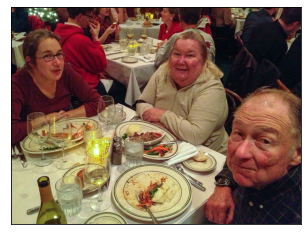

a group of friends sitting down at a table sharing a meal
एक मेज पर बैठा बैठे दोस्तों का समूह भोजन साझा करना


In [56]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread(string)
imgplot = plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.show()
print(english_captions[0])
print(hindi_captions[0])

In [36]:
print("English caption : ", english_captions[0])
print("Hindi caption   : ", hindi_captions[0])

English caption :  a group of friends sitting down at a table sharing a meal
Hindi caption   :  एक मेज पर बैठा बैठे दोस्तों का समूह भोजन साझा करना


In [18]:
print(images[-5]['sentences'])

[{'tokens': ['a', 'group', 'of', 'friends', 'sitting', 'down', 'at', 'a', 'table', 'sharing', 'a', 'meal'], 'raw': 'A group of friends sitting down at a table sharing a meal.', 'imgid': 123282, 'sentid': 104057}, {'tokens': ['a', 'group', 'of', 'people', 'sitting', 'at', 'a', 'restaurant', 'table'], 'raw': 'A group of people sitting at a restaurant table', 'imgid': 123282, 'sentid': 106946}, {'tokens': ['the', 'three', 'people', 'smile', 'as', 'they', 'finish', 'a', 'dinner', 'together'], 'raw': 'The three people smile as they finish a dinner together.', 'imgid': 123282, 'sentid': 118793}, {'tokens': ['a', 'group', 'of', 'people', 'smile', 'at', 'the', 'camera', 'during', 'a', 'meal'], 'raw': 'A group of people smile at the camera during a meal.', 'imgid': 123282, 'sentid': 143282}, {'tokens': ['a', 'jovial', 'older', 'couple', 'and', 'a', 'young', 'woman', 'enjoy', 'a', 'festive', 'restaurant', 'meal'], 'raw': ' A jovial older couple and a young woman enjoy a festive restaurant meal.'

In [19]:
print(images[-5]['sentence_hindi'])

[{'tokens': ['एक', 'मेज', 'पर', 'बैठा', 'बैठे', 'दोस्तों', 'का', 'समूह', 'भोजन', 'साझा', 'करना']}, {'tokens': ['रेस्तरां', 'टेबल', 'पर', 'बैठे', 'लोगों', 'का', 'एक', 'समूह']}, {'tokens': ['तीन', 'लोग', 'मुस्कुराते', 'हुए', 'कहते', 'हैं', 'कि', 'वे', 'एक', 'रात', 'के', 'भोजन', 'के', 'साथ', 'मिलते', 'हैं', '।']}, {'tokens': ['भोजन', 'के', 'दौरान', 'लोगों', 'का', 'एक', 'समूह', 'कैमरा', 'पर', 'मुस्कुराता', 'है']}, {'tokens': ['एक', 'उत्साही', 'बूढ़े', 'जोड़े', 'और', 'एक', 'युवा', 'महिला', 'उत्सव', 'के', 'रेस्तरां', 'भोजन', 'का', 'आनंद', 'लेती', 'हैं', '।']}]
